<h1 align="center">TensorFlow Neural Network Lab</h1>

<img src="image/notmnist.png">
In this lab, you'll use all the tools you learned from *Introduction to TensorFlow* to label images of English letters! The data you are using, <a href="http://yaroslavvb.blogspot.com/2011/09/notmnist-dataset.html">notMNIST</a>, consists of images of a letter from A to J in differents font.

The above images are a few examples of the data you'll be training on. After training the network, you will compare your prediction model against test data. Your goal, by the end of this lab, is to make predictions against that test set with at least an 80% accuracy. Let's jump in!

To start this lab, you first need to import all the necessary modules. Run the code below. If it runs successfully, it will print "`All modules imported`".

In [1]:
import hashlib
import os
import pickle
from urllib.request import urlretrieve

import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.utils import resample
from tqdm import tqdm
from zipfile import ZipFile

print('All modules imported.')

All modules imported.


The notMNIST dataset is too large for many computers to handle.  It contains 500,000 images for just training.  You'll be using a subset of this data, 15,000 images for each label (A-J).

In [3]:
def download(url, file):
    """
    Download file from <url>
    :param url: URL to file
    :param file: Local file path
    """
    if not os.path.isfile(file):
        print('Downloading ' + file + '...')
        urlretrieve(url, file)
        print('Download Finished')

# Download the training and test dataset.
download('https://s3.amazonaws.com/udacity-sdc/notMNIST_train.zip', 'notMNIST_train.zip')
download('https://s3.amazonaws.com/udacity-sdc/notMNIST_test.zip', 'notMNIST_test.zip')

# Make sure the files aren't corrupted
assert hashlib.md5(open('notMNIST_train.zip', 'rb').read()).hexdigest() == 'c8673b3f28f489e9cdf3a3d74e2ac8fa',\
        'notMNIST_train.zip file is corrupted.  Remove the file and try again.'
assert hashlib.md5(open('notMNIST_test.zip', 'rb').read()).hexdigest() == '5d3c7e653e63471c88df796156a9dfa9',\
        'notMNIST_test.zip file is corrupted.  Remove the file and try again.'

# Wait until you see that all files have been downloaded.
print('All files downloaded.')

All files downloaded.


In [8]:
def uncompress_features_labels(file):
    """
    Uncompress features and labels from a zip file
    :param file: The zip file to extract the data from
    """
    features = []
    labels = []

    with ZipFile(file) as zipf:
        # Progress Bar
        filenames_pbar = tqdm(zipf.namelist(), unit='files')
        
        # Get features and labels from all files
        for filename in filenames_pbar:
            # Check if the file is a directory
            if not filename.endswith('/'):
                with zipf.open(filename) as image_file:
                    image = Image.open(image_file)
                    image.load()
                    # Load image data as 1 dimensional array
                    # We're using float32 to save on memory space
                    feature = np.array(image, dtype=np.float32).flatten()

                # Get the the letter from the filename.  This is the letter of the image.
                label = os.path.split(filename)[1][0]

                features.append(feature)
                labels.append(label)
                print("filename: {}, label: {}".format(filename, label))
    return np.array(features), np.array(labels)

# Get the features and labels from the zip files
train_features, train_labels = uncompress_features_labels('notMNIST_train.zip')
test_features, test_labels = uncompress_features_labels('notMNIST_test.zip')

# Limit the amount of data to work with a docker container
docker_size_limit = 150000
train_features, train_labels = resample(train_features, train_labels, n_samples=docker_size_limit)

# Set flags for feature engineering.  This will prevent you from skipping an important step.
is_features_normal = False
is_labels_encod = False

# Wait until you see that all features and labels have been uncompressed.
print('All features and labels uncompressed.')

  0%|          | 499/210001 [00:00<01:24, 2475.02files/s]

filename: notMNIST_train/A0.png, label: A
filename: notMNIST_train/A1.png, label: A
filename: notMNIST_train/A10.png, label: A
filename: notMNIST_train/A100.png, label: A
filename: notMNIST_train/A1000.png, label: A
filename: notMNIST_train/A10000.png, label: A
filename: notMNIST_train/A10001.png, label: A
filename: notMNIST_train/A10002.png, label: A
filename: notMNIST_train/A10003.png, label: A
filename: notMNIST_train/A10004.png, label: A
filename: notMNIST_train/A10005.png, label: A
filename: notMNIST_train/A10006.png, label: A
filename: notMNIST_train/A10007.png, label: A
filename: notMNIST_train/A10008.png, label: A
filename: notMNIST_train/A10009.png, label: A
filename: notMNIST_train/A1001.png, label: A
filename: notMNIST_train/A10010.png, label: A
filename: notMNIST_train/A10011.png, label: A
filename: notMNIST_train/A10012.png, label: A
filename: notMNIST_train/A10013.png, label: A
filename: notMNIST_train/A10014.png, label: A
filename: notMNIST_train/A10015.png, label: A
fil

  0%|          | 991/210001 [00:00<01:24, 2469.06files/s]


filename: notMNIST_train/A10453.png, label: A
filename: notMNIST_train/A10454.png, label: A
filename: notMNIST_train/A10455.png, label: A
filename: notMNIST_train/A10456.png, label: A
filename: notMNIST_train/A10457.png, label: A
filename: notMNIST_train/A10458.png, label: A
filename: notMNIST_train/A10459.png, label: A
filename: notMNIST_train/A1046.png, label: A
filename: notMNIST_train/A10460.png, label: A
filename: notMNIST_train/A10461.png, label: A
filename: notMNIST_train/A10462.png, label: A
filename: notMNIST_train/A10463.png, label: A
filename: notMNIST_train/A10464.png, label: A
filename: notMNIST_train/A10465.png, label: A
filename: notMNIST_train/A10466.png, label: A
filename: notMNIST_train/A10467.png, label: A
filename: notMNIST_train/A10468.png, label: A
filename: notMNIST_train/A10469.png, label: A
filename: notMNIST_train/A1047.png, label: A
filename: notMNIST_train/A10470.png, label: A
filename: notMNIST_train/A10471.png, label: A
filename: notMNIST_train/A10472.png

  1%|          | 1488/210001 [00:00<01:24, 2480.29files/s]

filename: notMNIST_train/A10906.png, label: A
filename: notMNIST_train/A10907.png, label: A
filename: notMNIST_train/A10908.png, label: A
filename: notMNIST_train/A10909.png, label: A
filename: notMNIST_train/A1091.png, label: A
filename: notMNIST_train/A10910.png, label: A
filename: notMNIST_train/A10911.png, label: A
filename: notMNIST_train/A10912.png, label: A
filename: notMNIST_train/A10913.png, label: A
filename: notMNIST_train/A10914.png, label: A
filename: notMNIST_train/A10915.png, label: A
filename: notMNIST_train/A10916.png, label: A
filename: notMNIST_train/A10917.png, label: A
filename: notMNIST_train/A10918.png, label: A
filename: notMNIST_train/A10919.png, label: A
filename: notMNIST_train/A1092.png, label: A
filename: notMNIST_train/A10920.png, label: A
filename: notMNIST_train/A10921.png, label: A
filename: notMNIST_train/A10922.png, label: A
filename: notMNIST_train/A10923.png, label: A
filename: notMNIST_train/A10924.png, label: A
filename: notMNIST_train/A10925.png,

  1%|          | 1993/210001 [00:00<01:23, 2504.30files/s]


filename: notMNIST_train/A11363.png, label: A
filename: notMNIST_train/A11364.png, label: A
filename: notMNIST_train/A11365.png, label: A
filename: notMNIST_train/A11366.png, label: A
filename: notMNIST_train/A11367.png, label: A
filename: notMNIST_train/A11368.png, label: A
filename: notMNIST_train/A11369.png, label: A
filename: notMNIST_train/A1137.png, label: A
filename: notMNIST_train/A11370.png, label: A
filename: notMNIST_train/A11371.png, label: A
filename: notMNIST_train/A11372.png, label: A
filename: notMNIST_train/A11373.png, label: A
filename: notMNIST_train/A11374.png, label: A
filename: notMNIST_train/A11375.png, label: A
filename: notMNIST_train/A11376.png, label: A
filename: notMNIST_train/A11377.png, label: A
filename: notMNIST_train/A11378.png, label: A
filename: notMNIST_train/A11379.png, label: A
filename: notMNIST_train/A1138.png, label: A
filename: notMNIST_train/A11380.png, label: A
filename: notMNIST_train/A11381.png, label: A
filename: notMNIST_train/A11382.png

  1%|          | 2488/210001 [00:01<01:23, 2487.86files/s]


filename: notMNIST_train/A11826.png, label: A
filename: notMNIST_train/A11827.png, label: A
filename: notMNIST_train/A11828.png, label: A
filename: notMNIST_train/A11829.png, label: A
filename: notMNIST_train/A1183.png, label: A
filename: notMNIST_train/A11830.png, label: A
filename: notMNIST_train/A11831.png, label: A
filename: notMNIST_train/A11832.png, label: A
filename: notMNIST_train/A11833.png, label: A
filename: notMNIST_train/A11834.png, label: A
filename: notMNIST_train/A11835.png, label: A
filename: notMNIST_train/A11836.png, label: A
filename: notMNIST_train/A11837.png, label: A
filename: notMNIST_train/A11838.png, label: A
filename: notMNIST_train/A11839.png, label: A
filename: notMNIST_train/A1184.png, label: A
filename: notMNIST_train/A11840.png, label: A
filename: notMNIST_train/A11841.png, label: A
filename: notMNIST_train/A11842.png, label: A
filename: notMNIST_train/A11843.png, label: A
filename: notMNIST_train/A11844.png, label: A
filename: notMNIST_train/A11845.png

  1%|▏         | 2988/210001 [00:01<01:22, 2494.52files/s]


filename: notMNIST_train/A12280.png, label: A
filename: notMNIST_train/A12281.png, label: A
filename: notMNIST_train/A12282.png, label: A
filename: notMNIST_train/A12283.png, label: A
filename: notMNIST_train/A12284.png, label: A
filename: notMNIST_train/A12285.png, label: A
filename: notMNIST_train/A12286.png, label: A
filename: notMNIST_train/A12287.png, label: A
filename: notMNIST_train/A12288.png, label: A
filename: notMNIST_train/A12289.png, label: A
filename: notMNIST_train/A1229.png, label: A
filename: notMNIST_train/A12290.png, label: A
filename: notMNIST_train/A12291.png, label: A
filename: notMNIST_train/A12292.png, label: A
filename: notMNIST_train/A12293.png, label: A
filename: notMNIST_train/A12294.png, label: A
filename: notMNIST_train/A12295.png, label: A
filename: notMNIST_train/A12296.png, label: A
filename: notMNIST_train/A12297.png, label: A
filename: notMNIST_train/A12298.png, label: A
filename: notMNIST_train/A12299.png, label: A
filename: notMNIST_train/A123.png,

  2%|▏         | 3491/210001 [00:01<01:22, 2498.51files/s]


filename: notMNIST_train/A12739.png, label: A
filename: notMNIST_train/A1274.png, label: A
filename: notMNIST_train/A12740.png, label: A
filename: notMNIST_train/A12741.png, label: A
filename: notMNIST_train/A12742.png, label: A
filename: notMNIST_train/A12743.png, label: A
filename: notMNIST_train/A12744.png, label: A
filename: notMNIST_train/A12745.png, label: A
filename: notMNIST_train/A12746.png, label: A
filename: notMNIST_train/A12747.png, label: A
filename: notMNIST_train/A12748.png, label: A
filename: notMNIST_train/A12749.png, label: A
filename: notMNIST_train/A1275.png, label: A
filename: notMNIST_train/A12750.png, label: A
filename: notMNIST_train/A12751.png, label: A
filename: notMNIST_train/A12752.png, label: A
filename: notMNIST_train/A12753.png, label: A
filename: notMNIST_train/A12754.png, label: A
filename: notMNIST_train/A12755.png, label: A
filename: notMNIST_train/A12756.png, label: A
filename: notMNIST_train/A12757.png, label: A
filename: notMNIST_train/A12758.png

  2%|▏         | 3998/210001 [00:01<01:21, 2512.33files/s]


filename: notMNIST_train/A13198.png, label: A
filename: notMNIST_train/A13199.png, label: A
filename: notMNIST_train/A132.png, label: A
filename: notMNIST_train/A1320.png, label: A
filename: notMNIST_train/A13200.png, label: A
filename: notMNIST_train/A13201.png, label: A
filename: notMNIST_train/A13202.png, label: A
filename: notMNIST_train/A13203.png, label: A
filename: notMNIST_train/A13204.png, label: A
filename: notMNIST_train/A13205.png, label: A
filename: notMNIST_train/A13206.png, label: A
filename: notMNIST_train/A13207.png, label: A
filename: notMNIST_train/A13208.png, label: A
filename: notMNIST_train/A13209.png, label: A
filename: notMNIST_train/A1321.png, label: A
filename: notMNIST_train/A13210.png, label: A
filename: notMNIST_train/A13211.png, label: A
filename: notMNIST_train/A13212.png, label: A
filename: notMNIST_train/A13213.png, label: A
filename: notMNIST_train/A13214.png, label: A
filename: notMNIST_train/A13215.png, label: A
filename: notMNIST_train/A13216.png, 

  2%|▏         | 4508/210001 [00:01<01:21, 2519.96files/s]


filename: notMNIST_train/A13660.png, label: A
filename: notMNIST_train/A13661.png, label: A
filename: notMNIST_train/A13662.png, label: A
filename: notMNIST_train/A13663.png, label: A
filename: notMNIST_train/A13664.png, label: A
filename: notMNIST_train/A13665.png, label: A
filename: notMNIST_train/A13666.png, label: A
filename: notMNIST_train/A13667.png, label: A
filename: notMNIST_train/A13668.png, label: A
filename: notMNIST_train/A13669.png, label: A
filename: notMNIST_train/A1367.png, label: A
filename: notMNIST_train/A13670.png, label: A
filename: notMNIST_train/A13671.png, label: A
filename: notMNIST_train/A13672.png, label: A
filename: notMNIST_train/A13673.png, label: A
filename: notMNIST_train/A13674.png, label: A
filename: notMNIST_train/A13675.png, label: A
filename: notMNIST_train/A13676.png, label: A
filename: notMNIST_train/A13677.png, label: A
filename: notMNIST_train/A13678.png, label: A
filename: notMNIST_train/A13679.png, label: A
filename: notMNIST_train/A1368.png

  2%|▏         | 5013/210001 [00:02<01:22, 2495.36files/s]


filename: notMNIST_train/A14120.png, label: A
filename: notMNIST_train/A14121.png, label: A
filename: notMNIST_train/A14122.png, label: A
filename: notMNIST_train/A14123.png, label: A
filename: notMNIST_train/A14124.png, label: A
filename: notMNIST_train/A14125.png, label: A
filename: notMNIST_train/A14126.png, label: A
filename: notMNIST_train/A14127.png, label: A
filename: notMNIST_train/A14128.png, label: A
filename: notMNIST_train/A14129.png, label: A
filename: notMNIST_train/A1413.png, label: A
filename: notMNIST_train/A14130.png, label: A
filename: notMNIST_train/A14131.png, label: A
filename: notMNIST_train/A14132.png, label: A
filename: notMNIST_train/A14133.png, label: A
filename: notMNIST_train/A14134.png, label: A
filename: notMNIST_train/A14135.png, label: A
filename: notMNIST_train/A14136.png, label: A
filename: notMNIST_train/A14137.png, label: A
filename: notMNIST_train/A14138.png, label: A
filename: notMNIST_train/A14139.png, label: A
filename: notMNIST_train/A1414.png

  3%|▎         | 5516/210001 [00:02<01:22, 2489.67files/s]


filename: notMNIST_train/A14573.png, label: A
filename: notMNIST_train/A14574.png, label: A
filename: notMNIST_train/A14575.png, label: A
filename: notMNIST_train/A14576.png, label: A
filename: notMNIST_train/A14577.png, label: A
filename: notMNIST_train/A14578.png, label: A
filename: notMNIST_train/A14579.png, label: A
filename: notMNIST_train/A1458.png, label: A
filename: notMNIST_train/A14580.png, label: A
filename: notMNIST_train/A14581.png, label: A
filename: notMNIST_train/A14582.png, label: A
filename: notMNIST_train/A14583.png, label: A
filename: notMNIST_train/A14584.png, label: A
filename: notMNIST_train/A14585.png, label: A
filename: notMNIST_train/A14586.png, label: A
filename: notMNIST_train/A14587.png, label: A
filename: notMNIST_train/A14588.png, label: A
filename: notMNIST_train/A14589.png, label: A
filename: notMNIST_train/A1459.png, label: A
filename: notMNIST_train/A14590.png, label: A
filename: notMNIST_train/A14591.png, label: A
filename: notMNIST_train/A14592.png

  3%|▎         | 6013/210001 [00:02<01:22, 2464.22files/s]


filename: notMNIST_train/A15025.png, label: A
filename: notMNIST_train/A15026.png, label: A
filename: notMNIST_train/A15027.png, label: A
filename: notMNIST_train/A15028.png, label: A
filename: notMNIST_train/A15029.png, label: A
filename: notMNIST_train/A1503.png, label: A
filename: notMNIST_train/A15030.png, label: A
filename: notMNIST_train/A15031.png, label: A
filename: notMNIST_train/A15032.png, label: A
filename: notMNIST_train/A15033.png, label: A
filename: notMNIST_train/A15034.png, label: A
filename: notMNIST_train/A15035.png, label: A
filename: notMNIST_train/A15036.png, label: A
filename: notMNIST_train/A15037.png, label: A
filename: notMNIST_train/A15038.png, label: A
filename: notMNIST_train/A15039.png, label: A
filename: notMNIST_train/A1504.png, label: A
filename: notMNIST_train/A15040.png, label: A
filename: notMNIST_train/A15041.png, label: A
filename: notMNIST_train/A15042.png, label: A
filename: notMNIST_train/A15043.png, label: A
filename: notMNIST_train/A15044.png

  3%|▎         | 6517/210001 [00:02<01:21, 2484.39files/s]


filename: notMNIST_train/A15476.png, label: A
filename: notMNIST_train/A15477.png, label: A
filename: notMNIST_train/A15478.png, label: A
filename: notMNIST_train/A15479.png, label: A
filename: notMNIST_train/A1548.png, label: A
filename: notMNIST_train/A15480.png, label: A
filename: notMNIST_train/A15481.png, label: A
filename: notMNIST_train/A15482.png, label: A
filename: notMNIST_train/A15483.png, label: A
filename: notMNIST_train/A15484.png, label: A
filename: notMNIST_train/A15485.png, label: A
filename: notMNIST_train/A15486.png, label: A
filename: notMNIST_train/A15487.png, label: A
filename: notMNIST_train/A15488.png, label: A
filename: notMNIST_train/A15489.png, label: A
filename: notMNIST_train/A1549.png, label: A
filename: notMNIST_train/A15490.png, label: A
filename: notMNIST_train/A15491.png, label: A
filename: notMNIST_train/A15492.png, label: A
filename: notMNIST_train/A15493.png, label: A
filename: notMNIST_train/A15494.png, label: A
filename: notMNIST_train/A15495.png

  3%|▎         | 7019/210001 [00:02<01:21, 2487.09files/s]


filename: notMNIST_train/A15935.png, label: A
filename: notMNIST_train/A15936.png, label: A
filename: notMNIST_train/A15937.png, label: A
filename: notMNIST_train/A15938.png, label: A
filename: notMNIST_train/A15939.png, label: A
filename: notMNIST_train/A1594.png, label: A
filename: notMNIST_train/A15940.png, label: A
filename: notMNIST_train/A15941.png, label: A
filename: notMNIST_train/A15942.png, label: A
filename: notMNIST_train/A15943.png, label: A
filename: notMNIST_train/A15944.png, label: A
filename: notMNIST_train/A15945.png, label: A
filename: notMNIST_train/A15946.png, label: A
filename: notMNIST_train/A15947.png, label: A
filename: notMNIST_train/A15948.png, label: A
filename: notMNIST_train/A15949.png, label: A
filename: notMNIST_train/A1595.png, label: A
filename: notMNIST_train/A15950.png, label: A
filename: notMNIST_train/A15951.png, label: A
filename: notMNIST_train/A15952.png, label: A
filename: notMNIST_train/A15953.png, label: A
filename: notMNIST_train/A15954.png

  4%|▎         | 7521/210001 [00:03<01:21, 2486.11files/s]


filename: notMNIST_train/A16390.png, label: A
filename: notMNIST_train/A16391.png, label: A
filename: notMNIST_train/A16392.png, label: A
filename: notMNIST_train/A16393.png, label: A
filename: notMNIST_train/A16394.png, label: A
filename: notMNIST_train/A16395.png, label: A
filename: notMNIST_train/A16396.png, label: A
filename: notMNIST_train/A16397.png, label: A
filename: notMNIST_train/A16398.png, label: A
filename: notMNIST_train/A16399.png, label: A
filename: notMNIST_train/A164.png, label: A
filename: notMNIST_train/A1640.png, label: A
filename: notMNIST_train/A16400.png, label: A
filename: notMNIST_train/A16401.png, label: A
filename: notMNIST_train/A16402.png, label: A
filename: notMNIST_train/A16403.png, label: A
filename: notMNIST_train/A16404.png, label: A
filename: notMNIST_train/A16405.png, label: A
filename: notMNIST_train/A16406.png, label: A
filename: notMNIST_train/A16407.png, label: A
filename: notMNIST_train/A16408.png, label: A
filename: notMNIST_train/A16409.png,

  4%|▍         | 8025/210001 [00:03<01:20, 2497.89files/s]


filename: notMNIST_train/A16847.png, label: A
filename: notMNIST_train/A16848.png, label: A
filename: notMNIST_train/A16849.png, label: A
filename: notMNIST_train/A1685.png, label: A
filename: notMNIST_train/A16850.png, label: A
filename: notMNIST_train/A16851.png, label: A
filename: notMNIST_train/A16852.png, label: A
filename: notMNIST_train/A16853.png, label: A
filename: notMNIST_train/A16854.png, label: A
filename: notMNIST_train/A16855.png, label: A
filename: notMNIST_train/A16856.png, label: A
filename: notMNIST_train/A16857.png, label: A
filename: notMNIST_train/A16858.png, label: A
filename: notMNIST_train/A16859.png, label: A
filename: notMNIST_train/A1686.png, label: A
filename: notMNIST_train/A16860.png, label: A
filename: notMNIST_train/A16861.png, label: A
filename: notMNIST_train/A16862.png, label: A
filename: notMNIST_train/A16863.png, label: A
filename: notMNIST_train/A16864.png, label: A
filename: notMNIST_train/A16865.png, label: A
filename: notMNIST_train/A16866.png

  4%|▍         | 8532/210001 [00:03<01:20, 2498.27files/s]


filename: notMNIST_train/A17304.png, label: A
filename: notMNIST_train/A17305.png, label: A
filename: notMNIST_train/A17306.png, label: A
filename: notMNIST_train/A17307.png, label: A
filename: notMNIST_train/A17308.png, label: A
filename: notMNIST_train/A17309.png, label: A
filename: notMNIST_train/A1731.png, label: A
filename: notMNIST_train/A17310.png, label: A
filename: notMNIST_train/A17311.png, label: A
filename: notMNIST_train/A17312.png, label: A
filename: notMNIST_train/A17313.png, label: A
filename: notMNIST_train/A17314.png, label: A
filename: notMNIST_train/A17315.png, label: A
filename: notMNIST_train/A17316.png, label: A
filename: notMNIST_train/A17317.png, label: A
filename: notMNIST_train/A17318.png, label: A
filename: notMNIST_train/A17319.png, label: A
filename: notMNIST_train/A1732.png, label: A
filename: notMNIST_train/A17320.png, label: A
filename: notMNIST_train/A17321.png, label: A
filename: notMNIST_train/A17322.png, label: A
filename: notMNIST_train/A17323.png

  4%|▍         | 9038/210001 [00:03<01:20, 2505.66files/s]


filename: notMNIST_train/A17763.png, label: A
filename: notMNIST_train/A17764.png, label: A
filename: notMNIST_train/A17765.png, label: A
filename: notMNIST_train/A17766.png, label: A
filename: notMNIST_train/A17767.png, label: A
filename: notMNIST_train/A17768.png, label: A
filename: notMNIST_train/A17769.png, label: A
filename: notMNIST_train/A1777.png, label: A
filename: notMNIST_train/A17770.png, label: A
filename: notMNIST_train/A17771.png, label: A
filename: notMNIST_train/A17772.png, label: A
filename: notMNIST_train/A17773.png, label: A
filename: notMNIST_train/A17774.png, label: A
filename: notMNIST_train/A17775.png, label: A
filename: notMNIST_train/A17776.png, label: A
filename: notMNIST_train/A17777.png, label: A
filename: notMNIST_train/A17778.png, label: A
filename: notMNIST_train/A17779.png, label: A
filename: notMNIST_train/A1778.png, label: A
filename: notMNIST_train/A17780.png, label: A
filename: notMNIST_train/A17781.png, label: A
filename: notMNIST_train/A17782.png

  5%|▍         | 9546/210001 [00:03<01:20, 2505.49files/s]


filename: notMNIST_train/A18221.png, label: A
filename: notMNIST_train/A18222.png, label: A
filename: notMNIST_train/A18223.png, label: A
filename: notMNIST_train/A18224.png, label: A
filename: notMNIST_train/A18225.png, label: A
filename: notMNIST_train/A18226.png, label: A
filename: notMNIST_train/A18227.png, label: A
filename: notMNIST_train/A18228.png, label: A
filename: notMNIST_train/A18229.png, label: A
filename: notMNIST_train/A1823.png, label: A
filename: notMNIST_train/A18230.png, label: A
filename: notMNIST_train/A18231.png, label: A
filename: notMNIST_train/A18232.png, label: A
filename: notMNIST_train/A18233.png, label: A
filename: notMNIST_train/A18234.png, label: A
filename: notMNIST_train/A18235.png, label: A
filename: notMNIST_train/A18236.png, label: A
filename: notMNIST_train/A18237.png, label: A
filename: notMNIST_train/A18238.png, label: A
filename: notMNIST_train/A18239.png, label: A
filename: notMNIST_train/A1824.png, label: A
filename: notMNIST_train/A18240.png

  5%|▍         | 10055/210001 [00:04<01:19, 2511.92files/s]

filename: notMNIST_train/A18681.png, label: A
filename: notMNIST_train/A18682.png, label: A
filename: notMNIST_train/A18683.png, label: A
filename: notMNIST_train/A18684.png, label: A
filename: notMNIST_train/A18685.png, label: A
filename: notMNIST_train/A18686.png, label: A
filename: notMNIST_train/A18687.png, label: A
filename: notMNIST_train/A18688.png, label: A
filename: notMNIST_train/A18689.png, label: A
filename: notMNIST_train/A1869.png, label: A
filename: notMNIST_train/A18690.png, label: A
filename: notMNIST_train/A18691.png, label: A
filename: notMNIST_train/A18692.png, label: A
filename: notMNIST_train/A18693.png, label: A
filename: notMNIST_train/A18694.png, label: A
filename: notMNIST_train/A18695.png, label: A
filename: notMNIST_train/A18696.png, label: A
filename: notMNIST_train/A18697.png, label: A
filename: notMNIST_train/A18698.png, label: A
filename: notMNIST_train/A18699.png, label: A
filename: notMNIST_train/A187.png, label: A
filename: notMNIST_train/A1870.png, l

  5%|▌         | 10563/210001 [00:04<01:19, 2512.57files/s]


filename: notMNIST_train/A19141.png, label: A
filename: notMNIST_train/A19142.png, label: A
filename: notMNIST_train/A19143.png, label: A
filename: notMNIST_train/A19144.png, label: A
filename: notMNIST_train/A19145.png, label: A
filename: notMNIST_train/A19146.png, label: A
filename: notMNIST_train/A19147.png, label: A
filename: notMNIST_train/A19148.png, label: A
filename: notMNIST_train/A19149.png, label: A
filename: notMNIST_train/A1915.png, label: A
filename: notMNIST_train/A19150.png, label: A
filename: notMNIST_train/A19151.png, label: A
filename: notMNIST_train/A19152.png, label: A
filename: notMNIST_train/A19153.png, label: A
filename: notMNIST_train/A19154.png, label: A
filename: notMNIST_train/A19155.png, label: A
filename: notMNIST_train/A19156.png, label: A
filename: notMNIST_train/A19157.png, label: A
filename: notMNIST_train/A19158.png, label: A
filename: notMNIST_train/A19159.png, label: A
filename: notMNIST_train/A1916.png, label: A
filename: notMNIST_train/A19160.png

  5%|▌         | 11072/210001 [00:04<01:19, 2514.49files/s]

filename: notMNIST_train/A19602.png, label: A
filename: notMNIST_train/A19603.png, label: A
filename: notMNIST_train/A19604.png, label: A
filename: notMNIST_train/A19605.png, label: A
filename: notMNIST_train/A19606.png, label: A
filename: notMNIST_train/A19607.png, label: A
filename: notMNIST_train/A19608.png, label: A
filename: notMNIST_train/A19609.png, label: A
filename: notMNIST_train/A1961.png, label: A
filename: notMNIST_train/A19610.png, label: A
filename: notMNIST_train/A19611.png, label: A
filename: notMNIST_train/A19612.png, label: A
filename: notMNIST_train/A19613.png, label: A
filename: notMNIST_train/A19614.png, label: A
filename: notMNIST_train/A19615.png, label: A
filename: notMNIST_train/A19616.png, label: A
filename: notMNIST_train/A19617.png, label: A
filename: notMNIST_train/A19618.png, label: A
filename: notMNIST_train/A19619.png, label: A
filename: notMNIST_train/A1962.png, label: A
filename: notMNIST_train/A19620.png, label: A
filename: notMNIST_train/A19621.png,

  6%|▌         | 11584/210001 [00:04<01:18, 2525.81files/s]


filename: notMNIST_train/A20060.png, label: A
filename: notMNIST_train/A20061.png, label: A
filename: notMNIST_train/A20062.png, label: A
filename: notMNIST_train/A20063.png, label: A
filename: notMNIST_train/A20064.png, label: A
filename: notMNIST_train/A20065.png, label: A
filename: notMNIST_train/A20066.png, label: A
filename: notMNIST_train/A20067.png, label: A
filename: notMNIST_train/A20068.png, label: A
filename: notMNIST_train/A20069.png, label: A
filename: notMNIST_train/A2007.png, label: A
filename: notMNIST_train/A20070.png, label: A
filename: notMNIST_train/A20071.png, label: A
filename: notMNIST_train/A20072.png, label: A
filename: notMNIST_train/A20073.png, label: A
filename: notMNIST_train/A20074.png, label: A
filename: notMNIST_train/A20075.png, label: A
filename: notMNIST_train/A20076.png, label: A
filename: notMNIST_train/A20077.png, label: A
filename: notMNIST_train/A20078.png, label: A
filename: notMNIST_train/A20079.png, label: A
filename: notMNIST_train/A2008.png

  6%|▌         | 12094/210001 [00:04<01:18, 2520.90files/s]


filename: notMNIST_train/A20527.png, label: A
filename: notMNIST_train/A20528.png, label: A
filename: notMNIST_train/A20529.png, label: A
filename: notMNIST_train/A2053.png, label: A
filename: notMNIST_train/A20530.png, label: A
filename: notMNIST_train/A20531.png, label: A
filename: notMNIST_train/A20532.png, label: A
filename: notMNIST_train/A20533.png, label: A
filename: notMNIST_train/A20534.png, label: A
filename: notMNIST_train/A20535.png, label: A
filename: notMNIST_train/A20536.png, label: A
filename: notMNIST_train/A20537.png, label: A
filename: notMNIST_train/A20538.png, label: A
filename: notMNIST_train/A20539.png, label: A
filename: notMNIST_train/A2054.png, label: A
filename: notMNIST_train/A20540.png, label: A
filename: notMNIST_train/A20541.png, label: A
filename: notMNIST_train/A20542.png, label: A
filename: notMNIST_train/A20543.png, label: A
filename: notMNIST_train/A20544.png, label: A
filename: notMNIST_train/A20545.png, label: A
filename: notMNIST_train/A20546.png

  6%|▌         | 12604/210001 [00:05<01:18, 2516.02files/s]

filename: notMNIST_train/A20987.png, label: A
filename: notMNIST_train/A20988.png, label: A
filename: notMNIST_train/A20989.png, label: A
filename: notMNIST_train/A2099.png, label: A
filename: notMNIST_train/A20990.png, label: A
filename: notMNIST_train/A20991.png, label: A
filename: notMNIST_train/A20992.png, label: A
filename: notMNIST_train/A20993.png, label: A
filename: notMNIST_train/A20994.png, label: A
filename: notMNIST_train/A20995.png, label: A
filename: notMNIST_train/A20996.png, label: A
filename: notMNIST_train/A20997.png, label: A
filename: notMNIST_train/A20998.png, label: A
filename: notMNIST_train/A20999.png, label: A
filename: notMNIST_train/A21.png, label: A
filename: notMNIST_train/A210.png, label: A
filename: notMNIST_train/A2100.png, label: A
filename: notMNIST_train/A2101.png, label: A
filename: notMNIST_train/A2102.png, label: A
filename: notMNIST_train/A2103.png, label: A
filename: notMNIST_train/A2104.png, label: A
filename: notMNIST_train/A2105.png, label: A


  6%|▌         | 13112/210001 [00:05<01:18, 2515.37files/s]


filename: notMNIST_train/A2548.png, label: A
filename: notMNIST_train/A2549.png, label: A
filename: notMNIST_train/A255.png, label: A
filename: notMNIST_train/A2550.png, label: A
filename: notMNIST_train/A2551.png, label: A
filename: notMNIST_train/A2552.png, label: A
filename: notMNIST_train/A2553.png, label: A
filename: notMNIST_train/A2554.png, label: A
filename: notMNIST_train/A2555.png, label: A
filename: notMNIST_train/A2556.png, label: A
filename: notMNIST_train/A2557.png, label: A
filename: notMNIST_train/A2558.png, label: A
filename: notMNIST_train/A2559.png, label: A
filename: notMNIST_train/A256.png, label: A
filename: notMNIST_train/A2560.png, label: A
filename: notMNIST_train/A2561.png, label: A
filename: notMNIST_train/A2562.png, label: A
filename: notMNIST_train/A2563.png, label: A
filename: notMNIST_train/A2564.png, label: A
filename: notMNIST_train/A2565.png, label: A
filename: notMNIST_train/A2566.png, label: A
filename: notMNIST_train/A2567.png, label: A
filename: n

  6%|▋         | 13620/210001 [00:05<01:18, 2501.79files/s]


filename: notMNIST_train/A3008.png, label: A
filename: notMNIST_train/A3009.png, label: A
filename: notMNIST_train/A301.png, label: A
filename: notMNIST_train/A3010.png, label: A
filename: notMNIST_train/A3011.png, label: A
filename: notMNIST_train/A3012.png, label: A
filename: notMNIST_train/A3013.png, label: A
filename: notMNIST_train/A3014.png, label: A
filename: notMNIST_train/A3015.png, label: A
filename: notMNIST_train/A3016.png, label: A
filename: notMNIST_train/A3017.png, label: A
filename: notMNIST_train/A3018.png, label: A
filename: notMNIST_train/A3019.png, label: A
filename: notMNIST_train/A302.png, label: A
filename: notMNIST_train/A3020.png, label: A
filename: notMNIST_train/A3021.png, label: A
filename: notMNIST_train/A3022.png, label: A
filename: notMNIST_train/A3023.png, label: A
filename: notMNIST_train/A3024.png, label: A
filename: notMNIST_train/A3025.png, label: A
filename: notMNIST_train/A3026.png, label: A
filename: notMNIST_train/A3027.png, label: A
filename: n

  7%|▋         | 14129/210001 [00:05<01:17, 2514.06files/s]


filename: notMNIST_train/A3462.png, label: A
filename: notMNIST_train/A3463.png, label: A
filename: notMNIST_train/A3464.png, label: A
filename: notMNIST_train/A3465.png, label: A
filename: notMNIST_train/A3466.png, label: A
filename: notMNIST_train/A3467.png, label: A
filename: notMNIST_train/A3468.png, label: A
filename: notMNIST_train/A3469.png, label: A
filename: notMNIST_train/A347.png, label: A
filename: notMNIST_train/A3470.png, label: A
filename: notMNIST_train/A3471.png, label: A
filename: notMNIST_train/A3472.png, label: A
filename: notMNIST_train/A3473.png, label: A
filename: notMNIST_train/A3474.png, label: A
filename: notMNIST_train/A3475.png, label: A
filename: notMNIST_train/A3476.png, label: A
filename: notMNIST_train/A3477.png, label: A
filename: notMNIST_train/A3478.png, label: A
filename: notMNIST_train/A3479.png, label: A
filename: notMNIST_train/A348.png, label: A
filename: notMNIST_train/A3480.png, label: A
filename: notMNIST_train/A3481.png, label: A
filename: n

  7%|▋         | 14640/210001 [00:05<01:17, 2523.48files/s]


filename: notMNIST_train/A3924.png, label: A
filename: notMNIST_train/A3925.png, label: A
filename: notMNIST_train/A3926.png, label: A
filename: notMNIST_train/A3927.png, label: A
filename: notMNIST_train/A3928.png, label: A
filename: notMNIST_train/A3929.png, label: A
filename: notMNIST_train/A393.png, label: A
filename: notMNIST_train/A3930.png, label: A
filename: notMNIST_train/A3931.png, label: A
filename: notMNIST_train/A3932.png, label: A
filename: notMNIST_train/A3933.png, label: A
filename: notMNIST_train/A3934.png, label: A
filename: notMNIST_train/A3935.png, label: A
filename: notMNIST_train/A3936.png, label: A
filename: notMNIST_train/A3937.png, label: A
filename: notMNIST_train/A3938.png, label: A
filename: notMNIST_train/A3939.png, label: A
filename: notMNIST_train/A394.png, label: A
filename: notMNIST_train/A3940.png, label: A
filename: notMNIST_train/A3941.png, label: A
filename: notMNIST_train/A3942.png, label: A
filename: notMNIST_train/A3943.png, label: A
filename: n

  7%|▋         | 15144/210001 [00:06<01:17, 2500.52files/s]

filename: notMNIST_train/A4387.png, label: A
filename: notMNIST_train/A4388.png, label: A
filename: notMNIST_train/A4389.png, label: A
filename: notMNIST_train/A439.png, label: A
filename: notMNIST_train/A4390.png, label: A
filename: notMNIST_train/A4391.png, label: A
filename: notMNIST_train/A4392.png, label: A
filename: notMNIST_train/A4393.png, label: A
filename: notMNIST_train/A4394.png, label: A
filename: notMNIST_train/A4395.png, label: A
filename: notMNIST_train/A4396.png, label: A
filename: notMNIST_train/A4397.png, label: A
filename: notMNIST_train/A4398.png, label: A
filename: notMNIST_train/A4399.png, label: A
filename: notMNIST_train/A44.png, label: A
filename: notMNIST_train/A440.png, label: A
filename: notMNIST_train/A4400.png, label: A
filename: notMNIST_train/A4401.png, label: A
filename: notMNIST_train/A4402.png, label: A
filename: notMNIST_train/A4403.png, label: A
filename: notMNIST_train/A4404.png, label: A
filename: notMNIST_train/A4405.png, label: A
filename: notM

  7%|▋         | 15641/210001 [00:06<01:19, 2437.92files/s]


filename: notMNIST_train/A4838.png, label: A
filename: notMNIST_train/A4839.png, label: A
filename: notMNIST_train/A484.png, label: A
filename: notMNIST_train/A4840.png, label: A
filename: notMNIST_train/A4841.png, label: A
filename: notMNIST_train/A4842.png, label: A
filename: notMNIST_train/A4843.png, label: A
filename: notMNIST_train/A4844.png, label: A
filename: notMNIST_train/A4845.png, label: A
filename: notMNIST_train/A4846.png, label: A
filename: notMNIST_train/A4847.png, label: A
filename: notMNIST_train/A4848.png, label: A
filename: notMNIST_train/A4849.png, label: A
filename: notMNIST_train/A485.png, label: A
filename: notMNIST_train/A4850.png, label: A
filename: notMNIST_train/A4851.png, label: A
filename: notMNIST_train/A4852.png, label: A
filename: notMNIST_train/A4853.png, label: A
filename: notMNIST_train/A4854.png, label: A
filename: notMNIST_train/A4855.png, label: A
filename: notMNIST_train/A4856.png, label: A
filename: notMNIST_train/A4857.png, label: A
filename: n

  8%|▊         | 16141/210001 [00:06<01:18, 2464.44files/s]


filename: notMNIST_train/A5278.png, label: A
filename: notMNIST_train/A5279.png, label: A
filename: notMNIST_train/A528.png, label: A
filename: notMNIST_train/A5280.png, label: A
filename: notMNIST_train/A5281.png, label: A
filename: notMNIST_train/A5282.png, label: A
filename: notMNIST_train/A5283.png, label: A
filename: notMNIST_train/A5284.png, label: A
filename: notMNIST_train/A5285.png, label: A
filename: notMNIST_train/A5286.png, label: A
filename: notMNIST_train/A5287.png, label: A
filename: notMNIST_train/A5288.png, label: A
filename: notMNIST_train/A5289.png, label: A
filename: notMNIST_train/A529.png, label: A
filename: notMNIST_train/A5290.png, label: A
filename: notMNIST_train/A5291.png, label: A
filename: notMNIST_train/A5292.png, label: A
filename: notMNIST_train/A5293.png, label: A
filename: notMNIST_train/A5294.png, label: A
filename: notMNIST_train/A5295.png, label: A
filename: notMNIST_train/A5296.png, label: A
filename: notMNIST_train/A5297.png, label: A
filename: n

  8%|▊         | 16644/210001 [00:06<01:18, 2476.27files/s]

filename: notMNIST_train/A5731.png, label: A
filename: notMNIST_train/A5732.png, label: A
filename: notMNIST_train/A5733.png, label: A
filename: notMNIST_train/A5734.png, label: A
filename: notMNIST_train/A5735.png, label: A
filename: notMNIST_train/A5736.png, label: A
filename: notMNIST_train/A5737.png, label: A
filename: notMNIST_train/A5738.png, label: A
filename: notMNIST_train/A5739.png, label: A
filename: notMNIST_train/A574.png, label: A
filename: notMNIST_train/A5740.png, label: A
filename: notMNIST_train/A5741.png, label: A
filename: notMNIST_train/A5742.png, label: A
filename: notMNIST_train/A5743.png, label: A
filename: notMNIST_train/A5744.png, label: A
filename: notMNIST_train/A5745.png, label: A
filename: notMNIST_train/A5746.png, label: A
filename: notMNIST_train/A5747.png, label: A
filename: notMNIST_train/A5748.png, label: A
filename: notMNIST_train/A5749.png, label: A
filename: notMNIST_train/A575.png, label: A
filename: notMNIST_train/A5750.png, label: A
filename: no

  8%|▊         | 17150/210001 [00:06<01:17, 2498.23files/s]


filename: notMNIST_train/A619.png, label: A
filename: notMNIST_train/A6190.png, label: A
filename: notMNIST_train/A6191.png, label: A
filename: notMNIST_train/A6192.png, label: A
filename: notMNIST_train/A6193.png, label: A
filename: notMNIST_train/A6194.png, label: A
filename: notMNIST_train/A6195.png, label: A
filename: notMNIST_train/A6196.png, label: A
filename: notMNIST_train/A6197.png, label: A
filename: notMNIST_train/A6198.png, label: A
filename: notMNIST_train/A6199.png, label: A
filename: notMNIST_train/A62.png, label: A
filename: notMNIST_train/A620.png, label: A
filename: notMNIST_train/A6200.png, label: A
filename: notMNIST_train/A6201.png, label: A
filename: notMNIST_train/A6202.png, label: A
filename: notMNIST_train/A6203.png, label: A
filename: notMNIST_train/A6204.png, label: A
filename: notMNIST_train/A6205.png, label: A
filename: notMNIST_train/A6206.png, label: A
filename: notMNIST_train/A6207.png, label: A
filename: notMNIST_train/A6208.png, label: A
filename: not

  8%|▊         | 17657/210001 [00:07<01:16, 2501.64files/s]


filename: notMNIST_train/A665.png, label: A
filename: notMNIST_train/A6650.png, label: A
filename: notMNIST_train/A6651.png, label: A
filename: notMNIST_train/A6652.png, label: A
filename: notMNIST_train/A6653.png, label: A
filename: notMNIST_train/A6654.png, label: A
filename: notMNIST_train/A6655.png, label: A
filename: notMNIST_train/A6656.png, label: A
filename: notMNIST_train/A6657.png, label: A
filename: notMNIST_train/A6658.png, label: A
filename: notMNIST_train/A6659.png, label: A
filename: notMNIST_train/A666.png, label: A
filename: notMNIST_train/A6660.png, label: A
filename: notMNIST_train/A6661.png, label: A
filename: notMNIST_train/A6662.png, label: A
filename: notMNIST_train/A6663.png, label: A
filename: notMNIST_train/A6664.png, label: A
filename: notMNIST_train/A6665.png, label: A
filename: notMNIST_train/A6666.png, label: A
filename: notMNIST_train/A6667.png, label: A
filename: notMNIST_train/A6668.png, label: A
filename: notMNIST_train/A6669.png, label: A
filename: n

  9%|▊         | 18165/210001 [00:07<01:16, 2503.48files/s]


filename: notMNIST_train/A7109.png, label: A
filename: notMNIST_train/A711.png, label: A
filename: notMNIST_train/A7110.png, label: A
filename: notMNIST_train/A7111.png, label: A
filename: notMNIST_train/A7112.png, label: A
filename: notMNIST_train/A7113.png, label: A
filename: notMNIST_train/A7114.png, label: A
filename: notMNIST_train/A7115.png, label: A
filename: notMNIST_train/A7116.png, label: A
filename: notMNIST_train/A7117.png, label: A
filename: notMNIST_train/A7118.png, label: A
filename: notMNIST_train/A7119.png, label: A
filename: notMNIST_train/A712.png, label: A
filename: notMNIST_train/A7120.png, label: A
filename: notMNIST_train/A7121.png, label: A
filename: notMNIST_train/A7122.png, label: A
filename: notMNIST_train/A7123.png, label: A
filename: notMNIST_train/A7124.png, label: A
filename: notMNIST_train/A7125.png, label: A
filename: notMNIST_train/A7126.png, label: A
filename: notMNIST_train/A7127.png, label: A
filename: notMNIST_train/A7128.png, label: A
filename: n

  9%|▉         | 18668/210001 [00:07<01:16, 2491.86files/s]


filename: notMNIST_train/A7567.png, label: A
filename: notMNIST_train/A7568.png, label: A
filename: notMNIST_train/A7569.png, label: A
filename: notMNIST_train/A757.png, label: A
filename: notMNIST_train/A7570.png, label: A
filename: notMNIST_train/A7571.png, label: A
filename: notMNIST_train/A7572.png, label: A
filename: notMNIST_train/A7573.png, label: A
filename: notMNIST_train/A7574.png, label: A
filename: notMNIST_train/A7575.png, label: A
filename: notMNIST_train/A7576.png, label: A
filename: notMNIST_train/A7577.png, label: A
filename: notMNIST_train/A7578.png, label: A
filename: notMNIST_train/A7579.png, label: A
filename: notMNIST_train/A758.png, label: A
filename: notMNIST_train/A7580.png, label: A
filename: notMNIST_train/A7581.png, label: A
filename: notMNIST_train/A7582.png, label: A
filename: notMNIST_train/A7583.png, label: A
filename: notMNIST_train/A7584.png, label: A
filename: notMNIST_train/A7585.png, label: A
filename: notMNIST_train/A7586.png, label: A
filename: n

  9%|▉         | 19175/210001 [00:07<01:16, 2498.07files/s]


filename: notMNIST_train/A802.png, label: A
filename: notMNIST_train/A8020.png, label: A
filename: notMNIST_train/A8021.png, label: A
filename: notMNIST_train/A8022.png, label: A
filename: notMNIST_train/A8023.png, label: A
filename: notMNIST_train/A8024.png, label: A
filename: notMNIST_train/A8025.png, label: A
filename: notMNIST_train/A8026.png, label: A
filename: notMNIST_train/A8027.png, label: A
filename: notMNIST_train/A8028.png, label: A
filename: notMNIST_train/A8029.png, label: A
filename: notMNIST_train/A803.png, label: A
filename: notMNIST_train/A8030.png, label: A
filename: notMNIST_train/A8031.png, label: A
filename: notMNIST_train/A8032.png, label: A
filename: notMNIST_train/A8033.png, label: A
filename: notMNIST_train/A8034.png, label: A
filename: notMNIST_train/A8035.png, label: A
filename: notMNIST_train/A8036.png, label: A
filename: notMNIST_train/A8037.png, label: A
filename: notMNIST_train/A8038.png, label: A
filename: notMNIST_train/A8039.png, label: A
filename: n

  9%|▉         | 19680/210001 [00:07<01:16, 2493.26files/s]

filename: notMNIST_train/A8478.png, label: A
filename: notMNIST_train/A8479.png, label: A
filename: notMNIST_train/A848.png, label: A
filename: notMNIST_train/A8480.png, label: A
filename: notMNIST_train/A8481.png, label: A
filename: notMNIST_train/A8482.png, label: A
filename: notMNIST_train/A8483.png, label: A
filename: notMNIST_train/A8484.png, label: A
filename: notMNIST_train/A8485.png, label: A
filename: notMNIST_train/A8486.png, label: A
filename: notMNIST_train/A8487.png, label: A
filename: notMNIST_train/A8488.png, label: A
filename: notMNIST_train/A8489.png, label: A
filename: notMNIST_train/A849.png, label: A
filename: notMNIST_train/A8490.png, label: A
filename: notMNIST_train/A8491.png, label: A
filename: notMNIST_train/A8492.png, label: A
filename: notMNIST_train/A8493.png, label: A
filename: notMNIST_train/A8494.png, label: A
filename: notMNIST_train/A8495.png, label: A
filename: notMNIST_train/A8496.png, label: A
filename: notMNIST_train/A8497.png, label: A
filename: no

 10%|▉         | 20185/210001 [00:08<01:15, 2498.26files/s]


filename: notMNIST_train/A8934.png, label: A
filename: notMNIST_train/A8935.png, label: A
filename: notMNIST_train/A8936.png, label: A
filename: notMNIST_train/A8937.png, label: A
filename: notMNIST_train/A8938.png, label: A
filename: notMNIST_train/A8939.png, label: A
filename: notMNIST_train/A894.png, label: A
filename: notMNIST_train/A8940.png, label: A
filename: notMNIST_train/A8941.png, label: A
filename: notMNIST_train/A8942.png, label: A
filename: notMNIST_train/A8943.png, label: A
filename: notMNIST_train/A8944.png, label: A
filename: notMNIST_train/A8945.png, label: A
filename: notMNIST_train/A8946.png, label: A
filename: notMNIST_train/A8947.png, label: A
filename: notMNIST_train/A8948.png, label: A
filename: notMNIST_train/A8949.png, label: A
filename: notMNIST_train/A895.png, label: A
filename: notMNIST_train/A8950.png, label: A
filename: notMNIST_train/A8951.png, label: A
filename: notMNIST_train/A8952.png, label: A
filename: notMNIST_train/A8953.png, label: A
filename: n

 10%|▉         | 20690/210001 [00:08<01:15, 2492.34files/s]


filename: notMNIST_train/A9391.png, label: A
filename: notMNIST_train/A9392.png, label: A
filename: notMNIST_train/A9393.png, label: A
filename: notMNIST_train/A9394.png, label: A
filename: notMNIST_train/A9395.png, label: A
filename: notMNIST_train/A9396.png, label: A
filename: notMNIST_train/A9397.png, label: A
filename: notMNIST_train/A9398.png, label: A
filename: notMNIST_train/A9399.png, label: A
filename: notMNIST_train/A94.png, label: A
filename: notMNIST_train/A940.png, label: A
filename: notMNIST_train/A9400.png, label: A
filename: notMNIST_train/A9401.png, label: A
filename: notMNIST_train/A9402.png, label: A
filename: notMNIST_train/A9403.png, label: A
filename: notMNIST_train/A9404.png, label: A
filename: notMNIST_train/A9405.png, label: A
filename: notMNIST_train/A9406.png, label: A
filename: notMNIST_train/A9407.png, label: A
filename: notMNIST_train/A9408.png, label: A
filename: notMNIST_train/A9409.png, label: A
filename: notMNIST_train/A941.png, label: A
filename: not

 10%|█         | 21195/210001 [00:08<01:15, 2489.47files/s]


filename: notMNIST_train/A9845.png, label: A
filename: notMNIST_train/A9846.png, label: A
filename: notMNIST_train/A9847.png, label: A
filename: notMNIST_train/A9848.png, label: A
filename: notMNIST_train/A9849.png, label: A
filename: notMNIST_train/A985.png, label: A
filename: notMNIST_train/A9850.png, label: A
filename: notMNIST_train/A9851.png, label: A
filename: notMNIST_train/A9852.png, label: A
filename: notMNIST_train/A9853.png, label: A
filename: notMNIST_train/A9854.png, label: A
filename: notMNIST_train/A9855.png, label: A
filename: notMNIST_train/A9856.png, label: A
filename: notMNIST_train/A9857.png, label: A
filename: notMNIST_train/A9858.png, label: A
filename: notMNIST_train/A9859.png, label: A
filename: notMNIST_train/A986.png, label: A
filename: notMNIST_train/A9860.png, label: A
filename: notMNIST_train/A9861.png, label: A
filename: notMNIST_train/A9862.png, label: A
filename: notMNIST_train/A9863.png, label: A
filename: notMNIST_train/A9864.png, label: A
filename: n

 10%|█         | 21698/210001 [00:08<01:15, 2478.23files/s]


filename: notMNIST_train/B10297.png, label: B
filename: notMNIST_train/B10298.png, label: B
filename: notMNIST_train/B10299.png, label: B
filename: notMNIST_train/B103.png, label: B
filename: notMNIST_train/B1030.png, label: B
filename: notMNIST_train/B10300.png, label: B
filename: notMNIST_train/B10301.png, label: B
filename: notMNIST_train/B10302.png, label: B
filename: notMNIST_train/B10303.png, label: B
filename: notMNIST_train/B10304.png, label: B
filename: notMNIST_train/B10305.png, label: B
filename: notMNIST_train/B10306.png, label: B
filename: notMNIST_train/B10307.png, label: B
filename: notMNIST_train/B10308.png, label: B
filename: notMNIST_train/B10309.png, label: B
filename: notMNIST_train/B1031.png, label: B
filename: notMNIST_train/B10310.png, label: B
filename: notMNIST_train/B10311.png, label: B
filename: notMNIST_train/B10312.png, label: B
filename: notMNIST_train/B10313.png, label: B
filename: notMNIST_train/B10314.png, label: B
filename: notMNIST_train/B10315.png, 

 11%|█         | 22200/210001 [00:08<01:16, 2461.42files/s]


filename: notMNIST_train/B10744.png, label: B
filename: notMNIST_train/B10745.png, label: B
filename: notMNIST_train/B10746.png, label: B
filename: notMNIST_train/B10747.png, label: B
filename: notMNIST_train/B10748.png, label: B
filename: notMNIST_train/B10749.png, label: B
filename: notMNIST_train/B1075.png, label: B
filename: notMNIST_train/B10750.png, label: B
filename: notMNIST_train/B10751.png, label: B
filename: notMNIST_train/B10752.png, label: B
filename: notMNIST_train/B10753.png, label: B
filename: notMNIST_train/B10754.png, label: B
filename: notMNIST_train/B10755.png, label: B
filename: notMNIST_train/B10756.png, label: B
filename: notMNIST_train/B10757.png, label: B
filename: notMNIST_train/B10758.png, label: B
filename: notMNIST_train/B10759.png, label: B
filename: notMNIST_train/B1076.png, label: B
filename: notMNIST_train/B10760.png, label: B
filename: notMNIST_train/B10761.png, label: B
filename: notMNIST_train/B10762.png, label: B
filename: notMNIST_train/B10763.png

 11%|█         | 22701/210001 [00:09<01:15, 2466.74files/s]


filename: notMNIST_train/B11195.png, label: B
filename: notMNIST_train/B11196.png, label: B
filename: notMNIST_train/B11197.png, label: B
filename: notMNIST_train/B11198.png, label: B
filename: notMNIST_train/B11199.png, label: B
filename: notMNIST_train/B112.png, label: B
filename: notMNIST_train/B1120.png, label: B
filename: notMNIST_train/B11200.png, label: B
filename: notMNIST_train/B11201.png, label: B
filename: notMNIST_train/B11202.png, label: B
filename: notMNIST_train/B11203.png, label: B
filename: notMNIST_train/B11204.png, label: B
filename: notMNIST_train/B11205.png, label: B
filename: notMNIST_train/B11206.png, label: B
filename: notMNIST_train/B11207.png, label: B
filename: notMNIST_train/B11208.png, label: B
filename: notMNIST_train/B11209.png, label: B
filename: notMNIST_train/B1121.png, label: B
filename: notMNIST_train/B11210.png, label: B
filename: notMNIST_train/B11211.png, label: B
filename: notMNIST_train/B11212.png, label: B
filename: notMNIST_train/B11213.png, 

 11%|█         | 23202/210001 [00:09<01:15, 2476.23files/s]


filename: notMNIST_train/B11649.png, label: B
filename: notMNIST_train/B1165.png, label: B
filename: notMNIST_train/B11650.png, label: B
filename: notMNIST_train/B11651.png, label: B
filename: notMNIST_train/B11652.png, label: B
filename: notMNIST_train/B11653.png, label: B
filename: notMNIST_train/B11654.png, label: B
filename: notMNIST_train/B11655.png, label: B
filename: notMNIST_train/B11656.png, label: B
filename: notMNIST_train/B11657.png, label: B
filename: notMNIST_train/B11658.png, label: B
filename: notMNIST_train/B11659.png, label: B
filename: notMNIST_train/B1166.png, label: B
filename: notMNIST_train/B11660.png, label: B
filename: notMNIST_train/B11661.png, label: B
filename: notMNIST_train/B11662.png, label: B
filename: notMNIST_train/B11663.png, label: B
filename: notMNIST_train/B11664.png, label: B
filename: notMNIST_train/B11665.png, label: B
filename: notMNIST_train/B11666.png, label: B
filename: notMNIST_train/B11667.png, label: B
filename: notMNIST_train/B11668.png

 11%|█▏        | 23706/210001 [00:09<01:15, 2465.39files/s]

filename: notMNIST_train/B12097.png, label: B
filename: notMNIST_train/B12098.png, label: B
filename: notMNIST_train/B12099.png, label: B
filename: notMNIST_train/B121.png, label: B
filename: notMNIST_train/B1210.png, label: B
filename: notMNIST_train/B12100.png, label: B
filename: notMNIST_train/B12101.png, label: B
filename: notMNIST_train/B12102.png, label: B
filename: notMNIST_train/B12103.png, label: B
filename: notMNIST_train/B12104.png, label: B
filename: notMNIST_train/B12105.png, label: B
filename: notMNIST_train/B12106.png, label: B
filename: notMNIST_train/B12107.png, label: B
filename: notMNIST_train/B12108.png, label: B
filename: notMNIST_train/B12109.png, label: B
filename: notMNIST_train/B1211.png, label: B
filename: notMNIST_train/B12110.png, label: B
filename: notMNIST_train/B12111.png, label: B
filename: notMNIST_train/B12112.png, label: B
filename: notMNIST_train/B12113.png, label: B
filename: notMNIST_train/B12114.png, label: B
filename: notMNIST_train/B12115.png, l

 12%|█▏        | 24199/210001 [00:09<01:16, 2440.74files/s]


filename: notMNIST_train/B12553.png, label: B
filename: notMNIST_train/B12554.png, label: B
filename: notMNIST_train/B12555.png, label: B
filename: notMNIST_train/B12556.png, label: B
filename: notMNIST_train/B12557.png, label: B
filename: notMNIST_train/B12558.png, label: B
filename: notMNIST_train/B12559.png, label: B
filename: notMNIST_train/B1256.png, label: B
filename: notMNIST_train/B12560.png, label: B
filename: notMNIST_train/B12561.png, label: B
filename: notMNIST_train/B12562.png, label: B
filename: notMNIST_train/B12563.png, label: B
filename: notMNIST_train/B12564.png, label: B
filename: notMNIST_train/B12565.png, label: B
filename: notMNIST_train/B12566.png, label: B
filename: notMNIST_train/B12567.png, label: B
filename: notMNIST_train/B12568.png, label: B
filename: notMNIST_train/B12569.png, label: B
filename: notMNIST_train/B1257.png, label: B
filename: notMNIST_train/B12570.png, label: B
filename: notMNIST_train/B12571.png, label: B
filename: notMNIST_train/B12572.png

 12%|█▏        | 24700/210001 [00:09<01:14, 2472.22files/s]


filename: notMNIST_train/B12998.png, label: B
filename: notMNIST_train/B12999.png, label: B
filename: notMNIST_train/B13.png, label: B
filename: notMNIST_train/B130.png, label: B
filename: notMNIST_train/B1300.png, label: B
filename: notMNIST_train/B13000.png, label: B
filename: notMNIST_train/B13001.png, label: B
filename: notMNIST_train/B13002.png, label: B
filename: notMNIST_train/B13003.png, label: B
filename: notMNIST_train/B13004.png, label: B
filename: notMNIST_train/B13005.png, label: B
filename: notMNIST_train/B13006.png, label: B
filename: notMNIST_train/B13007.png, label: B
filename: notMNIST_train/B13008.png, label: B
filename: notMNIST_train/B13009.png, label: B
filename: notMNIST_train/B1301.png, label: B
filename: notMNIST_train/B13010.png, label: B
filename: notMNIST_train/B13011.png, label: B
filename: notMNIST_train/B13012.png, label: B
filename: notMNIST_train/B13013.png, label: B
filename: notMNIST_train/B13014.png, label: B
filename: notMNIST_train/B13015.png, lab

 12%|█▏        | 25204/210001 [00:10<01:14, 2473.09files/s]


filename: notMNIST_train/B13450.png, label: B
filename: notMNIST_train/B13451.png, label: B
filename: notMNIST_train/B13452.png, label: B
filename: notMNIST_train/B13453.png, label: B
filename: notMNIST_train/B13454.png, label: B
filename: notMNIST_train/B13455.png, label: B
filename: notMNIST_train/B13456.png, label: B
filename: notMNIST_train/B13457.png, label: B
filename: notMNIST_train/B13458.png, label: B
filename: notMNIST_train/B13459.png, label: B
filename: notMNIST_train/B1346.png, label: B
filename: notMNIST_train/B13460.png, label: B
filename: notMNIST_train/B13461.png, label: B
filename: notMNIST_train/B13462.png, label: B
filename: notMNIST_train/B13463.png, label: B
filename: notMNIST_train/B13464.png, label: B
filename: notMNIST_train/B13465.png, label: B
filename: notMNIST_train/B13466.png, label: B
filename: notMNIST_train/B13467.png, label: B
filename: notMNIST_train/B13468.png, label: B
filename: notMNIST_train/B13469.png, label: B
filename: notMNIST_train/B1347.png

 12%|█▏        | 25708/210001 [00:10<01:14, 2489.07files/s]


filename: notMNIST_train/B13907.png, label: B
filename: notMNIST_train/B13908.png, label: B
filename: notMNIST_train/B13909.png, label: B
filename: notMNIST_train/B1391.png, label: B
filename: notMNIST_train/B13910.png, label: B
filename: notMNIST_train/B13911.png, label: B
filename: notMNIST_train/B13912.png, label: B
filename: notMNIST_train/B13913.png, label: B
filename: notMNIST_train/B13914.png, label: B
filename: notMNIST_train/B13915.png, label: B
filename: notMNIST_train/B13916.png, label: B
filename: notMNIST_train/B13917.png, label: B
filename: notMNIST_train/B13918.png, label: B
filename: notMNIST_train/B13919.png, label: B
filename: notMNIST_train/B1392.png, label: B
filename: notMNIST_train/B13920.png, label: B
filename: notMNIST_train/B13921.png, label: B
filename: notMNIST_train/B13922.png, label: B
filename: notMNIST_train/B13923.png, label: B
filename: notMNIST_train/B13924.png, label: B
filename: notMNIST_train/B13925.png, label: B
filename: notMNIST_train/B13926.png

 12%|█▏        | 26213/210001 [00:10<01:14, 2469.90files/s]


filename: notMNIST_train/B14360.png, label: B
filename: notMNIST_train/B14361.png, label: B
filename: notMNIST_train/B14362.png, label: B
filename: notMNIST_train/B14363.png, label: B
filename: notMNIST_train/B14364.png, label: B
filename: notMNIST_train/B14365.png, label: B
filename: notMNIST_train/B14366.png, label: B
filename: notMNIST_train/B14367.png, label: B
filename: notMNIST_train/B14368.png, label: B
filename: notMNIST_train/B14369.png, label: B
filename: notMNIST_train/B1437.png, label: B
filename: notMNIST_train/B14370.png, label: B
filename: notMNIST_train/B14371.png, label: B
filename: notMNIST_train/B14372.png, label: B
filename: notMNIST_train/B14373.png, label: B
filename: notMNIST_train/B14374.png, label: B
filename: notMNIST_train/B14375.png, label: B
filename: notMNIST_train/B14376.png, label: B
filename: notMNIST_train/B14377.png, label: B
filename: notMNIST_train/B14378.png, label: B
filename: notMNIST_train/B14379.png, label: B
filename: notMNIST_train/B1438.png

 13%|█▎        | 26715/210001 [00:10<01:13, 2478.48files/s]


filename: notMNIST_train/B14814.png, label: B
filename: notMNIST_train/B14815.png, label: B
filename: notMNIST_train/B14816.png, label: B
filename: notMNIST_train/B14817.png, label: B
filename: notMNIST_train/B14818.png, label: B
filename: notMNIST_train/B14819.png, label: B
filename: notMNIST_train/B1482.png, label: B
filename: notMNIST_train/B14820.png, label: B
filename: notMNIST_train/B14821.png, label: B
filename: notMNIST_train/B14822.png, label: B
filename: notMNIST_train/B14823.png, label: B
filename: notMNIST_train/B14824.png, label: B
filename: notMNIST_train/B14825.png, label: B
filename: notMNIST_train/B14826.png, label: B
filename: notMNIST_train/B14827.png, label: B
filename: notMNIST_train/B14828.png, label: B
filename: notMNIST_train/B14829.png, label: B
filename: notMNIST_train/B1483.png, label: B
filename: notMNIST_train/B14830.png, label: B
filename: notMNIST_train/B14831.png, label: B
filename: notMNIST_train/B14832.png, label: B
filename: notMNIST_train/B14833.png

 13%|█▎        | 27223/210001 [00:10<01:13, 2495.77files/s]


filename: notMNIST_train/B15266.png, label: B
filename: notMNIST_train/B15267.png, label: B
filename: notMNIST_train/B15268.png, label: B
filename: notMNIST_train/B15269.png, label: B
filename: notMNIST_train/B1527.png, label: B
filename: notMNIST_train/B15270.png, label: B
filename: notMNIST_train/B15271.png, label: B
filename: notMNIST_train/B15272.png, label: B
filename: notMNIST_train/B15273.png, label: B
filename: notMNIST_train/B15274.png, label: B
filename: notMNIST_train/B15275.png, label: B
filename: notMNIST_train/B15276.png, label: B
filename: notMNIST_train/B15277.png, label: B
filename: notMNIST_train/B15278.png, label: B
filename: notMNIST_train/B15279.png, label: B
filename: notMNIST_train/B1528.png, label: B
filename: notMNIST_train/B15280.png, label: B
filename: notMNIST_train/B15281.png, label: B
filename: notMNIST_train/B15282.png, label: B
filename: notMNIST_train/B15283.png, label: B
filename: notMNIST_train/B15284.png, label: B
filename: notMNIST_train/B15285.png

 13%|█▎        | 27729/210001 [00:11<01:12, 2498.87files/s]


filename: notMNIST_train/B15728.png, label: B
filename: notMNIST_train/B15729.png, label: B
filename: notMNIST_train/B1573.png, label: B
filename: notMNIST_train/B15730.png, label: B
filename: notMNIST_train/B15731.png, label: B
filename: notMNIST_train/B15732.png, label: B
filename: notMNIST_train/B15733.png, label: B
filename: notMNIST_train/B15734.png, label: B
filename: notMNIST_train/B15735.png, label: B
filename: notMNIST_train/B15736.png, label: B
filename: notMNIST_train/B15737.png, label: B
filename: notMNIST_train/B15738.png, label: B
filename: notMNIST_train/B15739.png, label: B
filename: notMNIST_train/B1574.png, label: B
filename: notMNIST_train/B15740.png, label: B
filename: notMNIST_train/B15741.png, label: B
filename: notMNIST_train/B15742.png, label: B
filename: notMNIST_train/B15743.png, label: B
filename: notMNIST_train/B15744.png, label: B
filename: notMNIST_train/B15745.png, label: B
filename: notMNIST_train/B15746.png, label: B
filename: notMNIST_train/B15747.png

 13%|█▎        | 28229/210001 [00:11<01:13, 2467.04files/s]

filename: notMNIST_train/B16186.png, label: B
filename: notMNIST_train/B16187.png, label: B
filename: notMNIST_train/B16188.png, label: B
filename: notMNIST_train/B16189.png, label: B
filename: notMNIST_train/B1619.png, label: B
filename: notMNIST_train/B16190.png, label: B
filename: notMNIST_train/B16191.png, label: B
filename: notMNIST_train/B16192.png, label: B
filename: notMNIST_train/B16193.png, label: B
filename: notMNIST_train/B16194.png, label: B
filename: notMNIST_train/B16195.png, label: B
filename: notMNIST_train/B16196.png, label: B
filename: notMNIST_train/B16197.png, label: B
filename: notMNIST_train/B16198.png, label: B
filename: notMNIST_train/B16199.png, label: B
filename: notMNIST_train/B162.png, label: B
filename: notMNIST_train/B1620.png, label: B
filename: notMNIST_train/B16200.png, label: B
filename: notMNIST_train/B16201.png, label: B
filename: notMNIST_train/B16202.png, label: B
filename: notMNIST_train/B16203.png, label: B
filename: notMNIST_train/B16204.png, l

 14%|█▎        | 28722/210001 [00:11<01:14, 2447.74files/s]


filename: notMNIST_train/B16632.png, label: B
filename: notMNIST_train/B16633.png, label: B
filename: notMNIST_train/B16634.png, label: B
filename: notMNIST_train/B16635.png, label: B
filename: notMNIST_train/B16636.png, label: B
filename: notMNIST_train/B16637.png, label: B
filename: notMNIST_train/B16638.png, label: B
filename: notMNIST_train/B16639.png, label: B
filename: notMNIST_train/B1664.png, label: B
filename: notMNIST_train/B16640.png, label: B
filename: notMNIST_train/B16641.png, label: B
filename: notMNIST_train/B16642.png, label: B
filename: notMNIST_train/B16643.png, label: B
filename: notMNIST_train/B16644.png, label: B
filename: notMNIST_train/B16645.png, label: B
filename: notMNIST_train/B16646.png, label: B
filename: notMNIST_train/B16647.png, label: B
filename: notMNIST_train/B16648.png, label: B
filename: notMNIST_train/B16649.png, label: B
filename: notMNIST_train/B1665.png, label: B
filename: notMNIST_train/B16650.png, label: B
filename: notMNIST_train/B16651.png

 14%|█▍        | 29224/210001 [00:11<01:13, 2474.85files/s]


filename: notMNIST_train/B17076.png, label: B
filename: notMNIST_train/B17077.png, label: B
filename: notMNIST_train/B17078.png, label: B
filename: notMNIST_train/B17079.png, label: B
filename: notMNIST_train/B1708.png, label: B
filename: notMNIST_train/B17080.png, label: B
filename: notMNIST_train/B17081.png, label: B
filename: notMNIST_train/B17082.png, label: B
filename: notMNIST_train/B17083.png, label: B
filename: notMNIST_train/B17084.png, label: B
filename: notMNIST_train/B17085.png, label: B
filename: notMNIST_train/B17086.png, label: B
filename: notMNIST_train/B17087.png, label: B
filename: notMNIST_train/B17088.png, label: B
filename: notMNIST_train/B17089.png, label: B
filename: notMNIST_train/B1709.png, label: B
filename: notMNIST_train/B17090.png, label: B
filename: notMNIST_train/B17091.png, label: B
filename: notMNIST_train/B17092.png, label: B
filename: notMNIST_train/B17093.png, label: B
filename: notMNIST_train/B17094.png, label: B
filename: notMNIST_train/B17095.png

 14%|█▍        | 29724/210001 [00:11<01:13, 2466.83files/s]


filename: notMNIST_train/B17535.png, label: B
filename: notMNIST_train/B17536.png, label: B
filename: notMNIST_train/B17537.png, label: B
filename: notMNIST_train/B17538.png, label: B
filename: notMNIST_train/B17539.png, label: B
filename: notMNIST_train/B1754.png, label: B
filename: notMNIST_train/B17540.png, label: B
filename: notMNIST_train/B17541.png, label: B
filename: notMNIST_train/B17542.png, label: B
filename: notMNIST_train/B17543.png, label: B
filename: notMNIST_train/B17544.png, label: B
filename: notMNIST_train/B17545.png, label: B
filename: notMNIST_train/B17546.png, label: B
filename: notMNIST_train/B17547.png, label: B
filename: notMNIST_train/B17548.png, label: B
filename: notMNIST_train/B17549.png, label: B
filename: notMNIST_train/B1755.png, label: B
filename: notMNIST_train/B17550.png, label: B
filename: notMNIST_train/B17551.png, label: B
filename: notMNIST_train/B17552.png, label: B
filename: notMNIST_train/B17553.png, label: B
filename: notMNIST_train/B17554.png

 14%|█▍        | 30226/210001 [00:12<01:13, 2449.34files/s]

filename: notMNIST_train/B17986.png, label: B
filename: notMNIST_train/B17987.png, label: B
filename: notMNIST_train/B17988.png, label: B
filename: notMNIST_train/B17989.png, label: B
filename: notMNIST_train/B1799.png, label: B
filename: notMNIST_train/B17990.png, label: B
filename: notMNIST_train/B17991.png, label: B
filename: notMNIST_train/B17992.png, label: B
filename: notMNIST_train/B17993.png, label: B
filename: notMNIST_train/B17994.png, label: B
filename: notMNIST_train/B17995.png, label: B
filename: notMNIST_train/B17996.png, label: B
filename: notMNIST_train/B17997.png, label: B
filename: notMNIST_train/B17998.png, label: B
filename: notMNIST_train/B17999.png, label: B
filename: notMNIST_train/B18.png, label: B
filename: notMNIST_train/B180.png, label: B
filename: notMNIST_train/B1800.png, label: B
filename: notMNIST_train/B18000.png, label: B
filename: notMNIST_train/B18001.png, label: B
filename: notMNIST_train/B18002.png, label: B
filename: notMNIST_train/B18003.png, labe

 15%|█▍        | 30717/210001 [00:12<01:13, 2430.97files/s]


filename: notMNIST_train/B18435.png, label: B
filename: notMNIST_train/B18436.png, label: B
filename: notMNIST_train/B18437.png, label: B
filename: notMNIST_train/B18438.png, label: B
filename: notMNIST_train/B18439.png, label: B
filename: notMNIST_train/B1844.png, label: B
filename: notMNIST_train/B18440.png, label: B
filename: notMNIST_train/B18441.png, label: B
filename: notMNIST_train/B18442.png, label: B
filename: notMNIST_train/B18443.png, label: B
filename: notMNIST_train/B18444.png, label: B
filename: notMNIST_train/B18445.png, label: B
filename: notMNIST_train/B18446.png, label: B
filename: notMNIST_train/B18447.png, label: B
filename: notMNIST_train/B18448.png, label: B
filename: notMNIST_train/B18449.png, label: B
filename: notMNIST_train/B1845.png, label: B
filename: notMNIST_train/B18450.png, label: B
filename: notMNIST_train/B18451.png, label: B
filename: notMNIST_train/B18452.png, label: B
filename: notMNIST_train/B18453.png, label: B
filename: notMNIST_train/B18454.png

 15%|█▍        | 31219/210001 [00:12<01:12, 2471.48files/s]


filename: notMNIST_train/B18880.png, label: B
filename: notMNIST_train/B18881.png, label: B
filename: notMNIST_train/B18882.png, label: B
filename: notMNIST_train/B18883.png, label: B
filename: notMNIST_train/B18884.png, label: B
filename: notMNIST_train/B18885.png, label: B
filename: notMNIST_train/B18886.png, label: B
filename: notMNIST_train/B18887.png, label: B
filename: notMNIST_train/B18888.png, label: B
filename: notMNIST_train/B18889.png, label: B
filename: notMNIST_train/B1889.png, label: B
filename: notMNIST_train/B18890.png, label: B
filename: notMNIST_train/B18891.png, label: B
filename: notMNIST_train/B18892.png, label: B
filename: notMNIST_train/B18893.png, label: B
filename: notMNIST_train/B18894.png, label: B
filename: notMNIST_train/B18895.png, label: B
filename: notMNIST_train/B18896.png, label: B
filename: notMNIST_train/B18897.png, label: B
filename: notMNIST_train/B18898.png, label: B
filename: notMNIST_train/B18899.png, label: B
filename: notMNIST_train/B189.png,

 15%|█▌        | 31725/210001 [00:12<01:11, 2491.93files/s]


filename: notMNIST_train/B19337.png, label: B
filename: notMNIST_train/B19338.png, label: B
filename: notMNIST_train/B19339.png, label: B
filename: notMNIST_train/B1934.png, label: B
filename: notMNIST_train/B19340.png, label: B
filename: notMNIST_train/B19341.png, label: B
filename: notMNIST_train/B19342.png, label: B
filename: notMNIST_train/B19343.png, label: B
filename: notMNIST_train/B19344.png, label: B
filename: notMNIST_train/B19345.png, label: B
filename: notMNIST_train/B19346.png, label: B
filename: notMNIST_train/B19347.png, label: B
filename: notMNIST_train/B19348.png, label: B
filename: notMNIST_train/B19349.png, label: B
filename: notMNIST_train/B1935.png, label: B
filename: notMNIST_train/B19350.png, label: B
filename: notMNIST_train/B19351.png, label: B
filename: notMNIST_train/B19352.png, label: B
filename: notMNIST_train/B19353.png, label: B
filename: notMNIST_train/B19354.png, label: B
filename: notMNIST_train/B19355.png, label: B
filename: notMNIST_train/B19356.png

 15%|█▌        | 32228/210001 [00:13<01:11, 2494.75files/s]


filename: notMNIST_train/B19800.png, label: B
filename: notMNIST_train/B19801.png, label: B
filename: notMNIST_train/B19802.png, label: B
filename: notMNIST_train/B19803.png, label: B
filename: notMNIST_train/B19804.png, label: B
filename: notMNIST_train/B19805.png, label: B
filename: notMNIST_train/B19806.png, label: B
filename: notMNIST_train/B19807.png, label: B
filename: notMNIST_train/B19808.png, label: B
filename: notMNIST_train/B19809.png, label: B
filename: notMNIST_train/B1981.png, label: B
filename: notMNIST_train/B19810.png, label: B
filename: notMNIST_train/B19811.png, label: B
filename: notMNIST_train/B19812.png, label: B
filename: notMNIST_train/B19813.png, label: B
filename: notMNIST_train/B19814.png, label: B
filename: notMNIST_train/B19815.png, label: B
filename: notMNIST_train/B19816.png, label: B
filename: notMNIST_train/B19817.png, label: B
filename: notMNIST_train/B19818.png, label: B
filename: notMNIST_train/B19819.png, label: B
filename: notMNIST_train/B1982.png

 16%|█▌        | 32735/210001 [00:13<01:10, 2499.48files/s]


filename: notMNIST_train/B20255.png, label: B
filename: notMNIST_train/B20256.png, label: B
filename: notMNIST_train/B20257.png, label: B
filename: notMNIST_train/B20258.png, label: B
filename: notMNIST_train/B20259.png, label: B
filename: notMNIST_train/B2026.png, label: B
filename: notMNIST_train/B20260.png, label: B
filename: notMNIST_train/B20261.png, label: B
filename: notMNIST_train/B20262.png, label: B
filename: notMNIST_train/B20263.png, label: B
filename: notMNIST_train/B20264.png, label: B
filename: notMNIST_train/B20265.png, label: B
filename: notMNIST_train/B20266.png, label: B
filename: notMNIST_train/B20267.png, label: B
filename: notMNIST_train/B20268.png, label: B
filename: notMNIST_train/B20269.png, label: B
filename: notMNIST_train/B2027.png, label: B
filename: notMNIST_train/B20270.png, label: B
filename: notMNIST_train/B20271.png, label: B
filename: notMNIST_train/B20272.png, label: B
filename: notMNIST_train/B20273.png, label: B
filename: notMNIST_train/B20274.png

 16%|█▌        | 33231/210001 [00:13<01:13, 2421.32files/s]

filename: notMNIST_train/B20706.png, label: B
filename: notMNIST_train/B20707.png, label: B
filename: notMNIST_train/B20708.png, label: B
filename: notMNIST_train/B20709.png, label: B
filename: notMNIST_train/B2071.png, label: B
filename: notMNIST_train/B20710.png, label: B
filename: notMNIST_train/B20711.png, label: B
filename: notMNIST_train/B20712.png, label: B
filename: notMNIST_train/B20713.png, label: B
filename: notMNIST_train/B20714.png, label: B
filename: notMNIST_train/B20715.png, label: B
filename: notMNIST_train/B20716.png, label: B
filename: notMNIST_train/B20717.png, label: B
filename: notMNIST_train/B20718.png, label: B
filename: notMNIST_train/B20719.png, label: B
filename: notMNIST_train/B2072.png, label: B
filename: notMNIST_train/B20720.png, label: B
filename: notMNIST_train/B20721.png, label: B
filename: notMNIST_train/B20722.png, label: B
filename: notMNIST_train/B20723.png, label: B
filename: notMNIST_train/B20724.png, label: B
filename: notMNIST_train/B20725.png,

 16%|█▌        | 33728/210001 [00:13<01:11, 2452.77files/s]


filename: notMNIST_train/B2243.png, label: B
filename: notMNIST_train/B2244.png, label: B
filename: notMNIST_train/B2245.png, label: B
filename: notMNIST_train/B2246.png, label: B
filename: notMNIST_train/B2247.png, label: B
filename: notMNIST_train/B2248.png, label: B
filename: notMNIST_train/B2249.png, label: B
filename: notMNIST_train/B225.png, label: B
filename: notMNIST_train/B2250.png, label: B
filename: notMNIST_train/B2251.png, label: B
filename: notMNIST_train/B2252.png, label: B
filename: notMNIST_train/B2253.png, label: B
filename: notMNIST_train/B2254.png, label: B
filename: notMNIST_train/B2255.png, label: B
filename: notMNIST_train/B2256.png, label: B
filename: notMNIST_train/B2257.png, label: B
filename: notMNIST_train/B2258.png, label: B
filename: notMNIST_train/B2259.png, label: B
filename: notMNIST_train/B226.png, label: B
filename: notMNIST_train/B2260.png, label: B
filename: notMNIST_train/B2261.png, label: B
filename: notMNIST_train/B2262.png, label: B
filename: n

 16%|█▋        | 34228/210001 [00:13<01:11, 2467.62files/s]


filename: notMNIST_train/B2699.png, label: B
filename: notMNIST_train/B27.png, label: B
filename: notMNIST_train/B270.png, label: B
filename: notMNIST_train/B2700.png, label: B
filename: notMNIST_train/B2701.png, label: B
filename: notMNIST_train/B2702.png, label: B
filename: notMNIST_train/B2703.png, label: B
filename: notMNIST_train/B2704.png, label: B
filename: notMNIST_train/B2705.png, label: B
filename: notMNIST_train/B2706.png, label: B
filename: notMNIST_train/B2707.png, label: B
filename: notMNIST_train/B2708.png, label: B
filename: notMNIST_train/B2709.png, label: B
filename: notMNIST_train/B271.png, label: B
filename: notMNIST_train/B2710.png, label: B
filename: notMNIST_train/B2711.png, label: B
filename: notMNIST_train/B2712.png, label: B
filename: notMNIST_train/B2713.png, label: B
filename: notMNIST_train/B2714.png, label: B
filename: notMNIST_train/B2715.png, label: B
filename: notMNIST_train/B2716.png, label: B
filename: notMNIST_train/B2717.png, label: B
filename: not

 17%|█▋        | 34725/210001 [00:14<01:11, 2455.23files/s]


filename: notMNIST_train/B3150.png, label: B
filename: notMNIST_train/B3151.png, label: B
filename: notMNIST_train/B3152.png, label: B
filename: notMNIST_train/B3153.png, label: B
filename: notMNIST_train/B3154.png, label: B
filename: notMNIST_train/B3155.png, label: B
filename: notMNIST_train/B3156.png, label: B
filename: notMNIST_train/B3157.png, label: B
filename: notMNIST_train/B3158.png, label: B
filename: notMNIST_train/B3159.png, label: B
filename: notMNIST_train/B316.png, label: B
filename: notMNIST_train/B3160.png, label: B
filename: notMNIST_train/B3161.png, label: B
filename: notMNIST_train/B3162.png, label: B
filename: notMNIST_train/B3163.png, label: B
filename: notMNIST_train/B3164.png, label: B
filename: notMNIST_train/B3165.png, label: B
filename: notMNIST_train/B3166.png, label: B
filename: notMNIST_train/B3167.png, label: B
filename: notMNIST_train/B3168.png, label: B
filename: notMNIST_train/B3169.png, label: B
filename: notMNIST_train/B317.png, label: B
filename: n

 17%|█▋        | 35216/210001 [00:14<01:11, 2430.97files/s]


filename: notMNIST_train/B3600.png, label: B
filename: notMNIST_train/B3601.png, label: B
filename: notMNIST_train/B3602.png, label: B
filename: notMNIST_train/B3603.png, label: B
filename: notMNIST_train/B3604.png, label: B
filename: notMNIST_train/B3605.png, label: B
filename: notMNIST_train/B3606.png, label: B
filename: notMNIST_train/B3607.png, label: B
filename: notMNIST_train/B3608.png, label: B
filename: notMNIST_train/B3609.png, label: B
filename: notMNIST_train/B361.png, label: B
filename: notMNIST_train/B3610.png, label: B
filename: notMNIST_train/B3611.png, label: B
filename: notMNIST_train/B3612.png, label: B
filename: notMNIST_train/B3613.png, label: B
filename: notMNIST_train/B3614.png, label: B
filename: notMNIST_train/B3615.png, label: B
filename: notMNIST_train/B3616.png, label: B
filename: notMNIST_train/B3617.png, label: B
filename: notMNIST_train/B3618.png, label: B
filename: notMNIST_train/B3619.png, label: B
filename: notMNIST_train/B362.png, label: B
filename: n

 17%|█▋        | 35713/210001 [00:14<01:11, 2450.44files/s]

filename: notMNIST_train/B4040.png, label: B
filename: notMNIST_train/B4041.png, label: B
filename: notMNIST_train/B4042.png, label: B
filename: notMNIST_train/B4043.png, label: B
filename: notMNIST_train/B4044.png, label: B
filename: notMNIST_train/B4045.png, label: B
filename: notMNIST_train/B4046.png, label: B
filename: notMNIST_train/B4047.png, label: B
filename: notMNIST_train/B4048.png, label: B
filename: notMNIST_train/B4049.png, label: B
filename: notMNIST_train/B405.png, label: B
filename: notMNIST_train/B4050.png, label: B
filename: notMNIST_train/B4051.png, label: B
filename: notMNIST_train/B4052.png, label: B
filename: notMNIST_train/B4053.png, label: B
filename: notMNIST_train/B4054.png, label: B
filename: notMNIST_train/B4055.png, label: B
filename: notMNIST_train/B4056.png, label: B
filename: notMNIST_train/B4057.png, label: B
filename: notMNIST_train/B4058.png, label: B
filename: notMNIST_train/B4059.png, label: B
filename: notMNIST_train/B406.png, label: B
filename: no

 17%|█▋        | 36215/210001 [00:14<01:10, 2474.71files/s]


filename: notMNIST_train/B4496.png, label: B
filename: notMNIST_train/B4497.png, label: B
filename: notMNIST_train/B4498.png, label: B
filename: notMNIST_train/B4499.png, label: B
filename: notMNIST_train/B45.png, label: B
filename: notMNIST_train/B450.png, label: B
filename: notMNIST_train/B4500.png, label: B
filename: notMNIST_train/B4501.png, label: B
filename: notMNIST_train/B4502.png, label: B
filename: notMNIST_train/B4503.png, label: B
filename: notMNIST_train/B4504.png, label: B
filename: notMNIST_train/B4505.png, label: B
filename: notMNIST_train/B4506.png, label: B
filename: notMNIST_train/B4507.png, label: B
filename: notMNIST_train/B4508.png, label: B
filename: notMNIST_train/B4509.png, label: B
filename: notMNIST_train/B451.png, label: B
filename: notMNIST_train/B4510.png, label: B
filename: notMNIST_train/B4511.png, label: B
filename: notMNIST_train/B4512.png, label: B
filename: notMNIST_train/B4513.png, label: B
filename: notMNIST_train/B4514.png, label: B
filename: not

 17%|█▋        | 36716/210001 [00:14<01:10, 2475.03files/s]


filename: notMNIST_train/B4951.png, label: B
filename: notMNIST_train/B4952.png, label: B
filename: notMNIST_train/B4953.png, label: B
filename: notMNIST_train/B4954.png, label: B
filename: notMNIST_train/B4955.png, label: B
filename: notMNIST_train/B4956.png, label: B
filename: notMNIST_train/B4957.png, label: B
filename: notMNIST_train/B4958.png, label: B
filename: notMNIST_train/B4959.png, label: B
filename: notMNIST_train/B496.png, label: B
filename: notMNIST_train/B4960.png, label: B
filename: notMNIST_train/B4961.png, label: B
filename: notMNIST_train/B4962.png, label: B
filename: notMNIST_train/B4963.png, label: B
filename: notMNIST_train/B4964.png, label: B
filename: notMNIST_train/B4965.png, label: B
filename: notMNIST_train/B4966.png, label: B
filename: notMNIST_train/B4967.png, label: B
filename: notMNIST_train/B4968.png, label: B
filename: notMNIST_train/B4969.png, label: B
filename: notMNIST_train/B497.png, label: B
filename: notMNIST_train/B4970.png, label: B
filename: n

 18%|█▊        | 37210/210001 [00:15<01:10, 2450.95files/s]


filename: notMNIST_train/B5404.png, label: B
filename: notMNIST_train/B5405.png, label: B
filename: notMNIST_train/B5406.png, label: B
filename: notMNIST_train/B5407.png, label: B
filename: notMNIST_train/B5408.png, label: B
filename: notMNIST_train/B5409.png, label: B
filename: notMNIST_train/B541.png, label: B
filename: notMNIST_train/B5410.png, label: B
filename: notMNIST_train/B5411.png, label: B
filename: notMNIST_train/B5412.png, label: B
filename: notMNIST_train/B5413.png, label: B
filename: notMNIST_train/B5414.png, label: B
filename: notMNIST_train/B5415.png, label: B
filename: notMNIST_train/B5416.png, label: B
filename: notMNIST_train/B5417.png, label: B
filename: notMNIST_train/B5418.png, label: B
filename: notMNIST_train/B5419.png, label: B
filename: notMNIST_train/B542.png, label: B
filename: notMNIST_train/B5420.png, label: B
filename: notMNIST_train/B5421.png, label: B
filename: notMNIST_train/B5422.png, label: B
filename: notMNIST_train/B5423.png, label: B
filename: n

 18%|█▊        | 37704/210001 [00:15<01:11, 2409.97files/s]


filename: notMNIST_train/B5842.png, label: B
filename: notMNIST_train/B5843.png, label: B
filename: notMNIST_train/B5844.png, label: B
filename: notMNIST_train/B5845.png, label: B
filename: notMNIST_train/B5846.png, label: B
filename: notMNIST_train/B5847.png, label: B
filename: notMNIST_train/B5848.png, label: B
filename: notMNIST_train/B5849.png, label: B
filename: notMNIST_train/B585.png, label: B
filename: notMNIST_train/B5850.png, label: B
filename: notMNIST_train/B5851.png, label: B
filename: notMNIST_train/B5852.png, label: B
filename: notMNIST_train/B5853.png, label: B
filename: notMNIST_train/B5854.png, label: B
filename: notMNIST_train/B5855.png, label: B
filename: notMNIST_train/B5856.png, label: B
filename: notMNIST_train/B5857.png, label: B
filename: notMNIST_train/B5858.png, label: B
filename: notMNIST_train/B5859.png, label: B
filename: notMNIST_train/B586.png, label: B
filename: notMNIST_train/B5860.png, label: B
filename: notMNIST_train/B5861.png, label: B
filename: n

 18%|█▊        | 38188/210001 [00:15<01:13, 2346.61files/s]


filename: notMNIST_train/B6279.png, label: B
filename: notMNIST_train/B628.png, label: B
filename: notMNIST_train/B6280.png, label: B
filename: notMNIST_train/B6281.png, label: B
filename: notMNIST_train/B6282.png, label: B
filename: notMNIST_train/B6283.png, label: B
filename: notMNIST_train/B6284.png, label: B
filename: notMNIST_train/B6285.png, label: B
filename: notMNIST_train/B6286.png, label: B
filename: notMNIST_train/B6287.png, label: B
filename: notMNIST_train/B6288.png, label: B
filename: notMNIST_train/B6289.png, label: B
filename: notMNIST_train/B629.png, label: B
filename: notMNIST_train/B6290.png, label: B
filename: notMNIST_train/B6291.png, label: B
filename: notMNIST_train/B6292.png, label: B
filename: notMNIST_train/B6293.png, label: B
filename: notMNIST_train/B6294.png, label: B
filename: notMNIST_train/B6295.png, label: B
filename: notMNIST_train/B6296.png, label: B
filename: notMNIST_train/B6297.png, label: B
filename: notMNIST_train/B6298.png, label: B
filename: n

 18%|█▊        | 38674/210001 [00:15<01:11, 2390.29files/s]


filename: notMNIST_train/B6690.png, label: B
filename: notMNIST_train/B6691.png, label: B
filename: notMNIST_train/B6692.png, label: B
filename: notMNIST_train/B6693.png, label: B
filename: notMNIST_train/B6694.png, label: B
filename: notMNIST_train/B6695.png, label: B
filename: notMNIST_train/B6696.png, label: B
filename: notMNIST_train/B6697.png, label: B
filename: notMNIST_train/B6698.png, label: B
filename: notMNIST_train/B6699.png, label: B
filename: notMNIST_train/B67.png, label: B
filename: notMNIST_train/B670.png, label: B
filename: notMNIST_train/B6700.png, label: B
filename: notMNIST_train/B6701.png, label: B
filename: notMNIST_train/B6702.png, label: B
filename: notMNIST_train/B6703.png, label: B
filename: notMNIST_train/B6704.png, label: B
filename: notMNIST_train/B6705.png, label: B
filename: notMNIST_train/B6706.png, label: B
filename: notMNIST_train/B6707.png, label: B
filename: notMNIST_train/B6708.png, label: B
filename: notMNIST_train/B6709.png, label: B
filename: no

 19%|█▊        | 39163/210001 [00:15<01:10, 2412.25files/s]


filename: notMNIST_train/B7135.png, label: B
filename: notMNIST_train/B7136.png, label: B
filename: notMNIST_train/B7137.png, label: B
filename: notMNIST_train/B7138.png, label: B
filename: notMNIST_train/B7139.png, label: B
filename: notMNIST_train/B714.png, label: B
filename: notMNIST_train/B7140.png, label: B
filename: notMNIST_train/B7141.png, label: B
filename: notMNIST_train/B7142.png, label: B
filename: notMNIST_train/B7143.png, label: B
filename: notMNIST_train/B7144.png, label: B
filename: notMNIST_train/B7145.png, label: B
filename: notMNIST_train/B7146.png, label: B
filename: notMNIST_train/B7147.png, label: B
filename: notMNIST_train/B7148.png, label: B
filename: notMNIST_train/B7149.png, label: B
filename: notMNIST_train/B715.png, label: B
filename: notMNIST_train/B7150.png, label: B
filename: notMNIST_train/B7151.png, label: B
filename: notMNIST_train/B7152.png, label: B
filename: notMNIST_train/B7153.png, label: B
filename: notMNIST_train/B7154.png, label: B
filename: n

 19%|█▉        | 39655/210001 [00:16<01:10, 2423.71files/s]


filename: notMNIST_train/B7580.png, label: B
filename: notMNIST_train/B7581.png, label: B
filename: notMNIST_train/B7582.png, label: B
filename: notMNIST_train/B7583.png, label: B
filename: notMNIST_train/B7584.png, label: B
filename: notMNIST_train/B7585.png, label: B
filename: notMNIST_train/B7586.png, label: B
filename: notMNIST_train/B7587.png, label: B
filename: notMNIST_train/B7588.png, label: B
filename: notMNIST_train/B7589.png, label: B
filename: notMNIST_train/B759.png, label: B
filename: notMNIST_train/B7590.png, label: B
filename: notMNIST_train/B7591.png, label: B
filename: notMNIST_train/B7592.png, label: B
filename: notMNIST_train/B7593.png, label: B
filename: notMNIST_train/B7594.png, label: B
filename: notMNIST_train/B7595.png, label: B
filename: notMNIST_train/B7596.png, label: B
filename: notMNIST_train/B7597.png, label: B
filename: notMNIST_train/B7598.png, label: B
filename: notMNIST_train/B7599.png, label: B
filename: notMNIST_train/B76.png, label: B
filename: no

 19%|█▉        | 40143/210001 [00:16<01:10, 2412.75files/s]


filename: notMNIST_train/B8026.png, label: B
filename: notMNIST_train/B8027.png, label: B
filename: notMNIST_train/B8028.png, label: B
filename: notMNIST_train/B8029.png, label: B
filename: notMNIST_train/B803.png, label: B
filename: notMNIST_train/B8030.png, label: B
filename: notMNIST_train/B8031.png, label: B
filename: notMNIST_train/B8032.png, label: B
filename: notMNIST_train/B8033.png, label: B
filename: notMNIST_train/B8034.png, label: B
filename: notMNIST_train/B8035.png, label: B
filename: notMNIST_train/B8036.png, label: B
filename: notMNIST_train/B8037.png, label: B
filename: notMNIST_train/B8038.png, label: B
filename: notMNIST_train/B8039.png, label: B
filename: notMNIST_train/B804.png, label: B
filename: notMNIST_train/B8040.png, label: B
filename: notMNIST_train/B8041.png, label: B
filename: notMNIST_train/B8042.png, label: B
filename: notMNIST_train/B8043.png, label: B
filename: notMNIST_train/B8044.png, label: B
filename: notMNIST_train/B8045.png, label: B
filename: n

 19%|█▉        | 40629/210001 [00:16<01:10, 2414.19files/s]


filename: notMNIST_train/B847.png, label: B
filename: notMNIST_train/B8470.png, label: B
filename: notMNIST_train/B8471.png, label: B
filename: notMNIST_train/B8472.png, label: B
filename: notMNIST_train/B8473.png, label: B
filename: notMNIST_train/B8474.png, label: B
filename: notMNIST_train/B8475.png, label: B
filename: notMNIST_train/B8476.png, label: B
filename: notMNIST_train/B8477.png, label: B
filename: notMNIST_train/B8478.png, label: B
filename: notMNIST_train/B8479.png, label: B
filename: notMNIST_train/B848.png, label: B
filename: notMNIST_train/B8480.png, label: B
filename: notMNIST_train/B8481.png, label: B
filename: notMNIST_train/B8482.png, label: B
filename: notMNIST_train/B8483.png, label: B
filename: notMNIST_train/B8484.png, label: B
filename: notMNIST_train/B8485.png, label: B
filename: notMNIST_train/B8486.png, label: B
filename: notMNIST_train/B8487.png, label: B
filename: notMNIST_train/B8488.png, label: B
filename: notMNIST_train/B8489.png, label: B
filename: n

 20%|█▉        | 41115/210001 [00:16<01:10, 2404.89files/s]


filename: notMNIST_train/B8907.png, label: B
filename: notMNIST_train/B8908.png, label: B
filename: notMNIST_train/B8909.png, label: B
filename: notMNIST_train/B891.png, label: B
filename: notMNIST_train/B8910.png, label: B
filename: notMNIST_train/B8911.png, label: B
filename: notMNIST_train/B8912.png, label: B
filename: notMNIST_train/B8913.png, label: B
filename: notMNIST_train/B8914.png, label: B
filename: notMNIST_train/B8915.png, label: B
filename: notMNIST_train/B8916.png, label: B
filename: notMNIST_train/B8917.png, label: B
filename: notMNIST_train/B8918.png, label: B
filename: notMNIST_train/B8919.png, label: B
filename: notMNIST_train/B892.png, label: B
filename: notMNIST_train/B8920.png, label: B
filename: notMNIST_train/B8921.png, label: B
filename: notMNIST_train/B8922.png, label: B
filename: notMNIST_train/B8923.png, label: B
filename: notMNIST_train/B8924.png, label: B
filename: notMNIST_train/B8925.png, label: B
filename: notMNIST_train/B8926.png, label: B
filename: n

 20%|█▉        | 41604/210001 [00:16<01:09, 2415.86files/s]


filename: notMNIST_train/B9349.png, label: B
filename: notMNIST_train/B935.png, label: B
filename: notMNIST_train/B9350.png, label: B
filename: notMNIST_train/B9351.png, label: B
filename: notMNIST_train/B9352.png, label: B
filename: notMNIST_train/B9353.png, label: B
filename: notMNIST_train/B9354.png, label: B
filename: notMNIST_train/B9355.png, label: B
filename: notMNIST_train/B9356.png, label: B
filename: notMNIST_train/B9357.png, label: B
filename: notMNIST_train/B9358.png, label: B
filename: notMNIST_train/B9359.png, label: B
filename: notMNIST_train/B936.png, label: B
filename: notMNIST_train/B9360.png, label: B
filename: notMNIST_train/B9361.png, label: B
filename: notMNIST_train/B9362.png, label: B
filename: notMNIST_train/B9363.png, label: B
filename: notMNIST_train/B9364.png, label: B
filename: notMNIST_train/B9365.png, label: B
filename: notMNIST_train/B9366.png, label: B
filename: notMNIST_train/B9367.png, label: B
filename: notMNIST_train/B9368.png, label: B
filename: n

 20%|██        | 42099/210001 [00:17<01:08, 2438.54files/s]


filename: notMNIST_train/B9794.png, label: B
filename: notMNIST_train/B9795.png, label: B
filename: notMNIST_train/B9796.png, label: B
filename: notMNIST_train/B9797.png, label: B
filename: notMNIST_train/B9798.png, label: B
filename: notMNIST_train/B9799.png, label: B
filename: notMNIST_train/B98.png, label: B
filename: notMNIST_train/B980.png, label: B
filename: notMNIST_train/B9800.png, label: B
filename: notMNIST_train/B9801.png, label: B
filename: notMNIST_train/B9802.png, label: B
filename: notMNIST_train/B9803.png, label: B
filename: notMNIST_train/B9804.png, label: B
filename: notMNIST_train/B9805.png, label: B
filename: notMNIST_train/B9806.png, label: B
filename: notMNIST_train/B9807.png, label: B
filename: notMNIST_train/B9808.png, label: B
filename: notMNIST_train/B9809.png, label: B
filename: notMNIST_train/B981.png, label: B
filename: notMNIST_train/B9810.png, label: B
filename: notMNIST_train/B9811.png, label: B
filename: notMNIST_train/B9812.png, label: B
filename: not

 20%|██        | 42591/210001 [00:17<01:08, 2431.82files/s]


filename: notMNIST_train/C10241.png, label: C
filename: notMNIST_train/C10242.png, label: C
filename: notMNIST_train/C10243.png, label: C
filename: notMNIST_train/C10244.png, label: C
filename: notMNIST_train/C10245.png, label: C
filename: notMNIST_train/C10246.png, label: C
filename: notMNIST_train/C10247.png, label: C
filename: notMNIST_train/C10248.png, label: C
filename: notMNIST_train/C10249.png, label: C
filename: notMNIST_train/C1025.png, label: C
filename: notMNIST_train/C10250.png, label: C
filename: notMNIST_train/C10251.png, label: C
filename: notMNIST_train/C10252.png, label: C
filename: notMNIST_train/C10253.png, label: C
filename: notMNIST_train/C10254.png, label: C
filename: notMNIST_train/C10255.png, label: C
filename: notMNIST_train/C10256.png, label: C
filename: notMNIST_train/C10257.png, label: C
filename: notMNIST_train/C10258.png, label: C
filename: notMNIST_train/C10259.png, label: C
filename: notMNIST_train/C1026.png, label: C
filename: notMNIST_train/C10260.png

 20%|██        | 42835/210001 [00:17<01:27, 1907.15files/s]


filename: notMNIST_train/C106.png, label: C
filename: notMNIST_train/C1060.png, label: C
filename: notMNIST_train/C10600.png, label: C
filename: notMNIST_train/C10601.png, label: C
filename: notMNIST_train/C10602.png, label: C
filename: notMNIST_train/C10603.png, label: C
filename: notMNIST_train/C10604.png, label: C
filename: notMNIST_train/C10605.png, label: C
filename: notMNIST_train/C10606.png, label: C
filename: notMNIST_train/C10607.png, label: C
filename: notMNIST_train/C10608.png, label: C
filename: notMNIST_train/C10609.png, label: C
filename: notMNIST_train/C1061.png, label: C
filename: notMNIST_train/C10610.png, label: C
filename: notMNIST_train/C10611.png, label: C
filename: notMNIST_train/C10612.png, label: C
filename: notMNIST_train/C10613.png, label: C
filename: notMNIST_train/C10614.png, label: C
filename: notMNIST_train/C10615.png, label: C
filename: notMNIST_train/C10616.png, label: C
filename: notMNIST_train/C10617.png, label: C
filename: notMNIST_train/C10618.png, 

 20%|██        | 43044/210001 [00:17<01:37, 1717.31files/s]


filename: notMNIST_train/C1085.png, label: C
filename: notMNIST_train/C10850.png, label: C
filename: notMNIST_train/C10851.png, label: C
filename: notMNIST_train/C10852.png, label: C
filename: notMNIST_train/C10853.png, label: C
filename: notMNIST_train/C10854.png, label: C
filename: notMNIST_train/C10855.png, label: C
filename: notMNIST_train/C10856.png, label: C
filename: notMNIST_train/C10857.png, label: C
filename: notMNIST_train/C10858.png, label: C
filename: notMNIST_train/C10859.png, label: C
filename: notMNIST_train/C1086.png, label: C
filename: notMNIST_train/C10860.png, label: C
filename: notMNIST_train/C10861.png, label: C
filename: notMNIST_train/C10862.png, label: C
filename: notMNIST_train/C10863.png, label: C
filename: notMNIST_train/C10864.png, label: C
filename: notMNIST_train/C10865.png, label: C
filename: notMNIST_train/C10866.png, label: C
filename: notMNIST_train/C10867.png, label: C
filename: notMNIST_train/C10868.png, label: C
filename: notMNIST_train/C10869.png

 21%|██        | 43463/210001 [00:17<01:35, 1740.41files/s]

filename: notMNIST_train/C11095.png, label: C
filename: notMNIST_train/C11096.png, label: C
filename: notMNIST_train/C11097.png, label: C
filename: notMNIST_train/C11098.png, label: C
filename: notMNIST_train/C11099.png, label: C
filename: notMNIST_train/C111.png, label: C
filename: notMNIST_train/C1110.png, label: C
filename: notMNIST_train/C11100.png, label: C
filename: notMNIST_train/C11101.png, label: C
filename: notMNIST_train/C11102.png, label: C
filename: notMNIST_train/C11103.png, label: C
filename: notMNIST_train/C11104.png, label: C
filename: notMNIST_train/C11105.png, label: C
filename: notMNIST_train/C11106.png, label: C
filename: notMNIST_train/C11107.png, label: C
filename: notMNIST_train/C11108.png, label: C
filename: notMNIST_train/C11109.png, label: C
filename: notMNIST_train/C1111.png, label: C
filename: notMNIST_train/C11110.png, label: C
filename: notMNIST_train/C11111.png, label: C
filename: notMNIST_train/C11112.png, label: C
filename: notMNIST_train/C11113.png, l

 21%|██        | 43952/210001 [00:18<01:21, 2042.78files/s]


filename: notMNIST_train/C11515.png, label: C
filename: notMNIST_train/C11516.png, label: C
filename: notMNIST_train/C11517.png, label: C
filename: notMNIST_train/C11518.png, label: C
filename: notMNIST_train/C11519.png, label: C
filename: notMNIST_train/C1152.png, label: C
filename: notMNIST_train/C11520.png, label: C
filename: notMNIST_train/C11521.png, label: C
filename: notMNIST_train/C11522.png, label: C
filename: notMNIST_train/C11523.png, label: C
filename: notMNIST_train/C11524.png, label: C
filename: notMNIST_train/C11525.png, label: C
filename: notMNIST_train/C11526.png, label: C
filename: notMNIST_train/C11527.png, label: C
filename: notMNIST_train/C11528.png, label: C
filename: notMNIST_train/C11529.png, label: C
filename: notMNIST_train/C1153.png, label: C
filename: notMNIST_train/C11530.png, label: C
filename: notMNIST_train/C11531.png, label: C
filename: notMNIST_train/C11532.png, label: C
filename: notMNIST_train/C11533.png, label: C
filename: notMNIST_train/C11534.png

 21%|██        | 44438/210001 [00:18<01:14, 2227.66files/s]


filename: notMNIST_train/C11961.png, label: C
filename: notMNIST_train/C11962.png, label: C
filename: notMNIST_train/C11963.png, label: C
filename: notMNIST_train/C11964.png, label: C
filename: notMNIST_train/C11965.png, label: C
filename: notMNIST_train/C11966.png, label: C
filename: notMNIST_train/C11967.png, label: C
filename: notMNIST_train/C11968.png, label: C
filename: notMNIST_train/C11969.png, label: C
filename: notMNIST_train/C1197.png, label: C
filename: notMNIST_train/C11970.png, label: C
filename: notMNIST_train/C11971.png, label: C
filename: notMNIST_train/C11972.png, label: C
filename: notMNIST_train/C11973.png, label: C
filename: notMNIST_train/C11974.png, label: C
filename: notMNIST_train/C11975.png, label: C
filename: notMNIST_train/C11976.png, label: C
filename: notMNIST_train/C11977.png, label: C
filename: notMNIST_train/C11978.png, label: C
filename: notMNIST_train/C11979.png, label: C
filename: notMNIST_train/C1198.png, label: C
filename: notMNIST_train/C11980.png

 21%|██▏       | 44937/210001 [00:18<01:10, 2344.07files/s]


filename: notMNIST_train/C12412.png, label: C
filename: notMNIST_train/C12413.png, label: C
filename: notMNIST_train/C12414.png, label: C
filename: notMNIST_train/C12415.png, label: C
filename: notMNIST_train/C12416.png, label: C
filename: notMNIST_train/C12417.png, label: C
filename: notMNIST_train/C12418.png, label: C
filename: notMNIST_train/C12419.png, label: C
filename: notMNIST_train/C1242.png, label: C
filename: notMNIST_train/C12420.png, label: C
filename: notMNIST_train/C12421.png, label: C
filename: notMNIST_train/C12422.png, label: C
filename: notMNIST_train/C12423.png, label: C
filename: notMNIST_train/C12424.png, label: C
filename: notMNIST_train/C12425.png, label: C
filename: notMNIST_train/C12426.png, label: C
filename: notMNIST_train/C12427.png, label: C
filename: notMNIST_train/C12428.png, label: C
filename: notMNIST_train/C12429.png, label: C
filename: notMNIST_train/C1243.png, label: C
filename: notMNIST_train/C12430.png, label: C
filename: notMNIST_train/C12431.png

 22%|██▏       | 45441/210001 [00:18<01:08, 2411.29files/s]

filename: notMNIST_train/C12864.png, label: C
filename: notMNIST_train/C12865.png, label: C
filename: notMNIST_train/C12866.png, label: C
filename: notMNIST_train/C12867.png, label: C
filename: notMNIST_train/C12868.png, label: C
filename: notMNIST_train/C12869.png, label: C
filename: notMNIST_train/C1287.png, label: C
filename: notMNIST_train/C12870.png, label: C
filename: notMNIST_train/C12871.png, label: C
filename: notMNIST_train/C12872.png, label: C
filename: notMNIST_train/C12873.png, label: C
filename: notMNIST_train/C12874.png, label: C
filename: notMNIST_train/C12875.png, label: C
filename: notMNIST_train/C12876.png, label: C
filename: notMNIST_train/C12877.png, label: C
filename: notMNIST_train/C12878.png, label: C
filename: notMNIST_train/C12879.png, label: C
filename: notMNIST_train/C1288.png, label: C
filename: notMNIST_train/C12880.png, label: C
filename: notMNIST_train/C12881.png, label: C
filename: notMNIST_train/C12882.png, label: C
filename: notMNIST_train/C12883.png,

 22%|██▏       | 45940/210001 [00:18<01:07, 2434.30files/s]

filename: notMNIST_train/C13318.png, label: C
filename: notMNIST_train/C13319.png, label: C
filename: notMNIST_train/C1332.png, label: C
filename: notMNIST_train/C13320.png, label: C
filename: notMNIST_train/C13321.png, label: C
filename: notMNIST_train/C13322.png, label: C
filename: notMNIST_train/C13323.png, label: C
filename: notMNIST_train/C13324.png, label: C
filename: notMNIST_train/C13325.png, label: C
filename: notMNIST_train/C13326.png, label: C
filename: notMNIST_train/C13327.png, label: C
filename: notMNIST_train/C13328.png, label: C
filename: notMNIST_train/C13329.png, label: C
filename: notMNIST_train/C1333.png, label: C
filename: notMNIST_train/C13330.png, label: C
filename: notMNIST_train/C13331.png, label: C
filename: notMNIST_train/C13332.png, label: C
filename: notMNIST_train/C13333.png, label: C
filename: notMNIST_train/C13334.png, label: C
filename: notMNIST_train/C13335.png, label: C
filename: notMNIST_train/C13336.png, label: C
filename: notMNIST_train/C13337.png,

 22%|██▏       | 46435/210001 [00:19<01:07, 2432.61files/s]


filename: notMNIST_train/C13766.png, label: C
filename: notMNIST_train/C13767.png, label: C
filename: notMNIST_train/C13768.png, label: C
filename: notMNIST_train/C13769.png, label: C
filename: notMNIST_train/C1377.png, label: C
filename: notMNIST_train/C13770.png, label: C
filename: notMNIST_train/C13771.png, label: C
filename: notMNIST_train/C13772.png, label: C
filename: notMNIST_train/C13773.png, label: C
filename: notMNIST_train/C13774.png, label: C
filename: notMNIST_train/C13775.png, label: C
filename: notMNIST_train/C13776.png, label: C
filename: notMNIST_train/C13777.png, label: C
filename: notMNIST_train/C13778.png, label: C
filename: notMNIST_train/C13779.png, label: C
filename: notMNIST_train/C1378.png, label: C
filename: notMNIST_train/C13780.png, label: C
filename: notMNIST_train/C13781.png, label: C
filename: notMNIST_train/C13782.png, label: C
filename: notMNIST_train/C13783.png, label: C
filename: notMNIST_train/C13784.png, label: C
filename: notMNIST_train/C13785.png

 22%|██▏       | 46927/210001 [00:19<01:07, 2420.12files/s]


filename: notMNIST_train/C14210.png, label: C
filename: notMNIST_train/C14211.png, label: C
filename: notMNIST_train/C14212.png, label: C
filename: notMNIST_train/C14213.png, label: C
filename: notMNIST_train/C14214.png, label: C
filename: notMNIST_train/C14215.png, label: C
filename: notMNIST_train/C14216.png, label: C
filename: notMNIST_train/C14217.png, label: C
filename: notMNIST_train/C14218.png, label: C
filename: notMNIST_train/C14219.png, label: C
filename: notMNIST_train/C1422.png, label: C
filename: notMNIST_train/C14220.png, label: C
filename: notMNIST_train/C14221.png, label: C
filename: notMNIST_train/C14222.png, label: C
filename: notMNIST_train/C14223.png, label: C
filename: notMNIST_train/C14224.png, label: C
filename: notMNIST_train/C14225.png, label: C
filename: notMNIST_train/C14226.png, label: C
filename: notMNIST_train/C14227.png, label: C
filename: notMNIST_train/C14228.png, label: C
filename: notMNIST_train/C14229.png, label: C
filename: notMNIST_train/C1423.png

 23%|██▎       | 47427/210001 [00:19<01:06, 2441.67files/s]


filename: notMNIST_train/C14653.png, label: C
filename: notMNIST_train/C14654.png, label: C
filename: notMNIST_train/C14655.png, label: C
filename: notMNIST_train/C14656.png, label: C
filename: notMNIST_train/C14657.png, label: C
filename: notMNIST_train/C14658.png, label: C
filename: notMNIST_train/C14659.png, label: C
filename: notMNIST_train/C1466.png, label: C
filename: notMNIST_train/C14660.png, label: C
filename: notMNIST_train/C14661.png, label: C
filename: notMNIST_train/C14662.png, label: C
filename: notMNIST_train/C14663.png, label: C
filename: notMNIST_train/C14664.png, label: C
filename: notMNIST_train/C14665.png, label: C
filename: notMNIST_train/C14666.png, label: C
filename: notMNIST_train/C14667.png, label: C
filename: notMNIST_train/C14668.png, label: C
filename: notMNIST_train/C14669.png, label: C
filename: notMNIST_train/C1467.png, label: C
filename: notMNIST_train/C14670.png, label: C
filename: notMNIST_train/C14671.png, label: C
filename: notMNIST_train/C14672.png

 23%|██▎       | 47931/210001 [00:19<01:05, 2459.81files/s]


filename: notMNIST_train/C15106.png, label: C
filename: notMNIST_train/C15107.png, label: C
filename: notMNIST_train/C15108.png, label: C
filename: notMNIST_train/C15109.png, label: C
filename: notMNIST_train/C1511.png, label: C
filename: notMNIST_train/C15110.png, label: C
filename: notMNIST_train/C15111.png, label: C
filename: notMNIST_train/C15112.png, label: C
filename: notMNIST_train/C15113.png, label: C
filename: notMNIST_train/C15114.png, label: C
filename: notMNIST_train/C15115.png, label: C
filename: notMNIST_train/C15116.png, label: C
filename: notMNIST_train/C15117.png, label: C
filename: notMNIST_train/C15118.png, label: C
filename: notMNIST_train/C15119.png, label: C
filename: notMNIST_train/C1512.png, label: C
filename: notMNIST_train/C15120.png, label: C
filename: notMNIST_train/C15121.png, label: C
filename: notMNIST_train/C15122.png, label: C
filename: notMNIST_train/C15123.png, label: C
filename: notMNIST_train/C15124.png, label: C
filename: notMNIST_train/C15125.png

 23%|██▎       | 48432/210001 [00:19<01:05, 2460.61files/s]


filename: notMNIST_train/C1556.png, label: C
filename: notMNIST_train/C15560.png, label: C
filename: notMNIST_train/C15561.png, label: C
filename: notMNIST_train/C15562.png, label: C
filename: notMNIST_train/C15563.png, label: C
filename: notMNIST_train/C15564.png, label: C
filename: notMNIST_train/C15565.png, label: C
filename: notMNIST_train/C15566.png, label: C
filename: notMNIST_train/C15567.png, label: C
filename: notMNIST_train/C15568.png, label: C
filename: notMNIST_train/C15569.png, label: C
filename: notMNIST_train/C1557.png, label: C
filename: notMNIST_train/C15570.png, label: C
filename: notMNIST_train/C15571.png, label: C
filename: notMNIST_train/C15572.png, label: C
filename: notMNIST_train/C15573.png, label: C
filename: notMNIST_train/C15574.png, label: C
filename: notMNIST_train/C15575.png, label: C
filename: notMNIST_train/C15576.png, label: C
filename: notMNIST_train/C15577.png, label: C
filename: notMNIST_train/C15578.png, label: C
filename: notMNIST_train/C15579.png

 23%|██▎       | 48932/210001 [00:20<01:06, 2434.90files/s]


filename: notMNIST_train/C15999.png, label: C
filename: notMNIST_train/C16.png, label: C
filename: notMNIST_train/C160.png, label: C
filename: notMNIST_train/C1600.png, label: C
filename: notMNIST_train/C16000.png, label: C
filename: notMNIST_train/C16001.png, label: C
filename: notMNIST_train/C16002.png, label: C
filename: notMNIST_train/C16003.png, label: C
filename: notMNIST_train/C16004.png, label: C
filename: notMNIST_train/C16005.png, label: C
filename: notMNIST_train/C16006.png, label: C
filename: notMNIST_train/C16007.png, label: C
filename: notMNIST_train/C16008.png, label: C
filename: notMNIST_train/C16009.png, label: C
filename: notMNIST_train/C1601.png, label: C
filename: notMNIST_train/C16010.png, label: C
filename: notMNIST_train/C16011.png, label: C
filename: notMNIST_train/C16012.png, label: C
filename: notMNIST_train/C16013.png, label: C
filename: notMNIST_train/C16014.png, label: C
filename: notMNIST_train/C16015.png, label: C
filename: notMNIST_train/C16016.png, lab

 24%|██▎       | 49430/210001 [00:20<01:05, 2456.16files/s]


filename: notMNIST_train/C16450.png, label: C
filename: notMNIST_train/C16451.png, label: C
filename: notMNIST_train/C16452.png, label: C
filename: notMNIST_train/C16453.png, label: C
filename: notMNIST_train/C16454.png, label: C
filename: notMNIST_train/C16455.png, label: C
filename: notMNIST_train/C16456.png, label: C
filename: notMNIST_train/C16457.png, label: C
filename: notMNIST_train/C16458.png, label: C
filename: notMNIST_train/C16459.png, label: C
filename: notMNIST_train/C1646.png, label: C
filename: notMNIST_train/C16460.png, label: C
filename: notMNIST_train/C16461.png, label: C
filename: notMNIST_train/C16462.png, label: C
filename: notMNIST_train/C16463.png, label: C
filename: notMNIST_train/C16464.png, label: C
filename: notMNIST_train/C16465.png, label: C
filename: notMNIST_train/C16466.png, label: C
filename: notMNIST_train/C16467.png, label: C
filename: notMNIST_train/C16468.png, label: C
filename: notMNIST_train/C16469.png, label: C
filename: notMNIST_train/C1647.png

 24%|██▍       | 49930/210001 [00:20<01:04, 2465.85files/s]

filename: notMNIST_train/C16903.png, label: C
filename: notMNIST_train/C16904.png, label: C
filename: notMNIST_train/C16905.png, label: C
filename: notMNIST_train/C16906.png, label: C
filename: notMNIST_train/C16907.png, label: C
filename: notMNIST_train/C16908.png, label: C
filename: notMNIST_train/C16909.png, label: C
filename: notMNIST_train/C1691.png, label: C
filename: notMNIST_train/C16910.png, label: C
filename: notMNIST_train/C16911.png, label: C
filename: notMNIST_train/C16912.png, label: C
filename: notMNIST_train/C16913.png, label: C
filename: notMNIST_train/C16914.png, label: C
filename: notMNIST_train/C16915.png, label: C
filename: notMNIST_train/C16916.png, label: C
filename: notMNIST_train/C16917.png, label: C
filename: notMNIST_train/C16918.png, label: C
filename: notMNIST_train/C16919.png, label: C
filename: notMNIST_train/C1692.png, label: C
filename: notMNIST_train/C16920.png, label: C
filename: notMNIST_train/C16921.png, label: C
filename: notMNIST_train/C16922.png,

 24%|██▍       | 50430/210001 [00:20<01:04, 2466.57files/s]


filename: notMNIST_train/C17358.png, label: C
filename: notMNIST_train/C17359.png, label: C
filename: notMNIST_train/C1736.png, label: C
filename: notMNIST_train/C17360.png, label: C
filename: notMNIST_train/C17361.png, label: C
filename: notMNIST_train/C17362.png, label: C
filename: notMNIST_train/C17363.png, label: C
filename: notMNIST_train/C17364.png, label: C
filename: notMNIST_train/C17365.png, label: C
filename: notMNIST_train/C17366.png, label: C
filename: notMNIST_train/C17367.png, label: C
filename: notMNIST_train/C17368.png, label: C
filename: notMNIST_train/C17369.png, label: C
filename: notMNIST_train/C1737.png, label: C
filename: notMNIST_train/C17370.png, label: C
filename: notMNIST_train/C17371.png, label: C
filename: notMNIST_train/C17372.png, label: C
filename: notMNIST_train/C17373.png, label: C
filename: notMNIST_train/C17374.png, label: C
filename: notMNIST_train/C17375.png, label: C
filename: notMNIST_train/C17376.png, label: C
filename: notMNIST_train/C17377.png

 24%|██▍       | 50930/210001 [00:20<01:05, 2446.43files/s]


filename: notMNIST_train/C178.png, label: C
filename: notMNIST_train/C1780.png, label: C
filename: notMNIST_train/C17800.png, label: C
filename: notMNIST_train/C17801.png, label: C
filename: notMNIST_train/C17802.png, label: C
filename: notMNIST_train/C17803.png, label: C
filename: notMNIST_train/C17804.png, label: C
filename: notMNIST_train/C17805.png, label: C
filename: notMNIST_train/C17806.png, label: C
filename: notMNIST_train/C17807.png, label: C
filename: notMNIST_train/C17808.png, label: C
filename: notMNIST_train/C17809.png, label: C
filename: notMNIST_train/C1781.png, label: C
filename: notMNIST_train/C17810.png, label: C
filename: notMNIST_train/C17811.png, label: C
filename: notMNIST_train/C17812.png, label: C
filename: notMNIST_train/C17813.png, label: C
filename: notMNIST_train/C17814.png, label: C
filename: notMNIST_train/C17815.png, label: C
filename: notMNIST_train/C17816.png, label: C
filename: notMNIST_train/C17817.png, label: C
filename: notMNIST_train/C17818.png, 

 24%|██▍       | 51429/210001 [00:21<01:04, 2458.44files/s]

filename: notMNIST_train/C1825.png, label: C
filename: notMNIST_train/C18250.png, label: C
filename: notMNIST_train/C18251.png, label: C
filename: notMNIST_train/C18252.png, label: C
filename: notMNIST_train/C18253.png, label: C
filename: notMNIST_train/C18254.png, label: C
filename: notMNIST_train/C18255.png, label: C
filename: notMNIST_train/C18256.png, label: C
filename: notMNIST_train/C18257.png, label: C
filename: notMNIST_train/C18258.png, label: C
filename: notMNIST_train/C18259.png, label: C
filename: notMNIST_train/C1826.png, label: C
filename: notMNIST_train/C18260.png, label: C
filename: notMNIST_train/C18261.png, label: C
filename: notMNIST_train/C18262.png, label: C
filename: notMNIST_train/C18263.png, label: C
filename: notMNIST_train/C18264.png, label: C
filename: notMNIST_train/C18265.png, label: C
filename: notMNIST_train/C18266.png, label: C
filename: notMNIST_train/C18267.png, label: C
filename: notMNIST_train/C18268.png, label: C
filename: notMNIST_train/C18269.png,

 25%|██▍       | 51923/210001 [00:21<01:04, 2442.97files/s]


filename: notMNIST_train/C18701.png, label: C
filename: notMNIST_train/C18702.png, label: C
filename: notMNIST_train/C18703.png, label: C
filename: notMNIST_train/C18704.png, label: C
filename: notMNIST_train/C18705.png, label: C
filename: notMNIST_train/C18706.png, label: C
filename: notMNIST_train/C18707.png, label: C
filename: notMNIST_train/C18708.png, label: C
filename: notMNIST_train/C18709.png, label: C
filename: notMNIST_train/C1871.png, label: C
filename: notMNIST_train/C18710.png, label: C
filename: notMNIST_train/C18711.png, label: C
filename: notMNIST_train/C18712.png, label: C
filename: notMNIST_train/C18713.png, label: C
filename: notMNIST_train/C18714.png, label: C
filename: notMNIST_train/C18715.png, label: C
filename: notMNIST_train/C18716.png, label: C
filename: notMNIST_train/C18717.png, label: C
filename: notMNIST_train/C18718.png, label: C
filename: notMNIST_train/C18719.png, label: C
filename: notMNIST_train/C1872.png, label: C
filename: notMNIST_train/C18720.png

 25%|██▍       | 52420/210001 [00:21<01:04, 2439.89files/s]


filename: notMNIST_train/C19141.png, label: C
filename: notMNIST_train/C19142.png, label: C
filename: notMNIST_train/C19143.png, label: C
filename: notMNIST_train/C19144.png, label: C
filename: notMNIST_train/C19145.png, label: C
filename: notMNIST_train/C19146.png, label: C
filename: notMNIST_train/C19147.png, label: C
filename: notMNIST_train/C19148.png, label: C
filename: notMNIST_train/C19149.png, label: C
filename: notMNIST_train/C1915.png, label: C
filename: notMNIST_train/C19150.png, label: C
filename: notMNIST_train/C19151.png, label: C
filename: notMNIST_train/C19152.png, label: C
filename: notMNIST_train/C19153.png, label: C
filename: notMNIST_train/C19154.png, label: C
filename: notMNIST_train/C19155.png, label: C
filename: notMNIST_train/C19156.png, label: C
filename: notMNIST_train/C19157.png, label: C
filename: notMNIST_train/C19158.png, label: C
filename: notMNIST_train/C19159.png, label: C
filename: notMNIST_train/C1916.png, label: C
filename: notMNIST_train/C19160.png

 25%|██▌       | 52918/210001 [00:21<01:03, 2461.55files/s]


filename: notMNIST_train/C19595.png, label: C
filename: notMNIST_train/C19596.png, label: C
filename: notMNIST_train/C19597.png, label: C
filename: notMNIST_train/C19598.png, label: C
filename: notMNIST_train/C19599.png, label: C
filename: notMNIST_train/C196.png, label: C
filename: notMNIST_train/C1960.png, label: C
filename: notMNIST_train/C19600.png, label: C
filename: notMNIST_train/C19601.png, label: C
filename: notMNIST_train/C19602.png, label: C
filename: notMNIST_train/C19603.png, label: C
filename: notMNIST_train/C19604.png, label: C
filename: notMNIST_train/C19605.png, label: C
filename: notMNIST_train/C19606.png, label: C
filename: notMNIST_train/C19607.png, label: C
filename: notMNIST_train/C19608.png, label: C
filename: notMNIST_train/C19609.png, label: C
filename: notMNIST_train/C1961.png, label: C
filename: notMNIST_train/C19610.png, label: C
filename: notMNIST_train/C19611.png, label: C
filename: notMNIST_train/C19612.png, label: C
filename: notMNIST_train/C19613.png, 

 25%|██▌       | 53419/210001 [00:21<01:03, 2465.36files/s]


filename: notMNIST_train/C20046.png, label: C
filename: notMNIST_train/C20047.png, label: C
filename: notMNIST_train/C20048.png, label: C
filename: notMNIST_train/C20049.png, label: C
filename: notMNIST_train/C2005.png, label: C
filename: notMNIST_train/C20050.png, label: C
filename: notMNIST_train/C20051.png, label: C
filename: notMNIST_train/C20052.png, label: C
filename: notMNIST_train/C20053.png, label: C
filename: notMNIST_train/C20054.png, label: C
filename: notMNIST_train/C20055.png, label: C
filename: notMNIST_train/C20056.png, label: C
filename: notMNIST_train/C20057.png, label: C
filename: notMNIST_train/C20058.png, label: C
filename: notMNIST_train/C20059.png, label: C
filename: notMNIST_train/C2006.png, label: C
filename: notMNIST_train/C20060.png, label: C
filename: notMNIST_train/C20061.png, label: C
filename: notMNIST_train/C20062.png, label: C
filename: notMNIST_train/C20063.png, label: C
filename: notMNIST_train/C20064.png, label: C
filename: notMNIST_train/C20065.png

 26%|██▌       | 53913/210001 [00:22<01:03, 2444.65files/s]


filename: notMNIST_train/C20496.png, label: C
filename: notMNIST_train/C20497.png, label: C
filename: notMNIST_train/C20498.png, label: C
filename: notMNIST_train/C20499.png, label: C
filename: notMNIST_train/C205.png, label: C
filename: notMNIST_train/C2050.png, label: C
filename: notMNIST_train/C20500.png, label: C
filename: notMNIST_train/C20501.png, label: C
filename: notMNIST_train/C20502.png, label: C
filename: notMNIST_train/C20503.png, label: C
filename: notMNIST_train/C20504.png, label: C
filename: notMNIST_train/C20505.png, label: C
filename: notMNIST_train/C20506.png, label: C
filename: notMNIST_train/C20507.png, label: C
filename: notMNIST_train/C20508.png, label: C
filename: notMNIST_train/C20509.png, label: C
filename: notMNIST_train/C2051.png, label: C
filename: notMNIST_train/C20510.png, label: C
filename: notMNIST_train/C20511.png, label: C
filename: notMNIST_train/C20512.png, label: C
filename: notMNIST_train/C20513.png, label: C
filename: notMNIST_train/C20514.png, 

 26%|██▌       | 54408/210001 [00:22<01:03, 2437.17files/s]


filename: notMNIST_train/C20938.png, label: C
filename: notMNIST_train/C20939.png, label: C
filename: notMNIST_train/C2094.png, label: C
filename: notMNIST_train/C20940.png, label: C
filename: notMNIST_train/C20941.png, label: C
filename: notMNIST_train/C20942.png, label: C
filename: notMNIST_train/C20943.png, label: C
filename: notMNIST_train/C20944.png, label: C
filename: notMNIST_train/C20945.png, label: C
filename: notMNIST_train/C20946.png, label: C
filename: notMNIST_train/C20947.png, label: C
filename: notMNIST_train/C20948.png, label: C
filename: notMNIST_train/C20949.png, label: C
filename: notMNIST_train/C2095.png, label: C
filename: notMNIST_train/C20950.png, label: C
filename: notMNIST_train/C20951.png, label: C
filename: notMNIST_train/C20952.png, label: C
filename: notMNIST_train/C20953.png, label: C
filename: notMNIST_train/C20954.png, label: C
filename: notMNIST_train/C20955.png, label: C
filename: notMNIST_train/C20956.png, label: C
filename: notMNIST_train/C20957.png

 26%|██▌       | 54911/210001 [00:22<01:03, 2460.98files/s]


filename: notMNIST_train/C2488.png, label: C
filename: notMNIST_train/C2489.png, label: C
filename: notMNIST_train/C249.png, label: C
filename: notMNIST_train/C2490.png, label: C
filename: notMNIST_train/C2491.png, label: C
filename: notMNIST_train/C2492.png, label: C
filename: notMNIST_train/C2493.png, label: C
filename: notMNIST_train/C2494.png, label: C
filename: notMNIST_train/C2495.png, label: C
filename: notMNIST_train/C2496.png, label: C
filename: notMNIST_train/C2497.png, label: C
filename: notMNIST_train/C2498.png, label: C
filename: notMNIST_train/C2499.png, label: C
filename: notMNIST_train/C25.png, label: C
filename: notMNIST_train/C250.png, label: C
filename: notMNIST_train/C2500.png, label: C
filename: notMNIST_train/C2501.png, label: C
filename: notMNIST_train/C2502.png, label: C
filename: notMNIST_train/C2503.png, label: C
filename: notMNIST_train/C2504.png, label: C
filename: notMNIST_train/C2505.png, label: C
filename: notMNIST_train/C2506.png, label: C
filename: not

 26%|██▋       | 55417/210001 [00:22<01:02, 2474.64files/s]


filename: notMNIST_train/C2945.png, label: C
filename: notMNIST_train/C2946.png, label: C
filename: notMNIST_train/C2947.png, label: C
filename: notMNIST_train/C2948.png, label: C
filename: notMNIST_train/C2949.png, label: C
filename: notMNIST_train/C295.png, label: C
filename: notMNIST_train/C2950.png, label: C
filename: notMNIST_train/C2951.png, label: C
filename: notMNIST_train/C2952.png, label: C
filename: notMNIST_train/C2953.png, label: C
filename: notMNIST_train/C2954.png, label: C
filename: notMNIST_train/C2955.png, label: C
filename: notMNIST_train/C2956.png, label: C
filename: notMNIST_train/C2957.png, label: C
filename: notMNIST_train/C2958.png, label: C
filename: notMNIST_train/C2959.png, label: C
filename: notMNIST_train/C296.png, label: C
filename: notMNIST_train/C2960.png, label: C
filename: notMNIST_train/C2961.png, label: C
filename: notMNIST_train/C2962.png, label: C
filename: notMNIST_train/C2963.png, label: C
filename: notMNIST_train/C2964.png, label: C
filename: n

 27%|██▋       | 55922/210001 [00:22<01:02, 2480.71files/s]


filename: notMNIST_train/C3399.png, label: C
filename: notMNIST_train/C34.png, label: C
filename: notMNIST_train/C340.png, label: C
filename: notMNIST_train/C3400.png, label: C
filename: notMNIST_train/C3401.png, label: C
filename: notMNIST_train/C3402.png, label: C
filename: notMNIST_train/C3403.png, label: C
filename: notMNIST_train/C3404.png, label: C
filename: notMNIST_train/C3405.png, label: C
filename: notMNIST_train/C3406.png, label: C
filename: notMNIST_train/C3407.png, label: C
filename: notMNIST_train/C3408.png, label: C
filename: notMNIST_train/C3409.png, label: C
filename: notMNIST_train/C341.png, label: C
filename: notMNIST_train/C3410.png, label: C
filename: notMNIST_train/C3411.png, label: C
filename: notMNIST_train/C3412.png, label: C
filename: notMNIST_train/C3413.png, label: C
filename: notMNIST_train/C3414.png, label: C
filename: notMNIST_train/C3415.png, label: C
filename: notMNIST_train/C3416.png, label: C
filename: notMNIST_train/C3417.png, label: C
filename: not

 27%|██▋       | 56426/210001 [00:23<01:01, 2479.43files/s]


filename: notMNIST_train/C3853.png, label: C
filename: notMNIST_train/C3854.png, label: C
filename: notMNIST_train/C3855.png, label: C
filename: notMNIST_train/C3856.png, label: C
filename: notMNIST_train/C3857.png, label: C
filename: notMNIST_train/C3858.png, label: C
filename: notMNIST_train/C3859.png, label: C
filename: notMNIST_train/C386.png, label: C
filename: notMNIST_train/C3860.png, label: C
filename: notMNIST_train/C3861.png, label: C
filename: notMNIST_train/C3862.png, label: C
filename: notMNIST_train/C3863.png, label: C
filename: notMNIST_train/C3864.png, label: C
filename: notMNIST_train/C3865.png, label: C
filename: notMNIST_train/C3866.png, label: C
filename: notMNIST_train/C3867.png, label: C
filename: notMNIST_train/C3868.png, label: C
filename: notMNIST_train/C3869.png, label: C
filename: notMNIST_train/C387.png, label: C
filename: notMNIST_train/C3870.png, label: C
filename: notMNIST_train/C3871.png, label: C
filename: notMNIST_train/C3872.png, label: C
filename: n

 27%|██▋       | 56930/210001 [00:23<01:01, 2477.10files/s]

filename: notMNIST_train/C4306.png, label: C
filename: notMNIST_train/C4307.png, label: C
filename: notMNIST_train/C4308.png, label: C
filename: notMNIST_train/C4309.png, label: C
filename: notMNIST_train/C431.png, label: C
filename: notMNIST_train/C4310.png, label: C
filename: notMNIST_train/C4311.png, label: C
filename: notMNIST_train/C4312.png, label: C
filename: notMNIST_train/C4313.png, label: C
filename: notMNIST_train/C4314.png, label: C
filename: notMNIST_train/C4315.png, label: C
filename: notMNIST_train/C4316.png, label: C
filename: notMNIST_train/C4317.png, label: C
filename: notMNIST_train/C4318.png, label: C
filename: notMNIST_train/C4319.png, label: C
filename: notMNIST_train/C432.png, label: C
filename: notMNIST_train/C4320.png, label: C
filename: notMNIST_train/C4321.png, label: C
filename: notMNIST_train/C4322.png, label: C
filename: notMNIST_train/C4323.png, label: C
filename: notMNIST_train/C4324.png, label: C
filename: notMNIST_train/C4325.png, label: C
filename: no

 27%|██▋       | 57434/210001 [00:23<01:01, 2463.12files/s]


filename: notMNIST_train/C4750.png, label: C
filename: notMNIST_train/C4751.png, label: C
filename: notMNIST_train/C4752.png, label: C
filename: notMNIST_train/C4753.png, label: C
filename: notMNIST_train/C4754.png, label: C
filename: notMNIST_train/C4755.png, label: C
filename: notMNIST_train/C4756.png, label: C
filename: notMNIST_train/C4757.png, label: C
filename: notMNIST_train/C4758.png, label: C
filename: notMNIST_train/C4759.png, label: C
filename: notMNIST_train/C476.png, label: C
filename: notMNIST_train/C4760.png, label: C
filename: notMNIST_train/C4761.png, label: C
filename: notMNIST_train/C4762.png, label: C
filename: notMNIST_train/C4763.png, label: C
filename: notMNIST_train/C4764.png, label: C
filename: notMNIST_train/C4765.png, label: C
filename: notMNIST_train/C4766.png, label: C
filename: notMNIST_train/C4767.png, label: C
filename: notMNIST_train/C4768.png, label: C
filename: notMNIST_train/C4769.png, label: C
filename: notMNIST_train/C477.png, label: C
filename: n

 28%|██▊       | 57934/210001 [00:23<01:01, 2463.60files/s]


filename: notMNIST_train/C5204.png, label: C
filename: notMNIST_train/C5205.png, label: C
filename: notMNIST_train/C5206.png, label: C
filename: notMNIST_train/C5207.png, label: C
filename: notMNIST_train/C5208.png, label: C
filename: notMNIST_train/C5209.png, label: C
filename: notMNIST_train/C521.png, label: C
filename: notMNIST_train/C5210.png, label: C
filename: notMNIST_train/C5211.png, label: C
filename: notMNIST_train/C5212.png, label: C
filename: notMNIST_train/C5213.png, label: C
filename: notMNIST_train/C5214.png, label: C
filename: notMNIST_train/C5215.png, label: C
filename: notMNIST_train/C5216.png, label: C
filename: notMNIST_train/C5217.png, label: C
filename: notMNIST_train/C5218.png, label: C
filename: notMNIST_train/C5219.png, label: C
filename: notMNIST_train/C522.png, label: C
filename: notMNIST_train/C5220.png, label: C
filename: notMNIST_train/C5221.png, label: C
filename: notMNIST_train/C5222.png, label: C
filename: notMNIST_train/C5223.png, label: C
filename: n

 28%|██▊       | 58431/210001 [00:23<01:01, 2452.97files/s]


filename: notMNIST_train/C5654.png, label: C
filename: notMNIST_train/C5655.png, label: C
filename: notMNIST_train/C5656.png, label: C
filename: notMNIST_train/C5657.png, label: C
filename: notMNIST_train/C5658.png, label: C
filename: notMNIST_train/C5659.png, label: C
filename: notMNIST_train/C566.png, label: C
filename: notMNIST_train/C5660.png, label: C
filename: notMNIST_train/C5661.png, label: C
filename: notMNIST_train/C5662.png, label: C
filename: notMNIST_train/C5663.png, label: C
filename: notMNIST_train/C5664.png, label: C
filename: notMNIST_train/C5665.png, label: C
filename: notMNIST_train/C5666.png, label: C
filename: notMNIST_train/C5667.png, label: C
filename: notMNIST_train/C5668.png, label: C
filename: notMNIST_train/C5669.png, label: C
filename: notMNIST_train/C567.png, label: C
filename: notMNIST_train/C5670.png, label: C
filename: notMNIST_train/C5671.png, label: C
filename: notMNIST_train/C5672.png, label: C
filename: notMNIST_train/C5673.png, label: C
filename: n

 28%|██▊       | 58929/210001 [00:24<01:02, 2397.98files/s]


filename: notMNIST_train/C6078.png, label: C
filename: notMNIST_train/C6079.png, label: C
filename: notMNIST_train/C608.png, label: C
filename: notMNIST_train/C6080.png, label: C
filename: notMNIST_train/C6081.png, label: C
filename: notMNIST_train/C6082.png, label: C
filename: notMNIST_train/C6083.png, label: C
filename: notMNIST_train/C6084.png, label: C
filename: notMNIST_train/C6085.png, label: C
filename: notMNIST_train/C6086.png, label: C
filename: notMNIST_train/C6087.png, label: C
filename: notMNIST_train/C6088.png, label: C
filename: notMNIST_train/C6089.png, label: C
filename: notMNIST_train/C609.png, label: C
filename: notMNIST_train/C6090.png, label: C
filename: notMNIST_train/C6091.png, label: C
filename: notMNIST_train/C6092.png, label: C
filename: notMNIST_train/C6093.png, label: C
filename: notMNIST_train/C6094.png, label: C
filename: notMNIST_train/C6095.png, label: C
filename: notMNIST_train/C6096.png, label: C
filename: notMNIST_train/C6097.png, label: C
filename: n

 28%|██▊       | 59420/210001 [00:24<01:02, 2419.69files/s]


filename: notMNIST_train/C6528.png, label: C
filename: notMNIST_train/C6529.png, label: C
filename: notMNIST_train/C653.png, label: C
filename: notMNIST_train/C6530.png, label: C
filename: notMNIST_train/C6531.png, label: C
filename: notMNIST_train/C6532.png, label: C
filename: notMNIST_train/C6533.png, label: C
filename: notMNIST_train/C6534.png, label: C
filename: notMNIST_train/C6535.png, label: C
filename: notMNIST_train/C6536.png, label: C
filename: notMNIST_train/C6537.png, label: C
filename: notMNIST_train/C6538.png, label: C
filename: notMNIST_train/C6539.png, label: C
filename: notMNIST_train/C654.png, label: C
filename: notMNIST_train/C6540.png, label: C
filename: notMNIST_train/C6541.png, label: C
filename: notMNIST_train/C6542.png, label: C
filename: notMNIST_train/C6543.png, label: C
filename: notMNIST_train/C6544.png, label: C
filename: notMNIST_train/C6545.png, label: C
filename: notMNIST_train/C6546.png, label: C
filename: notMNIST_train/C6547.png, label: C
filename: n

 29%|██▊       | 59917/210001 [00:24<01:01, 2453.71files/s]


filename: notMNIST_train/C6980.png, label: C
filename: notMNIST_train/C6981.png, label: C
filename: notMNIST_train/C6982.png, label: C
filename: notMNIST_train/C6983.png, label: C
filename: notMNIST_train/C6984.png, label: C
filename: notMNIST_train/C6985.png, label: C
filename: notMNIST_train/C6986.png, label: C
filename: notMNIST_train/C6987.png, label: C
filename: notMNIST_train/C6988.png, label: C
filename: notMNIST_train/C6989.png, label: C
filename: notMNIST_train/C699.png, label: C
filename: notMNIST_train/C6990.png, label: C
filename: notMNIST_train/C6991.png, label: C
filename: notMNIST_train/C6992.png, label: C
filename: notMNIST_train/C6993.png, label: C
filename: notMNIST_train/C6994.png, label: C
filename: notMNIST_train/C6995.png, label: C
filename: notMNIST_train/C6996.png, label: C
filename: notMNIST_train/C6997.png, label: C
filename: notMNIST_train/C6998.png, label: C
filename: notMNIST_train/C6999.png, label: C
filename: notMNIST_train/C7.png, label: C
filename: not

 29%|██▉       | 60414/210001 [00:24<01:00, 2463.24files/s]


filename: notMNIST_train/C7435.png, label: C
filename: notMNIST_train/C7436.png, label: C
filename: notMNIST_train/C7437.png, label: C
filename: notMNIST_train/C7438.png, label: C
filename: notMNIST_train/C7439.png, label: C
filename: notMNIST_train/C744.png, label: C
filename: notMNIST_train/C7440.png, label: C
filename: notMNIST_train/C7441.png, label: C
filename: notMNIST_train/C7442.png, label: C
filename: notMNIST_train/C7443.png, label: C
filename: notMNIST_train/C7444.png, label: C
filename: notMNIST_train/C7445.png, label: C
filename: notMNIST_train/C7446.png, label: C
filename: notMNIST_train/C7447.png, label: C
filename: notMNIST_train/C7448.png, label: C
filename: notMNIST_train/C7449.png, label: C
filename: notMNIST_train/C745.png, label: C
filename: notMNIST_train/C7450.png, label: C
filename: notMNIST_train/C7451.png, label: C
filename: notMNIST_train/C7452.png, label: C
filename: notMNIST_train/C7453.png, label: C
filename: notMNIST_train/C7454.png, label: C
filename: n

 29%|██▉       | 60911/210001 [00:25<01:00, 2463.44files/s]


filename: notMNIST_train/C7888.png, label: C
filename: notMNIST_train/C7889.png, label: C
filename: notMNIST_train/C789.png, label: C
filename: notMNIST_train/C7890.png, label: C
filename: notMNIST_train/C7891.png, label: C
filename: notMNIST_train/C7892.png, label: C
filename: notMNIST_train/C7893.png, label: C
filename: notMNIST_train/C7894.png, label: C
filename: notMNIST_train/C7895.png, label: C
filename: notMNIST_train/C7896.png, label: C
filename: notMNIST_train/C7897.png, label: C
filename: notMNIST_train/C7898.png, label: C
filename: notMNIST_train/C7899.png, label: C
filename: notMNIST_train/C79.png, label: C
filename: notMNIST_train/C790.png, label: C
filename: notMNIST_train/C7900.png, label: C
filename: notMNIST_train/C7901.png, label: C
filename: notMNIST_train/C7902.png, label: C
filename: notMNIST_train/C7903.png, label: C
filename: notMNIST_train/C7904.png, label: C
filename: notMNIST_train/C7905.png, label: C
filename: notMNIST_train/C7906.png, label: C
filename: not

 29%|██▉       | 61413/210001 [00:25<00:59, 2479.79files/s]


filename: notMNIST_train/C8341.png, label: C
filename: notMNIST_train/C8342.png, label: C
filename: notMNIST_train/C8343.png, label: C
filename: notMNIST_train/C8344.png, label: C
filename: notMNIST_train/C8345.png, label: C
filename: notMNIST_train/C8346.png, label: C
filename: notMNIST_train/C8347.png, label: C
filename: notMNIST_train/C8348.png, label: C
filename: notMNIST_train/C8349.png, label: C
filename: notMNIST_train/C835.png, label: C
filename: notMNIST_train/C8350.png, label: C
filename: notMNIST_train/C8351.png, label: C
filename: notMNIST_train/C8352.png, label: C
filename: notMNIST_train/C8353.png, label: C
filename: notMNIST_train/C8354.png, label: C
filename: notMNIST_train/C8355.png, label: C
filename: notMNIST_train/C8356.png, label: C
filename: notMNIST_train/C8357.png, label: C
filename: notMNIST_train/C8358.png, label: C
filename: notMNIST_train/C8359.png, label: C
filename: notMNIST_train/C836.png, label: C
filename: notMNIST_train/C8360.png, label: C
filename: n

 29%|██▉       | 61915/210001 [00:25<00:59, 2471.87files/s]


filename: notMNIST_train/C8798.png, label: C
filename: notMNIST_train/C8799.png, label: C
filename: notMNIST_train/C88.png, label: C
filename: notMNIST_train/C880.png, label: C
filename: notMNIST_train/C8800.png, label: C
filename: notMNIST_train/C8801.png, label: C
filename: notMNIST_train/C8802.png, label: C
filename: notMNIST_train/C8803.png, label: C
filename: notMNIST_train/C8804.png, label: C
filename: notMNIST_train/C8805.png, label: C
filename: notMNIST_train/C8806.png, label: C
filename: notMNIST_train/C8807.png, label: C
filename: notMNIST_train/C8808.png, label: C
filename: notMNIST_train/C8809.png, label: C
filename: notMNIST_train/C881.png, label: C
filename: notMNIST_train/C8810.png, label: C
filename: notMNIST_train/C8811.png, label: C
filename: notMNIST_train/C8812.png, label: C
filename: notMNIST_train/C8813.png, label: C
filename: notMNIST_train/C8814.png, label: C
filename: notMNIST_train/C8815.png, label: C
filename: notMNIST_train/C8816.png, label: C
filename: not

 30%|██▉       | 62425/210001 [00:25<00:59, 2493.50files/s]


filename: notMNIST_train/C9248.png, label: C
filename: notMNIST_train/C9249.png, label: C
filename: notMNIST_train/C925.png, label: C
filename: notMNIST_train/C9250.png, label: C
filename: notMNIST_train/C9251.png, label: C
filename: notMNIST_train/C9252.png, label: C
filename: notMNIST_train/C9253.png, label: C
filename: notMNIST_train/C9254.png, label: C
filename: notMNIST_train/C9255.png, label: C
filename: notMNIST_train/C9256.png, label: C
filename: notMNIST_train/C9257.png, label: C
filename: notMNIST_train/C9258.png, label: C
filename: notMNIST_train/C9259.png, label: C
filename: notMNIST_train/C926.png, label: C
filename: notMNIST_train/C9260.png, label: C
filename: notMNIST_train/C9261.png, label: C
filename: notMNIST_train/C9262.png, label: C
filename: notMNIST_train/C9263.png, label: C
filename: notMNIST_train/C9264.png, label: C
filename: notMNIST_train/C9265.png, label: C
filename: notMNIST_train/C9266.png, label: C
filename: notMNIST_train/C9267.png, label: C
filename: n

 30%|██▉       | 62935/210001 [00:25<00:58, 2499.01files/s]


filename: notMNIST_train/C971.png, label: C
filename: notMNIST_train/C9710.png, label: C
filename: notMNIST_train/C9711.png, label: C
filename: notMNIST_train/C9712.png, label: C
filename: notMNIST_train/C9713.png, label: C
filename: notMNIST_train/C9714.png, label: C
filename: notMNIST_train/C9715.png, label: C
filename: notMNIST_train/C9716.png, label: C
filename: notMNIST_train/C9717.png, label: C
filename: notMNIST_train/C9718.png, label: C
filename: notMNIST_train/C9719.png, label: C
filename: notMNIST_train/C972.png, label: C
filename: notMNIST_train/C9720.png, label: C
filename: notMNIST_train/C9721.png, label: C
filename: notMNIST_train/C9722.png, label: C
filename: notMNIST_train/C9723.png, label: C
filename: notMNIST_train/C9724.png, label: C
filename: notMNIST_train/C9725.png, label: C
filename: notMNIST_train/C9726.png, label: C
filename: notMNIST_train/C9727.png, label: C
filename: notMNIST_train/C9728.png, label: C
filename: notMNIST_train/C9729.png, label: C
filename: n

 30%|███       | 63440/210001 [00:26<00:58, 2490.94files/s]


filename: notMNIST_train/D10164.png, label: D
filename: notMNIST_train/D10165.png, label: D
filename: notMNIST_train/D10166.png, label: D
filename: notMNIST_train/D10167.png, label: D
filename: notMNIST_train/D10168.png, label: D
filename: notMNIST_train/D10169.png, label: D
filename: notMNIST_train/D1017.png, label: D
filename: notMNIST_train/D10170.png, label: D
filename: notMNIST_train/D10171.png, label: D
filename: notMNIST_train/D10172.png, label: D
filename: notMNIST_train/D10173.png, label: D
filename: notMNIST_train/D10174.png, label: D
filename: notMNIST_train/D10175.png, label: D
filename: notMNIST_train/D10176.png, label: D
filename: notMNIST_train/D10177.png, label: D
filename: notMNIST_train/D10178.png, label: D
filename: notMNIST_train/D10179.png, label: D
filename: notMNIST_train/D1018.png, label: D
filename: notMNIST_train/D10180.png, label: D
filename: notMNIST_train/D10181.png, label: D
filename: notMNIST_train/D10182.png, label: D
filename: notMNIST_train/D10183.png

 30%|███       | 63944/210001 [00:26<00:58, 2484.57files/s]


filename: notMNIST_train/D10616.png, label: D
filename: notMNIST_train/D10617.png, label: D
filename: notMNIST_train/D10618.png, label: D
filename: notMNIST_train/D10619.png, label: D
filename: notMNIST_train/D1062.png, label: D
filename: notMNIST_train/D10620.png, label: D
filename: notMNIST_train/D10621.png, label: D
filename: notMNIST_train/D10622.png, label: D
filename: notMNIST_train/D10623.png, label: D
filename: notMNIST_train/D10624.png, label: D
filename: notMNIST_train/D10625.png, label: D
filename: notMNIST_train/D10626.png, label: D
filename: notMNIST_train/D10627.png, label: D
filename: notMNIST_train/D10628.png, label: D
filename: notMNIST_train/D10629.png, label: D
filename: notMNIST_train/D1063.png, label: D
filename: notMNIST_train/D10630.png, label: D
filename: notMNIST_train/D10631.png, label: D
filename: notMNIST_train/D10632.png, label: D
filename: notMNIST_train/D10633.png, label: D
filename: notMNIST_train/D10634.png, label: D
filename: notMNIST_train/D10635.png

 31%|███       | 64445/210001 [00:26<00:58, 2477.39files/s]


filename: notMNIST_train/D1107.png, label: D
filename: notMNIST_train/D11070.png, label: D
filename: notMNIST_train/D11071.png, label: D
filename: notMNIST_train/D11072.png, label: D
filename: notMNIST_train/D11073.png, label: D
filename: notMNIST_train/D11074.png, label: D
filename: notMNIST_train/D11075.png, label: D
filename: notMNIST_train/D11076.png, label: D
filename: notMNIST_train/D11077.png, label: D
filename: notMNIST_train/D11078.png, label: D
filename: notMNIST_train/D11079.png, label: D
filename: notMNIST_train/D1108.png, label: D
filename: notMNIST_train/D11080.png, label: D
filename: notMNIST_train/D11081.png, label: D
filename: notMNIST_train/D11082.png, label: D
filename: notMNIST_train/D11083.png, label: D
filename: notMNIST_train/D11084.png, label: D
filename: notMNIST_train/D11085.png, label: D
filename: notMNIST_train/D11086.png, label: D
filename: notMNIST_train/D11087.png, label: D
filename: notMNIST_train/D11088.png, label: D
filename: notMNIST_train/D11089.png

 31%|███       | 64951/210001 [00:26<00:58, 2483.36files/s]

filename: notMNIST_train/D11523.png, label: D
filename: notMNIST_train/D11524.png, label: D
filename: notMNIST_train/D11525.png, label: D
filename: notMNIST_train/D11526.png, label: D
filename: notMNIST_train/D11527.png, label: D
filename: notMNIST_train/D11528.png, label: D
filename: notMNIST_train/D11529.png, label: D
filename: notMNIST_train/D1153.png, label: D
filename: notMNIST_train/D11530.png, label: D
filename: notMNIST_train/D11531.png, label: D
filename: notMNIST_train/D11532.png, label: D
filename: notMNIST_train/D11533.png, label: D
filename: notMNIST_train/D11534.png, label: D
filename: notMNIST_train/D11535.png, label: D
filename: notMNIST_train/D11536.png, label: D
filename: notMNIST_train/D11537.png, label: D
filename: notMNIST_train/D11538.png, label: D
filename: notMNIST_train/D11539.png, label: D
filename: notMNIST_train/D1154.png, label: D
filename: notMNIST_train/D11540.png, label: D
filename: notMNIST_train/D11541.png, label: D
filename: notMNIST_train/D11542.png,

 31%|███       | 65457/210001 [00:26<00:58, 2487.65files/s]


filename: notMNIST_train/D1198.png, label: D
filename: notMNIST_train/D11980.png, label: D
filename: notMNIST_train/D11981.png, label: D
filename: notMNIST_train/D11982.png, label: D
filename: notMNIST_train/D11983.png, label: D
filename: notMNIST_train/D11984.png, label: D
filename: notMNIST_train/D11985.png, label: D
filename: notMNIST_train/D11986.png, label: D
filename: notMNIST_train/D11987.png, label: D
filename: notMNIST_train/D11988.png, label: D
filename: notMNIST_train/D11989.png, label: D
filename: notMNIST_train/D1199.png, label: D
filename: notMNIST_train/D11990.png, label: D
filename: notMNIST_train/D11991.png, label: D
filename: notMNIST_train/D11992.png, label: D
filename: notMNIST_train/D11993.png, label: D
filename: notMNIST_train/D11994.png, label: D
filename: notMNIST_train/D11995.png, label: D
filename: notMNIST_train/D11996.png, label: D
filename: notMNIST_train/D11997.png, label: D
filename: notMNIST_train/D11998.png, label: D
filename: notMNIST_train/D11999.png

 31%|███▏      | 65960/210001 [00:27<00:58, 2480.38files/s]


filename: notMNIST_train/D12434.png, label: D
filename: notMNIST_train/D12435.png, label: D
filename: notMNIST_train/D12436.png, label: D
filename: notMNIST_train/D12437.png, label: D
filename: notMNIST_train/D12438.png, label: D
filename: notMNIST_train/D12439.png, label: D
filename: notMNIST_train/D1244.png, label: D
filename: notMNIST_train/D12440.png, label: D
filename: notMNIST_train/D12441.png, label: D
filename: notMNIST_train/D12442.png, label: D
filename: notMNIST_train/D12443.png, label: D
filename: notMNIST_train/D12444.png, label: D
filename: notMNIST_train/D12445.png, label: D
filename: notMNIST_train/D12446.png, label: D
filename: notMNIST_train/D12447.png, label: D
filename: notMNIST_train/D12448.png, label: D
filename: notMNIST_train/D12449.png, label: D
filename: notMNIST_train/D1245.png, label: D
filename: notMNIST_train/D12450.png, label: D
filename: notMNIST_train/D12451.png, label: D
filename: notMNIST_train/D12452.png, label: D
filename: notMNIST_train/D12453.png

 32%|███▏      | 66465/210001 [00:27<00:57, 2478.78files/s]


filename: notMNIST_train/D12890.png, label: D
filename: notMNIST_train/D12891.png, label: D
filename: notMNIST_train/D12892.png, label: D
filename: notMNIST_train/D12893.png, label: D
filename: notMNIST_train/D12894.png, label: D
filename: notMNIST_train/D12895.png, label: D
filename: notMNIST_train/D12896.png, label: D
filename: notMNIST_train/D12897.png, label: D
filename: notMNIST_train/D12898.png, label: D
filename: notMNIST_train/D12899.png, label: D
filename: notMNIST_train/D129.png, label: D
filename: notMNIST_train/D1290.png, label: D
filename: notMNIST_train/D12900.png, label: D
filename: notMNIST_train/D12901.png, label: D
filename: notMNIST_train/D12902.png, label: D
filename: notMNIST_train/D12903.png, label: D
filename: notMNIST_train/D12904.png, label: D
filename: notMNIST_train/D12905.png, label: D
filename: notMNIST_train/D12906.png, label: D
filename: notMNIST_train/D12907.png, label: D
filename: notMNIST_train/D12908.png, label: D
filename: notMNIST_train/D12909.png,

 32%|███▏      | 66965/210001 [00:27<00:58, 2462.50files/s]


filename: notMNIST_train/D13335.png, label: D
filename: notMNIST_train/D13336.png, label: D
filename: notMNIST_train/D13337.png, label: D
filename: notMNIST_train/D13338.png, label: D
filename: notMNIST_train/D13339.png, label: D
filename: notMNIST_train/D1334.png, label: D
filename: notMNIST_train/D13340.png, label: D
filename: notMNIST_train/D13341.png, label: D
filename: notMNIST_train/D13342.png, label: D
filename: notMNIST_train/D13343.png, label: D
filename: notMNIST_train/D13344.png, label: D
filename: notMNIST_train/D13345.png, label: D
filename: notMNIST_train/D13346.png, label: D
filename: notMNIST_train/D13347.png, label: D
filename: notMNIST_train/D13348.png, label: D
filename: notMNIST_train/D13349.png, label: D
filename: notMNIST_train/D1335.png, label: D
filename: notMNIST_train/D13350.png, label: D
filename: notMNIST_train/D13351.png, label: D
filename: notMNIST_train/D13352.png, label: D
filename: notMNIST_train/D13353.png, label: D
filename: notMNIST_train/D13354.png

 32%|███▏      | 67470/210001 [00:27<00:57, 2482.51files/s]


filename: notMNIST_train/D1379.png, label: D
filename: notMNIST_train/D13790.png, label: D
filename: notMNIST_train/D13791.png, label: D
filename: notMNIST_train/D13792.png, label: D
filename: notMNIST_train/D13793.png, label: D
filename: notMNIST_train/D13794.png, label: D
filename: notMNIST_train/D13795.png, label: D
filename: notMNIST_train/D13796.png, label: D
filename: notMNIST_train/D13797.png, label: D
filename: notMNIST_train/D13798.png, label: D
filename: notMNIST_train/D13799.png, label: D
filename: notMNIST_train/D138.png, label: D
filename: notMNIST_train/D1380.png, label: D
filename: notMNIST_train/D13800.png, label: D
filename: notMNIST_train/D13801.png, label: D
filename: notMNIST_train/D13802.png, label: D
filename: notMNIST_train/D13803.png, label: D
filename: notMNIST_train/D13804.png, label: D
filename: notMNIST_train/D13805.png, label: D
filename: notMNIST_train/D13806.png, label: D
filename: notMNIST_train/D13807.png, label: D
filename: notMNIST_train/D13808.png, 

 32%|███▏      | 67975/210001 [00:27<00:57, 2479.17files/s]


filename: notMNIST_train/D14246.png, label: D
filename: notMNIST_train/D14247.png, label: D
filename: notMNIST_train/D14248.png, label: D
filename: notMNIST_train/D14249.png, label: D
filename: notMNIST_train/D1425.png, label: D
filename: notMNIST_train/D14250.png, label: D
filename: notMNIST_train/D14251.png, label: D
filename: notMNIST_train/D14252.png, label: D
filename: notMNIST_train/D14253.png, label: D
filename: notMNIST_train/D14254.png, label: D
filename: notMNIST_train/D14255.png, label: D
filename: notMNIST_train/D14256.png, label: D
filename: notMNIST_train/D14257.png, label: D
filename: notMNIST_train/D14258.png, label: D
filename: notMNIST_train/D14259.png, label: D
filename: notMNIST_train/D1426.png, label: D
filename: notMNIST_train/D14260.png, label: D
filename: notMNIST_train/D14261.png, label: D
filename: notMNIST_train/D14262.png, label: D
filename: notMNIST_train/D14263.png, label: D
filename: notMNIST_train/D14264.png, label: D
filename: notMNIST_train/D14265.png

 33%|███▎      | 68482/210001 [00:28<00:56, 2488.54files/s]

filename: notMNIST_train/D14701.png, label: D
filename: notMNIST_train/D14702.png, label: D
filename: notMNIST_train/D14703.png, label: D
filename: notMNIST_train/D14704.png, label: D
filename: notMNIST_train/D14705.png, label: D
filename: notMNIST_train/D14706.png, label: D
filename: notMNIST_train/D14707.png, label: D
filename: notMNIST_train/D14708.png, label: D
filename: notMNIST_train/D14709.png, label: D
filename: notMNIST_train/D1471.png, label: D
filename: notMNIST_train/D14710.png, label: D
filename: notMNIST_train/D14711.png, label: D
filename: notMNIST_train/D14712.png, label: D
filename: notMNIST_train/D14713.png, label: D
filename: notMNIST_train/D14714.png, label: D
filename: notMNIST_train/D14715.png, label: D
filename: notMNIST_train/D14716.png, label: D
filename: notMNIST_train/D14717.png, label: D
filename: notMNIST_train/D14718.png, label: D
filename: notMNIST_train/D14719.png, label: D
filename: notMNIST_train/D1472.png, label: D
filename: notMNIST_train/D14720.png,

 33%|███▎      | 68990/210001 [00:28<00:56, 2491.65files/s]


filename: notMNIST_train/D15159.png, label: D
filename: notMNIST_train/D1516.png, label: D
filename: notMNIST_train/D15160.png, label: D
filename: notMNIST_train/D15161.png, label: D
filename: notMNIST_train/D15162.png, label: D
filename: notMNIST_train/D15163.png, label: D
filename: notMNIST_train/D15164.png, label: D
filename: notMNIST_train/D15165.png, label: D
filename: notMNIST_train/D15166.png, label: D
filename: notMNIST_train/D15167.png, label: D
filename: notMNIST_train/D15168.png, label: D
filename: notMNIST_train/D15169.png, label: D
filename: notMNIST_train/D1517.png, label: D
filename: notMNIST_train/D15170.png, label: D
filename: notMNIST_train/D15171.png, label: D
filename: notMNIST_train/D15172.png, label: D
filename: notMNIST_train/D15173.png, label: D
filename: notMNIST_train/D15174.png, label: D
filename: notMNIST_train/D15175.png, label: D
filename: notMNIST_train/D15176.png, label: D
filename: notMNIST_train/D15177.png, label: D
filename: notMNIST_train/D15178.png

 33%|███▎      | 69494/210001 [00:28<00:56, 2483.22files/s]


filename: notMNIST_train/D15615.png, label: D
filename: notMNIST_train/D15616.png, label: D
filename: notMNIST_train/D15617.png, label: D
filename: notMNIST_train/D15618.png, label: D
filename: notMNIST_train/D15619.png, label: D
filename: notMNIST_train/D1562.png, label: D
filename: notMNIST_train/D15620.png, label: D
filename: notMNIST_train/D15621.png, label: D
filename: notMNIST_train/D15622.png, label: D
filename: notMNIST_train/D15623.png, label: D
filename: notMNIST_train/D15624.png, label: D
filename: notMNIST_train/D15625.png, label: D
filename: notMNIST_train/D15626.png, label: D
filename: notMNIST_train/D15627.png, label: D
filename: notMNIST_train/D15628.png, label: D
filename: notMNIST_train/D15629.png, label: D
filename: notMNIST_train/D1563.png, label: D
filename: notMNIST_train/D15630.png, label: D
filename: notMNIST_train/D15631.png, label: D
filename: notMNIST_train/D15632.png, label: D
filename: notMNIST_train/D15633.png, label: D
filename: notMNIST_train/D15634.png

 33%|███▎      | 70004/210001 [00:28<00:56, 2497.10files/s]


filename: notMNIST_train/D1607.png, label: D
filename: notMNIST_train/D16070.png, label: D
filename: notMNIST_train/D16071.png, label: D
filename: notMNIST_train/D16072.png, label: D
filename: notMNIST_train/D16073.png, label: D
filename: notMNIST_train/D16074.png, label: D
filename: notMNIST_train/D16075.png, label: D
filename: notMNIST_train/D16076.png, label: D
filename: notMNIST_train/D16077.png, label: D
filename: notMNIST_train/D16078.png, label: D
filename: notMNIST_train/D16079.png, label: D
filename: notMNIST_train/D1608.png, label: D
filename: notMNIST_train/D16080.png, label: D
filename: notMNIST_train/D16081.png, label: D
filename: notMNIST_train/D16082.png, label: D
filename: notMNIST_train/D16083.png, label: D
filename: notMNIST_train/D16084.png, label: D
filename: notMNIST_train/D16085.png, label: D
filename: notMNIST_train/D16086.png, label: D
filename: notMNIST_train/D16087.png, label: D
filename: notMNIST_train/D16088.png, label: D
filename: notMNIST_train/D16089.png

 34%|███▎      | 70512/210001 [00:28<00:55, 2501.07files/s]

filename: notMNIST_train/D16527.png, label: D
filename: notMNIST_train/D16528.png, label: D
filename: notMNIST_train/D16529.png, label: D
filename: notMNIST_train/D1653.png, label: D
filename: notMNIST_train/D16530.png, label: D
filename: notMNIST_train/D16531.png, label: D
filename: notMNIST_train/D16532.png, label: D
filename: notMNIST_train/D16533.png, label: D
filename: notMNIST_train/D16534.png, label: D
filename: notMNIST_train/D16535.png, label: D
filename: notMNIST_train/D16536.png, label: D
filename: notMNIST_train/D16537.png, label: D
filename: notMNIST_train/D16538.png, label: D
filename: notMNIST_train/D16539.png, label: D
filename: notMNIST_train/D1654.png, label: D
filename: notMNIST_train/D16540.png, label: D
filename: notMNIST_train/D16541.png, label: D
filename: notMNIST_train/D16542.png, label: D
filename: notMNIST_train/D16543.png, label: D
filename: notMNIST_train/D16544.png, label: D
filename: notMNIST_train/D16545.png, label: D
filename: notMNIST_train/D16546.png,

 34%|███▍      | 71025/210001 [00:29<00:55, 2512.85files/s]


filename: notMNIST_train/D16989.png, label: D
filename: notMNIST_train/D1699.png, label: D
filename: notMNIST_train/D16990.png, label: D
filename: notMNIST_train/D16991.png, label: D
filename: notMNIST_train/D16992.png, label: D
filename: notMNIST_train/D16993.png, label: D
filename: notMNIST_train/D16994.png, label: D
filename: notMNIST_train/D16995.png, label: D
filename: notMNIST_train/D16996.png, label: D
filename: notMNIST_train/D16997.png, label: D
filename: notMNIST_train/D16998.png, label: D
filename: notMNIST_train/D16999.png, label: D
filename: notMNIST_train/D17.png, label: D
filename: notMNIST_train/D170.png, label: D
filename: notMNIST_train/D1700.png, label: D
filename: notMNIST_train/D17000.png, label: D
filename: notMNIST_train/D17001.png, label: D
filename: notMNIST_train/D17002.png, label: D
filename: notMNIST_train/D17003.png, label: D
filename: notMNIST_train/D17004.png, label: D
filename: notMNIST_train/D17005.png, label: D
filename: notMNIST_train/D17006.png, lab

 34%|███▍      | 71541/210001 [00:29<00:54, 2525.95files/s]

filename: notMNIST_train/D1745.png, label: D
filename: notMNIST_train/D17450.png, label: D
filename: notMNIST_train/D17451.png, label: D
filename: notMNIST_train/D17452.png, label: D
filename: notMNIST_train/D17453.png, label: D
filename: notMNIST_train/D17454.png, label: D
filename: notMNIST_train/D17455.png, label: D
filename: notMNIST_train/D17456.png, label: D
filename: notMNIST_train/D17457.png, label: D
filename: notMNIST_train/D17458.png, label: D
filename: notMNIST_train/D17459.png, label: D
filename: notMNIST_train/D1746.png, label: D
filename: notMNIST_train/D17460.png, label: D
filename: notMNIST_train/D17461.png, label: D
filename: notMNIST_train/D17462.png, label: D
filename: notMNIST_train/D17463.png, label: D
filename: notMNIST_train/D17464.png, label: D
filename: notMNIST_train/D17465.png, label: D
filename: notMNIST_train/D17466.png, label: D
filename: notMNIST_train/D17467.png, label: D
filename: notMNIST_train/D17468.png, label: D
filename: notMNIST_train/D17469.png,

 34%|███▍      | 72048/210001 [00:29<00:55, 2505.38files/s]


filename: notMNIST_train/D17910.png, label: D
filename: notMNIST_train/D17911.png, label: D
filename: notMNIST_train/D17912.png, label: D
filename: notMNIST_train/D17913.png, label: D
filename: notMNIST_train/D17914.png, label: D
filename: notMNIST_train/D17915.png, label: D
filename: notMNIST_train/D17916.png, label: D
filename: notMNIST_train/D17917.png, label: D
filename: notMNIST_train/D17918.png, label: D
filename: notMNIST_train/D17919.png, label: D
filename: notMNIST_train/D1792.png, label: D
filename: notMNIST_train/D17920.png, label: D
filename: notMNIST_train/D17921.png, label: D
filename: notMNIST_train/D17922.png, label: D
filename: notMNIST_train/D17923.png, label: D
filename: notMNIST_train/D17924.png, label: D
filename: notMNIST_train/D17925.png, label: D
filename: notMNIST_train/D17926.png, label: D
filename: notMNIST_train/D17927.png, label: D
filename: notMNIST_train/D17928.png, label: D
filename: notMNIST_train/D17929.png, label: D
filename: notMNIST_train/D1793.png

 35%|███▍      | 72561/210001 [00:29<00:54, 2519.83files/s]

filename: notMNIST_train/D18369.png, label: D
filename: notMNIST_train/D1837.png, label: D
filename: notMNIST_train/D18370.png, label: D
filename: notMNIST_train/D18371.png, label: D
filename: notMNIST_train/D18372.png, label: D
filename: notMNIST_train/D18373.png, label: D
filename: notMNIST_train/D18374.png, label: D
filename: notMNIST_train/D18375.png, label: D
filename: notMNIST_train/D18376.png, label: D
filename: notMNIST_train/D18377.png, label: D
filename: notMNIST_train/D18378.png, label: D
filename: notMNIST_train/D18379.png, label: D
filename: notMNIST_train/D1838.png, label: D
filename: notMNIST_train/D18380.png, label: D
filename: notMNIST_train/D18381.png, label: D
filename: notMNIST_train/D18382.png, label: D
filename: notMNIST_train/D18383.png, label: D
filename: notMNIST_train/D18384.png, label: D
filename: notMNIST_train/D18385.png, label: D
filename: notMNIST_train/D18386.png, label: D
filename: notMNIST_train/D18387.png, label: D
filename: notMNIST_train/D18388.png,

 35%|███▍      | 73064/210001 [00:29<00:54, 2493.33files/s]


filename: notMNIST_train/D1883.png, label: D
filename: notMNIST_train/D18830.png, label: D
filename: notMNIST_train/D18831.png, label: D
filename: notMNIST_train/D18832.png, label: D
filename: notMNIST_train/D18833.png, label: D
filename: notMNIST_train/D18834.png, label: D
filename: notMNIST_train/D18835.png, label: D
filename: notMNIST_train/D18836.png, label: D
filename: notMNIST_train/D18837.png, label: D
filename: notMNIST_train/D18838.png, label: D
filename: notMNIST_train/D18839.png, label: D
filename: notMNIST_train/D1884.png, label: D
filename: notMNIST_train/D18840.png, label: D
filename: notMNIST_train/D18841.png, label: D
filename: notMNIST_train/D18842.png, label: D
filename: notMNIST_train/D18843.png, label: D
filename: notMNIST_train/D18844.png, label: D
filename: notMNIST_train/D18845.png, label: D
filename: notMNIST_train/D18846.png, label: D
filename: notMNIST_train/D18847.png, label: D
filename: notMNIST_train/D18848.png, label: D
filename: notMNIST_train/D18849.png

 35%|███▌      | 73568/210001 [00:30<00:54, 2485.67files/s]


filename: notMNIST_train/D1928.png, label: D
filename: notMNIST_train/D19280.png, label: D
filename: notMNIST_train/D19281.png, label: D
filename: notMNIST_train/D19282.png, label: D
filename: notMNIST_train/D19283.png, label: D
filename: notMNIST_train/D19284.png, label: D
filename: notMNIST_train/D19285.png, label: D
filename: notMNIST_train/D19286.png, label: D
filename: notMNIST_train/D19287.png, label: D
filename: notMNIST_train/D19288.png, label: D
filename: notMNIST_train/D19289.png, label: D
filename: notMNIST_train/D1929.png, label: D
filename: notMNIST_train/D19290.png, label: D
filename: notMNIST_train/D19291.png, label: D
filename: notMNIST_train/D19292.png, label: D
filename: notMNIST_train/D19293.png, label: D
filename: notMNIST_train/D19294.png, label: D
filename: notMNIST_train/D19295.png, label: D
filename: notMNIST_train/D19296.png, label: D
filename: notMNIST_train/D19297.png, label: D
filename: notMNIST_train/D19298.png, label: D
filename: notMNIST_train/D19299.png

 35%|███▌      | 74073/210001 [00:30<00:55, 2469.90files/s]


filename: notMNIST_train/D19725.png, label: D
filename: notMNIST_train/D19726.png, label: D
filename: notMNIST_train/D19727.png, label: D
filename: notMNIST_train/D19728.png, label: D
filename: notMNIST_train/D19729.png, label: D
filename: notMNIST_train/D1973.png, label: D
filename: notMNIST_train/D19730.png, label: D
filename: notMNIST_train/D19731.png, label: D
filename: notMNIST_train/D19732.png, label: D
filename: notMNIST_train/D19733.png, label: D
filename: notMNIST_train/D19734.png, label: D
filename: notMNIST_train/D19735.png, label: D
filename: notMNIST_train/D19736.png, label: D
filename: notMNIST_train/D19737.png, label: D
filename: notMNIST_train/D19738.png, label: D
filename: notMNIST_train/D19739.png, label: D
filename: notMNIST_train/D1974.png, label: D
filename: notMNIST_train/D19740.png, label: D
filename: notMNIST_train/D19741.png, label: D
filename: notMNIST_train/D19742.png, label: D
filename: notMNIST_train/D19743.png, label: D
filename: notMNIST_train/D19744.png

 36%|███▌      | 74567/210001 [00:30<00:55, 2439.68files/s]


filename: notMNIST_train/D20180.png, label: D
filename: notMNIST_train/D20181.png, label: D
filename: notMNIST_train/D20182.png, label: D
filename: notMNIST_train/D20183.png, label: D
filename: notMNIST_train/D20184.png, label: D
filename: notMNIST_train/D20185.png, label: D
filename: notMNIST_train/D20186.png, label: D
filename: notMNIST_train/D20187.png, label: D
filename: notMNIST_train/D20188.png, label: D
filename: notMNIST_train/D20189.png, label: D
filename: notMNIST_train/D2019.png, label: D
filename: notMNIST_train/D20190.png, label: D
filename: notMNIST_train/D20191.png, label: D
filename: notMNIST_train/D20192.png, label: D
filename: notMNIST_train/D20193.png, label: D
filename: notMNIST_train/D20194.png, label: D
filename: notMNIST_train/D20195.png, label: D
filename: notMNIST_train/D20196.png, label: D
filename: notMNIST_train/D20197.png, label: D
filename: notMNIST_train/D20198.png, label: D
filename: notMNIST_train/D20199.png, label: D
filename: notMNIST_train/D202.png,

 36%|███▌      | 75068/210001 [00:30<00:54, 2470.27files/s]


filename: notMNIST_train/D20625.png, label: D
filename: notMNIST_train/D20626.png, label: D
filename: notMNIST_train/D20627.png, label: D
filename: notMNIST_train/D20628.png, label: D
filename: notMNIST_train/D20629.png, label: D
filename: notMNIST_train/D2063.png, label: D
filename: notMNIST_train/D20630.png, label: D
filename: notMNIST_train/D20631.png, label: D
filename: notMNIST_train/D20632.png, label: D
filename: notMNIST_train/D20633.png, label: D
filename: notMNIST_train/D20634.png, label: D
filename: notMNIST_train/D20635.png, label: D
filename: notMNIST_train/D20636.png, label: D
filename: notMNIST_train/D20637.png, label: D
filename: notMNIST_train/D20638.png, label: D
filename: notMNIST_train/D20639.png, label: D
filename: notMNIST_train/D2064.png, label: D
filename: notMNIST_train/D20640.png, label: D
filename: notMNIST_train/D20641.png, label: D
filename: notMNIST_train/D20642.png, label: D
filename: notMNIST_train/D20643.png, label: D
filename: notMNIST_train/D20644.png

 36%|███▌      | 75574/210001 [00:30<00:54, 2486.69files/s]

filename: notMNIST_train/D2183.png, label: D
filename: notMNIST_train/D2184.png, label: D
filename: notMNIST_train/D2185.png, label: D
filename: notMNIST_train/D2186.png, label: D
filename: notMNIST_train/D2187.png, label: D
filename: notMNIST_train/D2188.png, label: D
filename: notMNIST_train/D2189.png, label: D
filename: notMNIST_train/D219.png, label: D
filename: notMNIST_train/D2190.png, label: D
filename: notMNIST_train/D2191.png, label: D
filename: notMNIST_train/D2192.png, label: D
filename: notMNIST_train/D2193.png, label: D
filename: notMNIST_train/D2194.png, label: D
filename: notMNIST_train/D2195.png, label: D
filename: notMNIST_train/D2196.png, label: D
filename: notMNIST_train/D2197.png, label: D
filename: notMNIST_train/D2198.png, label: D
filename: notMNIST_train/D2199.png, label: D
filename: notMNIST_train/D22.png, label: D
filename: notMNIST_train/D220.png, label: D
filename: notMNIST_train/D2200.png, label: D
filename: notMNIST_train/D2201.png, label: D
filename: notM

 36%|███▌      | 76084/210001 [00:31<00:53, 2498.34files/s]

filename: notMNIST_train/D2642.png, label: D
filename: notMNIST_train/D2643.png, label: D
filename: notMNIST_train/D2644.png, label: D
filename: notMNIST_train/D2645.png, label: D
filename: notMNIST_train/D2646.png, label: D
filename: notMNIST_train/D2647.png, label: D
filename: notMNIST_train/D2648.png, label: D
filename: notMNIST_train/D2649.png, label: D
filename: notMNIST_train/D265.png, label: D
filename: notMNIST_train/D2650.png, label: D
filename: notMNIST_train/D2651.png, label: D
filename: notMNIST_train/D2652.png, label: D
filename: notMNIST_train/D2653.png, label: D
filename: notMNIST_train/D2654.png, label: D
filename: notMNIST_train/D2655.png, label: D
filename: notMNIST_train/D2656.png, label: D
filename: notMNIST_train/D2657.png, label: D
filename: notMNIST_train/D2658.png, label: D
filename: notMNIST_train/D2659.png, label: D
filename: notMNIST_train/D266.png, label: D
filename: notMNIST_train/D2660.png, label: D
filename: notMNIST_train/D2661.png, label: D
filename: no

 36%|███▋      | 76590/210001 [00:31<00:53, 2489.62files/s]


filename: notMNIST_train/D3102.png, label: D
filename: notMNIST_train/D3103.png, label: D
filename: notMNIST_train/D3104.png, label: D
filename: notMNIST_train/D3105.png, label: D
filename: notMNIST_train/D3106.png, label: D
filename: notMNIST_train/D3107.png, label: D
filename: notMNIST_train/D3108.png, label: D
filename: notMNIST_train/D3109.png, label: D
filename: notMNIST_train/D311.png, label: D
filename: notMNIST_train/D3110.png, label: D
filename: notMNIST_train/D3111.png, label: D
filename: notMNIST_train/D3112.png, label: D
filename: notMNIST_train/D3113.png, label: D
filename: notMNIST_train/D3114.png, label: D
filename: notMNIST_train/D3115.png, label: D
filename: notMNIST_train/D3116.png, label: D
filename: notMNIST_train/D3117.png, label: D
filename: notMNIST_train/D3118.png, label: D
filename: notMNIST_train/D3119.png, label: D
filename: notMNIST_train/D312.png, label: D
filename: notMNIST_train/D3120.png, label: D
filename: notMNIST_train/D3121.png, label: D
filename: n

 37%|███▋      | 77092/210001 [00:31<00:53, 2471.74files/s]


filename: notMNIST_train/D355.png, label: D
filename: notMNIST_train/D3550.png, label: D
filename: notMNIST_train/D3551.png, label: D
filename: notMNIST_train/D3552.png, label: D
filename: notMNIST_train/D3553.png, label: D
filename: notMNIST_train/D3554.png, label: D
filename: notMNIST_train/D3555.png, label: D
filename: notMNIST_train/D3556.png, label: D
filename: notMNIST_train/D3557.png, label: D
filename: notMNIST_train/D3558.png, label: D
filename: notMNIST_train/D3559.png, label: D
filename: notMNIST_train/D356.png, label: D
filename: notMNIST_train/D3560.png, label: D
filename: notMNIST_train/D3561.png, label: D
filename: notMNIST_train/D3562.png, label: D
filename: notMNIST_train/D3563.png, label: D
filename: notMNIST_train/D3564.png, label: D
filename: notMNIST_train/D3565.png, label: D
filename: notMNIST_train/D3566.png, label: D
filename: notMNIST_train/D3567.png, label: D
filename: notMNIST_train/D3568.png, label: D
filename: notMNIST_train/D3569.png, label: D
filename: n

 37%|███▋      | 77600/210001 [00:31<00:53, 2496.95files/s]


filename: notMNIST_train/D4005.png, label: D
filename: notMNIST_train/D4006.png, label: D
filename: notMNIST_train/D4007.png, label: D
filename: notMNIST_train/D4008.png, label: D
filename: notMNIST_train/D4009.png, label: D
filename: notMNIST_train/D401.png, label: D
filename: notMNIST_train/D4010.png, label: D
filename: notMNIST_train/D4011.png, label: D
filename: notMNIST_train/D4012.png, label: D
filename: notMNIST_train/D4013.png, label: D
filename: notMNIST_train/D4014.png, label: D
filename: notMNIST_train/D4015.png, label: D
filename: notMNIST_train/D4016.png, label: D
filename: notMNIST_train/D4017.png, label: D
filename: notMNIST_train/D4018.png, label: D
filename: notMNIST_train/D4019.png, label: D
filename: notMNIST_train/D402.png, label: D
filename: notMNIST_train/D4020.png, label: D
filename: notMNIST_train/D4021.png, label: D
filename: notMNIST_train/D4022.png, label: D
filename: notMNIST_train/D4023.png, label: D
filename: notMNIST_train/D4024.png, label: D
filename: n

 37%|███▋      | 78113/210001 [00:31<00:52, 2508.08files/s]


filename: notMNIST_train/D4468.png, label: D
filename: notMNIST_train/D4469.png, label: D
filename: notMNIST_train/D447.png, label: D
filename: notMNIST_train/D4470.png, label: D
filename: notMNIST_train/D4471.png, label: D
filename: notMNIST_train/D4472.png, label: D
filename: notMNIST_train/D4473.png, label: D
filename: notMNIST_train/D4474.png, label: D
filename: notMNIST_train/D4475.png, label: D
filename: notMNIST_train/D4476.png, label: D
filename: notMNIST_train/D4477.png, label: D
filename: notMNIST_train/D4478.png, label: D
filename: notMNIST_train/D4479.png, label: D
filename: notMNIST_train/D448.png, label: D
filename: notMNIST_train/D4480.png, label: D
filename: notMNIST_train/D4481.png, label: D
filename: notMNIST_train/D4482.png, label: D
filename: notMNIST_train/D4483.png, label: D
filename: notMNIST_train/D4484.png, label: D
filename: notMNIST_train/D4485.png, label: D
filename: notMNIST_train/D4486.png, label: D
filename: notMNIST_train/D4487.png, label: D
filename: n

 37%|███▋      | 78625/210001 [00:32<00:52, 2517.21files/s]

filename: notMNIST_train/D4928.png, label: D
filename: notMNIST_train/D4929.png, label: D
filename: notMNIST_train/D493.png, label: D
filename: notMNIST_train/D4930.png, label: D
filename: notMNIST_train/D4931.png, label: D
filename: notMNIST_train/D4932.png, label: D
filename: notMNIST_train/D4933.png, label: D
filename: notMNIST_train/D4934.png, label: D
filename: notMNIST_train/D4935.png, label: D
filename: notMNIST_train/D4936.png, label: D
filename: notMNIST_train/D4937.png, label: D
filename: notMNIST_train/D4938.png, label: D
filename: notMNIST_train/D4939.png, label: D
filename: notMNIST_train/D494.png, label: D
filename: notMNIST_train/D4940.png, label: D
filename: notMNIST_train/D4941.png, label: D
filename: notMNIST_train/D4942.png, label: D
filename: notMNIST_train/D4943.png, label: D
filename: notMNIST_train/D4944.png, label: D
filename: notMNIST_train/D4945.png, label: D
filename: notMNIST_train/D4946.png, label: D
filename: notMNIST_train/D4947.png, label: D
filename: no

 38%|███▊      | 79135/210001 [00:32<00:52, 2512.51files/s]

filename: notMNIST_train/D539.png, label: D
filename: notMNIST_train/D5390.png, label: D
filename: notMNIST_train/D5391.png, label: D
filename: notMNIST_train/D5392.png, label: D
filename: notMNIST_train/D5393.png, label: D
filename: notMNIST_train/D5394.png, label: D
filename: notMNIST_train/D5395.png, label: D
filename: notMNIST_train/D5396.png, label: D
filename: notMNIST_train/D5397.png, label: D
filename: notMNIST_train/D5398.png, label: D
filename: notMNIST_train/D5399.png, label: D
filename: notMNIST_train/D54.png, label: D
filename: notMNIST_train/D540.png, label: D
filename: notMNIST_train/D5400.png, label: D
filename: notMNIST_train/D5401.png, label: D
filename: notMNIST_train/D5402.png, label: D
filename: notMNIST_train/D5403.png, label: D
filename: notMNIST_train/D5404.png, label: D
filename: notMNIST_train/D5405.png, label: D
filename: notMNIST_train/D5406.png, label: D
filename: notMNIST_train/D5407.png, label: D
filename: notMNIST_train/D5408.png, label: D
filename: notM

 38%|███▊      | 79644/210001 [00:32<00:52, 2493.78files/s]


filename: notMNIST_train/D5839.png, label: D
filename: notMNIST_train/D584.png, label: D
filename: notMNIST_train/D5840.png, label: D
filename: notMNIST_train/D5841.png, label: D
filename: notMNIST_train/D5842.png, label: D
filename: notMNIST_train/D5843.png, label: D
filename: notMNIST_train/D5844.png, label: D
filename: notMNIST_train/D5845.png, label: D
filename: notMNIST_train/D5846.png, label: D
filename: notMNIST_train/D5847.png, label: D
filename: notMNIST_train/D5848.png, label: D
filename: notMNIST_train/D5849.png, label: D
filename: notMNIST_train/D585.png, label: D
filename: notMNIST_train/D5850.png, label: D
filename: notMNIST_train/D5851.png, label: D
filename: notMNIST_train/D5852.png, label: D
filename: notMNIST_train/D5853.png, label: D
filename: notMNIST_train/D5854.png, label: D
filename: notMNIST_train/D5855.png, label: D
filename: notMNIST_train/D5856.png, label: D
filename: notMNIST_train/D5857.png, label: D
filename: notMNIST_train/D5858.png, label: D
filename: n

 38%|███▊      | 80151/210001 [00:32<00:51, 2507.80files/s]

filename: notMNIST_train/D630.png, label: D
filename: notMNIST_train/D6300.png, label: D
filename: notMNIST_train/D6301.png, label: D
filename: notMNIST_train/D6302.png, label: D
filename: notMNIST_train/D6303.png, label: D
filename: notMNIST_train/D6304.png, label: D
filename: notMNIST_train/D6305.png, label: D
filename: notMNIST_train/D6306.png, label: D
filename: notMNIST_train/D6307.png, label: D
filename: notMNIST_train/D6308.png, label: D
filename: notMNIST_train/D6309.png, label: D
filename: notMNIST_train/D631.png, label: D
filename: notMNIST_train/D6310.png, label: D
filename: notMNIST_train/D6311.png, label: D
filename: notMNIST_train/D6312.png, label: D
filename: notMNIST_train/D6313.png, label: D
filename: notMNIST_train/D6314.png, label: D
filename: notMNIST_train/D6315.png, label: D
filename: notMNIST_train/D6316.png, label: D
filename: notMNIST_train/D6317.png, label: D
filename: notMNIST_train/D6318.png, label: D
filename: notMNIST_train/D6319.png, label: D
filename: no

 38%|███▊      | 80662/210001 [00:32<00:51, 2516.47files/s]


filename: notMNIST_train/D6761.png, label: D
filename: notMNIST_train/D6762.png, label: D
filename: notMNIST_train/D6763.png, label: D
filename: notMNIST_train/D6764.png, label: D
filename: notMNIST_train/D6765.png, label: D
filename: notMNIST_train/D6766.png, label: D
filename: notMNIST_train/D6767.png, label: D
filename: notMNIST_train/D6768.png, label: D
filename: notMNIST_train/D6769.png, label: D
filename: notMNIST_train/D677.png, label: D
filename: notMNIST_train/D6770.png, label: D
filename: notMNIST_train/D6771.png, label: D
filename: notMNIST_train/D6772.png, label: D
filename: notMNIST_train/D6773.png, label: D
filename: notMNIST_train/D6774.png, label: D
filename: notMNIST_train/D6775.png, label: D
filename: notMNIST_train/D6776.png, label: D
filename: notMNIST_train/D6777.png, label: D
filename: notMNIST_train/D6778.png, label: D
filename: notMNIST_train/D6779.png, label: D
filename: notMNIST_train/D678.png, label: D
filename: notMNIST_train/D6780.png, label: D
filename: n

 39%|███▊      | 81172/210001 [00:33<00:51, 2513.27files/s]


filename: notMNIST_train/D7220.png, label: D
filename: notMNIST_train/D7221.png, label: D
filename: notMNIST_train/D7222.png, label: D
filename: notMNIST_train/D7223.png, label: D
filename: notMNIST_train/D7224.png, label: D
filename: notMNIST_train/D7225.png, label: D
filename: notMNIST_train/D7226.png, label: D
filename: notMNIST_train/D7227.png, label: D
filename: notMNIST_train/D7228.png, label: D
filename: notMNIST_train/D7229.png, label: D
filename: notMNIST_train/D723.png, label: D
filename: notMNIST_train/D7230.png, label: D
filename: notMNIST_train/D7231.png, label: D
filename: notMNIST_train/D7232.png, label: D
filename: notMNIST_train/D7233.png, label: D
filename: notMNIST_train/D7234.png, label: D
filename: notMNIST_train/D7235.png, label: D
filename: notMNIST_train/D7236.png, label: D
filename: notMNIST_train/D7237.png, label: D
filename: notMNIST_train/D7238.png, label: D
filename: notMNIST_train/D7239.png, label: D
filename: notMNIST_train/D724.png, label: D
filename: n

 39%|███▉      | 81675/210001 [00:33<00:51, 2490.80files/s]


filename: notMNIST_train/D768.png, label: D
filename: notMNIST_train/D7680.png, label: D
filename: notMNIST_train/D7681.png, label: D
filename: notMNIST_train/D7682.png, label: D
filename: notMNIST_train/D7683.png, label: D
filename: notMNIST_train/D7684.png, label: D
filename: notMNIST_train/D7685.png, label: D
filename: notMNIST_train/D7686.png, label: D
filename: notMNIST_train/D7687.png, label: D
filename: notMNIST_train/D7688.png, label: D
filename: notMNIST_train/D7689.png, label: D
filename: notMNIST_train/D769.png, label: D
filename: notMNIST_train/D7690.png, label: D
filename: notMNIST_train/D7691.png, label: D
filename: notMNIST_train/D7692.png, label: D
filename: notMNIST_train/D7693.png, label: D
filename: notMNIST_train/D7694.png, label: D
filename: notMNIST_train/D7695.png, label: D
filename: notMNIST_train/D7696.png, label: D
filename: notMNIST_train/D7697.png, label: D
filename: notMNIST_train/D7698.png, label: D
filename: notMNIST_train/D7699.png, label: D
filename: n

 39%|███▉      | 82178/210001 [00:33<00:51, 2478.06files/s]


filename: notMNIST_train/D8128.png, label: D
filename: notMNIST_train/D8129.png, label: D
filename: notMNIST_train/D813.png, label: D
filename: notMNIST_train/D8130.png, label: D
filename: notMNIST_train/D8131.png, label: D
filename: notMNIST_train/D8132.png, label: D
filename: notMNIST_train/D8133.png, label: D
filename: notMNIST_train/D8134.png, label: D
filename: notMNIST_train/D8135.png, label: D
filename: notMNIST_train/D8136.png, label: D
filename: notMNIST_train/D8137.png, label: D
filename: notMNIST_train/D8138.png, label: D
filename: notMNIST_train/D8139.png, label: D
filename: notMNIST_train/D814.png, label: D
filename: notMNIST_train/D8140.png, label: D
filename: notMNIST_train/D8141.png, label: D
filename: notMNIST_train/D8142.png, label: D
filename: notMNIST_train/D8143.png, label: D
filename: notMNIST_train/D8144.png, label: D
filename: notMNIST_train/D8145.png, label: D
filename: notMNIST_train/D8146.png, label: D
filename: notMNIST_train/D8147.png, label: D
filename: n

 39%|███▉      | 82677/210001 [00:33<00:51, 2466.20files/s]


filename: notMNIST_train/D858.png, label: D
filename: notMNIST_train/D8580.png, label: D
filename: notMNIST_train/D8581.png, label: D
filename: notMNIST_train/D8582.png, label: D
filename: notMNIST_train/D8583.png, label: D
filename: notMNIST_train/D8584.png, label: D
filename: notMNIST_train/D8585.png, label: D
filename: notMNIST_train/D8586.png, label: D
filename: notMNIST_train/D8587.png, label: D
filename: notMNIST_train/D8588.png, label: D
filename: notMNIST_train/D8589.png, label: D
filename: notMNIST_train/D859.png, label: D
filename: notMNIST_train/D8590.png, label: D
filename: notMNIST_train/D8591.png, label: D
filename: notMNIST_train/D8592.png, label: D
filename: notMNIST_train/D8593.png, label: D
filename: notMNIST_train/D8594.png, label: D
filename: notMNIST_train/D8595.png, label: D
filename: notMNIST_train/D8596.png, label: D
filename: notMNIST_train/D8597.png, label: D
filename: notMNIST_train/D8598.png, label: D
filename: notMNIST_train/D8599.png, label: D
filename: n

 40%|███▉      | 83179/210001 [00:33<00:51, 2472.53files/s]


filename: notMNIST_train/D9030.png, label: D
filename: notMNIST_train/D9031.png, label: D
filename: notMNIST_train/D9032.png, label: D
filename: notMNIST_train/D9033.png, label: D
filename: notMNIST_train/D9034.png, label: D
filename: notMNIST_train/D9035.png, label: D
filename: notMNIST_train/D9036.png, label: D
filename: notMNIST_train/D9037.png, label: D
filename: notMNIST_train/D9038.png, label: D
filename: notMNIST_train/D9039.png, label: D
filename: notMNIST_train/D904.png, label: D
filename: notMNIST_train/D9040.png, label: D
filename: notMNIST_train/D9041.png, label: D
filename: notMNIST_train/D9042.png, label: D
filename: notMNIST_train/D9043.png, label: D
filename: notMNIST_train/D9044.png, label: D
filename: notMNIST_train/D9045.png, label: D
filename: notMNIST_train/D9046.png, label: D
filename: notMNIST_train/D9047.png, label: D
filename: notMNIST_train/D9048.png, label: D
filename: notMNIST_train/D9049.png, label: D
filename: notMNIST_train/D905.png, label: D
filename: n

 40%|███▉      | 83684/210001 [00:34<00:50, 2478.97files/s]


filename: notMNIST_train/D9486.png, label: D
filename: notMNIST_train/D9487.png, label: D
filename: notMNIST_train/D9488.png, label: D
filename: notMNIST_train/D9489.png, label: D
filename: notMNIST_train/D949.png, label: D
filename: notMNIST_train/D9490.png, label: D
filename: notMNIST_train/D9491.png, label: D
filename: notMNIST_train/D9492.png, label: D
filename: notMNIST_train/D9493.png, label: D
filename: notMNIST_train/D9494.png, label: D
filename: notMNIST_train/D9495.png, label: D
filename: notMNIST_train/D9496.png, label: D
filename: notMNIST_train/D9497.png, label: D
filename: notMNIST_train/D9498.png, label: D
filename: notMNIST_train/D9499.png, label: D
filename: notMNIST_train/D95.png, label: D
filename: notMNIST_train/D950.png, label: D
filename: notMNIST_train/D9500.png, label: D
filename: notMNIST_train/D9501.png, label: D
filename: notMNIST_train/D9502.png, label: D
filename: notMNIST_train/D9503.png, label: D
filename: notMNIST_train/D9504.png, label: D
filename: not

 40%|████      | 84187/210001 [00:34<00:50, 2471.58files/s]


filename: notMNIST_train/D9941.png, label: D
filename: notMNIST_train/D9942.png, label: D
filename: notMNIST_train/D9943.png, label: D
filename: notMNIST_train/D9944.png, label: D
filename: notMNIST_train/D9945.png, label: D
filename: notMNIST_train/D9946.png, label: D
filename: notMNIST_train/D9947.png, label: D
filename: notMNIST_train/D9948.png, label: D
filename: notMNIST_train/D9949.png, label: D
filename: notMNIST_train/D995.png, label: D
filename: notMNIST_train/D9950.png, label: D
filename: notMNIST_train/D9951.png, label: D
filename: notMNIST_train/D9952.png, label: D
filename: notMNIST_train/D9953.png, label: D
filename: notMNIST_train/D9954.png, label: D
filename: notMNIST_train/D9955.png, label: D
filename: notMNIST_train/D9956.png, label: D
filename: notMNIST_train/D9957.png, label: D
filename: notMNIST_train/D9958.png, label: D
filename: notMNIST_train/D9959.png, label: D
filename: notMNIST_train/D996.png, label: D
filename: notMNIST_train/D9960.png, label: D
filename: n

 40%|████      | 84691/210001 [00:34<00:50, 2477.77files/s]


filename: notMNIST_train/E10389.png, label: E
filename: notMNIST_train/E1039.png, label: E
filename: notMNIST_train/E10390.png, label: E
filename: notMNIST_train/E10391.png, label: E
filename: notMNIST_train/E10392.png, label: E
filename: notMNIST_train/E10393.png, label: E
filename: notMNIST_train/E10394.png, label: E
filename: notMNIST_train/E10395.png, label: E
filename: notMNIST_train/E10396.png, label: E
filename: notMNIST_train/E10397.png, label: E
filename: notMNIST_train/E10398.png, label: E
filename: notMNIST_train/E10399.png, label: E
filename: notMNIST_train/E104.png, label: E
filename: notMNIST_train/E1040.png, label: E
filename: notMNIST_train/E10400.png, label: E
filename: notMNIST_train/E10401.png, label: E
filename: notMNIST_train/E10402.png, label: E
filename: notMNIST_train/E10403.png, label: E
filename: notMNIST_train/E10404.png, label: E
filename: notMNIST_train/E10405.png, label: E
filename: notMNIST_train/E10406.png, label: E
filename: notMNIST_train/E10407.png, 

 41%|████      | 85196/210001 [00:34<00:50, 2482.63files/s]


filename: notMNIST_train/E10844.png, label: E
filename: notMNIST_train/E10845.png, label: E
filename: notMNIST_train/E10846.png, label: E
filename: notMNIST_train/E10847.png, label: E
filename: notMNIST_train/E10848.png, label: E
filename: notMNIST_train/E10849.png, label: E
filename: notMNIST_train/E1085.png, label: E
filename: notMNIST_train/E10850.png, label: E
filename: notMNIST_train/E10851.png, label: E
filename: notMNIST_train/E10852.png, label: E
filename: notMNIST_train/E10853.png, label: E
filename: notMNIST_train/E10854.png, label: E
filename: notMNIST_train/E10855.png, label: E
filename: notMNIST_train/E10856.png, label: E
filename: notMNIST_train/E10857.png, label: E
filename: notMNIST_train/E10858.png, label: E
filename: notMNIST_train/E10859.png, label: E
filename: notMNIST_train/E1086.png, label: E
filename: notMNIST_train/E10860.png, label: E
filename: notMNIST_train/E10861.png, label: E
filename: notMNIST_train/E10862.png, label: E
filename: notMNIST_train/E10863.png

 41%|████      | 85699/210001 [00:35<00:50, 2478.28files/s]


filename: notMNIST_train/E11298.png, label: E
filename: notMNIST_train/E11299.png, label: E
filename: notMNIST_train/E113.png, label: E
filename: notMNIST_train/E1130.png, label: E
filename: notMNIST_train/E11300.png, label: E
filename: notMNIST_train/E11301.png, label: E
filename: notMNIST_train/E11302.png, label: E
filename: notMNIST_train/E11303.png, label: E
filename: notMNIST_train/E11304.png, label: E
filename: notMNIST_train/E11305.png, label: E
filename: notMNIST_train/E11306.png, label: E
filename: notMNIST_train/E11307.png, label: E
filename: notMNIST_train/E11308.png, label: E
filename: notMNIST_train/E11309.png, label: E
filename: notMNIST_train/E1131.png, label: E
filename: notMNIST_train/E11310.png, label: E
filename: notMNIST_train/E11311.png, label: E
filename: notMNIST_train/E11312.png, label: E
filename: notMNIST_train/E11313.png, label: E
filename: notMNIST_train/E11314.png, label: E
filename: notMNIST_train/E11315.png, label: E
filename: notMNIST_train/E11316.png, 

 41%|████      | 86202/210001 [00:35<00:49, 2477.14files/s]


filename: notMNIST_train/E1175.png, label: E
filename: notMNIST_train/E11750.png, label: E
filename: notMNIST_train/E11751.png, label: E
filename: notMNIST_train/E11752.png, label: E
filename: notMNIST_train/E11753.png, label: E
filename: notMNIST_train/E11754.png, label: E
filename: notMNIST_train/E11755.png, label: E
filename: notMNIST_train/E11756.png, label: E
filename: notMNIST_train/E11757.png, label: E
filename: notMNIST_train/E11758.png, label: E
filename: notMNIST_train/E11759.png, label: E
filename: notMNIST_train/E1176.png, label: E
filename: notMNIST_train/E11760.png, label: E
filename: notMNIST_train/E11761.png, label: E
filename: notMNIST_train/E11762.png, label: E
filename: notMNIST_train/E11763.png, label: E
filename: notMNIST_train/E11764.png, label: E
filename: notMNIST_train/E11765.png, label: E
filename: notMNIST_train/E11766.png, label: E
filename: notMNIST_train/E11767.png, label: E
filename: notMNIST_train/E11768.png, label: E
filename: notMNIST_train/E11769.png

 41%|████▏     | 86692/210001 [00:35<00:51, 2387.14files/s]


filename: notMNIST_train/E1219.png, label: E
filename: notMNIST_train/E12190.png, label: E
filename: notMNIST_train/E12191.png, label: E
filename: notMNIST_train/E12192.png, label: E
filename: notMNIST_train/E12193.png, label: E
filename: notMNIST_train/E12194.png, label: E
filename: notMNIST_train/E12195.png, label: E
filename: notMNIST_train/E12196.png, label: E
filename: notMNIST_train/E12197.png, label: E
filename: notMNIST_train/E12198.png, label: E
filename: notMNIST_train/E12199.png, label: E
filename: notMNIST_train/E122.png, label: E
filename: notMNIST_train/E1220.png, label: E
filename: notMNIST_train/E12200.png, label: E
filename: notMNIST_train/E12201.png, label: E
filename: notMNIST_train/E12202.png, label: E
filename: notMNIST_train/E12203.png, label: E
filename: notMNIST_train/E12204.png, label: E
filename: notMNIST_train/E12205.png, label: E
filename: notMNIST_train/E12206.png, label: E
filename: notMNIST_train/E12207.png, label: E
filename: notMNIST_train/E12208.png, 

 42%|████▏     | 87184/210001 [00:35<00:50, 2426.89files/s]


filename: notMNIST_train/E12622.png, label: E
filename: notMNIST_train/E12623.png, label: E
filename: notMNIST_train/E12624.png, label: E
filename: notMNIST_train/E12625.png, label: E
filename: notMNIST_train/E12626.png, label: E
filename: notMNIST_train/E12627.png, label: E
filename: notMNIST_train/E12628.png, label: E
filename: notMNIST_train/E12629.png, label: E
filename: notMNIST_train/E1263.png, label: E
filename: notMNIST_train/E12630.png, label: E
filename: notMNIST_train/E12631.png, label: E
filename: notMNIST_train/E12632.png, label: E
filename: notMNIST_train/E12633.png, label: E
filename: notMNIST_train/E12634.png, label: E
filename: notMNIST_train/E12635.png, label: E
filename: notMNIST_train/E12636.png, label: E
filename: notMNIST_train/E12637.png, label: E
filename: notMNIST_train/E12638.png, label: E
filename: notMNIST_train/E12639.png, label: E
filename: notMNIST_train/E1264.png, label: E
filename: notMNIST_train/E12640.png, label: E
filename: notMNIST_train/E12641.png

 42%|████▏     | 87675/210001 [00:35<00:50, 2433.35files/s]


filename: notMNIST_train/E13075.png, label: E
filename: notMNIST_train/E13076.png, label: E
filename: notMNIST_train/E13077.png, label: E
filename: notMNIST_train/E13078.png, label: E
filename: notMNIST_train/E13079.png, label: E
filename: notMNIST_train/E1308.png, label: E
filename: notMNIST_train/E13080.png, label: E
filename: notMNIST_train/E13081.png, label: E
filename: notMNIST_train/E13082.png, label: E
filename: notMNIST_train/E13083.png, label: E
filename: notMNIST_train/E13084.png, label: E
filename: notMNIST_train/E13085.png, label: E
filename: notMNIST_train/E13086.png, label: E
filename: notMNIST_train/E13087.png, label: E
filename: notMNIST_train/E13088.png, label: E
filename: notMNIST_train/E13089.png, label: E
filename: notMNIST_train/E1309.png, label: E
filename: notMNIST_train/E13090.png, label: E
filename: notMNIST_train/E13091.png, label: E
filename: notMNIST_train/E13092.png, label: E
filename: notMNIST_train/E13093.png, label: E
filename: notMNIST_train/E13094.png

 42%|████▏     | 88167/210001 [00:36<00:50, 2435.75files/s]


filename: notMNIST_train/E13520.png, label: E
filename: notMNIST_train/E13521.png, label: E
filename: notMNIST_train/E13522.png, label: E
filename: notMNIST_train/E13523.png, label: E
filename: notMNIST_train/E13524.png, label: E
filename: notMNIST_train/E13525.png, label: E
filename: notMNIST_train/E13526.png, label: E
filename: notMNIST_train/E13527.png, label: E
filename: notMNIST_train/E13528.png, label: E
filename: notMNIST_train/E13529.png, label: E
filename: notMNIST_train/E1353.png, label: E
filename: notMNIST_train/E13530.png, label: E
filename: notMNIST_train/E13531.png, label: E
filename: notMNIST_train/E13532.png, label: E
filename: notMNIST_train/E13533.png, label: E
filename: notMNIST_train/E13534.png, label: E
filename: notMNIST_train/E13535.png, label: E
filename: notMNIST_train/E13536.png, label: E
filename: notMNIST_train/E13537.png, label: E
filename: notMNIST_train/E13538.png, label: E
filename: notMNIST_train/E13539.png, label: E
filename: notMNIST_train/E1354.png

 42%|████▏     | 88665/210001 [00:36<00:49, 2441.71files/s]


filename: notMNIST_train/E13963.png, label: E
filename: notMNIST_train/E13964.png, label: E
filename: notMNIST_train/E13965.png, label: E
filename: notMNIST_train/E13966.png, label: E
filename: notMNIST_train/E13967.png, label: E
filename: notMNIST_train/E13968.png, label: E
filename: notMNIST_train/E13969.png, label: E
filename: notMNIST_train/E1397.png, label: E
filename: notMNIST_train/E13970.png, label: E
filename: notMNIST_train/E13971.png, label: E
filename: notMNIST_train/E13972.png, label: E
filename: notMNIST_train/E13973.png, label: E
filename: notMNIST_train/E13974.png, label: E
filename: notMNIST_train/E13975.png, label: E
filename: notMNIST_train/E13976.png, label: E
filename: notMNIST_train/E13977.png, label: E
filename: notMNIST_train/E13978.png, label: E
filename: notMNIST_train/E13979.png, label: E
filename: notMNIST_train/E1398.png, label: E
filename: notMNIST_train/E13980.png, label: E
filename: notMNIST_train/E13981.png, label: E
filename: notMNIST_train/E13982.png

 42%|████▏     | 89162/210001 [00:36<00:49, 2436.95files/s]

filename: notMNIST_train/E14407.png, label: E
filename: notMNIST_train/E14408.png, label: E
filename: notMNIST_train/E14409.png, label: E
filename: notMNIST_train/E1441.png, label: E
filename: notMNIST_train/E14410.png, label: E
filename: notMNIST_train/E14411.png, label: E
filename: notMNIST_train/E14412.png, label: E
filename: notMNIST_train/E14413.png, label: E
filename: notMNIST_train/E14414.png, label: E
filename: notMNIST_train/E14415.png, label: E
filename: notMNIST_train/E14416.png, label: E
filename: notMNIST_train/E14417.png, label: E
filename: notMNIST_train/E14418.png, label: E
filename: notMNIST_train/E14419.png, label: E
filename: notMNIST_train/E1442.png, label: E
filename: notMNIST_train/E14420.png, label: E
filename: notMNIST_train/E14421.png, label: E
filename: notMNIST_train/E14422.png, label: E
filename: notMNIST_train/E14423.png, label: E
filename: notMNIST_train/E14424.png, label: E
filename: notMNIST_train/E14425.png, label: E
filename: notMNIST_train/E14426.png,

 43%|████▎     | 89659/210001 [00:36<00:49, 2448.68files/s]


filename: notMNIST_train/E14858.png, label: E
filename: notMNIST_train/E14859.png, label: E
filename: notMNIST_train/E1486.png, label: E
filename: notMNIST_train/E14860.png, label: E
filename: notMNIST_train/E14861.png, label: E
filename: notMNIST_train/E14862.png, label: E
filename: notMNIST_train/E14863.png, label: E
filename: notMNIST_train/E14864.png, label: E
filename: notMNIST_train/E14865.png, label: E
filename: notMNIST_train/E14866.png, label: E
filename: notMNIST_train/E14867.png, label: E
filename: notMNIST_train/E14868.png, label: E
filename: notMNIST_train/E14869.png, label: E
filename: notMNIST_train/E1487.png, label: E
filename: notMNIST_train/E14870.png, label: E
filename: notMNIST_train/E14871.png, label: E
filename: notMNIST_train/E14872.png, label: E
filename: notMNIST_train/E14873.png, label: E
filename: notMNIST_train/E14874.png, label: E
filename: notMNIST_train/E14875.png, label: E
filename: notMNIST_train/E14876.png, label: E
filename: notMNIST_train/E14877.png

 43%|████▎     | 90156/210001 [00:36<00:48, 2457.17files/s]

filename: notMNIST_train/E15309.png, label: E
filename: notMNIST_train/E1531.png, label: E
filename: notMNIST_train/E15310.png, label: E
filename: notMNIST_train/E15311.png, label: E
filename: notMNIST_train/E15312.png, label: E
filename: notMNIST_train/E15313.png, label: E
filename: notMNIST_train/E15314.png, label: E
filename: notMNIST_train/E15315.png, label: E
filename: notMNIST_train/E15316.png, label: E
filename: notMNIST_train/E15317.png, label: E
filename: notMNIST_train/E15318.png, label: E
filename: notMNIST_train/E15319.png, label: E
filename: notMNIST_train/E1532.png, label: E
filename: notMNIST_train/E15320.png, label: E
filename: notMNIST_train/E15321.png, label: E
filename: notMNIST_train/E15322.png, label: E
filename: notMNIST_train/E15323.png, label: E
filename: notMNIST_train/E15324.png, label: E
filename: notMNIST_train/E15325.png, label: E
filename: notMNIST_train/E15326.png, label: E
filename: notMNIST_train/E15327.png, label: E
filename: notMNIST_train/E15328.png,

 43%|████▎     | 90644/210001 [00:37<00:49, 2404.16files/s]


filename: notMNIST_train/E15750.png, label: E
filename: notMNIST_train/E15751.png, label: E
filename: notMNIST_train/E15752.png, label: E
filename: notMNIST_train/E15753.png, label: E
filename: notMNIST_train/E15754.png, label: E
filename: notMNIST_train/E15755.png, label: E
filename: notMNIST_train/E15756.png, label: E
filename: notMNIST_train/E15757.png, label: E
filename: notMNIST_train/E15758.png, label: E
filename: notMNIST_train/E15759.png, label: E
filename: notMNIST_train/E1576.png, label: E
filename: notMNIST_train/E15760.png, label: E
filename: notMNIST_train/E15761.png, label: E
filename: notMNIST_train/E15762.png, label: E
filename: notMNIST_train/E15763.png, label: E
filename: notMNIST_train/E15764.png, label: E
filename: notMNIST_train/E15765.png, label: E
filename: notMNIST_train/E15766.png, label: E
filename: notMNIST_train/E15767.png, label: E
filename: notMNIST_train/E15768.png, label: E
filename: notMNIST_train/E15769.png, label: E
filename: notMNIST_train/E1577.png

 43%|████▎     | 91131/210001 [00:37<00:49, 2397.06files/s]


filename: notMNIST_train/E16181.png, label: E
filename: notMNIST_train/E16182.png, label: E
filename: notMNIST_train/E16183.png, label: E
filename: notMNIST_train/E16184.png, label: E
filename: notMNIST_train/E16185.png, label: E
filename: notMNIST_train/E16186.png, label: E
filename: notMNIST_train/E16187.png, label: E
filename: notMNIST_train/E16188.png, label: E
filename: notMNIST_train/E16189.png, label: E
filename: notMNIST_train/E1619.png, label: E
filename: notMNIST_train/E16190.png, label: E
filename: notMNIST_train/E16191.png, label: E
filename: notMNIST_train/E16192.png, label: E
filename: notMNIST_train/E16193.png, label: E
filename: notMNIST_train/E16194.png, label: E
filename: notMNIST_train/E16195.png, label: E
filename: notMNIST_train/E16196.png, label: E
filename: notMNIST_train/E16197.png, label: E
filename: notMNIST_train/E16198.png, label: E
filename: notMNIST_train/E16199.png, label: E
filename: notMNIST_train/E162.png, label: E
filename: notMNIST_train/E1620.png, 

 44%|████▎     | 91620/210001 [00:37<00:48, 2417.85files/s]


filename: notMNIST_train/E16625.png, label: E
filename: notMNIST_train/E16626.png, label: E
filename: notMNIST_train/E16627.png, label: E
filename: notMNIST_train/E16628.png, label: E
filename: notMNIST_train/E16629.png, label: E
filename: notMNIST_train/E1663.png, label: E
filename: notMNIST_train/E16630.png, label: E
filename: notMNIST_train/E16631.png, label: E
filename: notMNIST_train/E16632.png, label: E
filename: notMNIST_train/E16633.png, label: E
filename: notMNIST_train/E16634.png, label: E
filename: notMNIST_train/E16635.png, label: E
filename: notMNIST_train/E16636.png, label: E
filename: notMNIST_train/E16637.png, label: E
filename: notMNIST_train/E16638.png, label: E
filename: notMNIST_train/E16639.png, label: E
filename: notMNIST_train/E1664.png, label: E
filename: notMNIST_train/E16640.png, label: E
filename: notMNIST_train/E16641.png, label: E
filename: notMNIST_train/E16642.png, label: E
filename: notMNIST_train/E16643.png, label: E
filename: notMNIST_train/E16644.png

 44%|████▍     | 92126/210001 [00:37<00:47, 2470.10files/s]

filename: notMNIST_train/E17078.png, label: E
filename: notMNIST_train/E17079.png, label: E
filename: notMNIST_train/E1708.png, label: E
filename: notMNIST_train/E17080.png, label: E
filename: notMNIST_train/E17081.png, label: E
filename: notMNIST_train/E17082.png, label: E
filename: notMNIST_train/E17083.png, label: E
filename: notMNIST_train/E17084.png, label: E
filename: notMNIST_train/E17085.png, label: E
filename: notMNIST_train/E17086.png, label: E
filename: notMNIST_train/E17087.png, label: E
filename: notMNIST_train/E17088.png, label: E
filename: notMNIST_train/E17089.png, label: E
filename: notMNIST_train/E1709.png, label: E
filename: notMNIST_train/E17090.png, label: E
filename: notMNIST_train/E17091.png, label: E
filename: notMNIST_train/E17092.png, label: E
filename: notMNIST_train/E17093.png, label: E
filename: notMNIST_train/E17094.png, label: E
filename: notMNIST_train/E17095.png, label: E
filename: notMNIST_train/E17096.png, label: E
filename: notMNIST_train/E17097.png,

 44%|████▍     | 92625/210001 [00:37<00:47, 2450.05files/s]

filename: notMNIST_train/E17528.png, label: E
filename: notMNIST_train/E17529.png, label: E
filename: notMNIST_train/E1753.png, label: E
filename: notMNIST_train/E17530.png, label: E
filename: notMNIST_train/E17531.png, label: E
filename: notMNIST_train/E17532.png, label: E
filename: notMNIST_train/E17533.png, label: E
filename: notMNIST_train/E17534.png, label: E
filename: notMNIST_train/E17535.png, label: E
filename: notMNIST_train/E17536.png, label: E
filename: notMNIST_train/E17537.png, label: E
filename: notMNIST_train/E17538.png, label: E
filename: notMNIST_train/E17539.png, label: E
filename: notMNIST_train/E1754.png, label: E
filename: notMNIST_train/E17540.png, label: E
filename: notMNIST_train/E17541.png, label: E
filename: notMNIST_train/E17542.png, label: E
filename: notMNIST_train/E17543.png, label: E
filename: notMNIST_train/E17544.png, label: E
filename: notMNIST_train/E17545.png, label: E
filename: notMNIST_train/E17546.png, label: E
filename: notMNIST_train/E17547.png,

 44%|████▍     | 93124/210001 [00:38<00:47, 2459.71files/s]


filename: notMNIST_train/E1798.png, label: E
filename: notMNIST_train/E17980.png, label: E
filename: notMNIST_train/E17981.png, label: E
filename: notMNIST_train/E17982.png, label: E
filename: notMNIST_train/E17983.png, label: E
filename: notMNIST_train/E17984.png, label: E
filename: notMNIST_train/E17985.png, label: E
filename: notMNIST_train/E17986.png, label: E
filename: notMNIST_train/E17987.png, label: E
filename: notMNIST_train/E17988.png, label: E
filename: notMNIST_train/E17989.png, label: E
filename: notMNIST_train/E1799.png, label: E
filename: notMNIST_train/E17990.png, label: E
filename: notMNIST_train/E17991.png, label: E
filename: notMNIST_train/E17992.png, label: E
filename: notMNIST_train/E17993.png, label: E
filename: notMNIST_train/E17994.png, label: E
filename: notMNIST_train/E17995.png, label: E
filename: notMNIST_train/E17996.png, label: E
filename: notMNIST_train/E17997.png, label: E
filename: notMNIST_train/E17998.png, label: E
filename: notMNIST_train/E17999.png

 45%|████▍     | 93624/210001 [00:38<00:47, 2469.22files/s]


filename: notMNIST_train/E18430.png, label: E
filename: notMNIST_train/E18431.png, label: E
filename: notMNIST_train/E18432.png, label: E
filename: notMNIST_train/E18433.png, label: E
filename: notMNIST_train/E18434.png, label: E
filename: notMNIST_train/E18435.png, label: E
filename: notMNIST_train/E18436.png, label: E
filename: notMNIST_train/E18437.png, label: E
filename: notMNIST_train/E18438.png, label: E
filename: notMNIST_train/E18439.png, label: E
filename: notMNIST_train/E1844.png, label: E
filename: notMNIST_train/E18440.png, label: E
filename: notMNIST_train/E18441.png, label: E
filename: notMNIST_train/E18442.png, label: E
filename: notMNIST_train/E18443.png, label: E
filename: notMNIST_train/E18444.png, label: E
filename: notMNIST_train/E18445.png, label: E
filename: notMNIST_train/E18446.png, label: E
filename: notMNIST_train/E18447.png, label: E
filename: notMNIST_train/E18448.png, label: E
filename: notMNIST_train/E18449.png, label: E
filename: notMNIST_train/E1845.png

 45%|████▍     | 94124/210001 [00:38<00:47, 2448.17files/s]

filename: notMNIST_train/E18878.png, label: E
filename: notMNIST_train/E18879.png, label: E
filename: notMNIST_train/E1888.png, label: E
filename: notMNIST_train/E18880.png, label: E
filename: notMNIST_train/E18881.png, label: E
filename: notMNIST_train/E18882.png, label: E
filename: notMNIST_train/E18883.png, label: E
filename: notMNIST_train/E18884.png, label: E
filename: notMNIST_train/E18885.png, label: E
filename: notMNIST_train/E18886.png, label: E
filename: notMNIST_train/E18887.png, label: E
filename: notMNIST_train/E18888.png, label: E
filename: notMNIST_train/E18889.png, label: E
filename: notMNIST_train/E1889.png, label: E
filename: notMNIST_train/E18890.png, label: E
filename: notMNIST_train/E18891.png, label: E
filename: notMNIST_train/E18892.png, label: E
filename: notMNIST_train/E18893.png, label: E
filename: notMNIST_train/E18894.png, label: E
filename: notMNIST_train/E18895.png, label: E
filename: notMNIST_train/E18896.png, label: E
filename: notMNIST_train/E18897.png,

 45%|████▌     | 94621/210001 [00:38<00:46, 2459.12files/s]


filename: notMNIST_train/E1933.png, label: E
filename: notMNIST_train/E19330.png, label: E
filename: notMNIST_train/E19331.png, label: E
filename: notMNIST_train/E19332.png, label: E
filename: notMNIST_train/E19333.png, label: E
filename: notMNIST_train/E19334.png, label: E
filename: notMNIST_train/E19335.png, label: E
filename: notMNIST_train/E19336.png, label: E
filename: notMNIST_train/E19337.png, label: E
filename: notMNIST_train/E19338.png, label: E
filename: notMNIST_train/E19339.png, label: E
filename: notMNIST_train/E1934.png, label: E
filename: notMNIST_train/E19340.png, label: E
filename: notMNIST_train/E19341.png, label: E
filename: notMNIST_train/E19342.png, label: E
filename: notMNIST_train/E19343.png, label: E
filename: notMNIST_train/E19344.png, label: E
filename: notMNIST_train/E19345.png, label: E
filename: notMNIST_train/E19346.png, label: E
filename: notMNIST_train/E19347.png, label: E
filename: notMNIST_train/E19348.png, label: E
filename: notMNIST_train/E19349.png

 45%|████▌     | 95129/210001 [00:38<00:46, 2478.58files/s]


filename: notMNIST_train/E19784.png, label: E
filename: notMNIST_train/E19785.png, label: E
filename: notMNIST_train/E19786.png, label: E
filename: notMNIST_train/E19787.png, label: E
filename: notMNIST_train/E19788.png, label: E
filename: notMNIST_train/E19789.png, label: E
filename: notMNIST_train/E1979.png, label: E
filename: notMNIST_train/E19790.png, label: E
filename: notMNIST_train/E19791.png, label: E
filename: notMNIST_train/E19792.png, label: E
filename: notMNIST_train/E19793.png, label: E
filename: notMNIST_train/E19794.png, label: E
filename: notMNIST_train/E19795.png, label: E
filename: notMNIST_train/E19796.png, label: E
filename: notMNIST_train/E19797.png, label: E
filename: notMNIST_train/E19798.png, label: E
filename: notMNIST_train/E19799.png, label: E
filename: notMNIST_train/E198.png, label: E
filename: notMNIST_train/E1980.png, label: E
filename: notMNIST_train/E19800.png, label: E
filename: notMNIST_train/E19801.png, label: E
filename: notMNIST_train/E19802.png, 

 46%|████▌     | 95631/210001 [00:39<00:46, 2472.65files/s]


filename: notMNIST_train/E20234.png, label: E
filename: notMNIST_train/E20235.png, label: E
filename: notMNIST_train/E20236.png, label: E
filename: notMNIST_train/E20237.png, label: E
filename: notMNIST_train/E20238.png, label: E
filename: notMNIST_train/E20239.png, label: E
filename: notMNIST_train/E2024.png, label: E
filename: notMNIST_train/E20240.png, label: E
filename: notMNIST_train/E20241.png, label: E
filename: notMNIST_train/E20242.png, label: E
filename: notMNIST_train/E20243.png, label: E
filename: notMNIST_train/E20244.png, label: E
filename: notMNIST_train/E20245.png, label: E
filename: notMNIST_train/E20246.png, label: E
filename: notMNIST_train/E20247.png, label: E
filename: notMNIST_train/E20248.png, label: E
filename: notMNIST_train/E20249.png, label: E
filename: notMNIST_train/E2025.png, label: E
filename: notMNIST_train/E20250.png, label: E
filename: notMNIST_train/E20251.png, label: E
filename: notMNIST_train/E20252.png, label: E
filename: notMNIST_train/E20253.png

 46%|████▌     | 96134/210001 [00:39<00:45, 2478.30files/s]


filename: notMNIST_train/E20689.png, label: E
filename: notMNIST_train/E2069.png, label: E
filename: notMNIST_train/E20690.png, label: E
filename: notMNIST_train/E20691.png, label: E
filename: notMNIST_train/E20692.png, label: E
filename: notMNIST_train/E20693.png, label: E
filename: notMNIST_train/E20694.png, label: E
filename: notMNIST_train/E20695.png, label: E
filename: notMNIST_train/E20696.png, label: E
filename: notMNIST_train/E20697.png, label: E
filename: notMNIST_train/E20698.png, label: E
filename: notMNIST_train/E20699.png, label: E
filename: notMNIST_train/E207.png, label: E
filename: notMNIST_train/E2070.png, label: E
filename: notMNIST_train/E20700.png, label: E
filename: notMNIST_train/E20701.png, label: E
filename: notMNIST_train/E20702.png, label: E
filename: notMNIST_train/E20703.png, label: E
filename: notMNIST_train/E20704.png, label: E
filename: notMNIST_train/E20705.png, label: E
filename: notMNIST_train/E20706.png, label: E
filename: notMNIST_train/E20707.png, 

 46%|████▌     | 96640/210001 [00:39<00:45, 2482.43files/s]


filename: notMNIST_train/E2245.png, label: E
filename: notMNIST_train/E2246.png, label: E
filename: notMNIST_train/E2247.png, label: E
filename: notMNIST_train/E2248.png, label: E
filename: notMNIST_train/E2249.png, label: E
filename: notMNIST_train/E225.png, label: E
filename: notMNIST_train/E2250.png, label: E
filename: notMNIST_train/E2251.png, label: E
filename: notMNIST_train/E2252.png, label: E
filename: notMNIST_train/E2253.png, label: E
filename: notMNIST_train/E2254.png, label: E
filename: notMNIST_train/E2255.png, label: E
filename: notMNIST_train/E2256.png, label: E
filename: notMNIST_train/E2257.png, label: E
filename: notMNIST_train/E2258.png, label: E
filename: notMNIST_train/E2259.png, label: E
filename: notMNIST_train/E226.png, label: E
filename: notMNIST_train/E2260.png, label: E
filename: notMNIST_train/E2261.png, label: E
filename: notMNIST_train/E2262.png, label: E
filename: notMNIST_train/E2263.png, label: E
filename: notMNIST_train/E2264.png, label: E
filename: n

 46%|████▋     | 97148/210001 [00:39<00:45, 2492.30files/s]


filename: notMNIST_train/E2700.png, label: E
filename: notMNIST_train/E2701.png, label: E
filename: notMNIST_train/E2702.png, label: E
filename: notMNIST_train/E2703.png, label: E
filename: notMNIST_train/E2704.png, label: E
filename: notMNIST_train/E2705.png, label: E
filename: notMNIST_train/E2706.png, label: E
filename: notMNIST_train/E2707.png, label: E
filename: notMNIST_train/E2708.png, label: E
filename: notMNIST_train/E2709.png, label: E
filename: notMNIST_train/E271.png, label: E
filename: notMNIST_train/E2710.png, label: E
filename: notMNIST_train/E2711.png, label: E
filename: notMNIST_train/E2712.png, label: E
filename: notMNIST_train/E2713.png, label: E
filename: notMNIST_train/E2714.png, label: E
filename: notMNIST_train/E2715.png, label: E
filename: notMNIST_train/E2716.png, label: E
filename: notMNIST_train/E2717.png, label: E
filename: notMNIST_train/E2718.png, label: E
filename: notMNIST_train/E2719.png, label: E
filename: notMNIST_train/E272.png, label: E
filename: n

 47%|████▋     | 97653/210001 [00:39<00:45, 2487.39files/s]


filename: notMNIST_train/E3158.png, label: E
filename: notMNIST_train/E3159.png, label: E
filename: notMNIST_train/E316.png, label: E
filename: notMNIST_train/E3160.png, label: E
filename: notMNIST_train/E3161.png, label: E
filename: notMNIST_train/E3162.png, label: E
filename: notMNIST_train/E3163.png, label: E
filename: notMNIST_train/E3164.png, label: E
filename: notMNIST_train/E3165.png, label: E
filename: notMNIST_train/E3166.png, label: E
filename: notMNIST_train/E3167.png, label: E
filename: notMNIST_train/E3168.png, label: E
filename: notMNIST_train/E3169.png, label: E
filename: notMNIST_train/E317.png, label: E
filename: notMNIST_train/E3170.png, label: E
filename: notMNIST_train/E3171.png, label: E
filename: notMNIST_train/E3172.png, label: E
filename: notMNIST_train/E3173.png, label: E
filename: notMNIST_train/E3174.png, label: E
filename: notMNIST_train/E3175.png, label: E
filename: notMNIST_train/E3176.png, label: E
filename: notMNIST_train/E3177.png, label: E
filename: n

 47%|████▋     | 98156/210001 [00:40<00:45, 2481.20files/s]


filename: notMNIST_train/E361.png, label: E
filename: notMNIST_train/E3610.png, label: E
filename: notMNIST_train/E3611.png, label: E
filename: notMNIST_train/E3612.png, label: E
filename: notMNIST_train/E3613.png, label: E
filename: notMNIST_train/E3614.png, label: E
filename: notMNIST_train/E3615.png, label: E
filename: notMNIST_train/E3616.png, label: E
filename: notMNIST_train/E3617.png, label: E
filename: notMNIST_train/E3618.png, label: E
filename: notMNIST_train/E3619.png, label: E
filename: notMNIST_train/E362.png, label: E
filename: notMNIST_train/E3620.png, label: E
filename: notMNIST_train/E3621.png, label: E
filename: notMNIST_train/E3622.png, label: E
filename: notMNIST_train/E3623.png, label: E
filename: notMNIST_train/E3624.png, label: E
filename: notMNIST_train/E3625.png, label: E
filename: notMNIST_train/E3626.png, label: E
filename: notMNIST_train/E3627.png, label: E
filename: notMNIST_train/E3628.png, label: E
filename: notMNIST_train/E3629.png, label: E
filename: n

 47%|████▋     | 98658/210001 [00:40<00:45, 2474.05files/s]


filename: notMNIST_train/E4062.png, label: E
filename: notMNIST_train/E4063.png, label: E
filename: notMNIST_train/E4064.png, label: E
filename: notMNIST_train/E4065.png, label: E
filename: notMNIST_train/E4066.png, label: E
filename: notMNIST_train/E4067.png, label: E
filename: notMNIST_train/E4068.png, label: E
filename: notMNIST_train/E4069.png, label: E
filename: notMNIST_train/E407.png, label: E
filename: notMNIST_train/E4070.png, label: E
filename: notMNIST_train/E4071.png, label: E
filename: notMNIST_train/E4072.png, label: E
filename: notMNIST_train/E4073.png, label: E
filename: notMNIST_train/E4074.png, label: E
filename: notMNIST_train/E4075.png, label: E
filename: notMNIST_train/E4076.png, label: E
filename: notMNIST_train/E4077.png, label: E
filename: notMNIST_train/E4078.png, label: E
filename: notMNIST_train/E4079.png, label: E
filename: notMNIST_train/E408.png, label: E
filename: notMNIST_train/E4080.png, label: E
filename: notMNIST_train/E4081.png, label: E
filename: n

 47%|████▋     | 99158/210001 [00:40<00:44, 2465.14files/s]


filename: notMNIST_train/E4512.png, label: E
filename: notMNIST_train/E4513.png, label: E
filename: notMNIST_train/E4514.png, label: E
filename: notMNIST_train/E4515.png, label: E
filename: notMNIST_train/E4516.png, label: E
filename: notMNIST_train/E4517.png, label: E
filename: notMNIST_train/E4518.png, label: E
filename: notMNIST_train/E4519.png, label: E
filename: notMNIST_train/E452.png, label: E
filename: notMNIST_train/E4520.png, label: E
filename: notMNIST_train/E4521.png, label: E
filename: notMNIST_train/E4522.png, label: E
filename: notMNIST_train/E4523.png, label: E
filename: notMNIST_train/E4524.png, label: E
filename: notMNIST_train/E4525.png, label: E
filename: notMNIST_train/E4526.png, label: E
filename: notMNIST_train/E4527.png, label: E
filename: notMNIST_train/E4528.png, label: E
filename: notMNIST_train/E4529.png, label: E
filename: notMNIST_train/E453.png, label: E
filename: notMNIST_train/E4530.png, label: E
filename: notMNIST_train/E4531.png, label: E
filename: n

 47%|████▋     | 99665/210001 [00:40<00:44, 2480.36files/s]


filename: notMNIST_train/E4967.png, label: E
filename: notMNIST_train/E4968.png, label: E
filename: notMNIST_train/E4969.png, label: E
filename: notMNIST_train/E497.png, label: E
filename: notMNIST_train/E4970.png, label: E
filename: notMNIST_train/E4971.png, label: E
filename: notMNIST_train/E4972.png, label: E
filename: notMNIST_train/E4973.png, label: E
filename: notMNIST_train/E4974.png, label: E
filename: notMNIST_train/E4975.png, label: E
filename: notMNIST_train/E4976.png, label: E
filename: notMNIST_train/E4977.png, label: E
filename: notMNIST_train/E4978.png, label: E
filename: notMNIST_train/E4979.png, label: E
filename: notMNIST_train/E498.png, label: E
filename: notMNIST_train/E4980.png, label: E
filename: notMNIST_train/E4981.png, label: E
filename: notMNIST_train/E4982.png, label: E
filename: notMNIST_train/E4983.png, label: E
filename: notMNIST_train/E4984.png, label: E
filename: notMNIST_train/E4985.png, label: E
filename: notMNIST_train/E4986.png, label: E
filename: n

 48%|████▊     | 100174/210001 [00:40<00:44, 2494.02files/s]


filename: notMNIST_train/E5422.png, label: E
filename: notMNIST_train/E5423.png, label: E
filename: notMNIST_train/E5424.png, label: E
filename: notMNIST_train/E5425.png, label: E
filename: notMNIST_train/E5426.png, label: E
filename: notMNIST_train/E5427.png, label: E
filename: notMNIST_train/E5428.png, label: E
filename: notMNIST_train/E5429.png, label: E
filename: notMNIST_train/E543.png, label: E
filename: notMNIST_train/E5430.png, label: E
filename: notMNIST_train/E5431.png, label: E
filename: notMNIST_train/E5432.png, label: E
filename: notMNIST_train/E5433.png, label: E
filename: notMNIST_train/E5434.png, label: E
filename: notMNIST_train/E5435.png, label: E
filename: notMNIST_train/E5436.png, label: E
filename: notMNIST_train/E5437.png, label: E
filename: notMNIST_train/E5438.png, label: E
filename: notMNIST_train/E5439.png, label: E
filename: notMNIST_train/E544.png, label: E
filename: notMNIST_train/E5440.png, label: E
filename: notMNIST_train/E5441.png, label: E
filename: n

 48%|████▊     | 100684/210001 [00:41<00:43, 2504.06files/s]


filename: notMNIST_train/E5884.png, label: E
filename: notMNIST_train/E5885.png, label: E
filename: notMNIST_train/E5886.png, label: E
filename: notMNIST_train/E5887.png, label: E
filename: notMNIST_train/E5888.png, label: E
filename: notMNIST_train/E5889.png, label: E
filename: notMNIST_train/E589.png, label: E
filename: notMNIST_train/E5890.png, label: E
filename: notMNIST_train/E5891.png, label: E
filename: notMNIST_train/E5892.png, label: E
filename: notMNIST_train/E5893.png, label: E
filename: notMNIST_train/E5894.png, label: E
filename: notMNIST_train/E5895.png, label: E
filename: notMNIST_train/E5896.png, label: E
filename: notMNIST_train/E5897.png, label: E
filename: notMNIST_train/E5898.png, label: E
filename: notMNIST_train/E5899.png, label: E
filename: notMNIST_train/E59.png, label: E
filename: notMNIST_train/E590.png, label: E
filename: notMNIST_train/E5900.png, label: E
filename: notMNIST_train/E5901.png, label: E
filename: notMNIST_train/E5902.png, label: E
filename: not

 48%|████▊     | 101187/210001 [00:41<00:44, 2468.19files/s]


filename: notMNIST_train/E6341.png, label: E
filename: notMNIST_train/E6342.png, label: E
filename: notMNIST_train/E6343.png, label: E
filename: notMNIST_train/E6344.png, label: E
filename: notMNIST_train/E6345.png, label: E
filename: notMNIST_train/E6346.png, label: E
filename: notMNIST_train/E6347.png, label: E
filename: notMNIST_train/E6348.png, label: E
filename: notMNIST_train/E6349.png, label: E
filename: notMNIST_train/E635.png, label: E
filename: notMNIST_train/E6350.png, label: E
filename: notMNIST_train/E6351.png, label: E
filename: notMNIST_train/E6352.png, label: E
filename: notMNIST_train/E6353.png, label: E
filename: notMNIST_train/E6354.png, label: E
filename: notMNIST_train/E6355.png, label: E
filename: notMNIST_train/E6356.png, label: E
filename: notMNIST_train/E6357.png, label: E
filename: notMNIST_train/E6358.png, label: E
filename: notMNIST_train/E6359.png, label: E
filename: notMNIST_train/E636.png, label: E
filename: notMNIST_train/E6360.png, label: E
filename: n

 48%|████▊     | 101687/210001 [00:41<00:43, 2471.61files/s]


filename: notMNIST_train/E6786.png, label: E
filename: notMNIST_train/E6787.png, label: E
filename: notMNIST_train/E6788.png, label: E
filename: notMNIST_train/E6789.png, label: E
filename: notMNIST_train/E679.png, label: E
filename: notMNIST_train/E6790.png, label: E
filename: notMNIST_train/E6791.png, label: E
filename: notMNIST_train/E6792.png, label: E
filename: notMNIST_train/E6793.png, label: E
filename: notMNIST_train/E6794.png, label: E
filename: notMNIST_train/E6795.png, label: E
filename: notMNIST_train/E6796.png, label: E
filename: notMNIST_train/E6797.png, label: E
filename: notMNIST_train/E6798.png, label: E
filename: notMNIST_train/E6799.png, label: E
filename: notMNIST_train/E68.png, label: E
filename: notMNIST_train/E680.png, label: E
filename: notMNIST_train/E6800.png, label: E
filename: notMNIST_train/E6801.png, label: E
filename: notMNIST_train/E6802.png, label: E
filename: notMNIST_train/E6803.png, label: E
filename: notMNIST_train/E6804.png, label: E
filename: not

 49%|████▊     | 102189/210001 [00:41<00:43, 2476.38files/s]

filename: notMNIST_train/E7238.png, label: E
filename: notMNIST_train/E7239.png, label: E
filename: notMNIST_train/E724.png, label: E
filename: notMNIST_train/E7240.png, label: E
filename: notMNIST_train/E7241.png, label: E
filename: notMNIST_train/E7242.png, label: E
filename: notMNIST_train/E7243.png, label: E
filename: notMNIST_train/E7244.png, label: E
filename: notMNIST_train/E7245.png, label: E
filename: notMNIST_train/E7246.png, label: E
filename: notMNIST_train/E7247.png, label: E
filename: notMNIST_train/E7248.png, label: E
filename: notMNIST_train/E7249.png, label: E
filename: notMNIST_train/E725.png, label: E
filename: notMNIST_train/E7250.png, label: E
filename: notMNIST_train/E7251.png, label: E
filename: notMNIST_train/E7252.png, label: E
filename: notMNIST_train/E7253.png, label: E
filename: notMNIST_train/E7254.png, label: E
filename: notMNIST_train/E7255.png, label: E
filename: notMNIST_train/E7256.png, label: E
filename: notMNIST_train/E7257.png, label: E
filename: no

 49%|████▉     | 102691/210001 [00:41<00:43, 2475.06files/s]

filename: notMNIST_train/E7693.png, label: E
filename: notMNIST_train/E7694.png, label: E
filename: notMNIST_train/E7695.png, label: E
filename: notMNIST_train/E7696.png, label: E
filename: notMNIST_train/E7697.png, label: E
filename: notMNIST_train/E7698.png, label: E
filename: notMNIST_train/E7699.png, label: E
filename: notMNIST_train/E77.png, label: E
filename: notMNIST_train/E770.png, label: E
filename: notMNIST_train/E7700.png, label: E
filename: notMNIST_train/E7701.png, label: E
filename: notMNIST_train/E7702.png, label: E
filename: notMNIST_train/E7703.png, label: E
filename: notMNIST_train/E7704.png, label: E
filename: notMNIST_train/E7705.png, label: E
filename: notMNIST_train/E7706.png, label: E
filename: notMNIST_train/E7707.png, label: E
filename: notMNIST_train/E7708.png, label: E
filename: notMNIST_train/E7709.png, label: E
filename: notMNIST_train/E771.png, label: E
filename: notMNIST_train/E7710.png, label: E
filename: notMNIST_train/E7711.png, label: E
filename: notM

 49%|████▉     | 103192/210001 [00:42<00:43, 2469.69files/s]


filename: notMNIST_train/E8145.png, label: E
filename: notMNIST_train/E8146.png, label: E
filename: notMNIST_train/E8147.png, label: E
filename: notMNIST_train/E8148.png, label: E
filename: notMNIST_train/E8149.png, label: E
filename: notMNIST_train/E815.png, label: E
filename: notMNIST_train/E8150.png, label: E
filename: notMNIST_train/E8151.png, label: E
filename: notMNIST_train/E8152.png, label: E
filename: notMNIST_train/E8153.png, label: E
filename: notMNIST_train/E8154.png, label: E
filename: notMNIST_train/E8155.png, label: E
filename: notMNIST_train/E8156.png, label: E
filename: notMNIST_train/E8157.png, label: E
filename: notMNIST_train/E8158.png, label: E
filename: notMNIST_train/E8159.png, label: E
filename: notMNIST_train/E816.png, label: E
filename: notMNIST_train/E8160.png, label: E
filename: notMNIST_train/E8161.png, label: E
filename: notMNIST_train/E8162.png, label: E
filename: notMNIST_train/E8163.png, label: E
filename: notMNIST_train/E8164.png, label: E
filename: n

 49%|████▉     | 103696/210001 [00:42<00:42, 2472.55files/s]


filename: notMNIST_train/E8598.png, label: E
filename: notMNIST_train/E8599.png, label: E
filename: notMNIST_train/E86.png, label: E
filename: notMNIST_train/E860.png, label: E
filename: notMNIST_train/E8600.png, label: E
filename: notMNIST_train/E8601.png, label: E
filename: notMNIST_train/E8602.png, label: E
filename: notMNIST_train/E8603.png, label: E
filename: notMNIST_train/E8604.png, label: E
filename: notMNIST_train/E8605.png, label: E
filename: notMNIST_train/E8606.png, label: E
filename: notMNIST_train/E8607.png, label: E
filename: notMNIST_train/E8608.png, label: E
filename: notMNIST_train/E8609.png, label: E
filename: notMNIST_train/E861.png, label: E
filename: notMNIST_train/E8610.png, label: E
filename: notMNIST_train/E8611.png, label: E
filename: notMNIST_train/E8612.png, label: E
filename: notMNIST_train/E8613.png, label: E
filename: notMNIST_train/E8614.png, label: E
filename: notMNIST_train/E8615.png, label: E
filename: notMNIST_train/E8616.png, label: E
filename: not

 50%|████▉     | 104197/210001 [00:42<00:43, 2441.18files/s]


filename: notMNIST_train/E9034.png, label: E
filename: notMNIST_train/E9035.png, label: E
filename: notMNIST_train/E9036.png, label: E
filename: notMNIST_train/E9037.png, label: E
filename: notMNIST_train/E9038.png, label: E
filename: notMNIST_train/E9039.png, label: E
filename: notMNIST_train/E904.png, label: E
filename: notMNIST_train/E9040.png, label: E
filename: notMNIST_train/E9041.png, label: E
filename: notMNIST_train/E9042.png, label: E
filename: notMNIST_train/E9043.png, label: E
filename: notMNIST_train/E9044.png, label: E
filename: notMNIST_train/E9045.png, label: E
filename: notMNIST_train/E9046.png, label: E
filename: notMNIST_train/E9047.png, label: E
filename: notMNIST_train/E9048.png, label: E
filename: notMNIST_train/E9049.png, label: E
filename: notMNIST_train/E905.png, label: E
filename: notMNIST_train/E9050.png, label: E
filename: notMNIST_train/E9051.png, label: E
filename: notMNIST_train/E9052.png, label: E
filename: notMNIST_train/E9053.png, label: E
filename: n

 50%|████▉     | 104695/210001 [00:42<00:42, 2458.88files/s]


filename: notMNIST_train/E9489.png, label: E
filename: notMNIST_train/E949.png, label: E
filename: notMNIST_train/E9490.png, label: E
filename: notMNIST_train/E9491.png, label: E
filename: notMNIST_train/E9492.png, label: E
filename: notMNIST_train/E9493.png, label: E
filename: notMNIST_train/E9494.png, label: E
filename: notMNIST_train/E9495.png, label: E
filename: notMNIST_train/E9496.png, label: E
filename: notMNIST_train/E9497.png, label: E
filename: notMNIST_train/E9498.png, label: E
filename: notMNIST_train/E9499.png, label: E
filename: notMNIST_train/E95.png, label: E
filename: notMNIST_train/E950.png, label: E
filename: notMNIST_train/E9500.png, label: E
filename: notMNIST_train/E9501.png, label: E
filename: notMNIST_train/E9502.png, label: E
filename: notMNIST_train/E9503.png, label: E
filename: notMNIST_train/E9504.png, label: E
filename: notMNIST_train/E9505.png, label: E
filename: notMNIST_train/E9506.png, label: E
filename: notMNIST_train/E9507.png, label: E
filename: not

 50%|█████     | 105196/210001 [00:42<00:42, 2468.39files/s]

filename: notMNIST_train/E994.png, label: E
filename: notMNIST_train/E9940.png, label: E
filename: notMNIST_train/E9941.png, label: E
filename: notMNIST_train/E9942.png, label: E
filename: notMNIST_train/E9943.png, label: E
filename: notMNIST_train/E9944.png, label: E
filename: notMNIST_train/E9945.png, label: E
filename: notMNIST_train/E9946.png, label: E
filename: notMNIST_train/E9947.png, label: E
filename: notMNIST_train/E9948.png, label: E
filename: notMNIST_train/E9949.png, label: E
filename: notMNIST_train/E995.png, label: E
filename: notMNIST_train/E9950.png, label: E
filename: notMNIST_train/E9951.png, label: E
filename: notMNIST_train/E9952.png, label: E
filename: notMNIST_train/E9953.png, label: E
filename: notMNIST_train/E9954.png, label: E
filename: notMNIST_train/E9955.png, label: E
filename: notMNIST_train/E9956.png, label: E
filename: notMNIST_train/E9957.png, label: E
filename: notMNIST_train/E9958.png, label: E
filename: notMNIST_train/E9959.png, label: E
filename: no

 50%|█████     | 105702/210001 [00:43<00:41, 2487.55files/s]


filename: notMNIST_train/F10392.png, label: F
filename: notMNIST_train/F10393.png, label: F
filename: notMNIST_train/F10394.png, label: F
filename: notMNIST_train/F10395.png, label: F
filename: notMNIST_train/F10396.png, label: F
filename: notMNIST_train/F10397.png, label: F
filename: notMNIST_train/F10398.png, label: F
filename: notMNIST_train/F10399.png, label: F
filename: notMNIST_train/F104.png, label: F
filename: notMNIST_train/F1040.png, label: F
filename: notMNIST_train/F10400.png, label: F
filename: notMNIST_train/F10401.png, label: F
filename: notMNIST_train/F10402.png, label: F
filename: notMNIST_train/F10403.png, label: F
filename: notMNIST_train/F10404.png, label: F
filename: notMNIST_train/F10405.png, label: F
filename: notMNIST_train/F10406.png, label: F
filename: notMNIST_train/F10407.png, label: F
filename: notMNIST_train/F10408.png, label: F
filename: notMNIST_train/F10409.png, label: F
filename: notMNIST_train/F1041.png, label: F
filename: notMNIST_train/F10410.png, 

 51%|█████     | 106208/210001 [00:43<00:41, 2479.19files/s]


filename: notMNIST_train/F10844.png, label: F
filename: notMNIST_train/F10845.png, label: F
filename: notMNIST_train/F10846.png, label: F
filename: notMNIST_train/F10847.png, label: F
filename: notMNIST_train/F10848.png, label: F
filename: notMNIST_train/F10849.png, label: F
filename: notMNIST_train/F1085.png, label: F
filename: notMNIST_train/F10850.png, label: F
filename: notMNIST_train/F10851.png, label: F
filename: notMNIST_train/F10852.png, label: F
filename: notMNIST_train/F10853.png, label: F
filename: notMNIST_train/F10854.png, label: F
filename: notMNIST_train/F10855.png, label: F
filename: notMNIST_train/F10856.png, label: F
filename: notMNIST_train/F10857.png, label: F
filename: notMNIST_train/F10858.png, label: F
filename: notMNIST_train/F10859.png, label: F
filename: notMNIST_train/F1086.png, label: F
filename: notMNIST_train/F10860.png, label: F
filename: notMNIST_train/F10861.png, label: F
filename: notMNIST_train/F10862.png, label: F
filename: notMNIST_train/F10863.png

 51%|█████     | 106713/210001 [00:43<00:41, 2496.22files/s]


filename: notMNIST_train/F11303.png, label: F
filename: notMNIST_train/F11304.png, label: F
filename: notMNIST_train/F11305.png, label: F
filename: notMNIST_train/F11306.png, label: F
filename: notMNIST_train/F11307.png, label: F
filename: notMNIST_train/F11308.png, label: F
filename: notMNIST_train/F11309.png, label: F
filename: notMNIST_train/F1131.png, label: F
filename: notMNIST_train/F11310.png, label: F
filename: notMNIST_train/F11311.png, label: F
filename: notMNIST_train/F11312.png, label: F
filename: notMNIST_train/F11313.png, label: F
filename: notMNIST_train/F11314.png, label: F
filename: notMNIST_train/F11315.png, label: F
filename: notMNIST_train/F11316.png, label: F
filename: notMNIST_train/F11317.png, label: F
filename: notMNIST_train/F11318.png, label: F
filename: notMNIST_train/F11319.png, label: F
filename: notMNIST_train/F1132.png, label: F
filename: notMNIST_train/F11320.png, label: F
filename: notMNIST_train/F11321.png, label: F
filename: notMNIST_train/F11322.png

 51%|█████     | 107220/210001 [00:43<00:41, 2503.52files/s]


filename: notMNIST_train/F11763.png, label: F
filename: notMNIST_train/F11764.png, label: F
filename: notMNIST_train/F11765.png, label: F
filename: notMNIST_train/F11766.png, label: F
filename: notMNIST_train/F11767.png, label: F
filename: notMNIST_train/F11768.png, label: F
filename: notMNIST_train/F11769.png, label: F
filename: notMNIST_train/F1177.png, label: F
filename: notMNIST_train/F11770.png, label: F
filename: notMNIST_train/F11771.png, label: F
filename: notMNIST_train/F11772.png, label: F
filename: notMNIST_train/F11773.png, label: F
filename: notMNIST_train/F11774.png, label: F
filename: notMNIST_train/F11775.png, label: F
filename: notMNIST_train/F11776.png, label: F
filename: notMNIST_train/F11777.png, label: F
filename: notMNIST_train/F11778.png, label: F
filename: notMNIST_train/F11779.png, label: F
filename: notMNIST_train/F1178.png, label: F
filename: notMNIST_train/F11780.png, label: F
filename: notMNIST_train/F11781.png, label: F
filename: notMNIST_train/F11782.png

 51%|█████▏    | 107725/210001 [00:43<00:40, 2494.57files/s]


filename: notMNIST_train/F12220.png, label: F
filename: notMNIST_train/F12221.png, label: F
filename: notMNIST_train/F12222.png, label: F
filename: notMNIST_train/F12223.png, label: F
filename: notMNIST_train/F12224.png, label: F
filename: notMNIST_train/F12225.png, label: F
filename: notMNIST_train/F12226.png, label: F
filename: notMNIST_train/F12227.png, label: F
filename: notMNIST_train/F12228.png, label: F
filename: notMNIST_train/F12229.png, label: F
filename: notMNIST_train/F1223.png, label: F
filename: notMNIST_train/F12230.png, label: F
filename: notMNIST_train/F12231.png, label: F
filename: notMNIST_train/F12232.png, label: F
filename: notMNIST_train/F12233.png, label: F
filename: notMNIST_train/F12234.png, label: F
filename: notMNIST_train/F12235.png, label: F
filename: notMNIST_train/F12236.png, label: F
filename: notMNIST_train/F12237.png, label: F
filename: notMNIST_train/F12238.png, label: F
filename: notMNIST_train/F12239.png, label: F
filename: notMNIST_train/F1224.png

 52%|█████▏    | 108239/210001 [00:44<00:40, 2510.63files/s]


filename: notMNIST_train/F1268.png, label: F
filename: notMNIST_train/F12680.png, label: F
filename: notMNIST_train/F12681.png, label: F
filename: notMNIST_train/F12682.png, label: F
filename: notMNIST_train/F12683.png, label: F
filename: notMNIST_train/F12684.png, label: F
filename: notMNIST_train/F12685.png, label: F
filename: notMNIST_train/F12686.png, label: F
filename: notMNIST_train/F12687.png, label: F
filename: notMNIST_train/F12688.png, label: F
filename: notMNIST_train/F12689.png, label: F
filename: notMNIST_train/F1269.png, label: F
filename: notMNIST_train/F12690.png, label: F
filename: notMNIST_train/F12691.png, label: F
filename: notMNIST_train/F12692.png, label: F
filename: notMNIST_train/F12693.png, label: F
filename: notMNIST_train/F12694.png, label: F
filename: notMNIST_train/F12695.png, label: F
filename: notMNIST_train/F12696.png, label: F
filename: notMNIST_train/F12697.png, label: F
filename: notMNIST_train/F12698.png, label: F
filename: notMNIST_train/F12699.png

 52%|█████▏    | 108745/210001 [00:44<00:40, 2490.88files/s]


filename: notMNIST_train/F13135.png, label: F
filename: notMNIST_train/F13136.png, label: F
filename: notMNIST_train/F13137.png, label: F
filename: notMNIST_train/F13138.png, label: F
filename: notMNIST_train/F13139.png, label: F
filename: notMNIST_train/F1314.png, label: F
filename: notMNIST_train/F13140.png, label: F
filename: notMNIST_train/F13141.png, label: F
filename: notMNIST_train/F13142.png, label: F
filename: notMNIST_train/F13143.png, label: F
filename: notMNIST_train/F13144.png, label: F
filename: notMNIST_train/F13145.png, label: F
filename: notMNIST_train/F13146.png, label: F
filename: notMNIST_train/F13147.png, label: F
filename: notMNIST_train/F13148.png, label: F
filename: notMNIST_train/F13149.png, label: F
filename: notMNIST_train/F1315.png, label: F
filename: notMNIST_train/F13150.png, label: F
filename: notMNIST_train/F13151.png, label: F
filename: notMNIST_train/F13152.png, label: F
filename: notMNIST_train/F13153.png, label: F
filename: notMNIST_train/F13154.png

 52%|█████▏    | 109249/210001 [00:44<00:40, 2487.95files/s]


filename: notMNIST_train/F13590.png, label: F
filename: notMNIST_train/F13591.png, label: F
filename: notMNIST_train/F13592.png, label: F
filename: notMNIST_train/F13593.png, label: F
filename: notMNIST_train/F13594.png, label: F
filename: notMNIST_train/F13595.png, label: F
filename: notMNIST_train/F13596.png, label: F
filename: notMNIST_train/F13597.png, label: F
filename: notMNIST_train/F13598.png, label: F
filename: notMNIST_train/F13599.png, label: F
filename: notMNIST_train/F136.png, label: F
filename: notMNIST_train/F1360.png, label: F
filename: notMNIST_train/F13600.png, label: F
filename: notMNIST_train/F13601.png, label: F
filename: notMNIST_train/F13602.png, label: F
filename: notMNIST_train/F13603.png, label: F
filename: notMNIST_train/F13604.png, label: F
filename: notMNIST_train/F13605.png, label: F
filename: notMNIST_train/F13606.png, label: F
filename: notMNIST_train/F13607.png, label: F
filename: notMNIST_train/F13608.png, label: F
filename: notMNIST_train/F13609.png,

 52%|█████▏    | 109759/210001 [00:44<00:40, 2505.78files/s]


filename: notMNIST_train/F14047.png, label: F
filename: notMNIST_train/F14048.png, label: F
filename: notMNIST_train/F14049.png, label: F
filename: notMNIST_train/F1405.png, label: F
filename: notMNIST_train/F14050.png, label: F
filename: notMNIST_train/F14051.png, label: F
filename: notMNIST_train/F14052.png, label: F
filename: notMNIST_train/F14053.png, label: F
filename: notMNIST_train/F14054.png, label: F
filename: notMNIST_train/F14055.png, label: F
filename: notMNIST_train/F14056.png, label: F
filename: notMNIST_train/F14057.png, label: F
filename: notMNIST_train/F14058.png, label: F
filename: notMNIST_train/F14059.png, label: F
filename: notMNIST_train/F1406.png, label: F
filename: notMNIST_train/F14060.png, label: F
filename: notMNIST_train/F14061.png, label: F
filename: notMNIST_train/F14062.png, label: F
filename: notMNIST_train/F14063.png, label: F
filename: notMNIST_train/F14064.png, label: F
filename: notMNIST_train/F14065.png, label: F
filename: notMNIST_train/F14066.png

 53%|█████▎    | 110266/210001 [00:45<00:39, 2497.86files/s]


filename: notMNIST_train/F14509.png, label: F
filename: notMNIST_train/F1451.png, label: F
filename: notMNIST_train/F14510.png, label: F
filename: notMNIST_train/F14511.png, label: F
filename: notMNIST_train/F14512.png, label: F
filename: notMNIST_train/F14513.png, label: F
filename: notMNIST_train/F14514.png, label: F
filename: notMNIST_train/F14515.png, label: F
filename: notMNIST_train/F14516.png, label: F
filename: notMNIST_train/F14517.png, label: F
filename: notMNIST_train/F14518.png, label: F
filename: notMNIST_train/F14519.png, label: F
filename: notMNIST_train/F1452.png, label: F
filename: notMNIST_train/F14520.png, label: F
filename: notMNIST_train/F14521.png, label: F
filename: notMNIST_train/F14522.png, label: F
filename: notMNIST_train/F14523.png, label: F
filename: notMNIST_train/F14524.png, label: F
filename: notMNIST_train/F14525.png, label: F
filename: notMNIST_train/F14526.png, label: F
filename: notMNIST_train/F14527.png, label: F
filename: notMNIST_train/F14528.png

 53%|█████▎    | 110773/210001 [00:45<00:39, 2493.32files/s]


filename: notMNIST_train/F1496.png, label: F
filename: notMNIST_train/F14960.png, label: F
filename: notMNIST_train/F14961.png, label: F
filename: notMNIST_train/F14962.png, label: F
filename: notMNIST_train/F14963.png, label: F
filename: notMNIST_train/F14964.png, label: F
filename: notMNIST_train/F14965.png, label: F
filename: notMNIST_train/F14966.png, label: F
filename: notMNIST_train/F14967.png, label: F
filename: notMNIST_train/F14968.png, label: F
filename: notMNIST_train/F14969.png, label: F
filename: notMNIST_train/F1497.png, label: F
filename: notMNIST_train/F14970.png, label: F
filename: notMNIST_train/F14971.png, label: F
filename: notMNIST_train/F14972.png, label: F
filename: notMNIST_train/F14973.png, label: F
filename: notMNIST_train/F14974.png, label: F
filename: notMNIST_train/F14975.png, label: F
filename: notMNIST_train/F14976.png, label: F
filename: notMNIST_train/F14977.png, label: F
filename: notMNIST_train/F14978.png, label: F
filename: notMNIST_train/F14979.png

 53%|█████▎    | 111279/210001 [00:45<00:39, 2486.79files/s]


filename: notMNIST_train/F15416.png, label: F
filename: notMNIST_train/F15417.png, label: F
filename: notMNIST_train/F15418.png, label: F
filename: notMNIST_train/F15419.png, label: F
filename: notMNIST_train/F1542.png, label: F
filename: notMNIST_train/F15420.png, label: F
filename: notMNIST_train/F15421.png, label: F
filename: notMNIST_train/F15422.png, label: F
filename: notMNIST_train/F15423.png, label: F
filename: notMNIST_train/F15424.png, label: F
filename: notMNIST_train/F15425.png, label: F
filename: notMNIST_train/F15426.png, label: F
filename: notMNIST_train/F15427.png, label: F
filename: notMNIST_train/F15428.png, label: F
filename: notMNIST_train/F15429.png, label: F
filename: notMNIST_train/F1543.png, label: F
filename: notMNIST_train/F15430.png, label: F
filename: notMNIST_train/F15431.png, label: F
filename: notMNIST_train/F15432.png, label: F
filename: notMNIST_train/F15433.png, label: F
filename: notMNIST_train/F15434.png, label: F
filename: notMNIST_train/F15435.png

 53%|█████▎    | 111784/210001 [00:45<00:39, 2491.35files/s]


filename: notMNIST_train/F15871.png, label: F
filename: notMNIST_train/F15872.png, label: F
filename: notMNIST_train/F15873.png, label: F
filename: notMNIST_train/F15874.png, label: F
filename: notMNIST_train/F15875.png, label: F
filename: notMNIST_train/F15876.png, label: F
filename: notMNIST_train/F15877.png, label: F
filename: notMNIST_train/F15878.png, label: F
filename: notMNIST_train/F15879.png, label: F
filename: notMNIST_train/F1588.png, label: F
filename: notMNIST_train/F15880.png, label: F
filename: notMNIST_train/F15881.png, label: F
filename: notMNIST_train/F15882.png, label: F
filename: notMNIST_train/F15883.png, label: F
filename: notMNIST_train/F15884.png, label: F
filename: notMNIST_train/F15885.png, label: F
filename: notMNIST_train/F15886.png, label: F
filename: notMNIST_train/F15887.png, label: F
filename: notMNIST_train/F15888.png, label: F
filename: notMNIST_train/F15889.png, label: F
filename: notMNIST_train/F1589.png, label: F
filename: notMNIST_train/F15890.png

 53%|█████▎    | 112291/210001 [00:45<00:39, 2494.44files/s]


filename: notMNIST_train/F1633.png, label: F
filename: notMNIST_train/F16330.png, label: F
filename: notMNIST_train/F16331.png, label: F
filename: notMNIST_train/F16332.png, label: F
filename: notMNIST_train/F16333.png, label: F
filename: notMNIST_train/F16334.png, label: F
filename: notMNIST_train/F16335.png, label: F
filename: notMNIST_train/F16336.png, label: F
filename: notMNIST_train/F16337.png, label: F
filename: notMNIST_train/F16338.png, label: F
filename: notMNIST_train/F16339.png, label: F
filename: notMNIST_train/F1634.png, label: F
filename: notMNIST_train/F16340.png, label: F
filename: notMNIST_train/F16341.png, label: F
filename: notMNIST_train/F16342.png, label: F
filename: notMNIST_train/F16343.png, label: F
filename: notMNIST_train/F16344.png, label: F
filename: notMNIST_train/F16345.png, label: F
filename: notMNIST_train/F16346.png, label: F
filename: notMNIST_train/F16347.png, label: F
filename: notMNIST_train/F16348.png, label: F
filename: notMNIST_train/F16349.png

 54%|█████▎    | 112803/210001 [00:46<00:38, 2504.67files/s]


filename: notMNIST_train/F1679.png, label: F
filename: notMNIST_train/F16790.png, label: F
filename: notMNIST_train/F16791.png, label: F
filename: notMNIST_train/F16792.png, label: F
filename: notMNIST_train/F16793.png, label: F
filename: notMNIST_train/F16794.png, label: F
filename: notMNIST_train/F16795.png, label: F
filename: notMNIST_train/F16796.png, label: F
filename: notMNIST_train/F16797.png, label: F
filename: notMNIST_train/F16798.png, label: F
filename: notMNIST_train/F16799.png, label: F
filename: notMNIST_train/F168.png, label: F
filename: notMNIST_train/F1680.png, label: F
filename: notMNIST_train/F16800.png, label: F
filename: notMNIST_train/F16801.png, label: F
filename: notMNIST_train/F16802.png, label: F
filename: notMNIST_train/F16803.png, label: F
filename: notMNIST_train/F16804.png, label: F
filename: notMNIST_train/F16805.png, label: F
filename: notMNIST_train/F16806.png, label: F
filename: notMNIST_train/F16807.png, label: F
filename: notMNIST_train/F16808.png, 

 54%|█████▍    | 113313/210001 [00:46<00:38, 2504.85files/s]


filename: notMNIST_train/F17249.png, label: F
filename: notMNIST_train/F1725.png, label: F
filename: notMNIST_train/F17250.png, label: F
filename: notMNIST_train/F17251.png, label: F
filename: notMNIST_train/F17252.png, label: F
filename: notMNIST_train/F17253.png, label: F
filename: notMNIST_train/F17254.png, label: F
filename: notMNIST_train/F17255.png, label: F
filename: notMNIST_train/F17256.png, label: F
filename: notMNIST_train/F17257.png, label: F
filename: notMNIST_train/F17258.png, label: F
filename: notMNIST_train/F17259.png, label: F
filename: notMNIST_train/F1726.png, label: F
filename: notMNIST_train/F17260.png, label: F
filename: notMNIST_train/F17261.png, label: F
filename: notMNIST_train/F17262.png, label: F
filename: notMNIST_train/F17263.png, label: F
filename: notMNIST_train/F17264.png, label: F
filename: notMNIST_train/F17265.png, label: F
filename: notMNIST_train/F17266.png, label: F
filename: notMNIST_train/F17267.png, label: F
filename: notMNIST_train/F17268.png

 54%|█████▍    | 113818/210001 [00:46<00:38, 2482.49files/s]


filename: notMNIST_train/F17708.png, label: F
filename: notMNIST_train/F17709.png, label: F
filename: notMNIST_train/F1771.png, label: F
filename: notMNIST_train/F17710.png, label: F
filename: notMNIST_train/F17711.png, label: F
filename: notMNIST_train/F17712.png, label: F
filename: notMNIST_train/F17713.png, label: F
filename: notMNIST_train/F17714.png, label: F
filename: notMNIST_train/F17715.png, label: F
filename: notMNIST_train/F17716.png, label: F
filename: notMNIST_train/F17717.png, label: F
filename: notMNIST_train/F17718.png, label: F
filename: notMNIST_train/F17719.png, label: F
filename: notMNIST_train/F1772.png, label: F
filename: notMNIST_train/F17720.png, label: F
filename: notMNIST_train/F17721.png, label: F
filename: notMNIST_train/F17722.png, label: F
filename: notMNIST_train/F17723.png, label: F
filename: notMNIST_train/F17724.png, label: F
filename: notMNIST_train/F17725.png, label: F
filename: notMNIST_train/F17726.png, label: F
filename: notMNIST_train/F17727.png

 54%|█████▍    | 114326/210001 [00:46<00:38, 2499.67files/s]


filename: notMNIST_train/F18158.png, label: F
filename: notMNIST_train/F18159.png, label: F
filename: notMNIST_train/F1816.png, label: F
filename: notMNIST_train/F18160.png, label: F
filename: notMNIST_train/F18161.png, label: F
filename: notMNIST_train/F18162.png, label: F
filename: notMNIST_train/F18163.png, label: F
filename: notMNIST_train/F18164.png, label: F
filename: notMNIST_train/F18165.png, label: F
filename: notMNIST_train/F18166.png, label: F
filename: notMNIST_train/F18167.png, label: F
filename: notMNIST_train/F18168.png, label: F
filename: notMNIST_train/F18169.png, label: F
filename: notMNIST_train/F1817.png, label: F
filename: notMNIST_train/F18170.png, label: F
filename: notMNIST_train/F18171.png, label: F
filename: notMNIST_train/F18172.png, label: F
filename: notMNIST_train/F18173.png, label: F
filename: notMNIST_train/F18174.png, label: F
filename: notMNIST_train/F18175.png, label: F
filename: notMNIST_train/F18176.png, label: F
filename: notMNIST_train/F18177.png

 55%|█████▍    | 114833/210001 [00:46<00:38, 2493.74files/s]


filename: notMNIST_train/F18615.png, label: F
filename: notMNIST_train/F18616.png, label: F
filename: notMNIST_train/F18617.png, label: F
filename: notMNIST_train/F18618.png, label: F
filename: notMNIST_train/F18619.png, label: F
filename: notMNIST_train/F1862.png, label: F
filename: notMNIST_train/F18620.png, label: F
filename: notMNIST_train/F18621.png, label: F
filename: notMNIST_train/F18622.png, label: F
filename: notMNIST_train/F18623.png, label: F
filename: notMNIST_train/F18624.png, label: F
filename: notMNIST_train/F18625.png, label: F
filename: notMNIST_train/F18626.png, label: F
filename: notMNIST_train/F18627.png, label: F
filename: notMNIST_train/F18628.png, label: F
filename: notMNIST_train/F18629.png, label: F
filename: notMNIST_train/F1863.png, label: F
filename: notMNIST_train/F18630.png, label: F
filename: notMNIST_train/F18631.png, label: F
filename: notMNIST_train/F18632.png, label: F
filename: notMNIST_train/F18633.png, label: F
filename: notMNIST_train/F18634.png

 55%|█████▍    | 115339/210001 [00:47<00:37, 2494.36files/s]


filename: notMNIST_train/F19073.png, label: F
filename: notMNIST_train/F19074.png, label: F
filename: notMNIST_train/F19075.png, label: F
filename: notMNIST_train/F19076.png, label: F
filename: notMNIST_train/F19077.png, label: F
filename: notMNIST_train/F19078.png, label: F
filename: notMNIST_train/F19079.png, label: F
filename: notMNIST_train/F1908.png, label: F
filename: notMNIST_train/F19080.png, label: F
filename: notMNIST_train/F19081.png, label: F
filename: notMNIST_train/F19082.png, label: F
filename: notMNIST_train/F19083.png, label: F
filename: notMNIST_train/F19084.png, label: F
filename: notMNIST_train/F19085.png, label: F
filename: notMNIST_train/F19086.png, label: F
filename: notMNIST_train/F19087.png, label: F
filename: notMNIST_train/F19088.png, label: F
filename: notMNIST_train/F19089.png, label: F
filename: notMNIST_train/F1909.png, label: F
filename: notMNIST_train/F19090.png, label: F
filename: notMNIST_train/F19091.png, label: F
filename: notMNIST_train/F19092.png

 55%|█████▌    | 115840/210001 [00:47<00:38, 2460.44files/s]


filename: notMNIST_train/F1953.png, label: F
filename: notMNIST_train/F19530.png, label: F
filename: notMNIST_train/F19531.png, label: F
filename: notMNIST_train/F19532.png, label: F
filename: notMNIST_train/F19533.png, label: F
filename: notMNIST_train/F19534.png, label: F
filename: notMNIST_train/F19535.png, label: F
filename: notMNIST_train/F19536.png, label: F
filename: notMNIST_train/F19537.png, label: F
filename: notMNIST_train/F19538.png, label: F
filename: notMNIST_train/F19539.png, label: F
filename: notMNIST_train/F1954.png, label: F
filename: notMNIST_train/F19540.png, label: F
filename: notMNIST_train/F19541.png, label: F
filename: notMNIST_train/F19542.png, label: F
filename: notMNIST_train/F19543.png, label: F
filename: notMNIST_train/F19544.png, label: F
filename: notMNIST_train/F19545.png, label: F
filename: notMNIST_train/F19546.png, label: F
filename: notMNIST_train/F19547.png, label: F
filename: notMNIST_train/F19548.png, label: F
filename: notMNIST_train/F19549.png

 55%|█████▌    | 116348/210001 [00:47<00:37, 2485.01files/s]

filename: notMNIST_train/F19973.png, label: F
filename: notMNIST_train/F19974.png, label: F
filename: notMNIST_train/F19975.png, label: F
filename: notMNIST_train/F19976.png, label: F
filename: notMNIST_train/F19977.png, label: F
filename: notMNIST_train/F19978.png, label: F
filename: notMNIST_train/F19979.png, label: F
filename: notMNIST_train/F1998.png, label: F
filename: notMNIST_train/F19980.png, label: F
filename: notMNIST_train/F19981.png, label: F
filename: notMNIST_train/F19982.png, label: F
filename: notMNIST_train/F19983.png, label: F
filename: notMNIST_train/F19984.png, label: F
filename: notMNIST_train/F19985.png, label: F
filename: notMNIST_train/F19986.png, label: F
filename: notMNIST_train/F19987.png, label: F
filename: notMNIST_train/F19988.png, label: F
filename: notMNIST_train/F19989.png, label: F
filename: notMNIST_train/F1999.png, label: F
filename: notMNIST_train/F19990.png, label: F
filename: notMNIST_train/F19991.png, label: F
filename: notMNIST_train/F19992.png,

 56%|█████▌    | 116855/210001 [00:47<00:37, 2500.63files/s]


filename: notMNIST_train/F20434.png, label: F
filename: notMNIST_train/F20435.png, label: F
filename: notMNIST_train/F20436.png, label: F
filename: notMNIST_train/F20437.png, label: F
filename: notMNIST_train/F20438.png, label: F
filename: notMNIST_train/F20439.png, label: F
filename: notMNIST_train/F2044.png, label: F
filename: notMNIST_train/F20440.png, label: F
filename: notMNIST_train/F20441.png, label: F
filename: notMNIST_train/F20442.png, label: F
filename: notMNIST_train/F20443.png, label: F
filename: notMNIST_train/F20444.png, label: F
filename: notMNIST_train/F20445.png, label: F
filename: notMNIST_train/F20446.png, label: F
filename: notMNIST_train/F20447.png, label: F
filename: notMNIST_train/F20448.png, label: F
filename: notMNIST_train/F20449.png, label: F
filename: notMNIST_train/F2045.png, label: F
filename: notMNIST_train/F20450.png, label: F
filename: notMNIST_train/F20451.png, label: F
filename: notMNIST_train/F20452.png, label: F
filename: notMNIST_train/F20453.png

 56%|█████▌    | 117366/210001 [00:47<00:36, 2504.08files/s]


filename: notMNIST_train/F20898.png, label: F
filename: notMNIST_train/F20899.png, label: F
filename: notMNIST_train/F209.png, label: F
filename: notMNIST_train/F2090.png, label: F
filename: notMNIST_train/F20900.png, label: F
filename: notMNIST_train/F20901.png, label: F
filename: notMNIST_train/F20902.png, label: F
filename: notMNIST_train/F20903.png, label: F
filename: notMNIST_train/F20904.png, label: F
filename: notMNIST_train/F20905.png, label: F
filename: notMNIST_train/F20906.png, label: F
filename: notMNIST_train/F20907.png, label: F
filename: notMNIST_train/F20908.png, label: F
filename: notMNIST_train/F20909.png, label: F
filename: notMNIST_train/F2091.png, label: F
filename: notMNIST_train/F20910.png, label: F
filename: notMNIST_train/F20911.png, label: F
filename: notMNIST_train/F20912.png, label: F
filename: notMNIST_train/F20913.png, label: F
filename: notMNIST_train/F20914.png, label: F
filename: notMNIST_train/F20915.png, label: F
filename: notMNIST_train/F20916.png, 

 56%|█████▌    | 117872/210001 [00:48<00:36, 2491.61files/s]


filename: notMNIST_train/F245.png, label: F
filename: notMNIST_train/F2450.png, label: F
filename: notMNIST_train/F2451.png, label: F
filename: notMNIST_train/F2452.png, label: F
filename: notMNIST_train/F2453.png, label: F
filename: notMNIST_train/F2454.png, label: F
filename: notMNIST_train/F2455.png, label: F
filename: notMNIST_train/F2456.png, label: F
filename: notMNIST_train/F2457.png, label: F
filename: notMNIST_train/F2458.png, label: F
filename: notMNIST_train/F2459.png, label: F
filename: notMNIST_train/F246.png, label: F
filename: notMNIST_train/F2460.png, label: F
filename: notMNIST_train/F2461.png, label: F
filename: notMNIST_train/F2462.png, label: F
filename: notMNIST_train/F2463.png, label: F
filename: notMNIST_train/F2464.png, label: F
filename: notMNIST_train/F2465.png, label: F
filename: notMNIST_train/F2466.png, label: F
filename: notMNIST_train/F2467.png, label: F
filename: notMNIST_train/F2468.png, label: F
filename: notMNIST_train/F2469.png, label: F
filename: n

 56%|█████▋    | 118377/210001 [00:48<00:36, 2495.26files/s]


filename: notMNIST_train/F2907.png, label: F
filename: notMNIST_train/F2908.png, label: F
filename: notMNIST_train/F2909.png, label: F
filename: notMNIST_train/F291.png, label: F
filename: notMNIST_train/F2910.png, label: F
filename: notMNIST_train/F2911.png, label: F
filename: notMNIST_train/F2912.png, label: F
filename: notMNIST_train/F2913.png, label: F
filename: notMNIST_train/F2914.png, label: F
filename: notMNIST_train/F2915.png, label: F
filename: notMNIST_train/F2916.png, label: F
filename: notMNIST_train/F2917.png, label: F
filename: notMNIST_train/F2918.png, label: F
filename: notMNIST_train/F2919.png, label: F
filename: notMNIST_train/F292.png, label: F
filename: notMNIST_train/F2920.png, label: F
filename: notMNIST_train/F2921.png, label: F
filename: notMNIST_train/F2922.png, label: F
filename: notMNIST_train/F2923.png, label: F
filename: notMNIST_train/F2924.png, label: F
filename: notMNIST_train/F2925.png, label: F
filename: notMNIST_train/F2926.png, label: F
filename: n

 57%|█████▋    | 118880/210001 [00:48<00:36, 2464.66files/s]


filename: notMNIST_train/F3365.png, label: F
filename: notMNIST_train/F3366.png, label: F
filename: notMNIST_train/F3367.png, label: F
filename: notMNIST_train/F3368.png, label: F
filename: notMNIST_train/F3369.png, label: F
filename: notMNIST_train/F337.png, label: F
filename: notMNIST_train/F3370.png, label: F
filename: notMNIST_train/F3371.png, label: F
filename: notMNIST_train/F3372.png, label: F
filename: notMNIST_train/F3373.png, label: F
filename: notMNIST_train/F3374.png, label: F
filename: notMNIST_train/F3375.png, label: F
filename: notMNIST_train/F3376.png, label: F
filename: notMNIST_train/F3377.png, label: F
filename: notMNIST_train/F3378.png, label: F
filename: notMNIST_train/F3379.png, label: F
filename: notMNIST_train/F338.png, label: F
filename: notMNIST_train/F3380.png, label: F
filename: notMNIST_train/F3381.png, label: F
filename: notMNIST_train/F3382.png, label: F
filename: notMNIST_train/F3383.png, label: F
filename: notMNIST_train/F3384.png, label: F
filename: n

 57%|█████▋    | 119384/210001 [00:48<00:36, 2487.82files/s]


filename: notMNIST_train/F3812.png, label: F
filename: notMNIST_train/F3813.png, label: F
filename: notMNIST_train/F3814.png, label: F
filename: notMNIST_train/F3815.png, label: F
filename: notMNIST_train/F3816.png, label: F
filename: notMNIST_train/F3817.png, label: F
filename: notMNIST_train/F3818.png, label: F
filename: notMNIST_train/F3819.png, label: F
filename: notMNIST_train/F382.png, label: F
filename: notMNIST_train/F3820.png, label: F
filename: notMNIST_train/F3821.png, label: F
filename: notMNIST_train/F3822.png, label: F
filename: notMNIST_train/F3823.png, label: F
filename: notMNIST_train/F3824.png, label: F
filename: notMNIST_train/F3825.png, label: F
filename: notMNIST_train/F3826.png, label: F
filename: notMNIST_train/F3827.png, label: F
filename: notMNIST_train/F3828.png, label: F
filename: notMNIST_train/F3829.png, label: F
filename: notMNIST_train/F383.png, label: F
filename: notMNIST_train/F3830.png, label: F
filename: notMNIST_train/F3831.png, label: F
filename: n

 57%|█████▋    | 119893/210001 [00:48<00:36, 2497.56files/s]


filename: notMNIST_train/F4270.png, label: F
filename: notMNIST_train/F4271.png, label: F
filename: notMNIST_train/F4272.png, label: F
filename: notMNIST_train/F4273.png, label: F
filename: notMNIST_train/F4274.png, label: F
filename: notMNIST_train/F4275.png, label: F
filename: notMNIST_train/F4276.png, label: F
filename: notMNIST_train/F4277.png, label: F
filename: notMNIST_train/F4278.png, label: F
filename: notMNIST_train/F4279.png, label: F
filename: notMNIST_train/F428.png, label: F
filename: notMNIST_train/F4280.png, label: F
filename: notMNIST_train/F4281.png, label: F
filename: notMNIST_train/F4282.png, label: F
filename: notMNIST_train/F4283.png, label: F
filename: notMNIST_train/F4284.png, label: F
filename: notMNIST_train/F4285.png, label: F
filename: notMNIST_train/F4286.png, label: F
filename: notMNIST_train/F4287.png, label: F
filename: notMNIST_train/F4288.png, label: F
filename: notMNIST_train/F4289.png, label: F
filename: notMNIST_train/F429.png, label: F
filename: n

 57%|█████▋    | 120402/210001 [00:49<00:35, 2500.58files/s]


filename: notMNIST_train/F473.png, label: F
filename: notMNIST_train/F4730.png, label: F
filename: notMNIST_train/F4731.png, label: F
filename: notMNIST_train/F4732.png, label: F
filename: notMNIST_train/F4733.png, label: F
filename: notMNIST_train/F4734.png, label: F
filename: notMNIST_train/F4735.png, label: F
filename: notMNIST_train/F4736.png, label: F
filename: notMNIST_train/F4737.png, label: F
filename: notMNIST_train/F4738.png, label: F
filename: notMNIST_train/F4739.png, label: F
filename: notMNIST_train/F474.png, label: F
filename: notMNIST_train/F4740.png, label: F
filename: notMNIST_train/F4741.png, label: F
filename: notMNIST_train/F4742.png, label: F
filename: notMNIST_train/F4743.png, label: F
filename: notMNIST_train/F4744.png, label: F
filename: notMNIST_train/F4745.png, label: F
filename: notMNIST_train/F4746.png, label: F
filename: notMNIST_train/F4747.png, label: F
filename: notMNIST_train/F4748.png, label: F
filename: notMNIST_train/F4749.png, label: F
filename: n

 58%|█████▊    | 120912/210001 [00:49<00:35, 2504.87files/s]

filename: notMNIST_train/F5188.png, label: F
filename: notMNIST_train/F5189.png, label: F
filename: notMNIST_train/F519.png, label: F
filename: notMNIST_train/F5190.png, label: F
filename: notMNIST_train/F5191.png, label: F
filename: notMNIST_train/F5192.png, label: F
filename: notMNIST_train/F5193.png, label: F
filename: notMNIST_train/F5194.png, label: F
filename: notMNIST_train/F5195.png, label: F
filename: notMNIST_train/F5196.png, label: F
filename: notMNIST_train/F5197.png, label: F
filename: notMNIST_train/F5198.png, label: F
filename: notMNIST_train/F5199.png, label: F
filename: notMNIST_train/F52.png, label: F
filename: notMNIST_train/F520.png, label: F
filename: notMNIST_train/F5200.png, label: F
filename: notMNIST_train/F5201.png, label: F
filename: notMNIST_train/F5202.png, label: F
filename: notMNIST_train/F5203.png, label: F
filename: notMNIST_train/F5204.png, label: F
filename: notMNIST_train/F5205.png, label: F
filename: notMNIST_train/F5206.png, label: F
filename: notM

 58%|█████▊    | 121423/210001 [00:49<00:35, 2500.83files/s]


filename: notMNIST_train/F5640.png, label: F
filename: notMNIST_train/F5641.png, label: F
filename: notMNIST_train/F5642.png, label: F
filename: notMNIST_train/F5643.png, label: F
filename: notMNIST_train/F5644.png, label: F
filename: notMNIST_train/F5645.png, label: F
filename: notMNIST_train/F5646.png, label: F
filename: notMNIST_train/F5647.png, label: F
filename: notMNIST_train/F5648.png, label: F
filename: notMNIST_train/F5649.png, label: F
filename: notMNIST_train/F565.png, label: F
filename: notMNIST_train/F5650.png, label: F
filename: notMNIST_train/F5651.png, label: F
filename: notMNIST_train/F5652.png, label: F
filename: notMNIST_train/F5653.png, label: F
filename: notMNIST_train/F5654.png, label: F
filename: notMNIST_train/F5655.png, label: F
filename: notMNIST_train/F5656.png, label: F
filename: notMNIST_train/F5657.png, label: F
filename: notMNIST_train/F5658.png, label: F
filename: notMNIST_train/F5659.png, label: F
filename: notMNIST_train/F566.png, label: F
filename: n

 58%|█████▊    | 121935/210001 [00:49<00:34, 2522.73files/s]

filename: notMNIST_train/F6103.png, label: F
filename: notMNIST_train/F6104.png, label: F
filename: notMNIST_train/F6105.png, label: F
filename: notMNIST_train/F6106.png, label: F
filename: notMNIST_train/F6107.png, label: F
filename: notMNIST_train/F6108.png, label: F
filename: notMNIST_train/F6109.png, label: F
filename: notMNIST_train/F611.png, label: F
filename: notMNIST_train/F6110.png, label: F
filename: notMNIST_train/F6111.png, label: F
filename: notMNIST_train/F6112.png, label: F
filename: notMNIST_train/F6113.png, label: F
filename: notMNIST_train/F6114.png, label: F
filename: notMNIST_train/F6115.png, label: F
filename: notMNIST_train/F6116.png, label: F
filename: notMNIST_train/F6117.png, label: F
filename: notMNIST_train/F6118.png, label: F
filename: notMNIST_train/F6119.png, label: F
filename: notMNIST_train/F612.png, label: F
filename: notMNIST_train/F6120.png, label: F
filename: notMNIST_train/F6121.png, label: F
filename: notMNIST_train/F6122.png, label: F
filename: no

 58%|█████▊    | 122451/210001 [00:49<00:34, 2531.09files/s]


filename: notMNIST_train/F6571.png, label: F
filename: notMNIST_train/F6572.png, label: F
filename: notMNIST_train/F6573.png, label: F
filename: notMNIST_train/F6574.png, label: F
filename: notMNIST_train/F6575.png, label: F
filename: notMNIST_train/F6576.png, label: F
filename: notMNIST_train/F6577.png, label: F
filename: notMNIST_train/F6578.png, label: F
filename: notMNIST_train/F6579.png, label: F
filename: notMNIST_train/F658.png, label: F
filename: notMNIST_train/F6580.png, label: F
filename: notMNIST_train/F6581.png, label: F
filename: notMNIST_train/F6582.png, label: F
filename: notMNIST_train/F6583.png, label: F
filename: notMNIST_train/F6584.png, label: F
filename: notMNIST_train/F6585.png, label: F
filename: notMNIST_train/F6586.png, label: F
filename: notMNIST_train/F6587.png, label: F
filename: notMNIST_train/F6588.png, label: F
filename: notMNIST_train/F6589.png, label: F
filename: notMNIST_train/F659.png, label: F
filename: notMNIST_train/F6590.png, label: F
filename: n

 59%|█████▊    | 122964/210001 [00:50<00:34, 2528.39files/s]

filename: notMNIST_train/F7033.png, label: F
filename: notMNIST_train/F7034.png, label: F
filename: notMNIST_train/F7035.png, label: F
filename: notMNIST_train/F7036.png, label: F
filename: notMNIST_train/F7037.png, label: F
filename: notMNIST_train/F7038.png, label: F
filename: notMNIST_train/F7039.png, label: F
filename: notMNIST_train/F704.png, label: F
filename: notMNIST_train/F7040.png, label: F
filename: notMNIST_train/F7041.png, label: F
filename: notMNIST_train/F7042.png, label: F
filename: notMNIST_train/F7043.png, label: F
filename: notMNIST_train/F7044.png, label: F
filename: notMNIST_train/F7045.png, label: F
filename: notMNIST_train/F7046.png, label: F
filename: notMNIST_train/F7047.png, label: F
filename: notMNIST_train/F7048.png, label: F
filename: notMNIST_train/F7049.png, label: F
filename: notMNIST_train/F705.png, label: F
filename: notMNIST_train/F7050.png, label: F
filename: notMNIST_train/F7051.png, label: F
filename: notMNIST_train/F7052.png, label: F
filename: no

 59%|█████▉    | 123477/210001 [00:50<00:34, 2527.41files/s]


filename: notMNIST_train/F7496.png, label: F
filename: notMNIST_train/F7497.png, label: F
filename: notMNIST_train/F7498.png, label: F
filename: notMNIST_train/F7499.png, label: F
filename: notMNIST_train/F75.png, label: F
filename: notMNIST_train/F750.png, label: F
filename: notMNIST_train/F7500.png, label: F
filename: notMNIST_train/F7501.png, label: F
filename: notMNIST_train/F7502.png, label: F
filename: notMNIST_train/F7503.png, label: F
filename: notMNIST_train/F7504.png, label: F
filename: notMNIST_train/F7505.png, label: F
filename: notMNIST_train/F7506.png, label: F
filename: notMNIST_train/F7507.png, label: F
filename: notMNIST_train/F7508.png, label: F
filename: notMNIST_train/F7509.png, label: F
filename: notMNIST_train/F751.png, label: F
filename: notMNIST_train/F7510.png, label: F
filename: notMNIST_train/F7511.png, label: F
filename: notMNIST_train/F7512.png, label: F
filename: notMNIST_train/F7513.png, label: F
filename: notMNIST_train/F7514.png, label: F
filename: not

 59%|█████▉    | 123989/210001 [00:50<00:34, 2522.94files/s]


filename: notMNIST_train/F7956.png, label: F
filename: notMNIST_train/F7957.png, label: F
filename: notMNIST_train/F7958.png, label: F
filename: notMNIST_train/F7959.png, label: F
filename: notMNIST_train/F796.png, label: F
filename: notMNIST_train/F7960.png, label: F
filename: notMNIST_train/F7961.png, label: F
filename: notMNIST_train/F7962.png, label: F
filename: notMNIST_train/F7963.png, label: F
filename: notMNIST_train/F7964.png, label: F
filename: notMNIST_train/F7965.png, label: F
filename: notMNIST_train/F7966.png, label: F
filename: notMNIST_train/F7967.png, label: F
filename: notMNIST_train/F7968.png, label: F
filename: notMNIST_train/F7969.png, label: F
filename: notMNIST_train/F797.png, label: F
filename: notMNIST_train/F7970.png, label: F
filename: notMNIST_train/F7971.png, label: F
filename: notMNIST_train/F7972.png, label: F
filename: notMNIST_train/F7973.png, label: F
filename: notMNIST_train/F7974.png, label: F
filename: notMNIST_train/F7975.png, label: F
filename: n

 59%|█████▉    | 124504/210001 [00:50<00:33, 2528.31files/s]


filename: notMNIST_train/F8419.png, label: F
filename: notMNIST_train/F842.png, label: F
filename: notMNIST_train/F8420.png, label: F
filename: notMNIST_train/F8421.png, label: F
filename: notMNIST_train/F8422.png, label: F
filename: notMNIST_train/F8423.png, label: F
filename: notMNIST_train/F8424.png, label: F
filename: notMNIST_train/F8425.png, label: F
filename: notMNIST_train/F8426.png, label: F
filename: notMNIST_train/F8427.png, label: F
filename: notMNIST_train/F8428.png, label: F
filename: notMNIST_train/F8429.png, label: F
filename: notMNIST_train/F843.png, label: F
filename: notMNIST_train/F8430.png, label: F
filename: notMNIST_train/F8431.png, label: F
filename: notMNIST_train/F8432.png, label: F
filename: notMNIST_train/F8433.png, label: F
filename: notMNIST_train/F8434.png, label: F
filename: notMNIST_train/F8435.png, label: F
filename: notMNIST_train/F8436.png, label: F
filename: notMNIST_train/F8437.png, label: F
filename: notMNIST_train/F8438.png, label: F
filename: n

 60%|█████▉    | 125021/210001 [00:50<00:33, 2536.16files/s]

filename: notMNIST_train/F8883.png, label: F
filename: notMNIST_train/F8884.png, label: F
filename: notMNIST_train/F8885.png, label: F
filename: notMNIST_train/F8886.png, label: F
filename: notMNIST_train/F8887.png, label: F
filename: notMNIST_train/F8888.png, label: F
filename: notMNIST_train/F8889.png, label: F
filename: notMNIST_train/F889.png, label: F
filename: notMNIST_train/F8890.png, label: F
filename: notMNIST_train/F8891.png, label: F
filename: notMNIST_train/F8892.png, label: F
filename: notMNIST_train/F8893.png, label: F
filename: notMNIST_train/F8894.png, label: F
filename: notMNIST_train/F8895.png, label: F
filename: notMNIST_train/F8896.png, label: F
filename: notMNIST_train/F8897.png, label: F
filename: notMNIST_train/F8898.png, label: F
filename: notMNIST_train/F8899.png, label: F
filename: notMNIST_train/F89.png, label: F
filename: notMNIST_train/F890.png, label: F
filename: notMNIST_train/F8900.png, label: F
filename: notMNIST_train/F8901.png, label: F
filename: notM

 60%|█████▉    | 125534/210001 [00:51<00:33, 2530.23files/s]


filename: notMNIST_train/F9347.png, label: F
filename: notMNIST_train/F9348.png, label: F
filename: notMNIST_train/F9349.png, label: F
filename: notMNIST_train/F935.png, label: F
filename: notMNIST_train/F9350.png, label: F
filename: notMNIST_train/F9351.png, label: F
filename: notMNIST_train/F9352.png, label: F
filename: notMNIST_train/F9353.png, label: F
filename: notMNIST_train/F9354.png, label: F
filename: notMNIST_train/F9355.png, label: F
filename: notMNIST_train/F9356.png, label: F
filename: notMNIST_train/F9357.png, label: F
filename: notMNIST_train/F9358.png, label: F
filename: notMNIST_train/F9359.png, label: F
filename: notMNIST_train/F936.png, label: F
filename: notMNIST_train/F9360.png, label: F
filename: notMNIST_train/F9361.png, label: F
filename: notMNIST_train/F9362.png, label: F
filename: notMNIST_train/F9363.png, label: F
filename: notMNIST_train/F9364.png, label: F
filename: notMNIST_train/F9365.png, label: F
filename: notMNIST_train/F9366.png, label: F
filename: n

 60%|██████    | 126048/210001 [00:51<00:33, 2530.28files/s]

filename: notMNIST_train/F9809.png, label: F
filename: notMNIST_train/F981.png, label: F
filename: notMNIST_train/F9810.png, label: F
filename: notMNIST_train/F9811.png, label: F
filename: notMNIST_train/F9812.png, label: F
filename: notMNIST_train/F9813.png, label: F
filename: notMNIST_train/F9814.png, label: F
filename: notMNIST_train/F9815.png, label: F
filename: notMNIST_train/F9816.png, label: F
filename: notMNIST_train/F9817.png, label: F
filename: notMNIST_train/F9818.png, label: F
filename: notMNIST_train/F9819.png, label: F
filename: notMNIST_train/F982.png, label: F
filename: notMNIST_train/F9820.png, label: F
filename: notMNIST_train/F9821.png, label: F
filename: notMNIST_train/F9822.png, label: F
filename: notMNIST_train/F9823.png, label: F
filename: notMNIST_train/F9824.png, label: F
filename: notMNIST_train/F9825.png, label: F
filename: notMNIST_train/F9826.png, label: F
filename: notMNIST_train/F9827.png, label: F
filename: notMNIST_train/F9828.png, label: F
filename: no

 60%|██████    | 126557/210001 [00:51<00:33, 2510.25files/s]


filename: notMNIST_train/G10266.png, label: G
filename: notMNIST_train/G10267.png, label: G
filename: notMNIST_train/G10268.png, label: G
filename: notMNIST_train/G10269.png, label: G
filename: notMNIST_train/G1027.png, label: G
filename: notMNIST_train/G10270.png, label: G
filename: notMNIST_train/G10271.png, label: G
filename: notMNIST_train/G10272.png, label: G
filename: notMNIST_train/G10273.png, label: G
filename: notMNIST_train/G10274.png, label: G
filename: notMNIST_train/G10275.png, label: G
filename: notMNIST_train/G10276.png, label: G
filename: notMNIST_train/G10277.png, label: G
filename: notMNIST_train/G10278.png, label: G
filename: notMNIST_train/G10279.png, label: G
filename: notMNIST_train/G1028.png, label: G
filename: notMNIST_train/G10280.png, label: G
filename: notMNIST_train/G10281.png, label: G
filename: notMNIST_train/G10282.png, label: G
filename: notMNIST_train/G10283.png, label: G
filename: notMNIST_train/G10284.png, label: G
filename: notMNIST_train/G10285.png

 61%|██████    | 127065/210001 [00:51<00:33, 2505.89files/s]


filename: notMNIST_train/G10722.png, label: G
filename: notMNIST_train/G10723.png, label: G
filename: notMNIST_train/G10724.png, label: G
filename: notMNIST_train/G10725.png, label: G
filename: notMNIST_train/G10726.png, label: G
filename: notMNIST_train/G10727.png, label: G
filename: notMNIST_train/G10728.png, label: G
filename: notMNIST_train/G10729.png, label: G
filename: notMNIST_train/G1073.png, label: G
filename: notMNIST_train/G10730.png, label: G
filename: notMNIST_train/G10731.png, label: G
filename: notMNIST_train/G10732.png, label: G
filename: notMNIST_train/G10733.png, label: G
filename: notMNIST_train/G10734.png, label: G
filename: notMNIST_train/G10735.png, label: G
filename: notMNIST_train/G10736.png, label: G
filename: notMNIST_train/G10737.png, label: G
filename: notMNIST_train/G10738.png, label: G
filename: notMNIST_train/G10739.png, label: G
filename: notMNIST_train/G1074.png, label: G
filename: notMNIST_train/G10740.png, label: G
filename: notMNIST_train/G10741.png

 61%|██████    | 127570/210001 [00:51<00:33, 2485.14files/s]


filename: notMNIST_train/G11173.png, label: G
filename: notMNIST_train/G11174.png, label: G
filename: notMNIST_train/G11175.png, label: G
filename: notMNIST_train/G11176.png, label: G
filename: notMNIST_train/G11177.png, label: G
filename: notMNIST_train/G11178.png, label: G
filename: notMNIST_train/G11179.png, label: G
filename: notMNIST_train/G1118.png, label: G
filename: notMNIST_train/G11180.png, label: G
filename: notMNIST_train/G11181.png, label: G
filename: notMNIST_train/G11182.png, label: G
filename: notMNIST_train/G11183.png, label: G
filename: notMNIST_train/G11184.png, label: G
filename: notMNIST_train/G11185.png, label: G
filename: notMNIST_train/G11186.png, label: G
filename: notMNIST_train/G11187.png, label: G
filename: notMNIST_train/G11188.png, label: G
filename: notMNIST_train/G11189.png, label: G
filename: notMNIST_train/G1119.png, label: G
filename: notMNIST_train/G11190.png, label: G
filename: notMNIST_train/G11191.png, label: G
filename: notMNIST_train/G11192.png

 61%|██████    | 128074/210001 [00:52<00:32, 2494.75files/s]


filename: notMNIST_train/G11631.png, label: G
filename: notMNIST_train/G11632.png, label: G
filename: notMNIST_train/G11633.png, label: G
filename: notMNIST_train/G11634.png, label: G
filename: notMNIST_train/G11635.png, label: G
filename: notMNIST_train/G11636.png, label: G
filename: notMNIST_train/G11637.png, label: G
filename: notMNIST_train/G11638.png, label: G
filename: notMNIST_train/G11639.png, label: G
filename: notMNIST_train/G1164.png, label: G
filename: notMNIST_train/G11640.png, label: G
filename: notMNIST_train/G11641.png, label: G
filename: notMNIST_train/G11642.png, label: G
filename: notMNIST_train/G11643.png, label: G
filename: notMNIST_train/G11644.png, label: G
filename: notMNIST_train/G11645.png, label: G
filename: notMNIST_train/G11646.png, label: G
filename: notMNIST_train/G11647.png, label: G
filename: notMNIST_train/G11648.png, label: G
filename: notMNIST_train/G11649.png, label: G
filename: notMNIST_train/G1165.png, label: G
filename: notMNIST_train/G11650.png

 61%|██████    | 128565/210001 [00:52<00:34, 2394.37files/s]


filename: notMNIST_train/G12064.png, label: G
filename: notMNIST_train/G12065.png, label: G
filename: notMNIST_train/G12066.png, label: G
filename: notMNIST_train/G12067.png, label: G
filename: notMNIST_train/G12068.png, label: G
filename: notMNIST_train/G12069.png, label: G
filename: notMNIST_train/G1207.png, label: G
filename: notMNIST_train/G12070.png, label: G
filename: notMNIST_train/G12071.png, label: G
filename: notMNIST_train/G12072.png, label: G
filename: notMNIST_train/G12073.png, label: G
filename: notMNIST_train/G12074.png, label: G
filename: notMNIST_train/G12075.png, label: G
filename: notMNIST_train/G12076.png, label: G
filename: notMNIST_train/G12077.png, label: G
filename: notMNIST_train/G12078.png, label: G
filename: notMNIST_train/G12079.png, label: G
filename: notMNIST_train/G1208.png, label: G
filename: notMNIST_train/G12080.png, label: G
filename: notMNIST_train/G12081.png, label: G
filename: notMNIST_train/G12082.png, label: G
filename: notMNIST_train/G12083.png

 61%|██████▏   | 129055/210001 [00:52<00:33, 2405.22files/s]


filename: notMNIST_train/G12497.png, label: G
filename: notMNIST_train/G12498.png, label: G
filename: notMNIST_train/G12499.png, label: G
filename: notMNIST_train/G125.png, label: G
filename: notMNIST_train/G1250.png, label: G
filename: notMNIST_train/G12500.png, label: G
filename: notMNIST_train/G12501.png, label: G
filename: notMNIST_train/G12502.png, label: G
filename: notMNIST_train/G12503.png, label: G
filename: notMNIST_train/G12504.png, label: G
filename: notMNIST_train/G12505.png, label: G
filename: notMNIST_train/G12506.png, label: G
filename: notMNIST_train/G12507.png, label: G
filename: notMNIST_train/G12508.png, label: G
filename: notMNIST_train/G12509.png, label: G
filename: notMNIST_train/G1251.png, label: G
filename: notMNIST_train/G12510.png, label: G
filename: notMNIST_train/G12511.png, label: G
filename: notMNIST_train/G12512.png, label: G
filename: notMNIST_train/G12513.png, label: G
filename: notMNIST_train/G12514.png, label: G
filename: notMNIST_train/G12515.png, 

 62%|██████▏   | 129547/210001 [00:52<00:33, 2428.40files/s]

filename: notMNIST_train/G12944.png, label: G
filename: notMNIST_train/G12945.png, label: G
filename: notMNIST_train/G12946.png, label: G
filename: notMNIST_train/G12947.png, label: G
filename: notMNIST_train/G12948.png, label: G
filename: notMNIST_train/G12949.png, label: G
filename: notMNIST_train/G1295.png, label: G
filename: notMNIST_train/G12950.png, label: G
filename: notMNIST_train/G12951.png, label: G
filename: notMNIST_train/G12952.png, label: G
filename: notMNIST_train/G12953.png, label: G
filename: notMNIST_train/G12954.png, label: G
filename: notMNIST_train/G12955.png, label: G
filename: notMNIST_train/G12956.png, label: G
filename: notMNIST_train/G12957.png, label: G
filename: notMNIST_train/G12958.png, label: G
filename: notMNIST_train/G12959.png, label: G
filename: notMNIST_train/G1296.png, label: G
filename: notMNIST_train/G12960.png, label: G
filename: notMNIST_train/G12961.png, label: G
filename: notMNIST_train/G12962.png, label: G
filename: notMNIST_train/G12963.png,

 62%|██████▏   | 130040/210001 [00:52<00:32, 2431.27files/s]


filename: notMNIST_train/G1339.png, label: G
filename: notMNIST_train/G13390.png, label: G
filename: notMNIST_train/G13391.png, label: G
filename: notMNIST_train/G13392.png, label: G
filename: notMNIST_train/G13393.png, label: G
filename: notMNIST_train/G13394.png, label: G
filename: notMNIST_train/G13395.png, label: G
filename: notMNIST_train/G13396.png, label: G
filename: notMNIST_train/G13397.png, label: G
filename: notMNIST_train/G13398.png, label: G
filename: notMNIST_train/G13399.png, label: G
filename: notMNIST_train/G134.png, label: G
filename: notMNIST_train/G1340.png, label: G
filename: notMNIST_train/G13400.png, label: G
filename: notMNIST_train/G13401.png, label: G
filename: notMNIST_train/G13402.png, label: G
filename: notMNIST_train/G13403.png, label: G
filename: notMNIST_train/G13404.png, label: G
filename: notMNIST_train/G13405.png, label: G
filename: notMNIST_train/G13406.png, label: G
filename: notMNIST_train/G13407.png, label: G
filename: notMNIST_train/G13408.png, 

 62%|██████▏   | 130530/210001 [00:53<00:32, 2424.23files/s]


filename: notMNIST_train/G13836.png, label: G
filename: notMNIST_train/G13837.png, label: G
filename: notMNIST_train/G13838.png, label: G
filename: notMNIST_train/G13839.png, label: G
filename: notMNIST_train/G1384.png, label: G
filename: notMNIST_train/G13840.png, label: G
filename: notMNIST_train/G13841.png, label: G
filename: notMNIST_train/G13842.png, label: G
filename: notMNIST_train/G13843.png, label: G
filename: notMNIST_train/G13844.png, label: G
filename: notMNIST_train/G13845.png, label: G
filename: notMNIST_train/G13846.png, label: G
filename: notMNIST_train/G13847.png, label: G
filename: notMNIST_train/G13848.png, label: G
filename: notMNIST_train/G13849.png, label: G
filename: notMNIST_train/G1385.png, label: G
filename: notMNIST_train/G13850.png, label: G
filename: notMNIST_train/G13851.png, label: G
filename: notMNIST_train/G13852.png, label: G
filename: notMNIST_train/G13853.png, label: G
filename: notMNIST_train/G13854.png, label: G
filename: notMNIST_train/G13855.png

 62%|██████▏   | 131019/210001 [00:53<00:32, 2420.84files/s]


filename: notMNIST_train/G14277.png, label: G
filename: notMNIST_train/G14278.png, label: G
filename: notMNIST_train/G14279.png, label: G
filename: notMNIST_train/G1428.png, label: G
filename: notMNIST_train/G14280.png, label: G
filename: notMNIST_train/G14281.png, label: G
filename: notMNIST_train/G14282.png, label: G
filename: notMNIST_train/G14283.png, label: G
filename: notMNIST_train/G14284.png, label: G
filename: notMNIST_train/G14285.png, label: G
filename: notMNIST_train/G14286.png, label: G
filename: notMNIST_train/G14287.png, label: G
filename: notMNIST_train/G14288.png, label: G
filename: notMNIST_train/G14289.png, label: G
filename: notMNIST_train/G1429.png, label: G
filename: notMNIST_train/G14290.png, label: G
filename: notMNIST_train/G14291.png, label: G
filename: notMNIST_train/G14292.png, label: G
filename: notMNIST_train/G14293.png, label: G
filename: notMNIST_train/G14294.png, label: G
filename: notMNIST_train/G14295.png, label: G
filename: notMNIST_train/G14296.png

 63%|██████▎   | 131515/210001 [00:53<00:32, 2448.16files/s]


filename: notMNIST_train/G14724.png, label: G
filename: notMNIST_train/G14725.png, label: G
filename: notMNIST_train/G14726.png, label: G
filename: notMNIST_train/G14727.png, label: G
filename: notMNIST_train/G14728.png, label: G
filename: notMNIST_train/G14729.png, label: G
filename: notMNIST_train/G1473.png, label: G
filename: notMNIST_train/G14730.png, label: G
filename: notMNIST_train/G14731.png, label: G
filename: notMNIST_train/G14732.png, label: G
filename: notMNIST_train/G14733.png, label: G
filename: notMNIST_train/G14734.png, label: G
filename: notMNIST_train/G14735.png, label: G
filename: notMNIST_train/G14736.png, label: G
filename: notMNIST_train/G14737.png, label: G
filename: notMNIST_train/G14738.png, label: G
filename: notMNIST_train/G14739.png, label: G
filename: notMNIST_train/G1474.png, label: G
filename: notMNIST_train/G14740.png, label: G
filename: notMNIST_train/G14741.png, label: G
filename: notMNIST_train/G14742.png, label: G
filename: notMNIST_train/G14743.png

 63%|██████▎   | 132010/210001 [00:53<00:31, 2449.87files/s]


filename: notMNIST_train/G15175.png, label: G
filename: notMNIST_train/G15176.png, label: G
filename: notMNIST_train/G15177.png, label: G
filename: notMNIST_train/G15178.png, label: G
filename: notMNIST_train/G15179.png, label: G
filename: notMNIST_train/G1518.png, label: G
filename: notMNIST_train/G15180.png, label: G
filename: notMNIST_train/G15181.png, label: G
filename: notMNIST_train/G15182.png, label: G
filename: notMNIST_train/G15183.png, label: G
filename: notMNIST_train/G15184.png, label: G
filename: notMNIST_train/G15185.png, label: G
filename: notMNIST_train/G15186.png, label: G
filename: notMNIST_train/G15187.png, label: G
filename: notMNIST_train/G15188.png, label: G
filename: notMNIST_train/G15189.png, label: G
filename: notMNIST_train/G1519.png, label: G
filename: notMNIST_train/G15190.png, label: G
filename: notMNIST_train/G15191.png, label: G
filename: notMNIST_train/G15192.png, label: G
filename: notMNIST_train/G15193.png, label: G
filename: notMNIST_train/G15194.png

 63%|██████▎   | 132505/210001 [00:53<00:31, 2448.94files/s]


filename: notMNIST_train/G15624.png, label: G
filename: notMNIST_train/G15625.png, label: G
filename: notMNIST_train/G15626.png, label: G
filename: notMNIST_train/G15627.png, label: G
filename: notMNIST_train/G15628.png, label: G
filename: notMNIST_train/G15629.png, label: G
filename: notMNIST_train/G1563.png, label: G
filename: notMNIST_train/G15630.png, label: G
filename: notMNIST_train/G15631.png, label: G
filename: notMNIST_train/G15632.png, label: G
filename: notMNIST_train/G15633.png, label: G
filename: notMNIST_train/G15634.png, label: G
filename: notMNIST_train/G15635.png, label: G
filename: notMNIST_train/G15636.png, label: G
filename: notMNIST_train/G15637.png, label: G
filename: notMNIST_train/G15638.png, label: G
filename: notMNIST_train/G15639.png, label: G
filename: notMNIST_train/G1564.png, label: G
filename: notMNIST_train/G15640.png, label: G
filename: notMNIST_train/G15641.png, label: G
filename: notMNIST_train/G15642.png, label: G
filename: notMNIST_train/G15643.png

 63%|██████▎   | 133002/210001 [00:54<00:31, 2454.54files/s]


filename: notMNIST_train/G16072.png, label: G
filename: notMNIST_train/G16073.png, label: G
filename: notMNIST_train/G16074.png, label: G
filename: notMNIST_train/G16075.png, label: G
filename: notMNIST_train/G16076.png, label: G
filename: notMNIST_train/G16077.png, label: G
filename: notMNIST_train/G16078.png, label: G
filename: notMNIST_train/G16079.png, label: G
filename: notMNIST_train/G1608.png, label: G
filename: notMNIST_train/G16080.png, label: G
filename: notMNIST_train/G16081.png, label: G
filename: notMNIST_train/G16082.png, label: G
filename: notMNIST_train/G16083.png, label: G
filename: notMNIST_train/G16084.png, label: G
filename: notMNIST_train/G16085.png, label: G
filename: notMNIST_train/G16086.png, label: G
filename: notMNIST_train/G16087.png, label: G
filename: notMNIST_train/G16088.png, label: G
filename: notMNIST_train/G16089.png, label: G
filename: notMNIST_train/G1609.png, label: G
filename: notMNIST_train/G16090.png, label: G
filename: notMNIST_train/G16091.png

 64%|██████▎   | 133501/210001 [00:54<00:31, 2455.27files/s]


filename: notMNIST_train/G16522.png, label: G
filename: notMNIST_train/G16523.png, label: G
filename: notMNIST_train/G16524.png, label: G
filename: notMNIST_train/G16525.png, label: G
filename: notMNIST_train/G16526.png, label: G
filename: notMNIST_train/G16527.png, label: G
filename: notMNIST_train/G16528.png, label: G
filename: notMNIST_train/G16529.png, label: G
filename: notMNIST_train/G1653.png, label: G
filename: notMNIST_train/G16530.png, label: G
filename: notMNIST_train/G16531.png, label: G
filename: notMNIST_train/G16532.png, label: G
filename: notMNIST_train/G16533.png, label: G
filename: notMNIST_train/G16534.png, label: G
filename: notMNIST_train/G16535.png, label: G
filename: notMNIST_train/G16536.png, label: G
filename: notMNIST_train/G16537.png, label: G
filename: notMNIST_train/G16538.png, label: G
filename: notMNIST_train/G16539.png, label: G
filename: notMNIST_train/G1654.png, label: G
filename: notMNIST_train/G16540.png, label: G
filename: notMNIST_train/G16541.png

 64%|██████▍   | 133999/210001 [00:54<00:30, 2454.47files/s]


filename: notMNIST_train/G16970.png, label: G
filename: notMNIST_train/G16971.png, label: G
filename: notMNIST_train/G16972.png, label: G
filename: notMNIST_train/G16973.png, label: G
filename: notMNIST_train/G16974.png, label: G
filename: notMNIST_train/G16975.png, label: G
filename: notMNIST_train/G16976.png, label: G
filename: notMNIST_train/G16977.png, label: G
filename: notMNIST_train/G16978.png, label: G
filename: notMNIST_train/G16979.png, label: G
filename: notMNIST_train/G1698.png, label: G
filename: notMNIST_train/G16980.png, label: G
filename: notMNIST_train/G16981.png, label: G
filename: notMNIST_train/G16982.png, label: G
filename: notMNIST_train/G16983.png, label: G
filename: notMNIST_train/G16984.png, label: G
filename: notMNIST_train/G16985.png, label: G
filename: notMNIST_train/G16986.png, label: G
filename: notMNIST_train/G16987.png, label: G
filename: notMNIST_train/G16988.png, label: G
filename: notMNIST_train/G16989.png, label: G
filename: notMNIST_train/G1699.png

 64%|██████▍   | 134498/210001 [00:54<00:30, 2450.88files/s]


filename: notMNIST_train/G17421.png, label: G
filename: notMNIST_train/G17422.png, label: G
filename: notMNIST_train/G17423.png, label: G
filename: notMNIST_train/G17424.png, label: G
filename: notMNIST_train/G17425.png, label: G
filename: notMNIST_train/G17426.png, label: G
filename: notMNIST_train/G17427.png, label: G
filename: notMNIST_train/G17428.png, label: G
filename: notMNIST_train/G17429.png, label: G
filename: notMNIST_train/G1743.png, label: G
filename: notMNIST_train/G17430.png, label: G
filename: notMNIST_train/G17431.png, label: G
filename: notMNIST_train/G17432.png, label: G
filename: notMNIST_train/G17433.png, label: G
filename: notMNIST_train/G17434.png, label: G
filename: notMNIST_train/G17435.png, label: G
filename: notMNIST_train/G17436.png, label: G
filename: notMNIST_train/G17437.png, label: G
filename: notMNIST_train/G17438.png, label: G
filename: notMNIST_train/G17439.png, label: G
filename: notMNIST_train/G1744.png, label: G
filename: notMNIST_train/G17440.png

 64%|██████▍   | 134995/210001 [00:55<00:30, 2446.28files/s]


filename: notMNIST_train/G17866.png, label: G
filename: notMNIST_train/G17867.png, label: G
filename: notMNIST_train/G17868.png, label: G
filename: notMNIST_train/G17869.png, label: G
filename: notMNIST_train/G1787.png, label: G
filename: notMNIST_train/G17870.png, label: G
filename: notMNIST_train/G17871.png, label: G
filename: notMNIST_train/G17872.png, label: G
filename: notMNIST_train/G17873.png, label: G
filename: notMNIST_train/G17874.png, label: G
filename: notMNIST_train/G17875.png, label: G
filename: notMNIST_train/G17876.png, label: G
filename: notMNIST_train/G17877.png, label: G
filename: notMNIST_train/G17878.png, label: G
filename: notMNIST_train/G17879.png, label: G
filename: notMNIST_train/G1788.png, label: G
filename: notMNIST_train/G17880.png, label: G
filename: notMNIST_train/G17881.png, label: G
filename: notMNIST_train/G17882.png, label: G
filename: notMNIST_train/G17883.png, label: G
filename: notMNIST_train/G17884.png, label: G
filename: notMNIST_train/G17885.png

 65%|██████▍   | 135497/210001 [00:55<00:30, 2461.29files/s]


filename: notMNIST_train/G18315.png, label: G
filename: notMNIST_train/G18316.png, label: G
filename: notMNIST_train/G18317.png, label: G
filename: notMNIST_train/G18318.png, label: G
filename: notMNIST_train/G18319.png, label: G
filename: notMNIST_train/G1832.png, label: G
filename: notMNIST_train/G18320.png, label: G
filename: notMNIST_train/G18321.png, label: G
filename: notMNIST_train/G18322.png, label: G
filename: notMNIST_train/G18323.png, label: G
filename: notMNIST_train/G18324.png, label: G
filename: notMNIST_train/G18325.png, label: G
filename: notMNIST_train/G18326.png, label: G
filename: notMNIST_train/G18327.png, label: G
filename: notMNIST_train/G18328.png, label: G
filename: notMNIST_train/G18329.png, label: G
filename: notMNIST_train/G1833.png, label: G
filename: notMNIST_train/G18330.png, label: G
filename: notMNIST_train/G18331.png, label: G
filename: notMNIST_train/G18332.png, label: G
filename: notMNIST_train/G18333.png, label: G
filename: notMNIST_train/G18334.png

 65%|██████▍   | 135993/210001 [00:55<00:31, 2356.92files/s]

filename: notMNIST_train/G18723.png, label: G
filename: notMNIST_train/G18724.png, label: G
filename: notMNIST_train/G18725.png, label: G
filename: notMNIST_train/G18726.png, label: G
filename: notMNIST_train/G18727.png, label: G
filename: notMNIST_train/G18728.png, label: G
filename: notMNIST_train/G18729.png, label: G
filename: notMNIST_train/G1873.png, label: G
filename: notMNIST_train/G18730.png, label: G
filename: notMNIST_train/G18731.png, label: G
filename: notMNIST_train/G18732.png, label: G
filename: notMNIST_train/G18733.png, label: G
filename: notMNIST_train/G18734.png, label: G
filename: notMNIST_train/G18735.png, label: G
filename: notMNIST_train/G18736.png, label: G
filename: notMNIST_train/G18737.png, label: G
filename: notMNIST_train/G18738.png, label: G
filename: notMNIST_train/G18739.png, label: G
filename: notMNIST_train/G1874.png, label: G
filename: notMNIST_train/G18740.png, label: G
filename: notMNIST_train/G18741.png, label: G
filename: notMNIST_train/G18742.png,

 65%|██████▍   | 136487/210001 [00:55<00:30, 2414.23files/s]


filename: notMNIST_train/G1918.png, label: G
filename: notMNIST_train/G19180.png, label: G
filename: notMNIST_train/G19181.png, label: G
filename: notMNIST_train/G19182.png, label: G
filename: notMNIST_train/G19183.png, label: G
filename: notMNIST_train/G19184.png, label: G
filename: notMNIST_train/G19185.png, label: G
filename: notMNIST_train/G19186.png, label: G
filename: notMNIST_train/G19187.png, label: G
filename: notMNIST_train/G19188.png, label: G
filename: notMNIST_train/G19189.png, label: G
filename: notMNIST_train/G1919.png, label: G
filename: notMNIST_train/G19190.png, label: G
filename: notMNIST_train/G19191.png, label: G
filename: notMNIST_train/G19192.png, label: G
filename: notMNIST_train/G19193.png, label: G
filename: notMNIST_train/G19194.png, label: G
filename: notMNIST_train/G19195.png, label: G
filename: notMNIST_train/G19196.png, label: G
filename: notMNIST_train/G19197.png, label: G
filename: notMNIST_train/G19198.png, label: G
filename: notMNIST_train/G19199.png

 65%|██████▌   | 136983/210001 [00:55<00:29, 2448.03files/s]


filename: notMNIST_train/G19633.png, label: G
filename: notMNIST_train/G19634.png, label: G
filename: notMNIST_train/G19635.png, label: G
filename: notMNIST_train/G19636.png, label: G
filename: notMNIST_train/G19637.png, label: G
filename: notMNIST_train/G19638.png, label: G
filename: notMNIST_train/G19639.png, label: G
filename: notMNIST_train/G1964.png, label: G
filename: notMNIST_train/G19640.png, label: G
filename: notMNIST_train/G19641.png, label: G
filename: notMNIST_train/G19642.png, label: G
filename: notMNIST_train/G19643.png, label: G
filename: notMNIST_train/G19644.png, label: G
filename: notMNIST_train/G19645.png, label: G
filename: notMNIST_train/G19646.png, label: G
filename: notMNIST_train/G19647.png, label: G
filename: notMNIST_train/G19648.png, label: G
filename: notMNIST_train/G19649.png, label: G
filename: notMNIST_train/G1965.png, label: G
filename: notMNIST_train/G19650.png, label: G
filename: notMNIST_train/G19651.png, label: G
filename: notMNIST_train/G19652.png

 65%|██████▌   | 137480/210001 [00:56<00:29, 2442.63files/s]


filename: notMNIST_train/G20079.png, label: G
filename: notMNIST_train/G2008.png, label: G
filename: notMNIST_train/G20080.png, label: G
filename: notMNIST_train/G20081.png, label: G
filename: notMNIST_train/G20082.png, label: G
filename: notMNIST_train/G20083.png, label: G
filename: notMNIST_train/G20084.png, label: G
filename: notMNIST_train/G20085.png, label: G
filename: notMNIST_train/G20086.png, label: G
filename: notMNIST_train/G20087.png, label: G
filename: notMNIST_train/G20088.png, label: G
filename: notMNIST_train/G20089.png, label: G
filename: notMNIST_train/G2009.png, label: G
filename: notMNIST_train/G20090.png, label: G
filename: notMNIST_train/G20091.png, label: G
filename: notMNIST_train/G20092.png, label: G
filename: notMNIST_train/G20093.png, label: G
filename: notMNIST_train/G20094.png, label: G
filename: notMNIST_train/G20095.png, label: G
filename: notMNIST_train/G20096.png, label: G
filename: notMNIST_train/G20097.png, label: G
filename: notMNIST_train/G20098.png

 66%|██████▌   | 137976/210001 [00:56<00:29, 2448.25files/s]


filename: notMNIST_train/G20528.png, label: G
filename: notMNIST_train/G20529.png, label: G
filename: notMNIST_train/G2053.png, label: G
filename: notMNIST_train/G20530.png, label: G
filename: notMNIST_train/G20531.png, label: G
filename: notMNIST_train/G20532.png, label: G
filename: notMNIST_train/G20533.png, label: G
filename: notMNIST_train/G20534.png, label: G
filename: notMNIST_train/G20535.png, label: G
filename: notMNIST_train/G20536.png, label: G
filename: notMNIST_train/G20537.png, label: G
filename: notMNIST_train/G20538.png, label: G
filename: notMNIST_train/G20539.png, label: G
filename: notMNIST_train/G2054.png, label: G
filename: notMNIST_train/G20540.png, label: G
filename: notMNIST_train/G20541.png, label: G
filename: notMNIST_train/G20542.png, label: G
filename: notMNIST_train/G20543.png, label: G
filename: notMNIST_train/G20544.png, label: G
filename: notMNIST_train/G20545.png, label: G
filename: notMNIST_train/G20546.png, label: G
filename: notMNIST_train/G20547.png

 66%|██████▌   | 138464/210001 [00:56<00:29, 2395.93files/s]


filename: notMNIST_train/G20973.png, label: G
filename: notMNIST_train/G20974.png, label: G
filename: notMNIST_train/G20975.png, label: G
filename: notMNIST_train/G20976.png, label: G
filename: notMNIST_train/G20977.png, label: G
filename: notMNIST_train/G20978.png, label: G
filename: notMNIST_train/G20979.png, label: G
filename: notMNIST_train/G2098.png, label: G
filename: notMNIST_train/G20980.png, label: G
filename: notMNIST_train/G20981.png, label: G
filename: notMNIST_train/G20982.png, label: G
filename: notMNIST_train/G20983.png, label: G
filename: notMNIST_train/G20984.png, label: G
filename: notMNIST_train/G20985.png, label: G
filename: notMNIST_train/G20986.png, label: G
filename: notMNIST_train/G20987.png, label: G
filename: notMNIST_train/G20988.png, label: G
filename: notMNIST_train/G20989.png, label: G
filename: notMNIST_train/G2099.png, label: G
filename: notMNIST_train/G20990.png, label: G
filename: notMNIST_train/G20991.png, label: G
filename: notMNIST_train/G20992.png

 66%|██████▌   | 138952/210001 [00:56<00:29, 2387.37files/s]


filename: notMNIST_train/G2494.png, label: G
filename: notMNIST_train/G2495.png, label: G
filename: notMNIST_train/G2496.png, label: G
filename: notMNIST_train/G2497.png, label: G
filename: notMNIST_train/G2498.png, label: G
filename: notMNIST_train/G2499.png, label: G
filename: notMNIST_train/G25.png, label: G
filename: notMNIST_train/G250.png, label: G
filename: notMNIST_train/G2500.png, label: G
filename: notMNIST_train/G2501.png, label: G
filename: notMNIST_train/G2502.png, label: G
filename: notMNIST_train/G2503.png, label: G
filename: notMNIST_train/G2504.png, label: G
filename: notMNIST_train/G2505.png, label: G
filename: notMNIST_train/G2506.png, label: G
filename: notMNIST_train/G2507.png, label: G
filename: notMNIST_train/G2508.png, label: G
filename: notMNIST_train/G2509.png, label: G
filename: notMNIST_train/G251.png, label: G
filename: notMNIST_train/G2510.png, label: G
filename: notMNIST_train/G2511.png, label: G
filename: notMNIST_train/G2512.png, label: G
filename: not

 66%|██████▋   | 139446/210001 [00:56<00:29, 2430.49files/s]


filename: notMNIST_train/G2943.png, label: G
filename: notMNIST_train/G2944.png, label: G
filename: notMNIST_train/G2945.png, label: G
filename: notMNIST_train/G2946.png, label: G
filename: notMNIST_train/G2947.png, label: G
filename: notMNIST_train/G2948.png, label: G
filename: notMNIST_train/G2949.png, label: G
filename: notMNIST_train/G295.png, label: G
filename: notMNIST_train/G2950.png, label: G
filename: notMNIST_train/G2951.png, label: G
filename: notMNIST_train/G2952.png, label: G
filename: notMNIST_train/G2953.png, label: G
filename: notMNIST_train/G2954.png, label: G
filename: notMNIST_train/G2955.png, label: G
filename: notMNIST_train/G2956.png, label: G
filename: notMNIST_train/G2957.png, label: G
filename: notMNIST_train/G2958.png, label: G
filename: notMNIST_train/G2959.png, label: G
filename: notMNIST_train/G296.png, label: G
filename: notMNIST_train/G2960.png, label: G
filename: notMNIST_train/G2961.png, label: G
filename: notMNIST_train/G2962.png, label: G
filename: n

 67%|██████▋   | 139940/210001 [00:57<00:28, 2448.70files/s]


filename: notMNIST_train/G3397.png, label: G
filename: notMNIST_train/G3398.png, label: G
filename: notMNIST_train/G3399.png, label: G
filename: notMNIST_train/G34.png, label: G
filename: notMNIST_train/G340.png, label: G
filename: notMNIST_train/G3400.png, label: G
filename: notMNIST_train/G3401.png, label: G
filename: notMNIST_train/G3402.png, label: G
filename: notMNIST_train/G3403.png, label: G
filename: notMNIST_train/G3404.png, label: G
filename: notMNIST_train/G3405.png, label: G
filename: notMNIST_train/G3406.png, label: G
filename: notMNIST_train/G3407.png, label: G
filename: notMNIST_train/G3408.png, label: G
filename: notMNIST_train/G3409.png, label: G
filename: notMNIST_train/G341.png, label: G
filename: notMNIST_train/G3410.png, label: G
filename: notMNIST_train/G3411.png, label: G
filename: notMNIST_train/G3412.png, label: G
filename: notMNIST_train/G3413.png, label: G
filename: notMNIST_train/G3414.png, label: G
filename: notMNIST_train/G3415.png, label: G
filename: not

 67%|██████▋   | 140440/210001 [00:57<00:28, 2452.32files/s]


filename: notMNIST_train/G3842.png, label: G
filename: notMNIST_train/G3843.png, label: G
filename: notMNIST_train/G3844.png, label: G
filename: notMNIST_train/G3845.png, label: G
filename: notMNIST_train/G3846.png, label: G
filename: notMNIST_train/G3847.png, label: G
filename: notMNIST_train/G3848.png, label: G
filename: notMNIST_train/G3849.png, label: G
filename: notMNIST_train/G385.png, label: G
filename: notMNIST_train/G3850.png, label: G
filename: notMNIST_train/G3851.png, label: G
filename: notMNIST_train/G3852.png, label: G
filename: notMNIST_train/G3853.png, label: G
filename: notMNIST_train/G3854.png, label: G
filename: notMNIST_train/G3855.png, label: G
filename: notMNIST_train/G3856.png, label: G
filename: notMNIST_train/G3857.png, label: G
filename: notMNIST_train/G3858.png, label: G
filename: notMNIST_train/G3859.png, label: G
filename: notMNIST_train/G386.png, label: G
filename: notMNIST_train/G3860.png, label: G
filename: notMNIST_train/G3861.png, label: G
filename: n

 67%|██████▋   | 140938/210001 [00:57<00:28, 2440.50files/s]


filename: notMNIST_train/G4287.png, label: G
filename: notMNIST_train/G4288.png, label: G
filename: notMNIST_train/G4289.png, label: G
filename: notMNIST_train/G429.png, label: G
filename: notMNIST_train/G4290.png, label: G
filename: notMNIST_train/G4291.png, label: G
filename: notMNIST_train/G4292.png, label: G
filename: notMNIST_train/G4293.png, label: G
filename: notMNIST_train/G4294.png, label: G
filename: notMNIST_train/G4295.png, label: G
filename: notMNIST_train/G4296.png, label: G
filename: notMNIST_train/G4297.png, label: G
filename: notMNIST_train/G4298.png, label: G
filename: notMNIST_train/G4299.png, label: G
filename: notMNIST_train/G43.png, label: G
filename: notMNIST_train/G430.png, label: G
filename: notMNIST_train/G4300.png, label: G
filename: notMNIST_train/G4301.png, label: G
filename: notMNIST_train/G4302.png, label: G
filename: notMNIST_train/G4303.png, label: G
filename: notMNIST_train/G4304.png, label: G
filename: notMNIST_train/G4305.png, label: G
filename: not

 67%|██████▋   | 141435/210001 [00:57<00:27, 2452.67files/s]

filename: notMNIST_train/G4738.png, label: G
filename: notMNIST_train/G4739.png, label: G
filename: notMNIST_train/G474.png, label: G
filename: notMNIST_train/G4740.png, label: G
filename: notMNIST_train/G4741.png, label: G
filename: notMNIST_train/G4742.png, label: G
filename: notMNIST_train/G4743.png, label: G
filename: notMNIST_train/G4744.png, label: G
filename: notMNIST_train/G4745.png, label: G
filename: notMNIST_train/G4746.png, label: G
filename: notMNIST_train/G4747.png, label: G
filename: notMNIST_train/G4748.png, label: G
filename: notMNIST_train/G4749.png, label: G
filename: notMNIST_train/G475.png, label: G
filename: notMNIST_train/G4750.png, label: G
filename: notMNIST_train/G4751.png, label: G
filename: notMNIST_train/G4752.png, label: G
filename: notMNIST_train/G4753.png, label: G
filename: notMNIST_train/G4754.png, label: G
filename: notMNIST_train/G4755.png, label: G
filename: notMNIST_train/G4756.png, label: G
filename: notMNIST_train/G4757.png, label: G
filename: no

 68%|██████▊   | 141932/210001 [00:57<00:27, 2453.52files/s]

filename: notMNIST_train/G5187.png, label: G
filename: notMNIST_train/G5188.png, label: G
filename: notMNIST_train/G5189.png, label: G
filename: notMNIST_train/G519.png, label: G
filename: notMNIST_train/G5190.png, label: G
filename: notMNIST_train/G5191.png, label: G
filename: notMNIST_train/G5192.png, label: G
filename: notMNIST_train/G5193.png, label: G
filename: notMNIST_train/G5194.png, label: G
filename: notMNIST_train/G5195.png, label: G
filename: notMNIST_train/G5196.png, label: G
filename: notMNIST_train/G5197.png, label: G
filename: notMNIST_train/G5198.png, label: G
filename: notMNIST_train/G5199.png, label: G
filename: notMNIST_train/G52.png, label: G
filename: notMNIST_train/G520.png, label: G
filename: notMNIST_train/G5200.png, label: G
filename: notMNIST_train/G5201.png, label: G
filename: notMNIST_train/G5202.png, label: G
filename: notMNIST_train/G5203.png, label: G
filename: notMNIST_train/G5204.png, label: G
filename: notMNIST_train/G5205.png, label: G
filename: notM

 68%|██████▊   | 142429/210001 [00:58<00:27, 2460.08files/s]


filename: notMNIST_train/G5638.png, label: G
filename: notMNIST_train/G5639.png, label: G
filename: notMNIST_train/G564.png, label: G
filename: notMNIST_train/G5640.png, label: G
filename: notMNIST_train/G5641.png, label: G
filename: notMNIST_train/G5642.png, label: G
filename: notMNIST_train/G5643.png, label: G
filename: notMNIST_train/G5644.png, label: G
filename: notMNIST_train/G5645.png, label: G
filename: notMNIST_train/G5646.png, label: G
filename: notMNIST_train/G5647.png, label: G
filename: notMNIST_train/G5648.png, label: G
filename: notMNIST_train/G5649.png, label: G
filename: notMNIST_train/G565.png, label: G
filename: notMNIST_train/G5650.png, label: G
filename: notMNIST_train/G5651.png, label: G
filename: notMNIST_train/G5652.png, label: G
filename: notMNIST_train/G5653.png, label: G
filename: notMNIST_train/G5654.png, label: G
filename: notMNIST_train/G5655.png, label: G
filename: notMNIST_train/G5656.png, label: G
filename: notMNIST_train/G5657.png, label: G
filename: n

 68%|██████▊   | 142930/210001 [00:58<00:27, 2474.36files/s]


filename: notMNIST_train/G609.png, label: G
filename: notMNIST_train/G6090.png, label: G
filename: notMNIST_train/G6091.png, label: G
filename: notMNIST_train/G6092.png, label: G
filename: notMNIST_train/G6093.png, label: G
filename: notMNIST_train/G6094.png, label: G
filename: notMNIST_train/G6095.png, label: G
filename: notMNIST_train/G6096.png, label: G
filename: notMNIST_train/G6097.png, label: G
filename: notMNIST_train/G6098.png, label: G
filename: notMNIST_train/G6099.png, label: G
filename: notMNIST_train/G61.png, label: G
filename: notMNIST_train/G610.png, label: G
filename: notMNIST_train/G6100.png, label: G
filename: notMNIST_train/G6101.png, label: G
filename: notMNIST_train/G6102.png, label: G
filename: notMNIST_train/G6103.png, label: G
filename: notMNIST_train/G6104.png, label: G
filename: notMNIST_train/G6105.png, label: G
filename: notMNIST_train/G6106.png, label: G
filename: notMNIST_train/G6107.png, label: G
filename: notMNIST_train/G6108.png, label: G
filename: not

 68%|██████▊   | 143430/210001 [00:58<00:26, 2470.19files/s]

filename: notMNIST_train/G6543.png, label: G
filename: notMNIST_train/G6544.png, label: G
filename: notMNIST_train/G6545.png, label: G
filename: notMNIST_train/G6546.png, label: G
filename: notMNIST_train/G6547.png, label: G
filename: notMNIST_train/G6548.png, label: G
filename: notMNIST_train/G6549.png, label: G
filename: notMNIST_train/G655.png, label: G
filename: notMNIST_train/G6550.png, label: G
filename: notMNIST_train/G6551.png, label: G
filename: notMNIST_train/G6552.png, label: G
filename: notMNIST_train/G6553.png, label: G
filename: notMNIST_train/G6554.png, label: G
filename: notMNIST_train/G6555.png, label: G
filename: notMNIST_train/G6556.png, label: G
filename: notMNIST_train/G6557.png, label: G
filename: notMNIST_train/G6558.png, label: G
filename: notMNIST_train/G6559.png, label: G
filename: notMNIST_train/G656.png, label: G
filename: notMNIST_train/G6560.png, label: G
filename: notMNIST_train/G6561.png, label: G
filename: notMNIST_train/G6562.png, label: G
filename: no

 69%|██████▊   | 143929/210001 [00:58<00:26, 2466.37files/s]


filename: notMNIST_train/G6994.png, label: G
filename: notMNIST_train/G6995.png, label: G
filename: notMNIST_train/G6996.png, label: G
filename: notMNIST_train/G6997.png, label: G
filename: notMNIST_train/G6998.png, label: G
filename: notMNIST_train/G6999.png, label: G
filename: notMNIST_train/G7.png, label: G
filename: notMNIST_train/G70.png, label: G
filename: notMNIST_train/G700.png, label: G
filename: notMNIST_train/G7000.png, label: G
filename: notMNIST_train/G7001.png, label: G
filename: notMNIST_train/G7002.png, label: G
filename: notMNIST_train/G7003.png, label: G
filename: notMNIST_train/G7004.png, label: G
filename: notMNIST_train/G7005.png, label: G
filename: notMNIST_train/G7006.png, label: G
filename: notMNIST_train/G7007.png, label: G
filename: notMNIST_train/G7008.png, label: G
filename: notMNIST_train/G7009.png, label: G
filename: notMNIST_train/G701.png, label: G
filename: notMNIST_train/G7010.png, label: G
filename: notMNIST_train/G7011.png, label: G
filename: notMNI

 69%|██████▉   | 144428/210001 [00:58<00:26, 2469.15files/s]


filename: notMNIST_train/G7445.png, label: G
filename: notMNIST_train/G7446.png, label: G
filename: notMNIST_train/G7447.png, label: G
filename: notMNIST_train/G7448.png, label: G
filename: notMNIST_train/G7449.png, label: G
filename: notMNIST_train/G745.png, label: G
filename: notMNIST_train/G7450.png, label: G
filename: notMNIST_train/G7451.png, label: G
filename: notMNIST_train/G7452.png, label: G
filename: notMNIST_train/G7453.png, label: G
filename: notMNIST_train/G7454.png, label: G
filename: notMNIST_train/G7455.png, label: G
filename: notMNIST_train/G7456.png, label: G
filename: notMNIST_train/G7457.png, label: G
filename: notMNIST_train/G7458.png, label: G
filename: notMNIST_train/G7459.png, label: G
filename: notMNIST_train/G746.png, label: G
filename: notMNIST_train/G7460.png, label: G
filename: notMNIST_train/G7461.png, label: G
filename: notMNIST_train/G7462.png, label: G
filename: notMNIST_train/G7463.png, label: G
filename: notMNIST_train/G7464.png, label: G
filename: n

 69%|██████▉   | 144929/210001 [00:59<00:26, 2473.70files/s]


filename: notMNIST_train/G7899.png, label: G
filename: notMNIST_train/G79.png, label: G
filename: notMNIST_train/G790.png, label: G
filename: notMNIST_train/G7900.png, label: G
filename: notMNIST_train/G7901.png, label: G
filename: notMNIST_train/G7902.png, label: G
filename: notMNIST_train/G7903.png, label: G
filename: notMNIST_train/G7904.png, label: G
filename: notMNIST_train/G7905.png, label: G
filename: notMNIST_train/G7906.png, label: G
filename: notMNIST_train/G7907.png, label: G
filename: notMNIST_train/G7908.png, label: G
filename: notMNIST_train/G7909.png, label: G
filename: notMNIST_train/G791.png, label: G
filename: notMNIST_train/G7910.png, label: G
filename: notMNIST_train/G7911.png, label: G
filename: notMNIST_train/G7912.png, label: G
filename: notMNIST_train/G7913.png, label: G
filename: notMNIST_train/G7914.png, label: G
filename: notMNIST_train/G7915.png, label: G
filename: notMNIST_train/G7916.png, label: G
filename: notMNIST_train/G7917.png, label: G
filename: not

 69%|██████▉   | 145429/210001 [00:59<00:26, 2450.92files/s]


filename: notMNIST_train/G8340.png, label: G
filename: notMNIST_train/G8341.png, label: G
filename: notMNIST_train/G8342.png, label: G
filename: notMNIST_train/G8343.png, label: G
filename: notMNIST_train/G8344.png, label: G
filename: notMNIST_train/G8345.png, label: G
filename: notMNIST_train/G8346.png, label: G
filename: notMNIST_train/G8347.png, label: G
filename: notMNIST_train/G8348.png, label: G
filename: notMNIST_train/G8349.png, label: G
filename: notMNIST_train/G835.png, label: G
filename: notMNIST_train/G8350.png, label: G
filename: notMNIST_train/G8351.png, label: G
filename: notMNIST_train/G8352.png, label: G
filename: notMNIST_train/G8353.png, label: G
filename: notMNIST_train/G8354.png, label: G
filename: notMNIST_train/G8355.png, label: G
filename: notMNIST_train/G8356.png, label: G
filename: notMNIST_train/G8357.png, label: G
filename: notMNIST_train/G8358.png, label: G
filename: notMNIST_train/G8359.png, label: G
filename: notMNIST_train/G836.png, label: G
filename: n

 69%|██████▉   | 145923/210001 [00:59<00:26, 2423.59files/s]


filename: notMNIST_train/G8785.png, label: G
filename: notMNIST_train/G8786.png, label: G
filename: notMNIST_train/G8787.png, label: G
filename: notMNIST_train/G8788.png, label: G
filename: notMNIST_train/G8789.png, label: G
filename: notMNIST_train/G879.png, label: G
filename: notMNIST_train/G8790.png, label: G
filename: notMNIST_train/G8791.png, label: G
filename: notMNIST_train/G8792.png, label: G
filename: notMNIST_train/G8793.png, label: G
filename: notMNIST_train/G8794.png, label: G
filename: notMNIST_train/G8795.png, label: G
filename: notMNIST_train/G8796.png, label: G
filename: notMNIST_train/G8797.png, label: G
filename: notMNIST_train/G8798.png, label: G
filename: notMNIST_train/G8799.png, label: G
filename: notMNIST_train/G88.png, label: G
filename: notMNIST_train/G880.png, label: G
filename: notMNIST_train/G8800.png, label: G
filename: notMNIST_train/G8801.png, label: G
filename: notMNIST_train/G8802.png, label: G
filename: notMNIST_train/G8803.png, label: G
filename: not

 70%|██████▉   | 146415/210001 [00:59<00:26, 2434.99files/s]


filename: notMNIST_train/G923.png, label: G
filename: notMNIST_train/G9230.png, label: G
filename: notMNIST_train/G9231.png, label: G
filename: notMNIST_train/G9232.png, label: G
filename: notMNIST_train/G9233.png, label: G
filename: notMNIST_train/G9234.png, label: G
filename: notMNIST_train/G9235.png, label: G
filename: notMNIST_train/G9236.png, label: G
filename: notMNIST_train/G9237.png, label: G
filename: notMNIST_train/G9238.png, label: G
filename: notMNIST_train/G9239.png, label: G
filename: notMNIST_train/G924.png, label: G
filename: notMNIST_train/G9240.png, label: G
filename: notMNIST_train/G9241.png, label: G
filename: notMNIST_train/G9242.png, label: G
filename: notMNIST_train/G9243.png, label: G
filename: notMNIST_train/G9244.png, label: G
filename: notMNIST_train/G9245.png, label: G
filename: notMNIST_train/G9246.png, label: G
filename: notMNIST_train/G9247.png, label: G
filename: notMNIST_train/G9248.png, label: G
filename: notMNIST_train/G9249.png, label: G
filename: n

 70%|██████▉   | 146900/210001 [00:59<00:26, 2402.39files/s]


filename: notMNIST_train/G9674.png, label: G
filename: notMNIST_train/G9675.png, label: G
filename: notMNIST_train/G9676.png, label: G
filename: notMNIST_train/G9677.png, label: G
filename: notMNIST_train/G9678.png, label: G
filename: notMNIST_train/G9679.png, label: G
filename: notMNIST_train/G968.png, label: G
filename: notMNIST_train/G9680.png, label: G
filename: notMNIST_train/G9681.png, label: G
filename: notMNIST_train/G9682.png, label: G
filename: notMNIST_train/G9683.png, label: G
filename: notMNIST_train/G9684.png, label: G
filename: notMNIST_train/G9685.png, label: G
filename: notMNIST_train/G9686.png, label: G
filename: notMNIST_train/G9687.png, label: G
filename: notMNIST_train/G9688.png, label: G
filename: notMNIST_train/G9689.png, label: G
filename: notMNIST_train/G969.png, label: G
filename: notMNIST_train/G9690.png, label: G
filename: notMNIST_train/G9691.png, label: G
filename: notMNIST_train/G9692.png, label: G
filename: notMNIST_train/G9693.png, label: G
filename: n

 70%|███████   | 147398/210001 [01:00<00:25, 2447.30files/s]


filename: notMNIST_train/H10110.png, label: H
filename: notMNIST_train/H10111.png, label: H
filename: notMNIST_train/H10112.png, label: H
filename: notMNIST_train/H10113.png, label: H
filename: notMNIST_train/H10114.png, label: H
filename: notMNIST_train/H10115.png, label: H
filename: notMNIST_train/H10116.png, label: H
filename: notMNIST_train/H10117.png, label: H
filename: notMNIST_train/H10118.png, label: H
filename: notMNIST_train/H10119.png, label: H
filename: notMNIST_train/H1012.png, label: H
filename: notMNIST_train/H10120.png, label: H
filename: notMNIST_train/H10121.png, label: H
filename: notMNIST_train/H10122.png, label: H
filename: notMNIST_train/H10123.png, label: H
filename: notMNIST_train/H10124.png, label: H
filename: notMNIST_train/H10125.png, label: H
filename: notMNIST_train/H10126.png, label: H
filename: notMNIST_train/H10127.png, label: H
filename: notMNIST_train/H10128.png, label: H
filename: notMNIST_train/H10129.png, label: H
filename: notMNIST_train/H1013.png

 70%|███████   | 147896/210001 [01:00<00:25, 2462.27files/s]


filename: notMNIST_train/H10570.png, label: H
filename: notMNIST_train/H10571.png, label: H
filename: notMNIST_train/H10572.png, label: H
filename: notMNIST_train/H10573.png, label: H
filename: notMNIST_train/H10574.png, label: H
filename: notMNIST_train/H10575.png, label: H
filename: notMNIST_train/H10576.png, label: H
filename: notMNIST_train/H10577.png, label: H
filename: notMNIST_train/H10578.png, label: H
filename: notMNIST_train/H10579.png, label: H
filename: notMNIST_train/H1058.png, label: H
filename: notMNIST_train/H10580.png, label: H
filename: notMNIST_train/H10581.png, label: H
filename: notMNIST_train/H10582.png, label: H
filename: notMNIST_train/H10583.png, label: H
filename: notMNIST_train/H10584.png, label: H
filename: notMNIST_train/H10585.png, label: H
filename: notMNIST_train/H10586.png, label: H
filename: notMNIST_train/H10587.png, label: H
filename: notMNIST_train/H10588.png, label: H
filename: notMNIST_train/H10589.png, label: H
filename: notMNIST_train/H1059.png

 71%|███████   | 148397/210001 [01:00<00:24, 2472.88files/s]


filename: notMNIST_train/H11022.png, label: H
filename: notMNIST_train/H11023.png, label: H
filename: notMNIST_train/H11024.png, label: H
filename: notMNIST_train/H11025.png, label: H
filename: notMNIST_train/H11026.png, label: H
filename: notMNIST_train/H11027.png, label: H
filename: notMNIST_train/H11028.png, label: H
filename: notMNIST_train/H11029.png, label: H
filename: notMNIST_train/H1103.png, label: H
filename: notMNIST_train/H11030.png, label: H
filename: notMNIST_train/H11031.png, label: H
filename: notMNIST_train/H11032.png, label: H
filename: notMNIST_train/H11033.png, label: H
filename: notMNIST_train/H11034.png, label: H
filename: notMNIST_train/H11035.png, label: H
filename: notMNIST_train/H11036.png, label: H
filename: notMNIST_train/H11037.png, label: H
filename: notMNIST_train/H11038.png, label: H
filename: notMNIST_train/H11039.png, label: H
filename: notMNIST_train/H1104.png, label: H
filename: notMNIST_train/H11040.png, label: H
filename: notMNIST_train/H11041.png

 71%|███████   | 148901/210001 [01:00<00:24, 2483.04files/s]


filename: notMNIST_train/H11479.png, label: H
filename: notMNIST_train/H1148.png, label: H
filename: notMNIST_train/H11480.png, label: H
filename: notMNIST_train/H11481.png, label: H
filename: notMNIST_train/H11482.png, label: H
filename: notMNIST_train/H11483.png, label: H
filename: notMNIST_train/H11484.png, label: H
filename: notMNIST_train/H11485.png, label: H
filename: notMNIST_train/H11486.png, label: H
filename: notMNIST_train/H11487.png, label: H
filename: notMNIST_train/H11488.png, label: H
filename: notMNIST_train/H11489.png, label: H
filename: notMNIST_train/H1149.png, label: H
filename: notMNIST_train/H11490.png, label: H
filename: notMNIST_train/H11491.png, label: H
filename: notMNIST_train/H11492.png, label: H
filename: notMNIST_train/H11493.png, label: H
filename: notMNIST_train/H11494.png, label: H
filename: notMNIST_train/H11495.png, label: H
filename: notMNIST_train/H11496.png, label: H
filename: notMNIST_train/H11497.png, label: H
filename: notMNIST_train/H11498.png

 71%|███████   | 149410/210001 [01:00<00:24, 2493.54files/s]


filename: notMNIST_train/H11936.png, label: H
filename: notMNIST_train/H11937.png, label: H
filename: notMNIST_train/H11938.png, label: H
filename: notMNIST_train/H11939.png, label: H
filename: notMNIST_train/H1194.png, label: H
filename: notMNIST_train/H11940.png, label: H
filename: notMNIST_train/H11941.png, label: H
filename: notMNIST_train/H11942.png, label: H
filename: notMNIST_train/H11943.png, label: H
filename: notMNIST_train/H11944.png, label: H
filename: notMNIST_train/H11945.png, label: H
filename: notMNIST_train/H11946.png, label: H
filename: notMNIST_train/H11947.png, label: H
filename: notMNIST_train/H11948.png, label: H
filename: notMNIST_train/H11949.png, label: H
filename: notMNIST_train/H1195.png, label: H
filename: notMNIST_train/H11950.png, label: H
filename: notMNIST_train/H11951.png, label: H
filename: notMNIST_train/H11952.png, label: H
filename: notMNIST_train/H11953.png, label: H
filename: notMNIST_train/H11954.png, label: H
filename: notMNIST_train/H11955.png

 71%|███████▏  | 149913/210001 [01:01<00:24, 2478.91files/s]


filename: notMNIST_train/H12393.png, label: H
filename: notMNIST_train/H12394.png, label: H
filename: notMNIST_train/H12395.png, label: H
filename: notMNIST_train/H12396.png, label: H
filename: notMNIST_train/H12397.png, label: H
filename: notMNIST_train/H12398.png, label: H
filename: notMNIST_train/H12399.png, label: H
filename: notMNIST_train/H124.png, label: H
filename: notMNIST_train/H1240.png, label: H
filename: notMNIST_train/H12400.png, label: H
filename: notMNIST_train/H12401.png, label: H
filename: notMNIST_train/H12402.png, label: H
filename: notMNIST_train/H12403.png, label: H
filename: notMNIST_train/H12404.png, label: H
filename: notMNIST_train/H12405.png, label: H
filename: notMNIST_train/H12406.png, label: H
filename: notMNIST_train/H12407.png, label: H
filename: notMNIST_train/H12408.png, label: H
filename: notMNIST_train/H12409.png, label: H
filename: notMNIST_train/H1241.png, label: H
filename: notMNIST_train/H12410.png, label: H
filename: notMNIST_train/H12411.png, 

 72%|███████▏  | 150418/210001 [01:01<00:23, 2484.83files/s]


filename: notMNIST_train/H12844.png, label: H
filename: notMNIST_train/H12845.png, label: H
filename: notMNIST_train/H12846.png, label: H
filename: notMNIST_train/H12847.png, label: H
filename: notMNIST_train/H12848.png, label: H
filename: notMNIST_train/H12849.png, label: H
filename: notMNIST_train/H1285.png, label: H
filename: notMNIST_train/H12850.png, label: H
filename: notMNIST_train/H12851.png, label: H
filename: notMNIST_train/H12852.png, label: H
filename: notMNIST_train/H12853.png, label: H
filename: notMNIST_train/H12854.png, label: H
filename: notMNIST_train/H12855.png, label: H
filename: notMNIST_train/H12856.png, label: H
filename: notMNIST_train/H12857.png, label: H
filename: notMNIST_train/H12858.png, label: H
filename: notMNIST_train/H12859.png, label: H
filename: notMNIST_train/H1286.png, label: H
filename: notMNIST_train/H12860.png, label: H
filename: notMNIST_train/H12861.png, label: H
filename: notMNIST_train/H12862.png, label: H
filename: notMNIST_train/H12863.png

 72%|███████▏  | 150925/210001 [01:01<00:23, 2486.39files/s]


filename: notMNIST_train/H133.png, label: H
filename: notMNIST_train/H1330.png, label: H
filename: notMNIST_train/H13300.png, label: H
filename: notMNIST_train/H13301.png, label: H
filename: notMNIST_train/H13302.png, label: H
filename: notMNIST_train/H13303.png, label: H
filename: notMNIST_train/H13304.png, label: H
filename: notMNIST_train/H13305.png, label: H
filename: notMNIST_train/H13306.png, label: H
filename: notMNIST_train/H13307.png, label: H
filename: notMNIST_train/H13308.png, label: H
filename: notMNIST_train/H13309.png, label: H
filename: notMNIST_train/H1331.png, label: H
filename: notMNIST_train/H13310.png, label: H
filename: notMNIST_train/H13311.png, label: H
filename: notMNIST_train/H13312.png, label: H
filename: notMNIST_train/H13313.png, label: H
filename: notMNIST_train/H13314.png, label: H
filename: notMNIST_train/H13315.png, label: H
filename: notMNIST_train/H13316.png, label: H
filename: notMNIST_train/H13317.png, label: H
filename: notMNIST_train/H13318.png, 

 72%|███████▏  | 151442/210001 [01:01<00:23, 2514.62files/s]


filename: notMNIST_train/H13762.png, label: H
filename: notMNIST_train/H13763.png, label: H
filename: notMNIST_train/H13764.png, label: H
filename: notMNIST_train/H13765.png, label: H
filename: notMNIST_train/H13766.png, label: H
filename: notMNIST_train/H13767.png, label: H
filename: notMNIST_train/H13768.png, label: H
filename: notMNIST_train/H13769.png, label: H
filename: notMNIST_train/H1377.png, label: H
filename: notMNIST_train/H13770.png, label: H
filename: notMNIST_train/H13771.png, label: H
filename: notMNIST_train/H13772.png, label: H
filename: notMNIST_train/H13773.png, label: H
filename: notMNIST_train/H13774.png, label: H
filename: notMNIST_train/H13775.png, label: H
filename: notMNIST_train/H13776.png, label: H
filename: notMNIST_train/H13777.png, label: H
filename: notMNIST_train/H13778.png, label: H
filename: notMNIST_train/H13779.png, label: H
filename: notMNIST_train/H1378.png, label: H
filename: notMNIST_train/H13780.png, label: H
filename: notMNIST_train/H13781.png

 72%|███████▏  | 151953/210001 [01:01<00:23, 2515.34files/s]


filename: notMNIST_train/H14223.png, label: H
filename: notMNIST_train/H14224.png, label: H
filename: notMNIST_train/H14225.png, label: H
filename: notMNIST_train/H14226.png, label: H
filename: notMNIST_train/H14227.png, label: H
filename: notMNIST_train/H14228.png, label: H
filename: notMNIST_train/H14229.png, label: H
filename: notMNIST_train/H1423.png, label: H
filename: notMNIST_train/H14230.png, label: H
filename: notMNIST_train/H14231.png, label: H
filename: notMNIST_train/H14232.png, label: H
filename: notMNIST_train/H14233.png, label: H
filename: notMNIST_train/H14234.png, label: H
filename: notMNIST_train/H14235.png, label: H
filename: notMNIST_train/H14236.png, label: H
filename: notMNIST_train/H14237.png, label: H
filename: notMNIST_train/H14238.png, label: H
filename: notMNIST_train/H14239.png, label: H
filename: notMNIST_train/H1424.png, label: H
filename: notMNIST_train/H14240.png, label: H
filename: notMNIST_train/H14241.png, label: H
filename: notMNIST_train/H14242.png

 73%|███████▎  | 152459/210001 [01:02<00:23, 2498.70files/s]


filename: notMNIST_train/H14684.png, label: H
filename: notMNIST_train/H14685.png, label: H
filename: notMNIST_train/H14686.png, label: H
filename: notMNIST_train/H14687.png, label: H
filename: notMNIST_train/H14688.png, label: H
filename: notMNIST_train/H14689.png, label: H
filename: notMNIST_train/H1469.png, label: H
filename: notMNIST_train/H14690.png, label: H
filename: notMNIST_train/H14691.png, label: H
filename: notMNIST_train/H14692.png, label: H
filename: notMNIST_train/H14693.png, label: H
filename: notMNIST_train/H14694.png, label: H
filename: notMNIST_train/H14695.png, label: H
filename: notMNIST_train/H14696.png, label: H
filename: notMNIST_train/H14697.png, label: H
filename: notMNIST_train/H14698.png, label: H
filename: notMNIST_train/H14699.png, label: H
filename: notMNIST_train/H147.png, label: H
filename: notMNIST_train/H1470.png, label: H
filename: notMNIST_train/H14700.png, label: H
filename: notMNIST_train/H14701.png, label: H
filename: notMNIST_train/H14702.png, 

 73%|███████▎  | 152962/210001 [01:02<00:23, 2464.40files/s]


filename: notMNIST_train/H15138.png, label: H
filename: notMNIST_train/H15139.png, label: H
filename: notMNIST_train/H1514.png, label: H
filename: notMNIST_train/H15140.png, label: H
filename: notMNIST_train/H15141.png, label: H
filename: notMNIST_train/H15142.png, label: H
filename: notMNIST_train/H15143.png, label: H
filename: notMNIST_train/H15144.png, label: H
filename: notMNIST_train/H15145.png, label: H
filename: notMNIST_train/H15146.png, label: H
filename: notMNIST_train/H15147.png, label: H
filename: notMNIST_train/H15148.png, label: H
filename: notMNIST_train/H15149.png, label: H
filename: notMNIST_train/H1515.png, label: H
filename: notMNIST_train/H15150.png, label: H
filename: notMNIST_train/H15151.png, label: H
filename: notMNIST_train/H15152.png, label: H
filename: notMNIST_train/H15153.png, label: H
filename: notMNIST_train/H15154.png, label: H
filename: notMNIST_train/H15155.png, label: H
filename: notMNIST_train/H15156.png, label: H
filename: notMNIST_train/H15157.png

 73%|███████▎  | 153462/210001 [01:02<00:23, 2454.85files/s]


filename: notMNIST_train/H15576.png, label: H
filename: notMNIST_train/H15577.png, label: H
filename: notMNIST_train/H15578.png, label: H
filename: notMNIST_train/H15579.png, label: H
filename: notMNIST_train/H1558.png, label: H
filename: notMNIST_train/H15580.png, label: H
filename: notMNIST_train/H15581.png, label: H
filename: notMNIST_train/H15582.png, label: H
filename: notMNIST_train/H15583.png, label: H
filename: notMNIST_train/H15584.png, label: H
filename: notMNIST_train/H15585.png, label: H
filename: notMNIST_train/H15586.png, label: H
filename: notMNIST_train/H15587.png, label: H
filename: notMNIST_train/H15588.png, label: H
filename: notMNIST_train/H15589.png, label: H
filename: notMNIST_train/H1559.png, label: H
filename: notMNIST_train/H15590.png, label: H
filename: notMNIST_train/H15591.png, label: H
filename: notMNIST_train/H15592.png, label: H
filename: notMNIST_train/H15593.png, label: H
filename: notMNIST_train/H15594.png, label: H
filename: notMNIST_train/H15595.png

 73%|███████▎  | 153960/210001 [01:02<00:22, 2471.65files/s]


filename: notMNIST_train/H16030.png, label: H
filename: notMNIST_train/H16031.png, label: H
filename: notMNIST_train/H16032.png, label: H
filename: notMNIST_train/H16033.png, label: H
filename: notMNIST_train/H16034.png, label: H
filename: notMNIST_train/H16035.png, label: H
filename: notMNIST_train/H16036.png, label: H
filename: notMNIST_train/H16037.png, label: H
filename: notMNIST_train/H16038.png, label: H
filename: notMNIST_train/H16039.png, label: H
filename: notMNIST_train/H1604.png, label: H
filename: notMNIST_train/H16040.png, label: H
filename: notMNIST_train/H16041.png, label: H
filename: notMNIST_train/H16042.png, label: H
filename: notMNIST_train/H16043.png, label: H
filename: notMNIST_train/H16044.png, label: H
filename: notMNIST_train/H16045.png, label: H
filename: notMNIST_train/H16046.png, label: H
filename: notMNIST_train/H16047.png, label: H
filename: notMNIST_train/H16048.png, label: H
filename: notMNIST_train/H16049.png, label: H
filename: notMNIST_train/H1605.png

 74%|███████▎  | 154462/210001 [01:02<00:22, 2476.70files/s]


filename: notMNIST_train/H16485.png, label: H
filename: notMNIST_train/H16486.png, label: H
filename: notMNIST_train/H16487.png, label: H
filename: notMNIST_train/H16488.png, label: H
filename: notMNIST_train/H16489.png, label: H
filename: notMNIST_train/H1649.png, label: H
filename: notMNIST_train/H16490.png, label: H
filename: notMNIST_train/H16491.png, label: H
filename: notMNIST_train/H16492.png, label: H
filename: notMNIST_train/H16493.png, label: H
filename: notMNIST_train/H16494.png, label: H
filename: notMNIST_train/H16495.png, label: H
filename: notMNIST_train/H16496.png, label: H
filename: notMNIST_train/H16497.png, label: H
filename: notMNIST_train/H16498.png, label: H
filename: notMNIST_train/H16499.png, label: H
filename: notMNIST_train/H165.png, label: H
filename: notMNIST_train/H1650.png, label: H
filename: notMNIST_train/H16500.png, label: H
filename: notMNIST_train/H16501.png, label: H
filename: notMNIST_train/H16502.png, label: H
filename: notMNIST_train/H16503.png, 

 74%|███████▍  | 154970/210001 [01:03<00:22, 2488.50files/s]


filename: notMNIST_train/H16940.png, label: H
filename: notMNIST_train/H16941.png, label: H
filename: notMNIST_train/H16942.png, label: H
filename: notMNIST_train/H16943.png, label: H
filename: notMNIST_train/H16944.png, label: H
filename: notMNIST_train/H16945.png, label: H
filename: notMNIST_train/H16946.png, label: H
filename: notMNIST_train/H16947.png, label: H
filename: notMNIST_train/H16948.png, label: H
filename: notMNIST_train/H16949.png, label: H
filename: notMNIST_train/H1695.png, label: H
filename: notMNIST_train/H16950.png, label: H
filename: notMNIST_train/H16951.png, label: H
filename: notMNIST_train/H16952.png, label: H
filename: notMNIST_train/H16953.png, label: H
filename: notMNIST_train/H16954.png, label: H
filename: notMNIST_train/H16955.png, label: H
filename: notMNIST_train/H16956.png, label: H
filename: notMNIST_train/H16957.png, label: H
filename: notMNIST_train/H16958.png, label: H
filename: notMNIST_train/H16959.png, label: H
filename: notMNIST_train/H1696.png

 74%|███████▍  | 155481/210001 [01:03<00:21, 2499.39files/s]


filename: notMNIST_train/H1740.png, label: H
filename: notMNIST_train/H17400.png, label: H
filename: notMNIST_train/H17401.png, label: H
filename: notMNIST_train/H17402.png, label: H
filename: notMNIST_train/H17403.png, label: H
filename: notMNIST_train/H17404.png, label: H
filename: notMNIST_train/H17405.png, label: H
filename: notMNIST_train/H17406.png, label: H
filename: notMNIST_train/H17407.png, label: H
filename: notMNIST_train/H17408.png, label: H
filename: notMNIST_train/H17409.png, label: H
filename: notMNIST_train/H1741.png, label: H
filename: notMNIST_train/H17410.png, label: H
filename: notMNIST_train/H17411.png, label: H
filename: notMNIST_train/H17412.png, label: H
filename: notMNIST_train/H17413.png, label: H
filename: notMNIST_train/H17414.png, label: H
filename: notMNIST_train/H17415.png, label: H
filename: notMNIST_train/H17416.png, label: H
filename: notMNIST_train/H17417.png, label: H
filename: notMNIST_train/H17418.png, label: H
filename: notMNIST_train/H17419.png

 74%|███████▍  | 155984/210001 [01:03<00:21, 2481.02files/s]


filename: notMNIST_train/H17859.png, label: H
filename: notMNIST_train/H1786.png, label: H
filename: notMNIST_train/H17860.png, label: H
filename: notMNIST_train/H17861.png, label: H
filename: notMNIST_train/H17862.png, label: H
filename: notMNIST_train/H17863.png, label: H
filename: notMNIST_train/H17864.png, label: H
filename: notMNIST_train/H17865.png, label: H
filename: notMNIST_train/H17866.png, label: H
filename: notMNIST_train/H17867.png, label: H
filename: notMNIST_train/H17868.png, label: H
filename: notMNIST_train/H17869.png, label: H
filename: notMNIST_train/H1787.png, label: H
filename: notMNIST_train/H17870.png, label: H
filename: notMNIST_train/H17871.png, label: H
filename: notMNIST_train/H17872.png, label: H
filename: notMNIST_train/H17873.png, label: H
filename: notMNIST_train/H17874.png, label: H
filename: notMNIST_train/H17875.png, label: H
filename: notMNIST_train/H17876.png, label: H
filename: notMNIST_train/H17877.png, label: H
filename: notMNIST_train/H17878.png

 75%|███████▍  | 156489/210001 [01:03<00:21, 2483.88files/s]


filename: notMNIST_train/H1831.png, label: H
filename: notMNIST_train/H18310.png, label: H
filename: notMNIST_train/H18311.png, label: H
filename: notMNIST_train/H18312.png, label: H
filename: notMNIST_train/H18313.png, label: H
filename: notMNIST_train/H18314.png, label: H
filename: notMNIST_train/H18315.png, label: H
filename: notMNIST_train/H18316.png, label: H
filename: notMNIST_train/H18317.png, label: H
filename: notMNIST_train/H18318.png, label: H
filename: notMNIST_train/H18319.png, label: H
filename: notMNIST_train/H1832.png, label: H
filename: notMNIST_train/H18320.png, label: H
filename: notMNIST_train/H18321.png, label: H
filename: notMNIST_train/H18322.png, label: H
filename: notMNIST_train/H18323.png, label: H
filename: notMNIST_train/H18324.png, label: H
filename: notMNIST_train/H18325.png, label: H
filename: notMNIST_train/H18326.png, label: H
filename: notMNIST_train/H18327.png, label: H
filename: notMNIST_train/H18328.png, label: H
filename: notMNIST_train/H18329.png

 75%|███████▍  | 156998/210001 [01:03<00:21, 2491.38files/s]


filename: notMNIST_train/H18768.png, label: H
filename: notMNIST_train/H18769.png, label: H
filename: notMNIST_train/H1877.png, label: H
filename: notMNIST_train/H18770.png, label: H
filename: notMNIST_train/H18771.png, label: H
filename: notMNIST_train/H18772.png, label: H
filename: notMNIST_train/H18773.png, label: H
filename: notMNIST_train/H18774.png, label: H
filename: notMNIST_train/H18775.png, label: H
filename: notMNIST_train/H18776.png, label: H
filename: notMNIST_train/H18777.png, label: H
filename: notMNIST_train/H18778.png, label: H
filename: notMNIST_train/H18779.png, label: H
filename: notMNIST_train/H1878.png, label: H
filename: notMNIST_train/H18780.png, label: H
filename: notMNIST_train/H18781.png, label: H
filename: notMNIST_train/H18782.png, label: H
filename: notMNIST_train/H18783.png, label: H
filename: notMNIST_train/H18784.png, label: H
filename: notMNIST_train/H18785.png, label: H
filename: notMNIST_train/H18786.png, label: H
filename: notMNIST_train/H18787.png

 75%|███████▌  | 157508/210001 [01:04<00:20, 2502.25files/s]


filename: notMNIST_train/H19222.png, label: H
filename: notMNIST_train/H19223.png, label: H
filename: notMNIST_train/H19224.png, label: H
filename: notMNIST_train/H19225.png, label: H
filename: notMNIST_train/H19226.png, label: H
filename: notMNIST_train/H19227.png, label: H
filename: notMNIST_train/H19228.png, label: H
filename: notMNIST_train/H19229.png, label: H
filename: notMNIST_train/H1923.png, label: H
filename: notMNIST_train/H19230.png, label: H
filename: notMNIST_train/H19231.png, label: H
filename: notMNIST_train/H19232.png, label: H
filename: notMNIST_train/H19233.png, label: H
filename: notMNIST_train/H19234.png, label: H
filename: notMNIST_train/H19235.png, label: H
filename: notMNIST_train/H19236.png, label: H
filename: notMNIST_train/H19237.png, label: H
filename: notMNIST_train/H19238.png, label: H
filename: notMNIST_train/H19239.png, label: H
filename: notMNIST_train/H1924.png, label: H
filename: notMNIST_train/H19240.png, label: H
filename: notMNIST_train/H19241.png

 75%|███████▌  | 158016/210001 [01:04<00:20, 2483.65files/s]


filename: notMNIST_train/H19672.png, label: H
filename: notMNIST_train/H19673.png, label: H
filename: notMNIST_train/H19674.png, label: H
filename: notMNIST_train/H19675.png, label: H
filename: notMNIST_train/H19676.png, label: H
filename: notMNIST_train/H19677.png, label: H
filename: notMNIST_train/H19678.png, label: H
filename: notMNIST_train/H19679.png, label: H
filename: notMNIST_train/H1968.png, label: H
filename: notMNIST_train/H19680.png, label: H
filename: notMNIST_train/H19681.png, label: H
filename: notMNIST_train/H19682.png, label: H
filename: notMNIST_train/H19683.png, label: H
filename: notMNIST_train/H19684.png, label: H
filename: notMNIST_train/H19685.png, label: H
filename: notMNIST_train/H19686.png, label: H
filename: notMNIST_train/H19687.png, label: H
filename: notMNIST_train/H19688.png, label: H
filename: notMNIST_train/H19689.png, label: H
filename: notMNIST_train/H1969.png, label: H
filename: notMNIST_train/H19690.png, label: H
filename: notMNIST_train/H19691.png

 75%|███████▌  | 158525/210001 [01:04<00:20, 2508.37files/s]


filename: notMNIST_train/H20131.png, label: H
filename: notMNIST_train/H20132.png, label: H
filename: notMNIST_train/H20133.png, label: H
filename: notMNIST_train/H20134.png, label: H
filename: notMNIST_train/H20135.png, label: H
filename: notMNIST_train/H20136.png, label: H
filename: notMNIST_train/H20137.png, label: H
filename: notMNIST_train/H20138.png, label: H
filename: notMNIST_train/H20139.png, label: H
filename: notMNIST_train/H2014.png, label: H
filename: notMNIST_train/H20140.png, label: H
filename: notMNIST_train/H20141.png, label: H
filename: notMNIST_train/H20142.png, label: H
filename: notMNIST_train/H20143.png, label: H
filename: notMNIST_train/H20144.png, label: H
filename: notMNIST_train/H20145.png, label: H
filename: notMNIST_train/H20146.png, label: H
filename: notMNIST_train/H20147.png, label: H
filename: notMNIST_train/H20148.png, label: H
filename: notMNIST_train/H20149.png, label: H
filename: notMNIST_train/H2015.png, label: H
filename: notMNIST_train/H20150.png

 76%|███████▌  | 159036/210001 [01:04<00:20, 2520.03files/s]


filename: notMNIST_train/H20597.png, label: H
filename: notMNIST_train/H20598.png, label: H
filename: notMNIST_train/H20599.png, label: H
filename: notMNIST_train/H206.png, label: H
filename: notMNIST_train/H2060.png, label: H
filename: notMNIST_train/H20600.png, label: H
filename: notMNIST_train/H20601.png, label: H
filename: notMNIST_train/H20602.png, label: H
filename: notMNIST_train/H20603.png, label: H
filename: notMNIST_train/H20604.png, label: H
filename: notMNIST_train/H20605.png, label: H
filename: notMNIST_train/H20606.png, label: H
filename: notMNIST_train/H20607.png, label: H
filename: notMNIST_train/H20608.png, label: H
filename: notMNIST_train/H20609.png, label: H
filename: notMNIST_train/H2061.png, label: H
filename: notMNIST_train/H20610.png, label: H
filename: notMNIST_train/H20611.png, label: H
filename: notMNIST_train/H20612.png, label: H
filename: notMNIST_train/H20613.png, label: H
filename: notMNIST_train/H20614.png, label: H
filename: notMNIST_train/H20615.png, 

 76%|███████▌  | 159547/210001 [01:05<00:20, 2515.41files/s]


filename: notMNIST_train/H2156.png, label: H
filename: notMNIST_train/H2157.png, label: H
filename: notMNIST_train/H2158.png, label: H
filename: notMNIST_train/H2159.png, label: H
filename: notMNIST_train/H216.png, label: H
filename: notMNIST_train/H2160.png, label: H
filename: notMNIST_train/H2161.png, label: H
filename: notMNIST_train/H2162.png, label: H
filename: notMNIST_train/H2163.png, label: H
filename: notMNIST_train/H2164.png, label: H
filename: notMNIST_train/H2165.png, label: H
filename: notMNIST_train/H2166.png, label: H
filename: notMNIST_train/H2167.png, label: H
filename: notMNIST_train/H2168.png, label: H
filename: notMNIST_train/H2169.png, label: H
filename: notMNIST_train/H217.png, label: H
filename: notMNIST_train/H2170.png, label: H
filename: notMNIST_train/H2171.png, label: H
filename: notMNIST_train/H2172.png, label: H
filename: notMNIST_train/H2173.png, label: H
filename: notMNIST_train/H2174.png, label: H
filename: notMNIST_train/H2175.png, label: H
filename: n

 76%|███████▌  | 160058/210001 [01:05<00:19, 2518.03files/s]


filename: notMNIST_train/H2617.png, label: H
filename: notMNIST_train/H2618.png, label: H
filename: notMNIST_train/H2619.png, label: H
filename: notMNIST_train/H262.png, label: H
filename: notMNIST_train/H2620.png, label: H
filename: notMNIST_train/H2621.png, label: H
filename: notMNIST_train/H2622.png, label: H
filename: notMNIST_train/H2623.png, label: H
filename: notMNIST_train/H2624.png, label: H
filename: notMNIST_train/H2625.png, label: H
filename: notMNIST_train/H2626.png, label: H
filename: notMNIST_train/H2627.png, label: H
filename: notMNIST_train/H2628.png, label: H
filename: notMNIST_train/H2629.png, label: H
filename: notMNIST_train/H263.png, label: H
filename: notMNIST_train/H2630.png, label: H
filename: notMNIST_train/H2631.png, label: H
filename: notMNIST_train/H2632.png, label: H
filename: notMNIST_train/H2633.png, label: H
filename: notMNIST_train/H2634.png, label: H
filename: notMNIST_train/H2635.png, label: H
filename: notMNIST_train/H2636.png, label: H
filename: n

 76%|███████▋  | 160564/210001 [01:05<00:19, 2489.02files/s]


filename: notMNIST_train/H3079.png, label: H
filename: notMNIST_train/H308.png, label: H
filename: notMNIST_train/H3080.png, label: H
filename: notMNIST_train/H3081.png, label: H
filename: notMNIST_train/H3082.png, label: H
filename: notMNIST_train/H3083.png, label: H
filename: notMNIST_train/H3084.png, label: H
filename: notMNIST_train/H3085.png, label: H
filename: notMNIST_train/H3086.png, label: H
filename: notMNIST_train/H3087.png, label: H
filename: notMNIST_train/H3088.png, label: H
filename: notMNIST_train/H3089.png, label: H
filename: notMNIST_train/H309.png, label: H
filename: notMNIST_train/H3090.png, label: H
filename: notMNIST_train/H3091.png, label: H
filename: notMNIST_train/H3092.png, label: H
filename: notMNIST_train/H3093.png, label: H
filename: notMNIST_train/H3094.png, label: H
filename: notMNIST_train/H3095.png, label: H
filename: notMNIST_train/H3096.png, label: H
filename: notMNIST_train/H3097.png, label: H
filename: notMNIST_train/H3098.png, label: H
filename: n

 77%|███████▋  | 161073/210001 [01:05<00:19, 2508.54files/s]


filename: notMNIST_train/H353.png, label: H
filename: notMNIST_train/H3530.png, label: H
filename: notMNIST_train/H3531.png, label: H
filename: notMNIST_train/H3532.png, label: H
filename: notMNIST_train/H3533.png, label: H
filename: notMNIST_train/H3534.png, label: H
filename: notMNIST_train/H3535.png, label: H
filename: notMNIST_train/H3536.png, label: H
filename: notMNIST_train/H3537.png, label: H
filename: notMNIST_train/H3538.png, label: H
filename: notMNIST_train/H3539.png, label: H
filename: notMNIST_train/H354.png, label: H
filename: notMNIST_train/H3540.png, label: H
filename: notMNIST_train/H3541.png, label: H
filename: notMNIST_train/H3542.png, label: H
filename: notMNIST_train/H3543.png, label: H
filename: notMNIST_train/H3544.png, label: H
filename: notMNIST_train/H3545.png, label: H
filename: notMNIST_train/H3546.png, label: H
filename: notMNIST_train/H3547.png, label: H
filename: notMNIST_train/H3548.png, label: H
filename: notMNIST_train/H3549.png, label: H
filename: n

 77%|███████▋  | 161588/210001 [01:05<00:19, 2519.30files/s]


filename: notMNIST_train/H3995.png, label: H
filename: notMNIST_train/H3996.png, label: H
filename: notMNIST_train/H3997.png, label: H
filename: notMNIST_train/H3998.png, label: H
filename: notMNIST_train/H3999.png, label: H
filename: notMNIST_train/H4.png, label: H
filename: notMNIST_train/H40.png, label: H
filename: notMNIST_train/H400.png, label: H
filename: notMNIST_train/H4000.png, label: H
filename: notMNIST_train/H4001.png, label: H
filename: notMNIST_train/H4002.png, label: H
filename: notMNIST_train/H4003.png, label: H
filename: notMNIST_train/H4004.png, label: H
filename: notMNIST_train/H4005.png, label: H
filename: notMNIST_train/H4006.png, label: H
filename: notMNIST_train/H4007.png, label: H
filename: notMNIST_train/H4008.png, label: H
filename: notMNIST_train/H4009.png, label: H
filename: notMNIST_train/H401.png, label: H
filename: notMNIST_train/H4010.png, label: H
filename: notMNIST_train/H4011.png, label: H
filename: notMNIST_train/H4012.png, label: H
filename: notMNI

 77%|███████▋  | 162103/210001 [01:06<00:18, 2525.82files/s]


filename: notMNIST_train/H4458.png, label: H
filename: notMNIST_train/H4459.png, label: H
filename: notMNIST_train/H446.png, label: H
filename: notMNIST_train/H4460.png, label: H
filename: notMNIST_train/H4461.png, label: H
filename: notMNIST_train/H4462.png, label: H
filename: notMNIST_train/H4463.png, label: H
filename: notMNIST_train/H4464.png, label: H
filename: notMNIST_train/H4465.png, label: H
filename: notMNIST_train/H4466.png, label: H
filename: notMNIST_train/H4467.png, label: H
filename: notMNIST_train/H4468.png, label: H
filename: notMNIST_train/H4469.png, label: H
filename: notMNIST_train/H447.png, label: H
filename: notMNIST_train/H4470.png, label: H
filename: notMNIST_train/H4471.png, label: H
filename: notMNIST_train/H4472.png, label: H
filename: notMNIST_train/H4473.png, label: H
filename: notMNIST_train/H4474.png, label: H
filename: notMNIST_train/H4475.png, label: H
filename: notMNIST_train/H4476.png, label: H
filename: notMNIST_train/H4477.png, label: H
filename: n

 77%|███████▋  | 162606/210001 [01:06<00:19, 2484.77files/s]


filename: notMNIST_train/H4917.png, label: H
filename: notMNIST_train/H4918.png, label: H
filename: notMNIST_train/H4919.png, label: H
filename: notMNIST_train/H492.png, label: H
filename: notMNIST_train/H4920.png, label: H
filename: notMNIST_train/H4921.png, label: H
filename: notMNIST_train/H4922.png, label: H
filename: notMNIST_train/H4923.png, label: H
filename: notMNIST_train/H4924.png, label: H
filename: notMNIST_train/H4925.png, label: H
filename: notMNIST_train/H4926.png, label: H
filename: notMNIST_train/H4927.png, label: H
filename: notMNIST_train/H4928.png, label: H
filename: notMNIST_train/H4929.png, label: H
filename: notMNIST_train/H493.png, label: H
filename: notMNIST_train/H4930.png, label: H
filename: notMNIST_train/H4931.png, label: H
filename: notMNIST_train/H4932.png, label: H
filename: notMNIST_train/H4933.png, label: H
filename: notMNIST_train/H4934.png, label: H
filename: notMNIST_train/H4935.png, label: H
filename: notMNIST_train/H4936.png, label: H
filename: n

 78%|███████▊  | 163109/210001 [01:06<00:18, 2491.21files/s]


filename: notMNIST_train/H5368.png, label: H
filename: notMNIST_train/H5369.png, label: H
filename: notMNIST_train/H537.png, label: H
filename: notMNIST_train/H5370.png, label: H
filename: notMNIST_train/H5371.png, label: H
filename: notMNIST_train/H5372.png, label: H
filename: notMNIST_train/H5373.png, label: H
filename: notMNIST_train/H5374.png, label: H
filename: notMNIST_train/H5375.png, label: H
filename: notMNIST_train/H5376.png, label: H
filename: notMNIST_train/H5377.png, label: H
filename: notMNIST_train/H5378.png, label: H
filename: notMNIST_train/H5379.png, label: H
filename: notMNIST_train/H538.png, label: H
filename: notMNIST_train/H5380.png, label: H
filename: notMNIST_train/H5381.png, label: H
filename: notMNIST_train/H5382.png, label: H
filename: notMNIST_train/H5383.png, label: H
filename: notMNIST_train/H5384.png, label: H
filename: notMNIST_train/H5385.png, label: H
filename: notMNIST_train/H5386.png, label: H
filename: notMNIST_train/H5387.png, label: H
filename: n

 78%|███████▊  | 163622/210001 [01:06<00:18, 2507.37files/s]


filename: notMNIST_train/H5826.png, label: H
filename: notMNIST_train/H5827.png, label: H
filename: notMNIST_train/H5828.png, label: H
filename: notMNIST_train/H5829.png, label: H
filename: notMNIST_train/H583.png, label: H
filename: notMNIST_train/H5830.png, label: H
filename: notMNIST_train/H5831.png, label: H
filename: notMNIST_train/H5832.png, label: H
filename: notMNIST_train/H5833.png, label: H
filename: notMNIST_train/H5834.png, label: H
filename: notMNIST_train/H5835.png, label: H
filename: notMNIST_train/H5836.png, label: H
filename: notMNIST_train/H5837.png, label: H
filename: notMNIST_train/H5838.png, label: H
filename: notMNIST_train/H5839.png, label: H
filename: notMNIST_train/H584.png, label: H
filename: notMNIST_train/H5840.png, label: H
filename: notMNIST_train/H5841.png, label: H
filename: notMNIST_train/H5842.png, label: H
filename: notMNIST_train/H5843.png, label: H
filename: notMNIST_train/H5844.png, label: H
filename: notMNIST_train/H5845.png, label: H
filename: n

 78%|███████▊  | 164133/210001 [01:06<00:18, 2511.97files/s]


filename: notMNIST_train/H6287.png, label: H
filename: notMNIST_train/H6288.png, label: H
filename: notMNIST_train/H6289.png, label: H
filename: notMNIST_train/H629.png, label: H
filename: notMNIST_train/H6290.png, label: H
filename: notMNIST_train/H6291.png, label: H
filename: notMNIST_train/H6292.png, label: H
filename: notMNIST_train/H6293.png, label: H
filename: notMNIST_train/H6294.png, label: H
filename: notMNIST_train/H6295.png, label: H
filename: notMNIST_train/H6296.png, label: H
filename: notMNIST_train/H6297.png, label: H
filename: notMNIST_train/H6298.png, label: H
filename: notMNIST_train/H6299.png, label: H
filename: notMNIST_train/H63.png, label: H
filename: notMNIST_train/H630.png, label: H
filename: notMNIST_train/H6300.png, label: H
filename: notMNIST_train/H6301.png, label: H
filename: notMNIST_train/H6302.png, label: H
filename: notMNIST_train/H6303.png, label: H
filename: notMNIST_train/H6304.png, label: H
filename: notMNIST_train/H6305.png, label: H
filename: not

 78%|███████▊  | 164645/210001 [01:07<00:18, 2517.07files/s]

filename: notMNIST_train/H6746.png, label: H
filename: notMNIST_train/H6747.png, label: H
filename: notMNIST_train/H6748.png, label: H
filename: notMNIST_train/H6749.png, label: H
filename: notMNIST_train/H675.png, label: H
filename: notMNIST_train/H6750.png, label: H
filename: notMNIST_train/H6751.png, label: H
filename: notMNIST_train/H6752.png, label: H
filename: notMNIST_train/H6753.png, label: H
filename: notMNIST_train/H6754.png, label: H
filename: notMNIST_train/H6755.png, label: H
filename: notMNIST_train/H6756.png, label: H
filename: notMNIST_train/H6757.png, label: H
filename: notMNIST_train/H6758.png, label: H
filename: notMNIST_train/H6759.png, label: H
filename: notMNIST_train/H676.png, label: H
filename: notMNIST_train/H6760.png, label: H
filename: notMNIST_train/H6761.png, label: H
filename: notMNIST_train/H6762.png, label: H
filename: notMNIST_train/H6763.png, label: H
filename: notMNIST_train/H6764.png, label: H
filename: notMNIST_train/H6765.png, label: H
filename: no

 79%|███████▊  | 165152/210001 [01:07<00:17, 2504.68files/s]


filename: notMNIST_train/H7206.png, label: H
filename: notMNIST_train/H7207.png, label: H
filename: notMNIST_train/H7208.png, label: H
filename: notMNIST_train/H7209.png, label: H
filename: notMNIST_train/H721.png, label: H
filename: notMNIST_train/H7210.png, label: H
filename: notMNIST_train/H7211.png, label: H
filename: notMNIST_train/H7212.png, label: H
filename: notMNIST_train/H7213.png, label: H
filename: notMNIST_train/H7214.png, label: H
filename: notMNIST_train/H7215.png, label: H
filename: notMNIST_train/H7216.png, label: H
filename: notMNIST_train/H7217.png, label: H
filename: notMNIST_train/H7218.png, label: H
filename: notMNIST_train/H7219.png, label: H
filename: notMNIST_train/H722.png, label: H
filename: notMNIST_train/H7220.png, label: H
filename: notMNIST_train/H7221.png, label: H
filename: notMNIST_train/H7222.png, label: H
filename: notMNIST_train/H7223.png, label: H
filename: notMNIST_train/H7224.png, label: H
filename: notMNIST_train/H7225.png, label: H
filename: n

 79%|███████▉  | 165669/210001 [01:07<00:17, 2521.93files/s]


filename: notMNIST_train/H7669.png, label: H
filename: notMNIST_train/H767.png, label: H
filename: notMNIST_train/H7670.png, label: H
filename: notMNIST_train/H7671.png, label: H
filename: notMNIST_train/H7672.png, label: H
filename: notMNIST_train/H7673.png, label: H
filename: notMNIST_train/H7674.png, label: H
filename: notMNIST_train/H7675.png, label: H
filename: notMNIST_train/H7676.png, label: H
filename: notMNIST_train/H7677.png, label: H
filename: notMNIST_train/H7678.png, label: H
filename: notMNIST_train/H7679.png, label: H
filename: notMNIST_train/H768.png, label: H
filename: notMNIST_train/H7680.png, label: H
filename: notMNIST_train/H7681.png, label: H
filename: notMNIST_train/H7682.png, label: H
filename: notMNIST_train/H7683.png, label: H
filename: notMNIST_train/H7684.png, label: H
filename: notMNIST_train/H7685.png, label: H
filename: notMNIST_train/H7686.png, label: H
filename: notMNIST_train/H7687.png, label: H
filename: notMNIST_train/H7688.png, label: H
filename: n

 79%|███████▉  | 166176/210001 [01:07<00:17, 2489.27files/s]


filename: notMNIST_train/H812.png, label: H
filename: notMNIST_train/H8120.png, label: H
filename: notMNIST_train/H8121.png, label: H
filename: notMNIST_train/H8122.png, label: H
filename: notMNIST_train/H8123.png, label: H
filename: notMNIST_train/H8124.png, label: H
filename: notMNIST_train/H8125.png, label: H
filename: notMNIST_train/H8126.png, label: H
filename: notMNIST_train/H8127.png, label: H
filename: notMNIST_train/H8128.png, label: H
filename: notMNIST_train/H8129.png, label: H
filename: notMNIST_train/H813.png, label: H
filename: notMNIST_train/H8130.png, label: H
filename: notMNIST_train/H8131.png, label: H
filename: notMNIST_train/H8132.png, label: H
filename: notMNIST_train/H8133.png, label: H
filename: notMNIST_train/H8134.png, label: H
filename: notMNIST_train/H8135.png, label: H
filename: notMNIST_train/H8136.png, label: H
filename: notMNIST_train/H8137.png, label: H
filename: notMNIST_train/H8138.png, label: H
filename: notMNIST_train/H8139.png, label: H
filename: n

 79%|███████▉  | 166677/210001 [01:07<00:17, 2482.40files/s]


filename: notMNIST_train/H8577.png, label: H
filename: notMNIST_train/H8578.png, label: H
filename: notMNIST_train/H8579.png, label: H
filename: notMNIST_train/H858.png, label: H
filename: notMNIST_train/H8580.png, label: H
filename: notMNIST_train/H8581.png, label: H
filename: notMNIST_train/H8582.png, label: H
filename: notMNIST_train/H8583.png, label: H
filename: notMNIST_train/H8584.png, label: H
filename: notMNIST_train/H8585.png, label: H
filename: notMNIST_train/H8586.png, label: H
filename: notMNIST_train/H8587.png, label: H
filename: notMNIST_train/H8588.png, label: H
filename: notMNIST_train/H8589.png, label: H
filename: notMNIST_train/H859.png, label: H
filename: notMNIST_train/H8590.png, label: H
filename: notMNIST_train/H8591.png, label: H
filename: notMNIST_train/H8592.png, label: H
filename: notMNIST_train/H8593.png, label: H
filename: notMNIST_train/H8594.png, label: H
filename: notMNIST_train/H8595.png, label: H
filename: notMNIST_train/H8596.png, label: H
filename: n

 80%|███████▉  | 167179/210001 [01:08<00:17, 2464.21files/s]

filename: notMNIST_train/H902.png, label: H
filename: notMNIST_train/H9020.png, label: H
filename: notMNIST_train/H9021.png, label: H
filename: notMNIST_train/H9022.png, label: H
filename: notMNIST_train/H9023.png, label: H
filename: notMNIST_train/H9024.png, label: H
filename: notMNIST_train/H9025.png, label: H
filename: notMNIST_train/H9026.png, label: H
filename: notMNIST_train/H9027.png, label: H
filename: notMNIST_train/H9028.png, label: H
filename: notMNIST_train/H9029.png, label: H
filename: notMNIST_train/H903.png, label: H
filename: notMNIST_train/H9030.png, label: H
filename: notMNIST_train/H9031.png, label: H
filename: notMNIST_train/H9032.png, label: H
filename: notMNIST_train/H9033.png, label: H
filename: notMNIST_train/H9034.png, label: H
filename: notMNIST_train/H9035.png, label: H
filename: notMNIST_train/H9036.png, label: H
filename: notMNIST_train/H9037.png, label: H
filename: notMNIST_train/H9038.png, label: H
filename: notMNIST_train/H9039.png, label: H
filename: no

 80%|███████▉  | 167671/210001 [01:08<00:17, 2445.62files/s]


filename: notMNIST_train/H9474.png, label: H
filename: notMNIST_train/H9475.png, label: H
filename: notMNIST_train/H9476.png, label: H
filename: notMNIST_train/H9477.png, label: H
filename: notMNIST_train/H9478.png, label: H
filename: notMNIST_train/H9479.png, label: H
filename: notMNIST_train/H948.png, label: H
filename: notMNIST_train/H9480.png, label: H
filename: notMNIST_train/H9481.png, label: H
filename: notMNIST_train/H9482.png, label: H
filename: notMNIST_train/H9483.png, label: H
filename: notMNIST_train/H9484.png, label: H
filename: notMNIST_train/H9485.png, label: H
filename: notMNIST_train/H9486.png, label: H
filename: notMNIST_train/H9487.png, label: H
filename: notMNIST_train/H9488.png, label: H
filename: notMNIST_train/H9489.png, label: H
filename: notMNIST_train/H949.png, label: H
filename: notMNIST_train/H9490.png, label: H
filename: notMNIST_train/H9491.png, label: H
filename: notMNIST_train/H9492.png, label: H
filename: notMNIST_train/H9493.png, label: H
filename: n

 80%|████████  | 168174/210001 [01:08<00:16, 2477.51files/s]


filename: notMNIST_train/H9920.png, label: H
filename: notMNIST_train/H9921.png, label: H
filename: notMNIST_train/H9922.png, label: H
filename: notMNIST_train/H9923.png, label: H
filename: notMNIST_train/H9924.png, label: H
filename: notMNIST_train/H9925.png, label: H
filename: notMNIST_train/H9926.png, label: H
filename: notMNIST_train/H9927.png, label: H
filename: notMNIST_train/H9928.png, label: H
filename: notMNIST_train/H9929.png, label: H
filename: notMNIST_train/H993.png, label: H
filename: notMNIST_train/H9930.png, label: H
filename: notMNIST_train/H9931.png, label: H
filename: notMNIST_train/H9932.png, label: H
filename: notMNIST_train/H9933.png, label: H
filename: notMNIST_train/H9934.png, label: H
filename: notMNIST_train/H9935.png, label: H
filename: notMNIST_train/H9936.png, label: H
filename: notMNIST_train/H9937.png, label: H
filename: notMNIST_train/H9938.png, label: H
filename: notMNIST_train/H9939.png, label: H
filename: notMNIST_train/H994.png, label: H
filename: n

 80%|████████  | 168695/210001 [01:08<00:16, 2525.03files/s]


filename: notMNIST_train/I10386.png, label: I
filename: notMNIST_train/I10387.png, label: I
filename: notMNIST_train/I10388.png, label: I
filename: notMNIST_train/I10389.png, label: I
filename: notMNIST_train/I1039.png, label: I
filename: notMNIST_train/I10390.png, label: I
filename: notMNIST_train/I10391.png, label: I
filename: notMNIST_train/I10392.png, label: I
filename: notMNIST_train/I10393.png, label: I
filename: notMNIST_train/I10394.png, label: I
filename: notMNIST_train/I10395.png, label: I
filename: notMNIST_train/I10396.png, label: I
filename: notMNIST_train/I10397.png, label: I
filename: notMNIST_train/I10398.png, label: I
filename: notMNIST_train/I10399.png, label: I
filename: notMNIST_train/I104.png, label: I
filename: notMNIST_train/I1040.png, label: I
filename: notMNIST_train/I10400.png, label: I
filename: notMNIST_train/I10401.png, label: I
filename: notMNIST_train/I10402.png, label: I
filename: notMNIST_train/I10403.png, label: I
filename: notMNIST_train/I10404.png, 

 81%|████████  | 169210/210001 [01:08<00:16, 2527.52files/s]


filename: notMNIST_train/I10853.png, label: I
filename: notMNIST_train/I10854.png, label: I
filename: notMNIST_train/I10855.png, label: I
filename: notMNIST_train/I10856.png, label: I
filename: notMNIST_train/I10857.png, label: I
filename: notMNIST_train/I10858.png, label: I
filename: notMNIST_train/I10859.png, label: I
filename: notMNIST_train/I1086.png, label: I
filename: notMNIST_train/I10860.png, label: I
filename: notMNIST_train/I10861.png, label: I
filename: notMNIST_train/I10862.png, label: I
filename: notMNIST_train/I10863.png, label: I
filename: notMNIST_train/I10864.png, label: I
filename: notMNIST_train/I10865.png, label: I
filename: notMNIST_train/I10866.png, label: I
filename: notMNIST_train/I10867.png, label: I
filename: notMNIST_train/I10868.png, label: I
filename: notMNIST_train/I10869.png, label: I
filename: notMNIST_train/I1087.png, label: I
filename: notMNIST_train/I10870.png, label: I
filename: notMNIST_train/I10871.png, label: I
filename: notMNIST_train/I10872.png

 81%|████████  | 169732/210001 [01:09<00:15, 2550.05files/s]


filename: notMNIST_train/I11319.png, label: I
filename: notMNIST_train/I1132.png, label: I
filename: notMNIST_train/I11320.png, label: I
filename: notMNIST_train/I11321.png, label: I
filename: notMNIST_train/I11322.png, label: I
filename: notMNIST_train/I11323.png, label: I
filename: notMNIST_train/I11324.png, label: I
filename: notMNIST_train/I11325.png, label: I
filename: notMNIST_train/I11326.png, label: I
filename: notMNIST_train/I11327.png, label: I
filename: notMNIST_train/I11328.png, label: I
filename: notMNIST_train/I11329.png, label: I
filename: notMNIST_train/I1133.png, label: I
filename: notMNIST_train/I11330.png, label: I
filename: notMNIST_train/I11331.png, label: I
filename: notMNIST_train/I11332.png, label: I
filename: notMNIST_train/I11333.png, label: I
filename: notMNIST_train/I11334.png, label: I
filename: notMNIST_train/I11335.png, label: I
filename: notMNIST_train/I11336.png, label: I
filename: notMNIST_train/I11337.png, label: I
filename: notMNIST_train/I11338.png

 81%|████████  | 170254/210001 [01:09<00:15, 2560.10files/s]


filename: notMNIST_train/I1179.png, label: I
filename: notMNIST_train/I11790.png, label: I
filename: notMNIST_train/I11791.png, label: I
filename: notMNIST_train/I11792.png, label: I
filename: notMNIST_train/I11793.png, label: I
filename: notMNIST_train/I11794.png, label: I
filename: notMNIST_train/I11795.png, label: I
filename: notMNIST_train/I11796.png, label: I
filename: notMNIST_train/I11797.png, label: I
filename: notMNIST_train/I11798.png, label: I
filename: notMNIST_train/I11799.png, label: I
filename: notMNIST_train/I118.png, label: I
filename: notMNIST_train/I1180.png, label: I
filename: notMNIST_train/I11800.png, label: I
filename: notMNIST_train/I11801.png, label: I
filename: notMNIST_train/I11802.png, label: I
filename: notMNIST_train/I11803.png, label: I
filename: notMNIST_train/I11804.png, label: I
filename: notMNIST_train/I11805.png, label: I
filename: notMNIST_train/I11806.png, label: I
filename: notMNIST_train/I11807.png, label: I
filename: notMNIST_train/I11808.png, 

 81%|████████▏ | 170774/210001 [01:09<00:15, 2558.65files/s]

filename: notMNIST_train/I12257.png, label: I
filename: notMNIST_train/I12258.png, label: I
filename: notMNIST_train/I12259.png, label: I
filename: notMNIST_train/I1226.png, label: I
filename: notMNIST_train/I12260.png, label: I
filename: notMNIST_train/I12261.png, label: I
filename: notMNIST_train/I12262.png, label: I
filename: notMNIST_train/I12263.png, label: I
filename: notMNIST_train/I12264.png, label: I
filename: notMNIST_train/I12265.png, label: I
filename: notMNIST_train/I12266.png, label: I
filename: notMNIST_train/I12267.png, label: I
filename: notMNIST_train/I12268.png, label: I
filename: notMNIST_train/I12269.png, label: I
filename: notMNIST_train/I1227.png, label: I
filename: notMNIST_train/I12270.png, label: I
filename: notMNIST_train/I12271.png, label: I
filename: notMNIST_train/I12272.png, label: I
filename: notMNIST_train/I12273.png, label: I
filename: notMNIST_train/I12274.png, label: I
filename: notMNIST_train/I12275.png, label: I
filename: notMNIST_train/I12276.png,

 82%|████████▏ | 171293/210001 [01:09<00:15, 2553.70files/s]


filename: notMNIST_train/I12726.png, label: I
filename: notMNIST_train/I12727.png, label: I
filename: notMNIST_train/I12728.png, label: I
filename: notMNIST_train/I12729.png, label: I
filename: notMNIST_train/I1273.png, label: I
filename: notMNIST_train/I12730.png, label: I
filename: notMNIST_train/I12731.png, label: I
filename: notMNIST_train/I12732.png, label: I
filename: notMNIST_train/I12733.png, label: I
filename: notMNIST_train/I12734.png, label: I
filename: notMNIST_train/I12735.png, label: I
filename: notMNIST_train/I12736.png, label: I
filename: notMNIST_train/I12737.png, label: I
filename: notMNIST_train/I12738.png, label: I
filename: notMNIST_train/I12739.png, label: I
filename: notMNIST_train/I1274.png, label: I
filename: notMNIST_train/I12740.png, label: I
filename: notMNIST_train/I12741.png, label: I
filename: notMNIST_train/I12742.png, label: I
filename: notMNIST_train/I12743.png, label: I
filename: notMNIST_train/I12744.png, label: I
filename: notMNIST_train/I12745.png

 82%|████████▏ | 171813/210001 [01:09<00:14, 2555.50files/s]


filename: notMNIST_train/I13194.png, label: I
filename: notMNIST_train/I13195.png, label: I
filename: notMNIST_train/I13196.png, label: I
filename: notMNIST_train/I13197.png, label: I
filename: notMNIST_train/I13198.png, label: I
filename: notMNIST_train/I13199.png, label: I
filename: notMNIST_train/I132.png, label: I
filename: notMNIST_train/I1320.png, label: I
filename: notMNIST_train/I13200.png, label: I
filename: notMNIST_train/I13201.png, label: I
filename: notMNIST_train/I13202.png, label: I
filename: notMNIST_train/I13203.png, label: I
filename: notMNIST_train/I13204.png, label: I
filename: notMNIST_train/I13205.png, label: I
filename: notMNIST_train/I13206.png, label: I
filename: notMNIST_train/I13207.png, label: I
filename: notMNIST_train/I13208.png, label: I
filename: notMNIST_train/I13209.png, label: I
filename: notMNIST_train/I1321.png, label: I
filename: notMNIST_train/I13210.png, label: I
filename: notMNIST_train/I13211.png, label: I
filename: notMNIST_train/I13212.png, 

 82%|████████▏ | 172329/210001 [01:10<00:14, 2546.97files/s]


filename: notMNIST_train/I13659.png, label: I
filename: notMNIST_train/I1366.png, label: I
filename: notMNIST_train/I13660.png, label: I
filename: notMNIST_train/I13661.png, label: I
filename: notMNIST_train/I13662.png, label: I
filename: notMNIST_train/I13663.png, label: I
filename: notMNIST_train/I13664.png, label: I
filename: notMNIST_train/I13665.png, label: I
filename: notMNIST_train/I13666.png, label: I
filename: notMNIST_train/I13667.png, label: I
filename: notMNIST_train/I13668.png, label: I
filename: notMNIST_train/I13669.png, label: I
filename: notMNIST_train/I1367.png, label: I
filename: notMNIST_train/I13670.png, label: I
filename: notMNIST_train/I13671.png, label: I
filename: notMNIST_train/I13672.png, label: I
filename: notMNIST_train/I13673.png, label: I
filename: notMNIST_train/I13674.png, label: I
filename: notMNIST_train/I13675.png, label: I
filename: notMNIST_train/I13676.png, label: I
filename: notMNIST_train/I13677.png, label: I
filename: notMNIST_train/I13678.png

 82%|████████▏ | 172849/210001 [01:10<00:14, 2550.43files/s]


filename: notMNIST_train/I14124.png, label: I
filename: notMNIST_train/I14125.png, label: I
filename: notMNIST_train/I14126.png, label: I
filename: notMNIST_train/I14127.png, label: I
filename: notMNIST_train/I14128.png, label: I
filename: notMNIST_train/I14129.png, label: I
filename: notMNIST_train/I1413.png, label: I
filename: notMNIST_train/I14130.png, label: I
filename: notMNIST_train/I14131.png, label: I
filename: notMNIST_train/I14132.png, label: I
filename: notMNIST_train/I14133.png, label: I
filename: notMNIST_train/I14134.png, label: I
filename: notMNIST_train/I14135.png, label: I
filename: notMNIST_train/I14136.png, label: I
filename: notMNIST_train/I14137.png, label: I
filename: notMNIST_train/I14138.png, label: I
filename: notMNIST_train/I14139.png, label: I
filename: notMNIST_train/I1414.png, label: I
filename: notMNIST_train/I14140.png, label: I
filename: notMNIST_train/I14141.png, label: I
filename: notMNIST_train/I14142.png, label: I
filename: notMNIST_train/I14143.png

 83%|████████▎ | 173371/210001 [01:10<00:14, 2559.32files/s]


filename: notMNIST_train/I14594.png, label: I
filename: notMNIST_train/I14595.png, label: I
filename: notMNIST_train/I14596.png, label: I
filename: notMNIST_train/I14597.png, label: I
filename: notMNIST_train/I14598.png, label: I
filename: notMNIST_train/I14599.png, label: I
filename: notMNIST_train/I146.png, label: I
filename: notMNIST_train/I1460.png, label: I
filename: notMNIST_train/I14600.png, label: I
filename: notMNIST_train/I14601.png, label: I
filename: notMNIST_train/I14602.png, label: I
filename: notMNIST_train/I14603.png, label: I
filename: notMNIST_train/I14604.png, label: I
filename: notMNIST_train/I14605.png, label: I
filename: notMNIST_train/I14606.png, label: I
filename: notMNIST_train/I14607.png, label: I
filename: notMNIST_train/I14608.png, label: I
filename: notMNIST_train/I14609.png, label: I
filename: notMNIST_train/I1461.png, label: I
filename: notMNIST_train/I14610.png, label: I
filename: notMNIST_train/I14611.png, label: I
filename: notMNIST_train/I14612.png, 

 83%|████████▎ | 173895/210001 [01:10<00:14, 2566.32files/s]


filename: notMNIST_train/I15068.png, label: I
filename: notMNIST_train/I15069.png, label: I
filename: notMNIST_train/I1507.png, label: I
filename: notMNIST_train/I15070.png, label: I
filename: notMNIST_train/I15071.png, label: I
filename: notMNIST_train/I15072.png, label: I
filename: notMNIST_train/I15073.png, label: I
filename: notMNIST_train/I15074.png, label: I
filename: notMNIST_train/I15075.png, label: I
filename: notMNIST_train/I15076.png, label: I
filename: notMNIST_train/I15077.png, label: I
filename: notMNIST_train/I15078.png, label: I
filename: notMNIST_train/I15079.png, label: I
filename: notMNIST_train/I1508.png, label: I
filename: notMNIST_train/I15080.png, label: I
filename: notMNIST_train/I15081.png, label: I
filename: notMNIST_train/I15082.png, label: I
filename: notMNIST_train/I15083.png, label: I
filename: notMNIST_train/I15084.png, label: I
filename: notMNIST_train/I15085.png, label: I
filename: notMNIST_train/I15086.png, label: I
filename: notMNIST_train/I15087.png

 83%|████████▎ | 174423/210001 [01:10<00:13, 2580.08files/s]


filename: notMNIST_train/I1554.png, label: I
filename: notMNIST_train/I15540.png, label: I
filename: notMNIST_train/I15541.png, label: I
filename: notMNIST_train/I15542.png, label: I
filename: notMNIST_train/I15543.png, label: I
filename: notMNIST_train/I15544.png, label: I
filename: notMNIST_train/I15545.png, label: I
filename: notMNIST_train/I15546.png, label: I
filename: notMNIST_train/I15547.png, label: I
filename: notMNIST_train/I15548.png, label: I
filename: notMNIST_train/I15549.png, label: I
filename: notMNIST_train/I1555.png, label: I
filename: notMNIST_train/I15550.png, label: I
filename: notMNIST_train/I15551.png, label: I
filename: notMNIST_train/I15552.png, label: I
filename: notMNIST_train/I15553.png, label: I
filename: notMNIST_train/I15554.png, label: I
filename: notMNIST_train/I15555.png, label: I
filename: notMNIST_train/I15556.png, label: I
filename: notMNIST_train/I15557.png, label: I
filename: notMNIST_train/I15558.png, label: I
filename: notMNIST_train/I15559.png

 83%|████████▎ | 174950/210001 [01:11<00:13, 2586.49files/s]


filename: notMNIST_train/I16014.png, label: I
filename: notMNIST_train/I16015.png, label: I
filename: notMNIST_train/I16016.png, label: I
filename: notMNIST_train/I16017.png, label: I
filename: notMNIST_train/I16018.png, label: I
filename: notMNIST_train/I16019.png, label: I
filename: notMNIST_train/I1602.png, label: I
filename: notMNIST_train/I16020.png, label: I
filename: notMNIST_train/I16021.png, label: I
filename: notMNIST_train/I16022.png, label: I
filename: notMNIST_train/I16023.png, label: I
filename: notMNIST_train/I16024.png, label: I
filename: notMNIST_train/I16025.png, label: I
filename: notMNIST_train/I16026.png, label: I
filename: notMNIST_train/I16027.png, label: I
filename: notMNIST_train/I16028.png, label: I
filename: notMNIST_train/I16029.png, label: I
filename: notMNIST_train/I1603.png, label: I
filename: notMNIST_train/I16030.png, label: I
filename: notMNIST_train/I16031.png, label: I
filename: notMNIST_train/I16032.png, label: I
filename: notMNIST_train/I16033.png

 84%|████████▎ | 175478/210001 [01:11<00:13, 2593.62files/s]

filename: notMNIST_train/I16488.png, label: I
filename: notMNIST_train/I16489.png, label: I
filename: notMNIST_train/I1649.png, label: I
filename: notMNIST_train/I16490.png, label: I
filename: notMNIST_train/I16491.png, label: I
filename: notMNIST_train/I16492.png, label: I
filename: notMNIST_train/I16493.png, label: I
filename: notMNIST_train/I16494.png, label: I
filename: notMNIST_train/I16495.png, label: I
filename: notMNIST_train/I16496.png, label: I
filename: notMNIST_train/I16497.png, label: I
filename: notMNIST_train/I16498.png, label: I
filename: notMNIST_train/I16499.png, label: I
filename: notMNIST_train/I165.png, label: I
filename: notMNIST_train/I1650.png, label: I
filename: notMNIST_train/I16500.png, label: I
filename: notMNIST_train/I16501.png, label: I
filename: notMNIST_train/I16502.png, label: I
filename: notMNIST_train/I16503.png, label: I
filename: notMNIST_train/I16504.png, label: I
filename: notMNIST_train/I16505.png, label: I
filename: notMNIST_train/I16506.png, l

 84%|████████▍ | 176007/210001 [01:11<00:13, 2599.97files/s]


filename: notMNIST_train/I16963.png, label: I
filename: notMNIST_train/I16964.png, label: I
filename: notMNIST_train/I16965.png, label: I
filename: notMNIST_train/I16966.png, label: I
filename: notMNIST_train/I16967.png, label: I
filename: notMNIST_train/I16968.png, label: I
filename: notMNIST_train/I16969.png, label: I
filename: notMNIST_train/I1697.png, label: I
filename: notMNIST_train/I16970.png, label: I
filename: notMNIST_train/I16971.png, label: I
filename: notMNIST_train/I16972.png, label: I
filename: notMNIST_train/I16973.png, label: I
filename: notMNIST_train/I16974.png, label: I
filename: notMNIST_train/I16975.png, label: I
filename: notMNIST_train/I16976.png, label: I
filename: notMNIST_train/I16977.png, label: I
filename: notMNIST_train/I16978.png, label: I
filename: notMNIST_train/I16979.png, label: I
filename: notMNIST_train/I1698.png, label: I
filename: notMNIST_train/I16980.png, label: I
filename: notMNIST_train/I16981.png, label: I
filename: notMNIST_train/I16982.png

 84%|████████▍ | 176535/210001 [01:11<00:12, 2594.85files/s]


filename: notMNIST_train/I17436.png, label: I
filename: notMNIST_train/I17437.png, label: I
filename: notMNIST_train/I17438.png, label: I
filename: notMNIST_train/I17439.png, label: I
filename: notMNIST_train/I1744.png, label: I
filename: notMNIST_train/I17440.png, label: I
filename: notMNIST_train/I17441.png, label: I
filename: notMNIST_train/I17442.png, label: I
filename: notMNIST_train/I17443.png, label: I
filename: notMNIST_train/I17444.png, label: I
filename: notMNIST_train/I17445.png, label: I
filename: notMNIST_train/I17446.png, label: I
filename: notMNIST_train/I17447.png, label: I
filename: notMNIST_train/I17448.png, label: I
filename: notMNIST_train/I17449.png, label: I
filename: notMNIST_train/I1745.png, label: I
filename: notMNIST_train/I17450.png, label: I
filename: notMNIST_train/I17451.png, label: I
filename: notMNIST_train/I17452.png, label: I
filename: notMNIST_train/I17453.png, label: I
filename: notMNIST_train/I17454.png, label: I
filename: notMNIST_train/I17455.png

 84%|████████▍ | 177065/210001 [01:11<00:12, 2604.44files/s]


filename: notMNIST_train/I17916.png, label: I
filename: notMNIST_train/I17917.png, label: I
filename: notMNIST_train/I17918.png, label: I
filename: notMNIST_train/I17919.png, label: I
filename: notMNIST_train/I1792.png, label: I
filename: notMNIST_train/I17920.png, label: I
filename: notMNIST_train/I17921.png, label: I
filename: notMNIST_train/I17922.png, label: I
filename: notMNIST_train/I17923.png, label: I
filename: notMNIST_train/I17924.png, label: I
filename: notMNIST_train/I17925.png, label: I
filename: notMNIST_train/I17926.png, label: I
filename: notMNIST_train/I17927.png, label: I
filename: notMNIST_train/I17928.png, label: I
filename: notMNIST_train/I17929.png, label: I
filename: notMNIST_train/I1793.png, label: I
filename: notMNIST_train/I17930.png, label: I
filename: notMNIST_train/I17931.png, label: I
filename: notMNIST_train/I17932.png, label: I
filename: notMNIST_train/I17933.png, label: I
filename: notMNIST_train/I17934.png, label: I
filename: notMNIST_train/I17935.png

 85%|████████▍ | 177595/210001 [01:12<00:12, 2607.04files/s]


filename: notMNIST_train/I18393.png, label: I
filename: notMNIST_train/I18394.png, label: I
filename: notMNIST_train/I18395.png, label: I
filename: notMNIST_train/I18396.png, label: I
filename: notMNIST_train/I18397.png, label: I
filename: notMNIST_train/I18398.png, label: I
filename: notMNIST_train/I18399.png, label: I
filename: notMNIST_train/I184.png, label: I
filename: notMNIST_train/I1840.png, label: I
filename: notMNIST_train/I18400.png, label: I
filename: notMNIST_train/I18401.png, label: I
filename: notMNIST_train/I18402.png, label: I
filename: notMNIST_train/I18403.png, label: I
filename: notMNIST_train/I18404.png, label: I
filename: notMNIST_train/I18405.png, label: I
filename: notMNIST_train/I18406.png, label: I
filename: notMNIST_train/I18407.png, label: I
filename: notMNIST_train/I18408.png, label: I
filename: notMNIST_train/I18409.png, label: I
filename: notMNIST_train/I1841.png, label: I
filename: notMNIST_train/I18410.png, label: I
filename: notMNIST_train/I18411.png, 

 85%|████████▍ | 178123/210001 [01:12<00:12, 2601.13files/s]

filename: notMNIST_train/I1887.png, label: I
filename: notMNIST_train/I18870.png, label: I
filename: notMNIST_train/I18871.png, label: I
filename: notMNIST_train/I18872.png, label: I
filename: notMNIST_train/I18873.png, label: I
filename: notMNIST_train/I18874.png, label: I
filename: notMNIST_train/I18875.png, label: I
filename: notMNIST_train/I18876.png, label: I
filename: notMNIST_train/I18877.png, label: I
filename: notMNIST_train/I18878.png, label: I
filename: notMNIST_train/I18879.png, label: I
filename: notMNIST_train/I1888.png, label: I
filename: notMNIST_train/I18880.png, label: I
filename: notMNIST_train/I18881.png, label: I
filename: notMNIST_train/I18882.png, label: I
filename: notMNIST_train/I18883.png, label: I
filename: notMNIST_train/I18884.png, label: I
filename: notMNIST_train/I18885.png, label: I
filename: notMNIST_train/I18886.png, label: I
filename: notMNIST_train/I18887.png, label: I
filename: notMNIST_train/I18888.png, label: I
filename: notMNIST_train/I18889.png,

 85%|████████▌ | 178646/210001 [01:12<00:12, 2569.80files/s]


filename: notMNIST_train/I19335.png, label: I
filename: notMNIST_train/I19336.png, label: I
filename: notMNIST_train/I19337.png, label: I
filename: notMNIST_train/I19338.png, label: I
filename: notMNIST_train/I19339.png, label: I
filename: notMNIST_train/I1934.png, label: I
filename: notMNIST_train/I19340.png, label: I
filename: notMNIST_train/I19341.png, label: I
filename: notMNIST_train/I19342.png, label: I
filename: notMNIST_train/I19343.png, label: I
filename: notMNIST_train/I19344.png, label: I
filename: notMNIST_train/I19345.png, label: I
filename: notMNIST_train/I19346.png, label: I
filename: notMNIST_train/I19347.png, label: I
filename: notMNIST_train/I19348.png, label: I
filename: notMNIST_train/I19349.png, label: I
filename: notMNIST_train/I1935.png, label: I
filename: notMNIST_train/I19350.png, label: I
filename: notMNIST_train/I19351.png, label: I
filename: notMNIST_train/I19352.png, label: I
filename: notMNIST_train/I19353.png, label: I
filename: notMNIST_train/I19354.png

 85%|████████▌ | 179172/210001 [01:12<00:11, 2594.18files/s]


filename: notMNIST_train/I1981.png, label: I
filename: notMNIST_train/I19810.png, label: I
filename: notMNIST_train/I19811.png, label: I
filename: notMNIST_train/I19812.png, label: I
filename: notMNIST_train/I19813.png, label: I
filename: notMNIST_train/I19814.png, label: I
filename: notMNIST_train/I19815.png, label: I
filename: notMNIST_train/I19816.png, label: I
filename: notMNIST_train/I19817.png, label: I
filename: notMNIST_train/I19818.png, label: I
filename: notMNIST_train/I19819.png, label: I
filename: notMNIST_train/I1982.png, label: I
filename: notMNIST_train/I19820.png, label: I
filename: notMNIST_train/I19821.png, label: I
filename: notMNIST_train/I19822.png, label: I
filename: notMNIST_train/I19823.png, label: I
filename: notMNIST_train/I19824.png, label: I
filename: notMNIST_train/I19825.png, label: I
filename: notMNIST_train/I19826.png, label: I
filename: notMNIST_train/I19827.png, label: I
filename: notMNIST_train/I19828.png, label: I
filename: notMNIST_train/I19829.png

 86%|████████▌ | 179699/210001 [01:12<00:11, 2596.54files/s]


filename: notMNIST_train/I20288.png, label: I
filename: notMNIST_train/I20289.png, label: I
filename: notMNIST_train/I2029.png, label: I
filename: notMNIST_train/I20290.png, label: I
filename: notMNIST_train/I20291.png, label: I
filename: notMNIST_train/I20292.png, label: I
filename: notMNIST_train/I20293.png, label: I
filename: notMNIST_train/I20294.png, label: I
filename: notMNIST_train/I20295.png, label: I
filename: notMNIST_train/I20296.png, label: I
filename: notMNIST_train/I20297.png, label: I
filename: notMNIST_train/I20298.png, label: I
filename: notMNIST_train/I20299.png, label: I
filename: notMNIST_train/I203.png, label: I
filename: notMNIST_train/I2030.png, label: I
filename: notMNIST_train/I20300.png, label: I
filename: notMNIST_train/I20301.png, label: I
filename: notMNIST_train/I20302.png, label: I
filename: notMNIST_train/I20303.png, label: I
filename: notMNIST_train/I20304.png, label: I
filename: notMNIST_train/I20305.png, label: I
filename: notMNIST_train/I20306.png, 

 86%|████████▌ | 180226/210001 [01:13<00:11, 2594.65files/s]

filename: notMNIST_train/I20762.png, label: I
filename: notMNIST_train/I20763.png, label: I
filename: notMNIST_train/I20764.png, label: I
filename: notMNIST_train/I20765.png, label: I
filename: notMNIST_train/I20766.png, label: I
filename: notMNIST_train/I20767.png, label: I
filename: notMNIST_train/I20768.png, label: I
filename: notMNIST_train/I20769.png, label: I
filename: notMNIST_train/I2077.png, label: I
filename: notMNIST_train/I20770.png, label: I
filename: notMNIST_train/I20771.png, label: I
filename: notMNIST_train/I20772.png, label: I
filename: notMNIST_train/I20773.png, label: I
filename: notMNIST_train/I20774.png, label: I
filename: notMNIST_train/I20775.png, label: I
filename: notMNIST_train/I20776.png, label: I
filename: notMNIST_train/I20777.png, label: I
filename: notMNIST_train/I20778.png, label: I
filename: notMNIST_train/I20779.png, label: I
filename: notMNIST_train/I2078.png, label: I
filename: notMNIST_train/I20780.png, label: I
filename: notMNIST_train/I20781.png,

 86%|████████▌ | 180758/210001 [01:13<00:11, 2604.95files/s]


filename: notMNIST_train/I234.png, label: I
filename: notMNIST_train/I2340.png, label: I
filename: notMNIST_train/I2341.png, label: I
filename: notMNIST_train/I2342.png, label: I
filename: notMNIST_train/I2343.png, label: I
filename: notMNIST_train/I2344.png, label: I
filename: notMNIST_train/I2345.png, label: I
filename: notMNIST_train/I2346.png, label: I
filename: notMNIST_train/I2347.png, label: I
filename: notMNIST_train/I2348.png, label: I
filename: notMNIST_train/I2349.png, label: I
filename: notMNIST_train/I235.png, label: I
filename: notMNIST_train/I2350.png, label: I
filename: notMNIST_train/I2351.png, label: I
filename: notMNIST_train/I2352.png, label: I
filename: notMNIST_train/I2353.png, label: I
filename: notMNIST_train/I2354.png, label: I
filename: notMNIST_train/I2355.png, label: I
filename: notMNIST_train/I2356.png, label: I
filename: notMNIST_train/I2357.png, label: I
filename: notMNIST_train/I2358.png, label: I
filename: notMNIST_train/I2359.png, label: I
filename: n

 86%|████████▋ | 181289/210001 [01:13<00:11, 2608.92files/s]


filename: notMNIST_train/I2817.png, label: I
filename: notMNIST_train/I2818.png, label: I
filename: notMNIST_train/I2819.png, label: I
filename: notMNIST_train/I282.png, label: I
filename: notMNIST_train/I2820.png, label: I
filename: notMNIST_train/I2821.png, label: I
filename: notMNIST_train/I2822.png, label: I
filename: notMNIST_train/I2823.png, label: I
filename: notMNIST_train/I2824.png, label: I
filename: notMNIST_train/I2825.png, label: I
filename: notMNIST_train/I2826.png, label: I
filename: notMNIST_train/I2827.png, label: I
filename: notMNIST_train/I2828.png, label: I
filename: notMNIST_train/I2829.png, label: I
filename: notMNIST_train/I283.png, label: I
filename: notMNIST_train/I2830.png, label: I
filename: notMNIST_train/I2831.png, label: I
filename: notMNIST_train/I2832.png, label: I
filename: notMNIST_train/I2833.png, label: I
filename: notMNIST_train/I2834.png, label: I
filename: notMNIST_train/I2835.png, label: I
filename: notMNIST_train/I2836.png, label: I
filename: n

 87%|████████▋ | 181818/210001 [01:13<00:10, 2607.99files/s]

filename: notMNIST_train/I3293.png, label: I
filename: notMNIST_train/I3294.png, label: I
filename: notMNIST_train/I3295.png, label: I
filename: notMNIST_train/I3296.png, label: I
filename: notMNIST_train/I3297.png, label: I
filename: notMNIST_train/I3298.png, label: I
filename: notMNIST_train/I3299.png, label: I
filename: notMNIST_train/I33.png, label: I
filename: notMNIST_train/I330.png, label: I
filename: notMNIST_train/I3300.png, label: I
filename: notMNIST_train/I3301.png, label: I
filename: notMNIST_train/I3302.png, label: I
filename: notMNIST_train/I3303.png, label: I
filename: notMNIST_train/I3304.png, label: I
filename: notMNIST_train/I3305.png, label: I
filename: notMNIST_train/I3306.png, label: I
filename: notMNIST_train/I3307.png, label: I
filename: notMNIST_train/I3308.png, label: I
filename: notMNIST_train/I3309.png, label: I
filename: notMNIST_train/I331.png, label: I
filename: notMNIST_train/I3310.png, label: I
filename: notMNIST_train/I3311.png, label: I
filename: notM

 87%|████████▋ | 182341/210001 [01:13<00:10, 2582.49files/s]


filename: notMNIST_train/I3771.png, label: I
filename: notMNIST_train/I3772.png, label: I
filename: notMNIST_train/I3773.png, label: I
filename: notMNIST_train/I3774.png, label: I
filename: notMNIST_train/I3775.png, label: I
filename: notMNIST_train/I3776.png, label: I
filename: notMNIST_train/I3777.png, label: I
filename: notMNIST_train/I3778.png, label: I
filename: notMNIST_train/I3779.png, label: I
filename: notMNIST_train/I378.png, label: I
filename: notMNIST_train/I3780.png, label: I
filename: notMNIST_train/I3781.png, label: I
filename: notMNIST_train/I3782.png, label: I
filename: notMNIST_train/I3783.png, label: I
filename: notMNIST_train/I3784.png, label: I
filename: notMNIST_train/I3785.png, label: I
filename: notMNIST_train/I3786.png, label: I
filename: notMNIST_train/I3787.png, label: I
filename: notMNIST_train/I3788.png, label: I
filename: notMNIST_train/I3789.png, label: I
filename: notMNIST_train/I379.png, label: I
filename: notMNIST_train/I3790.png, label: I
filename: n

 87%|████████▋ | 182859/210001 [01:14<00:10, 2561.29files/s]


filename: notMNIST_train/I4235.png, label: I
filename: notMNIST_train/I4236.png, label: I
filename: notMNIST_train/I4237.png, label: I
filename: notMNIST_train/I4238.png, label: I
filename: notMNIST_train/I4239.png, label: I
filename: notMNIST_train/I424.png, label: I
filename: notMNIST_train/I4240.png, label: I
filename: notMNIST_train/I4241.png, label: I
filename: notMNIST_train/I4242.png, label: I
filename: notMNIST_train/I4243.png, label: I
filename: notMNIST_train/I4244.png, label: I
filename: notMNIST_train/I4245.png, label: I
filename: notMNIST_train/I4246.png, label: I
filename: notMNIST_train/I4247.png, label: I
filename: notMNIST_train/I4248.png, label: I
filename: notMNIST_train/I4249.png, label: I
filename: notMNIST_train/I425.png, label: I
filename: notMNIST_train/I4250.png, label: I
filename: notMNIST_train/I4251.png, label: I
filename: notMNIST_train/I4252.png, label: I
filename: notMNIST_train/I4253.png, label: I
filename: notMNIST_train/I4254.png, label: I
filename: n

 87%|████████▋ | 183377/210001 [01:14<00:10, 2558.75files/s]


filename: notMNIST_train/I4701.png, label: I
filename: notMNIST_train/I4702.png, label: I
filename: notMNIST_train/I4703.png, label: I
filename: notMNIST_train/I4704.png, label: I
filename: notMNIST_train/I4705.png, label: I
filename: notMNIST_train/I4706.png, label: I
filename: notMNIST_train/I4707.png, label: I
filename: notMNIST_train/I4708.png, label: I
filename: notMNIST_train/I4709.png, label: I
filename: notMNIST_train/I471.png, label: I
filename: notMNIST_train/I4710.png, label: I
filename: notMNIST_train/I4711.png, label: I
filename: notMNIST_train/I4712.png, label: I
filename: notMNIST_train/I4713.png, label: I
filename: notMNIST_train/I4714.png, label: I
filename: notMNIST_train/I4715.png, label: I
filename: notMNIST_train/I4716.png, label: I
filename: notMNIST_train/I4717.png, label: I
filename: notMNIST_train/I4718.png, label: I
filename: notMNIST_train/I4719.png, label: I
filename: notMNIST_train/I472.png, label: I
filename: notMNIST_train/I4720.png, label: I
filename: n

 88%|████████▊ | 183908/210001 [01:14<00:10, 2585.41files/s]


filename: notMNIST_train/I5174.png, label: I
filename: notMNIST_train/I5175.png, label: I
filename: notMNIST_train/I5176.png, label: I
filename: notMNIST_train/I5177.png, label: I
filename: notMNIST_train/I5178.png, label: I
filename: notMNIST_train/I5179.png, label: I
filename: notMNIST_train/I518.png, label: I
filename: notMNIST_train/I5180.png, label: I
filename: notMNIST_train/I5181.png, label: I
filename: notMNIST_train/I5182.png, label: I
filename: notMNIST_train/I5183.png, label: I
filename: notMNIST_train/I5184.png, label: I
filename: notMNIST_train/I5185.png, label: I
filename: notMNIST_train/I5186.png, label: I
filename: notMNIST_train/I5187.png, label: I
filename: notMNIST_train/I5188.png, label: I
filename: notMNIST_train/I5189.png, label: I
filename: notMNIST_train/I519.png, label: I
filename: notMNIST_train/I5190.png, label: I
filename: notMNIST_train/I5191.png, label: I
filename: notMNIST_train/I5192.png, label: I
filename: notMNIST_train/I5193.png, label: I
filename: n

 88%|████████▊ | 184435/210001 [01:14<00:09, 2590.77files/s]


filename: notMNIST_train/I565.png, label: I
filename: notMNIST_train/I5650.png, label: I
filename: notMNIST_train/I5651.png, label: I
filename: notMNIST_train/I5652.png, label: I
filename: notMNIST_train/I5653.png, label: I
filename: notMNIST_train/I5654.png, label: I
filename: notMNIST_train/I5655.png, label: I
filename: notMNIST_train/I5656.png, label: I
filename: notMNIST_train/I5657.png, label: I
filename: notMNIST_train/I5658.png, label: I
filename: notMNIST_train/I5659.png, label: I
filename: notMNIST_train/I566.png, label: I
filename: notMNIST_train/I5660.png, label: I
filename: notMNIST_train/I5661.png, label: I
filename: notMNIST_train/I5662.png, label: I
filename: notMNIST_train/I5663.png, label: I
filename: notMNIST_train/I5664.png, label: I
filename: notMNIST_train/I5665.png, label: I
filename: notMNIST_train/I5666.png, label: I
filename: notMNIST_train/I5667.png, label: I
filename: notMNIST_train/I5668.png, label: I
filename: notMNIST_train/I5669.png, label: I
filename: n

 88%|████████▊ | 184960/210001 [01:14<00:09, 2589.17files/s]

filename: notMNIST_train/I6122.png, label: I
filename: notMNIST_train/I6123.png, label: I
filename: notMNIST_train/I6124.png, label: I
filename: notMNIST_train/I6125.png, label: I
filename: notMNIST_train/I6126.png, label: I
filename: notMNIST_train/I6127.png, label: I
filename: notMNIST_train/I6128.png, label: I
filename: notMNIST_train/I6129.png, label: I
filename: notMNIST_train/I613.png, label: I
filename: notMNIST_train/I6130.png, label: I
filename: notMNIST_train/I6131.png, label: I
filename: notMNIST_train/I6132.png, label: I
filename: notMNIST_train/I6133.png, label: I
filename: notMNIST_train/I6134.png, label: I
filename: notMNIST_train/I6135.png, label: I
filename: notMNIST_train/I6136.png, label: I
filename: notMNIST_train/I6137.png, label: I
filename: notMNIST_train/I6138.png, label: I
filename: notMNIST_train/I6139.png, label: I
filename: notMNIST_train/I614.png, label: I
filename: notMNIST_train/I6140.png, label: I
filename: notMNIST_train/I6141.png, label: I
filename: no

 88%|████████▊ | 185487/210001 [01:15<00:09, 2592.39files/s]


filename: notMNIST_train/I6598.png, label: I
filename: notMNIST_train/I6599.png, label: I
filename: notMNIST_train/I66.png, label: I
filename: notMNIST_train/I660.png, label: I
filename: notMNIST_train/I6600.png, label: I
filename: notMNIST_train/I6601.png, label: I
filename: notMNIST_train/I6602.png, label: I
filename: notMNIST_train/I6603.png, label: I
filename: notMNIST_train/I6604.png, label: I
filename: notMNIST_train/I6605.png, label: I
filename: notMNIST_train/I6606.png, label: I
filename: notMNIST_train/I6607.png, label: I
filename: notMNIST_train/I6608.png, label: I
filename: notMNIST_train/I6609.png, label: I
filename: notMNIST_train/I661.png, label: I
filename: notMNIST_train/I6610.png, label: I
filename: notMNIST_train/I6611.png, label: I
filename: notMNIST_train/I6612.png, label: I
filename: notMNIST_train/I6613.png, label: I
filename: notMNIST_train/I6614.png, label: I
filename: notMNIST_train/I6615.png, label: I
filename: notMNIST_train/I6616.png, label: I
filename: not

 89%|████████▊ | 186018/210001 [01:15<00:09, 2602.76files/s]

filename: notMNIST_train/I7069.png, label: I
filename: notMNIST_train/I707.png, label: I
filename: notMNIST_train/I7070.png, label: I
filename: notMNIST_train/I7071.png, label: I
filename: notMNIST_train/I7072.png, label: I
filename: notMNIST_train/I7073.png, label: I
filename: notMNIST_train/I7074.png, label: I
filename: notMNIST_train/I7075.png, label: I
filename: notMNIST_train/I7076.png, label: I
filename: notMNIST_train/I7077.png, label: I
filename: notMNIST_train/I7078.png, label: I
filename: notMNIST_train/I7079.png, label: I
filename: notMNIST_train/I708.png, label: I
filename: notMNIST_train/I7080.png, label: I
filename: notMNIST_train/I7081.png, label: I
filename: notMNIST_train/I7082.png, label: I
filename: notMNIST_train/I7083.png, label: I
filename: notMNIST_train/I7084.png, label: I
filename: notMNIST_train/I7085.png, label: I
filename: notMNIST_train/I7086.png, label: I
filename: notMNIST_train/I7087.png, label: I
filename: notMNIST_train/I7088.png, label: I
filename: no

 89%|████████▉ | 186559/210001 [01:15<00:08, 2637.84files/s]

filename: notMNIST_train/I7555.png, label: I
filename: notMNIST_train/I7556.png, label: I
filename: notMNIST_train/I7557.png, label: I
filename: notMNIST_train/I7558.png, label: I
filename: notMNIST_train/I7559.png, label: I
filename: notMNIST_train/I756.png, label: I
filename: notMNIST_train/I7560.png, label: I
filename: notMNIST_train/I7561.png, label: I
filename: notMNIST_train/I7562.png, label: I
filename: notMNIST_train/I7563.png, label: I
filename: notMNIST_train/I7564.png, label: I
filename: notMNIST_train/I7565.png, label: I
filename: notMNIST_train/I7566.png, label: I
filename: notMNIST_train/I7567.png, label: I
filename: notMNIST_train/I7568.png, label: I
filename: notMNIST_train/I7569.png, label: I
filename: notMNIST_train/I757.png, label: I
filename: notMNIST_train/I7570.png, label: I
filename: notMNIST_train/I7571.png, label: I
filename: notMNIST_train/I7572.png, label: I
filename: notMNIST_train/I7573.png, label: I
filename: notMNIST_train/I7574.png, label: I
filename: no

 89%|████████▉ | 187092/210001 [01:15<00:08, 2628.46files/s]


filename: notMNIST_train/I8040.png, label: I
filename: notMNIST_train/I8041.png, label: I
filename: notMNIST_train/I8042.png, label: I
filename: notMNIST_train/I8043.png, label: I
filename: notMNIST_train/I8044.png, label: I
filename: notMNIST_train/I8045.png, label: I
filename: notMNIST_train/I8046.png, label: I
filename: notMNIST_train/I8047.png, label: I
filename: notMNIST_train/I8048.png, label: I
filename: notMNIST_train/I8049.png, label: I
filename: notMNIST_train/I805.png, label: I
filename: notMNIST_train/I8050.png, label: I
filename: notMNIST_train/I8051.png, label: I
filename: notMNIST_train/I8052.png, label: I
filename: notMNIST_train/I8053.png, label: I
filename: notMNIST_train/I8054.png, label: I
filename: notMNIST_train/I8055.png, label: I
filename: notMNIST_train/I8056.png, label: I
filename: notMNIST_train/I8057.png, label: I
filename: notMNIST_train/I8058.png, label: I
filename: notMNIST_train/I8059.png, label: I
filename: notMNIST_train/I806.png, label: I
filename: n

 89%|████████▉ | 187623/210001 [01:16<00:08, 2615.55files/s]


filename: notMNIST_train/I8516.png, label: I
filename: notMNIST_train/I8517.png, label: I
filename: notMNIST_train/I8518.png, label: I
filename: notMNIST_train/I8519.png, label: I
filename: notMNIST_train/I852.png, label: I
filename: notMNIST_train/I8520.png, label: I
filename: notMNIST_train/I8521.png, label: I
filename: notMNIST_train/I8522.png, label: I
filename: notMNIST_train/I8523.png, label: I
filename: notMNIST_train/I8524.png, label: I
filename: notMNIST_train/I8525.png, label: I
filename: notMNIST_train/I8526.png, label: I
filename: notMNIST_train/I8527.png, label: I
filename: notMNIST_train/I8528.png, label: I
filename: notMNIST_train/I8529.png, label: I
filename: notMNIST_train/I853.png, label: I
filename: notMNIST_train/I8530.png, label: I
filename: notMNIST_train/I8531.png, label: I
filename: notMNIST_train/I8532.png, label: I
filename: notMNIST_train/I8533.png, label: I
filename: notMNIST_train/I8534.png, label: I
filename: notMNIST_train/I8535.png, label: I
filename: n

 90%|████████▉ | 188151/210001 [01:16<00:08, 2607.38files/s]


filename: notMNIST_train/I8993.png, label: I
filename: notMNIST_train/I8994.png, label: I
filename: notMNIST_train/I8995.png, label: I
filename: notMNIST_train/I8996.png, label: I
filename: notMNIST_train/I8997.png, label: I
filename: notMNIST_train/I8998.png, label: I
filename: notMNIST_train/I8999.png, label: I
filename: notMNIST_train/I9.png, label: I
filename: notMNIST_train/I90.png, label: I
filename: notMNIST_train/I900.png, label: I
filename: notMNIST_train/I9000.png, label: I
filename: notMNIST_train/I9001.png, label: I
filename: notMNIST_train/I9002.png, label: I
filename: notMNIST_train/I9003.png, label: I
filename: notMNIST_train/I9004.png, label: I
filename: notMNIST_train/I9005.png, label: I
filename: notMNIST_train/I9006.png, label: I
filename: notMNIST_train/I9007.png, label: I
filename: notMNIST_train/I9008.png, label: I
filename: notMNIST_train/I9009.png, label: I
filename: notMNIST_train/I901.png, label: I
filename: notMNIST_train/I9010.png, label: I
filename: notMNI

 90%|████████▉ | 188679/210001 [01:16<00:08, 2604.82files/s]


filename: notMNIST_train/I9468.png, label: I
filename: notMNIST_train/I9469.png, label: I
filename: notMNIST_train/I947.png, label: I
filename: notMNIST_train/I9470.png, label: I
filename: notMNIST_train/I9471.png, label: I
filename: notMNIST_train/I9472.png, label: I
filename: notMNIST_train/I9473.png, label: I
filename: notMNIST_train/I9474.png, label: I
filename: notMNIST_train/I9475.png, label: I
filename: notMNIST_train/I9476.png, label: I
filename: notMNIST_train/I9477.png, label: I
filename: notMNIST_train/I9478.png, label: I
filename: notMNIST_train/I9479.png, label: I
filename: notMNIST_train/I948.png, label: I
filename: notMNIST_train/I9480.png, label: I
filename: notMNIST_train/I9481.png, label: I
filename: notMNIST_train/I9482.png, label: I
filename: notMNIST_train/I9483.png, label: I
filename: notMNIST_train/I9484.png, label: I
filename: notMNIST_train/I9485.png, label: I
filename: notMNIST_train/I9486.png, label: I
filename: notMNIST_train/I9487.png, label: I
filename: n

 90%|█████████ | 189204/210001 [01:16<00:08, 2596.15files/s]


filename: notMNIST_train/I9946.png, label: I
filename: notMNIST_train/I9947.png, label: I
filename: notMNIST_train/I9948.png, label: I
filename: notMNIST_train/I9949.png, label: I
filename: notMNIST_train/I995.png, label: I
filename: notMNIST_train/I9950.png, label: I
filename: notMNIST_train/I9951.png, label: I
filename: notMNIST_train/I9952.png, label: I
filename: notMNIST_train/I9953.png, label: I
filename: notMNIST_train/I9954.png, label: I
filename: notMNIST_train/I9955.png, label: I
filename: notMNIST_train/I9956.png, label: I
filename: notMNIST_train/I9957.png, label: I
filename: notMNIST_train/I9958.png, label: I
filename: notMNIST_train/I9959.png, label: I
filename: notMNIST_train/I996.png, label: I
filename: notMNIST_train/I9960.png, label: I
filename: notMNIST_train/I9961.png, label: I
filename: notMNIST_train/I9962.png, label: I
filename: notMNIST_train/I9963.png, label: I
filename: notMNIST_train/I9964.png, label: I
filename: notMNIST_train/I9965.png, label: I
filename: n

 90%|█████████ | 189727/210001 [01:16<00:07, 2581.07files/s]


filename: notMNIST_train/J10415.png, label: J
filename: notMNIST_train/J10416.png, label: J
filename: notMNIST_train/J10417.png, label: J
filename: notMNIST_train/J10418.png, label: J
filename: notMNIST_train/J10419.png, label: J
filename: notMNIST_train/J1042.png, label: J
filename: notMNIST_train/J10420.png, label: J
filename: notMNIST_train/J10421.png, label: J
filename: notMNIST_train/J10422.png, label: J
filename: notMNIST_train/J10423.png, label: J
filename: notMNIST_train/J10424.png, label: J
filename: notMNIST_train/J10425.png, label: J
filename: notMNIST_train/J10426.png, label: J
filename: notMNIST_train/J10427.png, label: J
filename: notMNIST_train/J10428.png, label: J
filename: notMNIST_train/J10429.png, label: J
filename: notMNIST_train/J1043.png, label: J
filename: notMNIST_train/J10430.png, label: J
filename: notMNIST_train/J10431.png, label: J
filename: notMNIST_train/J10432.png, label: J
filename: notMNIST_train/J10433.png, label: J
filename: notMNIST_train/J10434.png

 91%|█████████ | 190249/210001 [01:17<00:07, 2575.11files/s]


filename: notMNIST_train/J10885.png, label: J
filename: notMNIST_train/J10886.png, label: J
filename: notMNIST_train/J10887.png, label: J
filename: notMNIST_train/J10888.png, label: J
filename: notMNIST_train/J10889.png, label: J
filename: notMNIST_train/J1089.png, label: J
filename: notMNIST_train/J10890.png, label: J
filename: notMNIST_train/J10891.png, label: J
filename: notMNIST_train/J10892.png, label: J
filename: notMNIST_train/J10893.png, label: J
filename: notMNIST_train/J10894.png, label: J
filename: notMNIST_train/J10895.png, label: J
filename: notMNIST_train/J10896.png, label: J
filename: notMNIST_train/J10897.png, label: J
filename: notMNIST_train/J10898.png, label: J
filename: notMNIST_train/J10899.png, label: J
filename: notMNIST_train/J109.png, label: J
filename: notMNIST_train/J1090.png, label: J
filename: notMNIST_train/J10900.png, label: J
filename: notMNIST_train/J10901.png, label: J
filename: notMNIST_train/J10902.png, label: J
filename: notMNIST_train/J10903.png, 

 91%|█████████ | 190772/210001 [01:17<00:07, 2574.24files/s]


filename: notMNIST_train/J11354.png, label: J
filename: notMNIST_train/J11355.png, label: J
filename: notMNIST_train/J11356.png, label: J
filename: notMNIST_train/J11357.png, label: J
filename: notMNIST_train/J11358.png, label: J
filename: notMNIST_train/J11359.png, label: J
filename: notMNIST_train/J1136.png, label: J
filename: notMNIST_train/J11360.png, label: J
filename: notMNIST_train/J11361.png, label: J
filename: notMNIST_train/J11362.png, label: J
filename: notMNIST_train/J11363.png, label: J
filename: notMNIST_train/J11364.png, label: J
filename: notMNIST_train/J11365.png, label: J
filename: notMNIST_train/J11366.png, label: J
filename: notMNIST_train/J11367.png, label: J
filename: notMNIST_train/J11368.png, label: J
filename: notMNIST_train/J11369.png, label: J
filename: notMNIST_train/J1137.png, label: J
filename: notMNIST_train/J11370.png, label: J
filename: notMNIST_train/J11371.png, label: J
filename: notMNIST_train/J11372.png, label: J
filename: notMNIST_train/J11373.png

 91%|█████████ | 191282/210001 [01:17<00:07, 2489.54files/s]


filename: notMNIST_train/J11814.png, label: J
filename: notMNIST_train/J11815.png, label: J
filename: notMNIST_train/J11816.png, label: J
filename: notMNIST_train/J11817.png, label: J
filename: notMNIST_train/J11818.png, label: J
filename: notMNIST_train/J11819.png, label: J
filename: notMNIST_train/J1182.png, label: J
filename: notMNIST_train/J11820.png, label: J
filename: notMNIST_train/J11821.png, label: J
filename: notMNIST_train/J11822.png, label: J
filename: notMNIST_train/J11823.png, label: J
filename: notMNIST_train/J11824.png, label: J
filename: notMNIST_train/J11825.png, label: J
filename: notMNIST_train/J11826.png, label: J
filename: notMNIST_train/J11827.png, label: J
filename: notMNIST_train/J11828.png, label: J
filename: notMNIST_train/J11829.png, label: J
filename: notMNIST_train/J1183.png, label: J
filename: notMNIST_train/J11830.png, label: J
filename: notMNIST_train/J11831.png, label: J
filename: notMNIST_train/J11832.png, label: J
filename: notMNIST_train/J11833.png

 91%|█████████▏| 191790/210001 [01:17<00:07, 2501.74files/s]


filename: notMNIST_train/J1226.png, label: J
filename: notMNIST_train/J12260.png, label: J
filename: notMNIST_train/J12261.png, label: J
filename: notMNIST_train/J12262.png, label: J
filename: notMNIST_train/J12263.png, label: J
filename: notMNIST_train/J12264.png, label: J
filename: notMNIST_train/J12265.png, label: J
filename: notMNIST_train/J12266.png, label: J
filename: notMNIST_train/J12267.png, label: J
filename: notMNIST_train/J12268.png, label: J
filename: notMNIST_train/J12269.png, label: J
filename: notMNIST_train/J1227.png, label: J
filename: notMNIST_train/J12270.png, label: J
filename: notMNIST_train/J12271.png, label: J
filename: notMNIST_train/J12272.png, label: J
filename: notMNIST_train/J12273.png, label: J
filename: notMNIST_train/J12274.png, label: J
filename: notMNIST_train/J12275.png, label: J
filename: notMNIST_train/J12276.png, label: J
filename: notMNIST_train/J12277.png, label: J
filename: notMNIST_train/J12278.png, label: J
filename: notMNIST_train/J12279.png

 92%|█████████▏| 192291/210001 [01:17<00:07, 2460.63files/s]


filename: notMNIST_train/J12724.png, label: J
filename: notMNIST_train/J12725.png, label: J
filename: notMNIST_train/J12726.png, label: J
filename: notMNIST_train/J12727.png, label: J
filename: notMNIST_train/J12728.png, label: J
filename: notMNIST_train/J12729.png, label: J
filename: notMNIST_train/J1273.png, label: J
filename: notMNIST_train/J12730.png, label: J
filename: notMNIST_train/J12731.png, label: J
filename: notMNIST_train/J12732.png, label: J
filename: notMNIST_train/J12733.png, label: J
filename: notMNIST_train/J12734.png, label: J
filename: notMNIST_train/J12735.png, label: J
filename: notMNIST_train/J12736.png, label: J
filename: notMNIST_train/J12737.png, label: J
filename: notMNIST_train/J12738.png, label: J
filename: notMNIST_train/J12739.png, label: J
filename: notMNIST_train/J1274.png, label: J
filename: notMNIST_train/J12740.png, label: J
filename: notMNIST_train/J12741.png, label: J
filename: notMNIST_train/J12742.png, label: J
filename: notMNIST_train/J12743.png

 92%|█████████▏| 192795/210001 [01:18<00:06, 2489.91files/s]


filename: notMNIST_train/J13169.png, label: J
filename: notMNIST_train/J1317.png, label: J
filename: notMNIST_train/J13170.png, label: J
filename: notMNIST_train/J13171.png, label: J
filename: notMNIST_train/J13172.png, label: J
filename: notMNIST_train/J13173.png, label: J
filename: notMNIST_train/J13174.png, label: J
filename: notMNIST_train/J13175.png, label: J
filename: notMNIST_train/J13176.png, label: J
filename: notMNIST_train/J13177.png, label: J
filename: notMNIST_train/J13178.png, label: J
filename: notMNIST_train/J13179.png, label: J
filename: notMNIST_train/J1318.png, label: J
filename: notMNIST_train/J13180.png, label: J
filename: notMNIST_train/J13181.png, label: J
filename: notMNIST_train/J13182.png, label: J
filename: notMNIST_train/J13183.png, label: J
filename: notMNIST_train/J13184.png, label: J
filename: notMNIST_train/J13185.png, label: J
filename: notMNIST_train/J13186.png, label: J
filename: notMNIST_train/J13187.png, label: J
filename: notMNIST_train/J13188.png

 92%|█████████▏| 193301/210001 [01:18<00:06, 2490.44files/s]

filename: notMNIST_train/J13626.png, label: J
filename: notMNIST_train/J13627.png, label: J
filename: notMNIST_train/J13628.png, label: J
filename: notMNIST_train/J13629.png, label: J
filename: notMNIST_train/J1363.png, label: J
filename: notMNIST_train/J13630.png, label: J
filename: notMNIST_train/J13631.png, label: J
filename: notMNIST_train/J13632.png, label: J
filename: notMNIST_train/J13633.png, label: J
filename: notMNIST_train/J13634.png, label: J
filename: notMNIST_train/J13635.png, label: J
filename: notMNIST_train/J13636.png, label: J
filename: notMNIST_train/J13637.png, label: J
filename: notMNIST_train/J13638.png, label: J
filename: notMNIST_train/J13639.png, label: J
filename: notMNIST_train/J1364.png, label: J
filename: notMNIST_train/J13640.png, label: J
filename: notMNIST_train/J13641.png, label: J
filename: notMNIST_train/J13642.png, label: J
filename: notMNIST_train/J13643.png, label: J
filename: notMNIST_train/J13644.png, label: J
filename: notMNIST_train/J13645.png,

 92%|█████████▏| 193809/210001 [01:18<00:06, 2509.71files/s]

filename: notMNIST_train/J14088.png, label: J
filename: notMNIST_train/J14089.png, label: J
filename: notMNIST_train/J1409.png, label: J
filename: notMNIST_train/J14090.png, label: J
filename: notMNIST_train/J14091.png, label: J
filename: notMNIST_train/J14092.png, label: J
filename: notMNIST_train/J14093.png, label: J
filename: notMNIST_train/J14094.png, label: J
filename: notMNIST_train/J14095.png, label: J
filename: notMNIST_train/J14096.png, label: J
filename: notMNIST_train/J14097.png, label: J
filename: notMNIST_train/J14098.png, label: J
filename: notMNIST_train/J14099.png, label: J
filename: notMNIST_train/J141.png, label: J
filename: notMNIST_train/J1410.png, label: J
filename: notMNIST_train/J14100.png, label: J
filename: notMNIST_train/J14101.png, label: J
filename: notMNIST_train/J14102.png, label: J
filename: notMNIST_train/J14103.png, label: J
filename: notMNIST_train/J14104.png, label: J
filename: notMNIST_train/J14105.png, label: J
filename: notMNIST_train/J14106.png, l

 93%|█████████▎| 194320/210001 [01:18<00:06, 2521.93files/s]

filename: notMNIST_train/J14550.png, label: J
filename: notMNIST_train/J14551.png, label: J
filename: notMNIST_train/J14552.png, label: J
filename: notMNIST_train/J14553.png, label: J
filename: notMNIST_train/J14554.png, label: J
filename: notMNIST_train/J14555.png, label: J
filename: notMNIST_train/J14556.png, label: J
filename: notMNIST_train/J14557.png, label: J
filename: notMNIST_train/J14558.png, label: J
filename: notMNIST_train/J14559.png, label: J
filename: notMNIST_train/J1456.png, label: J
filename: notMNIST_train/J14560.png, label: J
filename: notMNIST_train/J14561.png, label: J
filename: notMNIST_train/J14562.png, label: J
filename: notMNIST_train/J14563.png, label: J
filename: notMNIST_train/J14564.png, label: J
filename: notMNIST_train/J14565.png, label: J
filename: notMNIST_train/J14566.png, label: J
filename: notMNIST_train/J14567.png, label: J
filename: notMNIST_train/J14568.png, label: J
filename: notMNIST_train/J14569.png, label: J
filename: notMNIST_train/J1457.png,

 93%|█████████▎| 194834/210001 [01:18<00:05, 2528.32files/s]


filename: notMNIST_train/J15010.png, label: J
filename: notMNIST_train/J15011.png, label: J
filename: notMNIST_train/J15012.png, label: J
filename: notMNIST_train/J15013.png, label: J
filename: notMNIST_train/J15014.png, label: J
filename: notMNIST_train/J15015.png, label: J
filename: notMNIST_train/J15016.png, label: J
filename: notMNIST_train/J15017.png, label: J
filename: notMNIST_train/J15018.png, label: J
filename: notMNIST_train/J15019.png, label: J
filename: notMNIST_train/J1502.png, label: J
filename: notMNIST_train/J15020.png, label: J
filename: notMNIST_train/J15021.png, label: J
filename: notMNIST_train/J15022.png, label: J
filename: notMNIST_train/J15023.png, label: J
filename: notMNIST_train/J15024.png, label: J
filename: notMNIST_train/J15025.png, label: J
filename: notMNIST_train/J15026.png, label: J
filename: notMNIST_train/J15027.png, label: J
filename: notMNIST_train/J15028.png, label: J
filename: notMNIST_train/J15029.png, label: J
filename: notMNIST_train/J1503.png

 93%|█████████▎| 195351/210001 [01:19<00:05, 2539.86files/s]


filename: notMNIST_train/J15479.png, label: J
filename: notMNIST_train/J1548.png, label: J
filename: notMNIST_train/J15480.png, label: J
filename: notMNIST_train/J15481.png, label: J
filename: notMNIST_train/J15482.png, label: J
filename: notMNIST_train/J15483.png, label: J
filename: notMNIST_train/J15484.png, label: J
filename: notMNIST_train/J15485.png, label: J
filename: notMNIST_train/J15486.png, label: J
filename: notMNIST_train/J15487.png, label: J
filename: notMNIST_train/J15488.png, label: J
filename: notMNIST_train/J15489.png, label: J
filename: notMNIST_train/J1549.png, label: J
filename: notMNIST_train/J15490.png, label: J
filename: notMNIST_train/J15491.png, label: J
filename: notMNIST_train/J15492.png, label: J
filename: notMNIST_train/J15493.png, label: J
filename: notMNIST_train/J15494.png, label: J
filename: notMNIST_train/J15495.png, label: J
filename: notMNIST_train/J15496.png, label: J
filename: notMNIST_train/J15497.png, label: J
filename: notMNIST_train/J15498.png

 93%|█████████▎| 195870/210001 [01:19<00:05, 2545.74files/s]


filename: notMNIST_train/J15945.png, label: J
filename: notMNIST_train/J15946.png, label: J
filename: notMNIST_train/J15947.png, label: J
filename: notMNIST_train/J15948.png, label: J
filename: notMNIST_train/J15949.png, label: J
filename: notMNIST_train/J1595.png, label: J
filename: notMNIST_train/J15950.png, label: J
filename: notMNIST_train/J15951.png, label: J
filename: notMNIST_train/J15952.png, label: J
filename: notMNIST_train/J15953.png, label: J
filename: notMNIST_train/J15954.png, label: J
filename: notMNIST_train/J15955.png, label: J
filename: notMNIST_train/J15956.png, label: J
filename: notMNIST_train/J15957.png, label: J
filename: notMNIST_train/J15958.png, label: J
filename: notMNIST_train/J15959.png, label: J
filename: notMNIST_train/J1596.png, label: J
filename: notMNIST_train/J15960.png, label: J
filename: notMNIST_train/J15961.png, label: J
filename: notMNIST_train/J15962.png, label: J
filename: notMNIST_train/J15963.png, label: J
filename: notMNIST_train/J15964.png

 94%|█████████▎| 196380/210001 [01:19<00:05, 2526.29files/s]

filename: notMNIST_train/J16409.png, label: J
filename: notMNIST_train/J1641.png, label: J
filename: notMNIST_train/J16410.png, label: J
filename: notMNIST_train/J16411.png, label: J
filename: notMNIST_train/J16412.png, label: J
filename: notMNIST_train/J16413.png, label: J
filename: notMNIST_train/J16414.png, label: J
filename: notMNIST_train/J16415.png, label: J
filename: notMNIST_train/J16416.png, label: J
filename: notMNIST_train/J16417.png, label: J
filename: notMNIST_train/J16418.png, label: J
filename: notMNIST_train/J16419.png, label: J
filename: notMNIST_train/J1642.png, label: J
filename: notMNIST_train/J16420.png, label: J
filename: notMNIST_train/J16421.png, label: J
filename: notMNIST_train/J16422.png, label: J
filename: notMNIST_train/J16423.png, label: J
filename: notMNIST_train/J16424.png, label: J
filename: notMNIST_train/J16425.png, label: J
filename: notMNIST_train/J16426.png, label: J
filename: notMNIST_train/J16427.png, label: J
filename: notMNIST_train/J16428.png,

 94%|█████████▍| 196895/210001 [01:19<00:05, 2531.61files/s]

filename: notMNIST_train/J16869.png, label: J
filename: notMNIST_train/J1687.png, label: J
filename: notMNIST_train/J16870.png, label: J
filename: notMNIST_train/J16871.png, label: J
filename: notMNIST_train/J16872.png, label: J
filename: notMNIST_train/J16873.png, label: J
filename: notMNIST_train/J16874.png, label: J
filename: notMNIST_train/J16875.png, label: J
filename: notMNIST_train/J16876.png, label: J
filename: notMNIST_train/J16877.png, label: J
filename: notMNIST_train/J16878.png, label: J
filename: notMNIST_train/J16879.png, label: J
filename: notMNIST_train/J1688.png, label: J
filename: notMNIST_train/J16880.png, label: J
filename: notMNIST_train/J16881.png, label: J
filename: notMNIST_train/J16882.png, label: J
filename: notMNIST_train/J16883.png, label: J
filename: notMNIST_train/J16884.png, label: J
filename: notMNIST_train/J16885.png, label: J
filename: notMNIST_train/J16886.png, label: J
filename: notMNIST_train/J16887.png, label: J
filename: notMNIST_train/J16888.png,

 94%|█████████▍| 197409/210001 [01:19<00:04, 2528.11files/s]


filename: notMNIST_train/J17333.png, label: J
filename: notMNIST_train/J17334.png, label: J
filename: notMNIST_train/J17335.png, label: J
filename: notMNIST_train/J17336.png, label: J
filename: notMNIST_train/J17337.png, label: J
filename: notMNIST_train/J17338.png, label: J
filename: notMNIST_train/J17339.png, label: J
filename: notMNIST_train/J1734.png, label: J
filename: notMNIST_train/J17340.png, label: J
filename: notMNIST_train/J17341.png, label: J
filename: notMNIST_train/J17342.png, label: J
filename: notMNIST_train/J17343.png, label: J
filename: notMNIST_train/J17344.png, label: J
filename: notMNIST_train/J17345.png, label: J
filename: notMNIST_train/J17346.png, label: J
filename: notMNIST_train/J17347.png, label: J
filename: notMNIST_train/J17348.png, label: J
filename: notMNIST_train/J17349.png, label: J
filename: notMNIST_train/J1735.png, label: J
filename: notMNIST_train/J17350.png, label: J
filename: notMNIST_train/J17351.png, label: J
filename: notMNIST_train/J17352.png

 94%|█████████▍| 197918/210001 [01:20<00:04, 2505.00files/s]


filename: notMNIST_train/J17789.png, label: J
filename: notMNIST_train/J1779.png, label: J
filename: notMNIST_train/J17790.png, label: J
filename: notMNIST_train/J17791.png, label: J
filename: notMNIST_train/J17792.png, label: J
filename: notMNIST_train/J17793.png, label: J
filename: notMNIST_train/J17794.png, label: J
filename: notMNIST_train/J17795.png, label: J
filename: notMNIST_train/J17796.png, label: J
filename: notMNIST_train/J17797.png, label: J
filename: notMNIST_train/J17798.png, label: J
filename: notMNIST_train/J17799.png, label: J
filename: notMNIST_train/J178.png, label: J
filename: notMNIST_train/J1780.png, label: J
filename: notMNIST_train/J17800.png, label: J
filename: notMNIST_train/J17801.png, label: J
filename: notMNIST_train/J17802.png, label: J
filename: notMNIST_train/J17803.png, label: J
filename: notMNIST_train/J17804.png, label: J
filename: notMNIST_train/J17805.png, label: J
filename: notMNIST_train/J17806.png, label: J
filename: notMNIST_train/J17807.png, 

 94%|█████████▍| 198427/210001 [01:20<00:04, 2506.13files/s]


filename: notMNIST_train/J18245.png, label: J
filename: notMNIST_train/J18246.png, label: J
filename: notMNIST_train/J18247.png, label: J
filename: notMNIST_train/J18248.png, label: J
filename: notMNIST_train/J18249.png, label: J
filename: notMNIST_train/J1825.png, label: J
filename: notMNIST_train/J18250.png, label: J
filename: notMNIST_train/J18251.png, label: J
filename: notMNIST_train/J18252.png, label: J
filename: notMNIST_train/J18253.png, label: J
filename: notMNIST_train/J18254.png, label: J
filename: notMNIST_train/J18255.png, label: J
filename: notMNIST_train/J18256.png, label: J
filename: notMNIST_train/J18257.png, label: J
filename: notMNIST_train/J18258.png, label: J
filename: notMNIST_train/J18259.png, label: J
filename: notMNIST_train/J1826.png, label: J
filename: notMNIST_train/J18260.png, label: J
filename: notMNIST_train/J18261.png, label: J
filename: notMNIST_train/J18262.png, label: J
filename: notMNIST_train/J18263.png, label: J
filename: notMNIST_train/J18264.png

 95%|█████████▍| 198930/210001 [01:20<00:04, 2466.62files/s]


filename: notMNIST_train/J18693.png, label: J
filename: notMNIST_train/J18694.png, label: J
filename: notMNIST_train/J18695.png, label: J
filename: notMNIST_train/J18696.png, label: J
filename: notMNIST_train/J18697.png, label: J
filename: notMNIST_train/J18698.png, label: J
filename: notMNIST_train/J18699.png, label: J
filename: notMNIST_train/J187.png, label: J
filename: notMNIST_train/J1870.png, label: J
filename: notMNIST_train/J18700.png, label: J
filename: notMNIST_train/J18701.png, label: J
filename: notMNIST_train/J18702.png, label: J
filename: notMNIST_train/J18703.png, label: J
filename: notMNIST_train/J18704.png, label: J
filename: notMNIST_train/J18705.png, label: J
filename: notMNIST_train/J18706.png, label: J
filename: notMNIST_train/J18707.png, label: J
filename: notMNIST_train/J18708.png, label: J
filename: notMNIST_train/J18709.png, label: J
filename: notMNIST_train/J1871.png, label: J
filename: notMNIST_train/J18710.png, label: J
filename: notMNIST_train/J18711.png, 

 95%|█████████▍| 199436/210001 [01:20<00:04, 2496.77files/s]


filename: notMNIST_train/J1915.png, label: J
filename: notMNIST_train/J19150.png, label: J
filename: notMNIST_train/J19151.png, label: J
filename: notMNIST_train/J19152.png, label: J
filename: notMNIST_train/J19153.png, label: J
filename: notMNIST_train/J19154.png, label: J
filename: notMNIST_train/J19155.png, label: J
filename: notMNIST_train/J19156.png, label: J
filename: notMNIST_train/J19157.png, label: J
filename: notMNIST_train/J19158.png, label: J
filename: notMNIST_train/J19159.png, label: J
filename: notMNIST_train/J1916.png, label: J
filename: notMNIST_train/J19160.png, label: J
filename: notMNIST_train/J19161.png, label: J
filename: notMNIST_train/J19162.png, label: J
filename: notMNIST_train/J19163.png, label: J
filename: notMNIST_train/J19164.png, label: J
filename: notMNIST_train/J19165.png, label: J
filename: notMNIST_train/J19166.png, label: J
filename: notMNIST_train/J19167.png, label: J
filename: notMNIST_train/J19168.png, label: J
filename: notMNIST_train/J19169.png

 95%|█████████▌| 199940/210001 [01:20<00:04, 2495.32files/s]


filename: notMNIST_train/J19610.png, label: J
filename: notMNIST_train/J19611.png, label: J
filename: notMNIST_train/J19612.png, label: J
filename: notMNIST_train/J19613.png, label: J
filename: notMNIST_train/J19614.png, label: J
filename: notMNIST_train/J19615.png, label: J
filename: notMNIST_train/J19616.png, label: J
filename: notMNIST_train/J19617.png, label: J
filename: notMNIST_train/J19618.png, label: J
filename: notMNIST_train/J19619.png, label: J
filename: notMNIST_train/J1962.png, label: J
filename: notMNIST_train/J19620.png, label: J
filename: notMNIST_train/J19621.png, label: J
filename: notMNIST_train/J19622.png, label: J
filename: notMNIST_train/J19623.png, label: J
filename: notMNIST_train/J19624.png, label: J
filename: notMNIST_train/J19625.png, label: J
filename: notMNIST_train/J19626.png, label: J
filename: notMNIST_train/J19627.png, label: J
filename: notMNIST_train/J19628.png, label: J
filename: notMNIST_train/J19629.png, label: J
filename: notMNIST_train/J1963.png

 95%|█████████▌| 200444/210001 [01:21<00:03, 2486.02files/s]


filename: notMNIST_train/J20064.png, label: J
filename: notMNIST_train/J20065.png, label: J
filename: notMNIST_train/J20066.png, label: J
filename: notMNIST_train/J20067.png, label: J
filename: notMNIST_train/J20068.png, label: J
filename: notMNIST_train/J20069.png, label: J
filename: notMNIST_train/J2007.png, label: J
filename: notMNIST_train/J20070.png, label: J
filename: notMNIST_train/J20071.png, label: J
filename: notMNIST_train/J20072.png, label: J
filename: notMNIST_train/J20073.png, label: J
filename: notMNIST_train/J20074.png, label: J
filename: notMNIST_train/J20075.png, label: J
filename: notMNIST_train/J20076.png, label: J
filename: notMNIST_train/J20077.png, label: J
filename: notMNIST_train/J20078.png, label: J
filename: notMNIST_train/J20079.png, label: J
filename: notMNIST_train/J2008.png, label: J
filename: notMNIST_train/J20080.png, label: J
filename: notMNIST_train/J20081.png, label: J
filename: notMNIST_train/J20082.png, label: J
filename: notMNIST_train/J20083.png

 96%|█████████▌| 200953/210001 [01:21<00:03, 2505.52files/s]


filename: notMNIST_train/J20521.png, label: J
filename: notMNIST_train/J20522.png, label: J
filename: notMNIST_train/J20523.png, label: J
filename: notMNIST_train/J20524.png, label: J
filename: notMNIST_train/J20525.png, label: J
filename: notMNIST_train/J20526.png, label: J
filename: notMNIST_train/J20527.png, label: J
filename: notMNIST_train/J20528.png, label: J
filename: notMNIST_train/J20529.png, label: J
filename: notMNIST_train/J2053.png, label: J
filename: notMNIST_train/J20530.png, label: J
filename: notMNIST_train/J20531.png, label: J
filename: notMNIST_train/J20532.png, label: J
filename: notMNIST_train/J20533.png, label: J
filename: notMNIST_train/J20534.png, label: J
filename: notMNIST_train/J20535.png, label: J
filename: notMNIST_train/J20536.png, label: J
filename: notMNIST_train/J20537.png, label: J
filename: notMNIST_train/J20538.png, label: J
filename: notMNIST_train/J20539.png, label: J
filename: notMNIST_train/J2054.png, label: J
filename: notMNIST_train/J20540.png

 96%|█████████▌| 201463/210001 [01:21<00:03, 2508.19files/s]


filename: notMNIST_train/J20982.png, label: J
filename: notMNIST_train/J20983.png, label: J
filename: notMNIST_train/J20984.png, label: J
filename: notMNIST_train/J20985.png, label: J
filename: notMNIST_train/J20986.png, label: J
filename: notMNIST_train/J20987.png, label: J
filename: notMNIST_train/J20988.png, label: J
filename: notMNIST_train/J20989.png, label: J
filename: notMNIST_train/J2099.png, label: J
filename: notMNIST_train/J20990.png, label: J
filename: notMNIST_train/J20991.png, label: J
filename: notMNIST_train/J20992.png, label: J
filename: notMNIST_train/J20993.png, label: J
filename: notMNIST_train/J20994.png, label: J
filename: notMNIST_train/J20995.png, label: J
filename: notMNIST_train/J20996.png, label: J
filename: notMNIST_train/J20997.png, label: J
filename: notMNIST_train/J20998.png, label: J
filename: notMNIST_train/J20999.png, label: J
filename: notMNIST_train/J21.png, label: J
filename: notMNIST_train/J210.png, label: J
filename: notMNIST_train/J2100.png, lab

 96%|█████████▌| 201975/210001 [01:21<00:03, 2514.86files/s]


filename: notMNIST_train/J2542.png, label: J
filename: notMNIST_train/J2543.png, label: J
filename: notMNIST_train/J2544.png, label: J
filename: notMNIST_train/J2545.png, label: J
filename: notMNIST_train/J2546.png, label: J
filename: notMNIST_train/J2547.png, label: J
filename: notMNIST_train/J2548.png, label: J
filename: notMNIST_train/J2549.png, label: J
filename: notMNIST_train/J255.png, label: J
filename: notMNIST_train/J2550.png, label: J
filename: notMNIST_train/J2551.png, label: J
filename: notMNIST_train/J2552.png, label: J
filename: notMNIST_train/J2553.png, label: J
filename: notMNIST_train/J2554.png, label: J
filename: notMNIST_train/J2555.png, label: J
filename: notMNIST_train/J2556.png, label: J
filename: notMNIST_train/J2557.png, label: J
filename: notMNIST_train/J2558.png, label: J
filename: notMNIST_train/J2559.png, label: J
filename: notMNIST_train/J256.png, label: J
filename: notMNIST_train/J2560.png, label: J
filename: notMNIST_train/J2561.png, label: J
filename: n

 96%|█████████▋| 202487/210001 [01:21<00:02, 2513.81files/s]


filename: notMNIST_train/J3007.png, label: J
filename: notMNIST_train/J3008.png, label: J
filename: notMNIST_train/J3009.png, label: J
filename: notMNIST_train/J301.png, label: J
filename: notMNIST_train/J3010.png, label: J
filename: notMNIST_train/J3011.png, label: J
filename: notMNIST_train/J3012.png, label: J
filename: notMNIST_train/J3013.png, label: J
filename: notMNIST_train/J3014.png, label: J
filename: notMNIST_train/J3015.png, label: J
filename: notMNIST_train/J3016.png, label: J
filename: notMNIST_train/J3017.png, label: J
filename: notMNIST_train/J3018.png, label: J
filename: notMNIST_train/J3019.png, label: J
filename: notMNIST_train/J302.png, label: J
filename: notMNIST_train/J3020.png, label: J
filename: notMNIST_train/J3021.png, label: J
filename: notMNIST_train/J3022.png, label: J
filename: notMNIST_train/J3023.png, label: J
filename: notMNIST_train/J3024.png, label: J
filename: notMNIST_train/J3025.png, label: J
filename: notMNIST_train/J3026.png, label: J
filename: n

 97%|█████████▋| 203003/210001 [01:22<00:02, 2524.89files/s]


filename: notMNIST_train/J3468.png, label: J
filename: notMNIST_train/J3469.png, label: J
filename: notMNIST_train/J347.png, label: J
filename: notMNIST_train/J3470.png, label: J
filename: notMNIST_train/J3471.png, label: J
filename: notMNIST_train/J3472.png, label: J
filename: notMNIST_train/J3473.png, label: J
filename: notMNIST_train/J3474.png, label: J
filename: notMNIST_train/J3475.png, label: J
filename: notMNIST_train/J3476.png, label: J
filename: notMNIST_train/J3477.png, label: J
filename: notMNIST_train/J3478.png, label: J
filename: notMNIST_train/J3479.png, label: J
filename: notMNIST_train/J348.png, label: J
filename: notMNIST_train/J3480.png, label: J
filename: notMNIST_train/J3481.png, label: J
filename: notMNIST_train/J3482.png, label: J
filename: notMNIST_train/J3483.png, label: J
filename: notMNIST_train/J3484.png, label: J
filename: notMNIST_train/J3485.png, label: J
filename: notMNIST_train/J3486.png, label: J
filename: notMNIST_train/J3487.png, label: J
filename: n

 97%|█████████▋| 203518/210001 [01:22<00:02, 2529.97files/s]


filename: notMNIST_train/J3931.png, label: J
filename: notMNIST_train/J3932.png, label: J
filename: notMNIST_train/J3933.png, label: J
filename: notMNIST_train/J3934.png, label: J
filename: notMNIST_train/J3935.png, label: J
filename: notMNIST_train/J3936.png, label: J
filename: notMNIST_train/J3937.png, label: J
filename: notMNIST_train/J3938.png, label: J
filename: notMNIST_train/J3939.png, label: J
filename: notMNIST_train/J394.png, label: J
filename: notMNIST_train/J3940.png, label: J
filename: notMNIST_train/J3941.png, label: J
filename: notMNIST_train/J3942.png, label: J
filename: notMNIST_train/J3943.png, label: J
filename: notMNIST_train/J3944.png, label: J
filename: notMNIST_train/J3945.png, label: J
filename: notMNIST_train/J3946.png, label: J
filename: notMNIST_train/J3947.png, label: J
filename: notMNIST_train/J3948.png, label: J
filename: notMNIST_train/J3949.png, label: J
filename: notMNIST_train/J395.png, label: J
filename: notMNIST_train/J3950.png, label: J
filename: n

 97%|█████████▋| 204031/210001 [01:22<00:02, 2508.66files/s]


filename: notMNIST_train/J4384.png, label: J
filename: notMNIST_train/J4385.png, label: J
filename: notMNIST_train/J4386.png, label: J
filename: notMNIST_train/J4387.png, label: J
filename: notMNIST_train/J4388.png, label: J
filename: notMNIST_train/J4389.png, label: J
filename: notMNIST_train/J439.png, label: J
filename: notMNIST_train/J4390.png, label: J
filename: notMNIST_train/J4391.png, label: J
filename: notMNIST_train/J4392.png, label: J
filename: notMNIST_train/J4393.png, label: J
filename: notMNIST_train/J4394.png, label: J
filename: notMNIST_train/J4395.png, label: J
filename: notMNIST_train/J4396.png, label: J
filename: notMNIST_train/J4397.png, label: J
filename: notMNIST_train/J4398.png, label: J
filename: notMNIST_train/J4399.png, label: J
filename: notMNIST_train/J44.png, label: J
filename: notMNIST_train/J440.png, label: J
filename: notMNIST_train/J4400.png, label: J
filename: notMNIST_train/J4401.png, label: J
filename: notMNIST_train/J4402.png, label: J
filename: not

 97%|█████████▋| 204542/210001 [01:22<00:02, 2516.26files/s]


filename: notMNIST_train/J4845.png, label: J
filename: notMNIST_train/J4846.png, label: J
filename: notMNIST_train/J4847.png, label: J
filename: notMNIST_train/J4848.png, label: J
filename: notMNIST_train/J4849.png, label: J
filename: notMNIST_train/J485.png, label: J
filename: notMNIST_train/J4850.png, label: J
filename: notMNIST_train/J4851.png, label: J
filename: notMNIST_train/J4852.png, label: J
filename: notMNIST_train/J4853.png, label: J
filename: notMNIST_train/J4854.png, label: J
filename: notMNIST_train/J4855.png, label: J
filename: notMNIST_train/J4856.png, label: J
filename: notMNIST_train/J4857.png, label: J
filename: notMNIST_train/J4858.png, label: J
filename: notMNIST_train/J4859.png, label: J
filename: notMNIST_train/J486.png, label: J
filename: notMNIST_train/J4860.png, label: J
filename: notMNIST_train/J4861.png, label: J
filename: notMNIST_train/J4862.png, label: J
filename: notMNIST_train/J4863.png, label: J
filename: notMNIST_train/J4864.png, label: J
filename: n

 98%|█████████▊| 205055/210001 [01:22<00:01, 2525.32files/s]

filename: notMNIST_train/J5305.png, label: J
filename: notMNIST_train/J5306.png, label: J
filename: notMNIST_train/J5307.png, label: J
filename: notMNIST_train/J5308.png, label: J
filename: notMNIST_train/J5309.png, label: J
filename: notMNIST_train/J531.png, label: J
filename: notMNIST_train/J5310.png, label: J
filename: notMNIST_train/J5311.png, label: J
filename: notMNIST_train/J5312.png, label: J
filename: notMNIST_train/J5313.png, label: J
filename: notMNIST_train/J5314.png, label: J
filename: notMNIST_train/J5315.png, label: J
filename: notMNIST_train/J5316.png, label: J
filename: notMNIST_train/J5317.png, label: J
filename: notMNIST_train/J5318.png, label: J
filename: notMNIST_train/J5319.png, label: J
filename: notMNIST_train/J532.png, label: J
filename: notMNIST_train/J5320.png, label: J
filename: notMNIST_train/J5321.png, label: J
filename: notMNIST_train/J5322.png, label: J
filename: notMNIST_train/J5323.png, label: J
filename: notMNIST_train/J5324.png, label: J
filename: no

 98%|█████████▊| 205569/210001 [01:23<00:01, 2535.99files/s]


filename: notMNIST_train/J5772.png, label: J
filename: notMNIST_train/J5773.png, label: J
filename: notMNIST_train/J5774.png, label: J
filename: notMNIST_train/J5775.png, label: J
filename: notMNIST_train/J5776.png, label: J
filename: notMNIST_train/J5777.png, label: J
filename: notMNIST_train/J5778.png, label: J
filename: notMNIST_train/J5779.png, label: J
filename: notMNIST_train/J578.png, label: J
filename: notMNIST_train/J5780.png, label: J
filename: notMNIST_train/J5781.png, label: J
filename: notMNIST_train/J5782.png, label: J
filename: notMNIST_train/J5783.png, label: J
filename: notMNIST_train/J5784.png, label: J
filename: notMNIST_train/J5785.png, label: J
filename: notMNIST_train/J5786.png, label: J
filename: notMNIST_train/J5787.png, label: J
filename: notMNIST_train/J5788.png, label: J
filename: notMNIST_train/J5789.png, label: J
filename: notMNIST_train/J579.png, label: J
filename: notMNIST_train/J5790.png, label: J
filename: notMNIST_train/J5791.png, label: J
filename: n

 98%|█████████▊| 206081/210001 [01:23<00:01, 2527.14files/s]


filename: notMNIST_train/J6235.png, label: J
filename: notMNIST_train/J6236.png, label: J
filename: notMNIST_train/J6237.png, label: J
filename: notMNIST_train/J6238.png, label: J
filename: notMNIST_train/J6239.png, label: J
filename: notMNIST_train/J624.png, label: J
filename: notMNIST_train/J6240.png, label: J
filename: notMNIST_train/J6241.png, label: J
filename: notMNIST_train/J6242.png, label: J
filename: notMNIST_train/J6243.png, label: J
filename: notMNIST_train/J6244.png, label: J
filename: notMNIST_train/J6245.png, label: J
filename: notMNIST_train/J6246.png, label: J
filename: notMNIST_train/J6247.png, label: J
filename: notMNIST_train/J6248.png, label: J
filename: notMNIST_train/J6249.png, label: J
filename: notMNIST_train/J625.png, label: J
filename: notMNIST_train/J6250.png, label: J
filename: notMNIST_train/J6251.png, label: J
filename: notMNIST_train/J6252.png, label: J
filename: notMNIST_train/J6253.png, label: J
filename: notMNIST_train/J6254.png, label: J
filename: n

 98%|█████████▊| 206591/210001 [01:23<00:01, 2504.18files/s]


filename: notMNIST_train/J6689.png, label: J
filename: notMNIST_train/J669.png, label: J
filename: notMNIST_train/J6690.png, label: J
filename: notMNIST_train/J6691.png, label: J
filename: notMNIST_train/J6692.png, label: J
filename: notMNIST_train/J6693.png, label: J
filename: notMNIST_train/J6694.png, label: J
filename: notMNIST_train/J6695.png, label: J
filename: notMNIST_train/J6696.png, label: J
filename: notMNIST_train/J6697.png, label: J
filename: notMNIST_train/J6698.png, label: J
filename: notMNIST_train/J6699.png, label: J
filename: notMNIST_train/J67.png, label: J
filename: notMNIST_train/J670.png, label: J
filename: notMNIST_train/J6700.png, label: J
filename: notMNIST_train/J6701.png, label: J
filename: notMNIST_train/J6702.png, label: J
filename: notMNIST_train/J6703.png, label: J
filename: notMNIST_train/J6704.png, label: J
filename: notMNIST_train/J6705.png, label: J
filename: notMNIST_train/J6706.png, label: J
filename: notMNIST_train/J6707.png, label: J
filename: not

 99%|█████████▊| 207103/210001 [01:23<00:01, 2522.79files/s]


filename: notMNIST_train/J715.png, label: J
filename: notMNIST_train/J7150.png, label: J
filename: notMNIST_train/J7151.png, label: J
filename: notMNIST_train/J7152.png, label: J
filename: notMNIST_train/J7153.png, label: J
filename: notMNIST_train/J7154.png, label: J
filename: notMNIST_train/J7155.png, label: J
filename: notMNIST_train/J7156.png, label: J
filename: notMNIST_train/J7157.png, label: J
filename: notMNIST_train/J7158.png, label: J
filename: notMNIST_train/J7159.png, label: J
filename: notMNIST_train/J716.png, label: J
filename: notMNIST_train/J7160.png, label: J
filename: notMNIST_train/J7161.png, label: J
filename: notMNIST_train/J7162.png, label: J
filename: notMNIST_train/J7163.png, label: J
filename: notMNIST_train/J7164.png, label: J
filename: notMNIST_train/J7165.png, label: J
filename: notMNIST_train/J7166.png, label: J
filename: notMNIST_train/J7167.png, label: J
filename: notMNIST_train/J7168.png, label: J
filename: notMNIST_train/J7169.png, label: J
filename: n

 99%|█████████▉| 207613/210001 [01:23<00:00, 2503.72files/s]


filename: notMNIST_train/J7606.png, label: J
filename: notMNIST_train/J7607.png, label: J
filename: notMNIST_train/J7608.png, label: J
filename: notMNIST_train/J7609.png, label: J
filename: notMNIST_train/J761.png, label: J
filename: notMNIST_train/J7610.png, label: J
filename: notMNIST_train/J7611.png, label: J
filename: notMNIST_train/J7612.png, label: J
filename: notMNIST_train/J7613.png, label: J
filename: notMNIST_train/J7614.png, label: J
filename: notMNIST_train/J7615.png, label: J
filename: notMNIST_train/J7616.png, label: J
filename: notMNIST_train/J7617.png, label: J
filename: notMNIST_train/J7618.png, label: J
filename: notMNIST_train/J7619.png, label: J
filename: notMNIST_train/J762.png, label: J
filename: notMNIST_train/J7620.png, label: J
filename: notMNIST_train/J7621.png, label: J
filename: notMNIST_train/J7622.png, label: J
filename: notMNIST_train/J7623.png, label: J
filename: notMNIST_train/J7624.png, label: J
filename: notMNIST_train/J7625.png, label: J
filename: n

 99%|█████████▉| 208124/210001 [01:24<00:00, 2519.15files/s]


filename: notMNIST_train/J8068.png, label: J
filename: notMNIST_train/J8069.png, label: J
filename: notMNIST_train/J807.png, label: J
filename: notMNIST_train/J8070.png, label: J
filename: notMNIST_train/J8071.png, label: J
filename: notMNIST_train/J8072.png, label: J
filename: notMNIST_train/J8073.png, label: J
filename: notMNIST_train/J8074.png, label: J
filename: notMNIST_train/J8075.png, label: J
filename: notMNIST_train/J8076.png, label: J
filename: notMNIST_train/J8077.png, label: J
filename: notMNIST_train/J8078.png, label: J
filename: notMNIST_train/J8079.png, label: J
filename: notMNIST_train/J808.png, label: J
filename: notMNIST_train/J8080.png, label: J
filename: notMNIST_train/J8081.png, label: J
filename: notMNIST_train/J8082.png, label: J
filename: notMNIST_train/J8083.png, label: J
filename: notMNIST_train/J8084.png, label: J
filename: notMNIST_train/J8085.png, label: J
filename: notMNIST_train/J8086.png, label: J
filename: notMNIST_train/J8087.png, label: J
filename: n

 99%|█████████▉| 208637/210001 [01:24<00:00, 2527.06files/s]


filename: notMNIST_train/J8531.png, label: J
filename: notMNIST_train/J8532.png, label: J
filename: notMNIST_train/J8533.png, label: J
filename: notMNIST_train/J8534.png, label: J
filename: notMNIST_train/J8535.png, label: J
filename: notMNIST_train/J8536.png, label: J
filename: notMNIST_train/J8537.png, label: J
filename: notMNIST_train/J8538.png, label: J
filename: notMNIST_train/J8539.png, label: J
filename: notMNIST_train/J854.png, label: J
filename: notMNIST_train/J8540.png, label: J
filename: notMNIST_train/J8541.png, label: J
filename: notMNIST_train/J8542.png, label: J
filename: notMNIST_train/J8543.png, label: J
filename: notMNIST_train/J8544.png, label: J
filename: notMNIST_train/J8545.png, label: J
filename: notMNIST_train/J8546.png, label: J
filename: notMNIST_train/J8547.png, label: J
filename: notMNIST_train/J8548.png, label: J
filename: notMNIST_train/J8549.png, label: J
filename: notMNIST_train/J855.png, label: J
filename: notMNIST_train/J8550.png, label: J
filename: n

100%|█████████▉| 209144/210001 [01:24<00:00, 2519.16files/s]


filename: notMNIST_train/J8998.png, label: J
filename: notMNIST_train/J8999.png, label: J
filename: notMNIST_train/J9.png, label: J
filename: notMNIST_train/J90.png, label: J
filename: notMNIST_train/J900.png, label: J
filename: notMNIST_train/J9000.png, label: J
filename: notMNIST_train/J9001.png, label: J
filename: notMNIST_train/J9002.png, label: J
filename: notMNIST_train/J9003.png, label: J
filename: notMNIST_train/J9004.png, label: J
filename: notMNIST_train/J9005.png, label: J
filename: notMNIST_train/J9006.png, label: J
filename: notMNIST_train/J9007.png, label: J
filename: notMNIST_train/J9008.png, label: J
filename: notMNIST_train/J9009.png, label: J
filename: notMNIST_train/J901.png, label: J
filename: notMNIST_train/J9010.png, label: J
filename: notMNIST_train/J9011.png, label: J
filename: notMNIST_train/J9012.png, label: J
filename: notMNIST_train/J9013.png, label: J
filename: notMNIST_train/J9014.png, label: J
filename: notMNIST_train/J9015.png, label: J
filename: notMNI

100%|█████████▉| 209668/210001 [01:24<00:00, 2551.77files/s]


filename: notMNIST_train/J9462.png, label: J
filename: notMNIST_train/J9463.png, label: J
filename: notMNIST_train/J9464.png, label: J
filename: notMNIST_train/J9465.png, label: J
filename: notMNIST_train/J9466.png, label: J
filename: notMNIST_train/J9467.png, label: J
filename: notMNIST_train/J9468.png, label: J
filename: notMNIST_train/J9469.png, label: J
filename: notMNIST_train/J947.png, label: J
filename: notMNIST_train/J9470.png, label: J
filename: notMNIST_train/J9471.png, label: J
filename: notMNIST_train/J9472.png, label: J
filename: notMNIST_train/J9473.png, label: J
filename: notMNIST_train/J9474.png, label: J
filename: notMNIST_train/J9475.png, label: J
filename: notMNIST_train/J9476.png, label: J
filename: notMNIST_train/J9477.png, label: J
filename: notMNIST_train/J9478.png, label: J
filename: notMNIST_train/J9479.png, label: J
filename: notMNIST_train/J948.png, label: J
filename: notMNIST_train/J9480.png, label: J
filename: notMNIST_train/J9481.png, label: J
filename: n

100%|██████████| 210001/210001 [01:24<00:00, 2472.65files/s]



filename: notMNIST_train/J9934.png, label: J
filename: notMNIST_train/J9935.png, label: J
filename: notMNIST_train/J9936.png, label: J
filename: notMNIST_train/J9937.png, label: J
filename: notMNIST_train/J9938.png, label: J
filename: notMNIST_train/J9939.png, label: J
filename: notMNIST_train/J994.png, label: J
filename: notMNIST_train/J9940.png, label: J
filename: notMNIST_train/J9941.png, label: J
filename: notMNIST_train/J9942.png, label: J
filename: notMNIST_train/J9943.png, label: J
filename: notMNIST_train/J9944.png, label: J
filename: notMNIST_train/J9945.png, label: J
filename: notMNIST_train/J9946.png, label: J
filename: notMNIST_train/J9947.png, label: J
filename: notMNIST_train/J9948.png, label: J
filename: notMNIST_train/J9949.png, label: J
filename: notMNIST_train/J995.png, label: J
filename: notMNIST_train/J9950.png, label: J
filename: notMNIST_train/J9951.png, label: J
filename: notMNIST_train/J9952.png, label: J
filename: notMNIST_train/J9953.png, label: J
filename: n

  5%|▌         | 521/10001 [00:00<00:03, 2617.03files/s]

filename: notMNIST_test/A0.png, label: A
filename: notMNIST_test/A1.png, label: A
filename: notMNIST_test/A10.png, label: A
filename: notMNIST_test/A100.png, label: A
filename: notMNIST_test/A101.png, label: A
filename: notMNIST_test/A102.png, label: A
filename: notMNIST_test/A103.png, label: A
filename: notMNIST_test/A104.png, label: A
filename: notMNIST_test/A105.png, label: A
filename: notMNIST_test/A106.png, label: A
filename: notMNIST_test/A107.png, label: A
filename: notMNIST_test/A108.png, label: A
filename: notMNIST_test/A109.png, label: A
filename: notMNIST_test/A11.png, label: A
filename: notMNIST_test/A110.png, label: A
filename: notMNIST_test/A111.png, label: A
filename: notMNIST_test/A112.png, label: A
filename: notMNIST_test/A113.png, label: A
filename: notMNIST_test/A114.png, label: A
filename: notMNIST_test/A115.png, label: A
filename: notMNIST_test/A116.png, label: A
filename: notMNIST_test/A117.png, label: A
filename: notMNIST_test/A118.png, label: A
filename: notMNIS

 10%|█         | 1022/10001 [00:00<00:03, 2558.38files/s]


filename: notMNIST_test/A571.png, label: A
filename: notMNIST_test/A572.png, label: A
filename: notMNIST_test/A573.png, label: A
filename: notMNIST_test/A574.png, label: A
filename: notMNIST_test/A575.png, label: A
filename: notMNIST_test/A576.png, label: A
filename: notMNIST_test/A577.png, label: A
filename: notMNIST_test/A578.png, label: A
filename: notMNIST_test/A579.png, label: A
filename: notMNIST_test/A58.png, label: A
filename: notMNIST_test/A580.png, label: A
filename: notMNIST_test/A581.png, label: A
filename: notMNIST_test/A582.png, label: A
filename: notMNIST_test/A583.png, label: A
filename: notMNIST_test/A584.png, label: A
filename: notMNIST_test/A585.png, label: A
filename: notMNIST_test/A586.png, label: A
filename: notMNIST_test/A587.png, label: A
filename: notMNIST_test/A588.png, label: A
filename: notMNIST_test/A589.png, label: A
filename: notMNIST_test/A59.png, label: A
filename: notMNIST_test/A590.png, label: A
filename: notMNIST_test/A591.png, label: A
filename: no

 15%|█▌        | 1519/10001 [00:00<00:03, 2523.87files/s]


filename: notMNIST_test/B13.png, label: B
filename: notMNIST_test/B130.png, label: B
filename: notMNIST_test/B131.png, label: B
filename: notMNIST_test/B132.png, label: B
filename: notMNIST_test/B133.png, label: B
filename: notMNIST_test/B134.png, label: B
filename: notMNIST_test/B135.png, label: B
filename: notMNIST_test/B136.png, label: B
filename: notMNIST_test/B137.png, label: B
filename: notMNIST_test/B138.png, label: B
filename: notMNIST_test/B139.png, label: B
filename: notMNIST_test/B14.png, label: B
filename: notMNIST_test/B140.png, label: B
filename: notMNIST_test/B141.png, label: B
filename: notMNIST_test/B142.png, label: B
filename: notMNIST_test/B143.png, label: B
filename: notMNIST_test/B144.png, label: B
filename: notMNIST_test/B145.png, label: B
filename: notMNIST_test/B146.png, label: B
filename: notMNIST_test/B147.png, label: B
filename: notMNIST_test/B148.png, label: B
filename: notMNIST_test/B149.png, label: B
filename: notMNIST_test/B15.png, label: B
filename: not

 20%|██        | 2022/10001 [00:00<00:03, 2520.41files/s]

filename: notMNIST_test/B586.png, label: B
filename: notMNIST_test/B587.png, label: B
filename: notMNIST_test/B588.png, label: B
filename: notMNIST_test/B589.png, label: B
filename: notMNIST_test/B59.png, label: B
filename: notMNIST_test/B590.png, label: B
filename: notMNIST_test/B591.png, label: B
filename: notMNIST_test/B592.png, label: B
filename: notMNIST_test/B593.png, label: B
filename: notMNIST_test/B594.png, label: B
filename: notMNIST_test/B595.png, label: B
filename: notMNIST_test/B596.png, label: B
filename: notMNIST_test/B597.png, label: B
filename: notMNIST_test/B598.png, label: B
filename: notMNIST_test/B599.png, label: B
filename: notMNIST_test/B6.png, label: B
filename: notMNIST_test/B60.png, label: B
filename: notMNIST_test/B600.png, label: B
filename: notMNIST_test/B601.png, label: B
filename: notMNIST_test/B602.png, label: B
filename: notMNIST_test/B603.png, label: B
filename: notMNIST_test/B604.png, label: B
filename: notMNIST_test/B605.png, label: B
filename: notMN

 25%|██▌       | 2526/10001 [00:01<00:02, 2521.46files/s]

filename: notMNIST_test/C146.png, label: C
filename: notMNIST_test/C147.png, label: C
filename: notMNIST_test/C148.png, label: C
filename: notMNIST_test/C149.png, label: C
filename: notMNIST_test/C15.png, label: C
filename: notMNIST_test/C150.png, label: C
filename: notMNIST_test/C151.png, label: C
filename: notMNIST_test/C152.png, label: C
filename: notMNIST_test/C153.png, label: C
filename: notMNIST_test/C154.png, label: C
filename: notMNIST_test/C155.png, label: C
filename: notMNIST_test/C156.png, label: C
filename: notMNIST_test/C157.png, label: C
filename: notMNIST_test/C158.png, label: C
filename: notMNIST_test/C159.png, label: C
filename: notMNIST_test/C16.png, label: C
filename: notMNIST_test/C160.png, label: C
filename: notMNIST_test/C161.png, label: C
filename: notMNIST_test/C162.png, label: C
filename: notMNIST_test/C163.png, label: C
filename: notMNIST_test/C164.png, label: C
filename: notMNIST_test/C165.png, label: C
filename: notMNIST_test/C166.png, label: C
filename: not

 30%|███       | 3020/10001 [00:01<00:02, 2492.80files/s]


filename: notMNIST_test/C608.png, label: C
filename: notMNIST_test/C609.png, label: C
filename: notMNIST_test/C61.png, label: C
filename: notMNIST_test/C610.png, label: C
filename: notMNIST_test/C611.png, label: C
filename: notMNIST_test/C612.png, label: C
filename: notMNIST_test/C613.png, label: C
filename: notMNIST_test/C614.png, label: C
filename: notMNIST_test/C615.png, label: C
filename: notMNIST_test/C616.png, label: C
filename: notMNIST_test/C617.png, label: C
filename: notMNIST_test/C618.png, label: C
filename: notMNIST_test/C619.png, label: C
filename: notMNIST_test/C62.png, label: C
filename: notMNIST_test/C620.png, label: C
filename: notMNIST_test/C621.png, label: C
filename: notMNIST_test/C622.png, label: C
filename: notMNIST_test/C623.png, label: C
filename: notMNIST_test/C624.png, label: C
filename: notMNIST_test/C625.png, label: C
filename: notMNIST_test/C626.png, label: C
filename: notMNIST_test/C627.png, label: C
filename: notMNIST_test/C628.png, label: C
filename: no

 35%|███▌      | 3523/10001 [00:01<00:02, 2480.57files/s]


filename: notMNIST_test/D160.png, label: D
filename: notMNIST_test/D161.png, label: D
filename: notMNIST_test/D162.png, label: D
filename: notMNIST_test/D163.png, label: D
filename: notMNIST_test/D164.png, label: D
filename: notMNIST_test/D165.png, label: D
filename: notMNIST_test/D166.png, label: D
filename: notMNIST_test/D167.png, label: D
filename: notMNIST_test/D168.png, label: D
filename: notMNIST_test/D169.png, label: D
filename: notMNIST_test/D17.png, label: D
filename: notMNIST_test/D170.png, label: D
filename: notMNIST_test/D171.png, label: D
filename: notMNIST_test/D172.png, label: D
filename: notMNIST_test/D173.png, label: D
filename: notMNIST_test/D174.png, label: D
filename: notMNIST_test/D175.png, label: D
filename: notMNIST_test/D176.png, label: D
filename: notMNIST_test/D177.png, label: D
filename: notMNIST_test/D178.png, label: D
filename: notMNIST_test/D179.png, label: D
filename: notMNIST_test/D18.png, label: D
filename: notMNIST_test/D180.png, label: D
filename: no

 40%|████      | 4029/10001 [00:01<00:02, 2506.94files/s]


filename: notMNIST_test/D612.png, label: D
filename: notMNIST_test/D613.png, label: D
filename: notMNIST_test/D614.png, label: D
filename: notMNIST_test/D615.png, label: D
filename: notMNIST_test/D616.png, label: D
filename: notMNIST_test/D617.png, label: D
filename: notMNIST_test/D618.png, label: D
filename: notMNIST_test/D619.png, label: D
filename: notMNIST_test/D62.png, label: D
filename: notMNIST_test/D620.png, label: D
filename: notMNIST_test/D621.png, label: D
filename: notMNIST_test/D622.png, label: D
filename: notMNIST_test/D623.png, label: D
filename: notMNIST_test/D624.png, label: D
filename: notMNIST_test/D625.png, label: D
filename: notMNIST_test/D626.png, label: D
filename: notMNIST_test/D627.png, label: D
filename: notMNIST_test/D628.png, label: D
filename: notMNIST_test/D629.png, label: D
filename: notMNIST_test/D63.png, label: D
filename: notMNIST_test/D630.png, label: D
filename: notMNIST_test/D631.png, label: D
filename: notMNIST_test/D632.png, label: D
filename: no

 45%|████▌     | 4537/10001 [00:01<00:02, 2513.99files/s]


filename: notMNIST_test/E175.png, label: E
filename: notMNIST_test/E176.png, label: E
filename: notMNIST_test/E177.png, label: E
filename: notMNIST_test/E178.png, label: E
filename: notMNIST_test/E179.png, label: E
filename: notMNIST_test/E18.png, label: E
filename: notMNIST_test/E180.png, label: E
filename: notMNIST_test/E181.png, label: E
filename: notMNIST_test/E182.png, label: E
filename: notMNIST_test/E183.png, label: E
filename: notMNIST_test/E184.png, label: E
filename: notMNIST_test/E185.png, label: E
filename: notMNIST_test/E186.png, label: E
filename: notMNIST_test/E187.png, label: E
filename: notMNIST_test/E188.png, label: E
filename: notMNIST_test/E189.png, label: E
filename: notMNIST_test/E19.png, label: E
filename: notMNIST_test/E190.png, label: E
filename: notMNIST_test/E191.png, label: E
filename: notMNIST_test/E192.png, label: E
filename: notMNIST_test/E193.png, label: E
filename: notMNIST_test/E194.png, label: E
filename: notMNIST_test/E195.png, label: E
filename: no

 50%|█████     | 5046/10001 [00:02<00:01, 2518.15files/s]


filename: notMNIST_test/E637.png, label: E
filename: notMNIST_test/E638.png, label: E
filename: notMNIST_test/E639.png, label: E
filename: notMNIST_test/E64.png, label: E
filename: notMNIST_test/E640.png, label: E
filename: notMNIST_test/E641.png, label: E
filename: notMNIST_test/E642.png, label: E
filename: notMNIST_test/E643.png, label: E
filename: notMNIST_test/E644.png, label: E
filename: notMNIST_test/E645.png, label: E
filename: notMNIST_test/E646.png, label: E
filename: notMNIST_test/E647.png, label: E
filename: notMNIST_test/E648.png, label: E
filename: notMNIST_test/E649.png, label: E
filename: notMNIST_test/E65.png, label: E
filename: notMNIST_test/E650.png, label: E
filename: notMNIST_test/E651.png, label: E
filename: notMNIST_test/E652.png, label: E
filename: notMNIST_test/E653.png, label: E
filename: notMNIST_test/E654.png, label: E
filename: notMNIST_test/E655.png, label: E
filename: notMNIST_test/E656.png, label: E
filename: notMNIST_test/E657.png, label: E
filename: no

 55%|█████▌    | 5549/10001 [00:02<00:01, 2501.13files/s]


filename: notMNIST_test/F199.png, label: F
filename: notMNIST_test/F2.png, label: F
filename: notMNIST_test/F20.png, label: F
filename: notMNIST_test/F200.png, label: F
filename: notMNIST_test/F201.png, label: F
filename: notMNIST_test/F202.png, label: F
filename: notMNIST_test/F203.png, label: F
filename: notMNIST_test/F204.png, label: F
filename: notMNIST_test/F205.png, label: F
filename: notMNIST_test/F206.png, label: F
filename: notMNIST_test/F207.png, label: F
filename: notMNIST_test/F208.png, label: F
filename: notMNIST_test/F209.png, label: F
filename: notMNIST_test/F21.png, label: F
filename: notMNIST_test/F210.png, label: F
filename: notMNIST_test/F211.png, label: F
filename: notMNIST_test/F212.png, label: F
filename: notMNIST_test/F213.png, label: F
filename: notMNIST_test/F214.png, label: F
filename: notMNIST_test/F215.png, label: F
filename: notMNIST_test/F216.png, label: F
filename: notMNIST_test/F217.png, label: F
filename: notMNIST_test/F218.png, label: F
filename: notM

 61%|██████    | 6053/10001 [00:02<00:01, 2483.69files/s]


filename: notMNIST_test/F653.png, label: F
filename: notMNIST_test/F654.png, label: F
filename: notMNIST_test/F655.png, label: F
filename: notMNIST_test/F656.png, label: F
filename: notMNIST_test/F657.png, label: F
filename: notMNIST_test/F658.png, label: F
filename: notMNIST_test/F659.png, label: F
filename: notMNIST_test/F66.png, label: F
filename: notMNIST_test/F660.png, label: F
filename: notMNIST_test/F661.png, label: F
filename: notMNIST_test/F662.png, label: F
filename: notMNIST_test/F663.png, label: F
filename: notMNIST_test/F664.png, label: F
filename: notMNIST_test/F665.png, label: F
filename: notMNIST_test/F666.png, label: F
filename: notMNIST_test/F667.png, label: F
filename: notMNIST_test/F668.png, label: F
filename: notMNIST_test/F669.png, label: F
filename: notMNIST_test/F67.png, label: F
filename: notMNIST_test/F670.png, label: F
filename: notMNIST_test/F671.png, label: F
filename: notMNIST_test/F672.png, label: F
filename: notMNIST_test/F673.png, label: F
filename: no

 66%|██████▌   | 6555/10001 [00:02<00:01, 2478.16files/s]


filename: notMNIST_test/G204.png, label: G
filename: notMNIST_test/G205.png, label: G
filename: notMNIST_test/G206.png, label: G
filename: notMNIST_test/G207.png, label: G
filename: notMNIST_test/G208.png, label: G
filename: notMNIST_test/G209.png, label: G
filename: notMNIST_test/G21.png, label: G
filename: notMNIST_test/G210.png, label: G
filename: notMNIST_test/G211.png, label: G
filename: notMNIST_test/G212.png, label: G
filename: notMNIST_test/G213.png, label: G
filename: notMNIST_test/G214.png, label: G
filename: notMNIST_test/G215.png, label: G
filename: notMNIST_test/G216.png, label: G
filename: notMNIST_test/G217.png, label: G
filename: notMNIST_test/G218.png, label: G
filename: notMNIST_test/G219.png, label: G
filename: notMNIST_test/G22.png, label: G
filename: notMNIST_test/G220.png, label: G
filename: notMNIST_test/G221.png, label: G
filename: notMNIST_test/G222.png, label: G
filename: notMNIST_test/G223.png, label: G
filename: notMNIST_test/G224.png, label: G
filename: no

 71%|███████   | 7056/10001 [00:02<00:01, 2480.67files/s]

filename: notMNIST_test/G659.png, label: G
filename: notMNIST_test/G66.png, label: G
filename: notMNIST_test/G660.png, label: G
filename: notMNIST_test/G661.png, label: G
filename: notMNIST_test/G662.png, label: G
filename: notMNIST_test/G663.png, label: G
filename: notMNIST_test/G664.png, label: G
filename: notMNIST_test/G665.png, label: G
filename: notMNIST_test/G666.png, label: G
filename: notMNIST_test/G667.png, label: G
filename: notMNIST_test/G668.png, label: G
filename: notMNIST_test/G669.png, label: G
filename: notMNIST_test/G67.png, label: G
filename: notMNIST_test/G670.png, label: G
filename: notMNIST_test/G671.png, label: G
filename: notMNIST_test/G672.png, label: G
filename: notMNIST_test/G673.png, label: G
filename: notMNIST_test/G674.png, label: G
filename: notMNIST_test/G675.png, label: G
filename: notMNIST_test/G676.png, label: G
filename: notMNIST_test/G677.png, label: G
filename: notMNIST_test/G678.png, label: G
filename: notMNIST_test/G679.png, label: G
filename: not

 76%|███████▌  | 7561/10001 [00:03<00:00, 2497.76files/s]


filename: notMNIST_test/H214.png, label: H
filename: notMNIST_test/H215.png, label: H
filename: notMNIST_test/H216.png, label: H
filename: notMNIST_test/H217.png, label: H
filename: notMNIST_test/H218.png, label: H
filename: notMNIST_test/H219.png, label: H
filename: notMNIST_test/H22.png, label: H
filename: notMNIST_test/H220.png, label: H
filename: notMNIST_test/H221.png, label: H
filename: notMNIST_test/H222.png, label: H
filename: notMNIST_test/H223.png, label: H
filename: notMNIST_test/H224.png, label: H
filename: notMNIST_test/H225.png, label: H
filename: notMNIST_test/H226.png, label: H
filename: notMNIST_test/H227.png, label: H
filename: notMNIST_test/H228.png, label: H
filename: notMNIST_test/H229.png, label: H
filename: notMNIST_test/H23.png, label: H
filename: notMNIST_test/H230.png, label: H
filename: notMNIST_test/H231.png, label: H
filename: notMNIST_test/H232.png, label: H
filename: notMNIST_test/H233.png, label: H
filename: notMNIST_test/H234.png, label: H
filename: no

 81%|████████  | 8074/10001 [00:03<00:00, 2528.67files/s]


filename: notMNIST_test/H677.png, label: H
filename: notMNIST_test/H678.png, label: H
filename: notMNIST_test/H679.png, label: H
filename: notMNIST_test/H68.png, label: H
filename: notMNIST_test/H680.png, label: H
filename: notMNIST_test/H681.png, label: H
filename: notMNIST_test/H682.png, label: H
filename: notMNIST_test/H683.png, label: H
filename: notMNIST_test/H684.png, label: H
filename: notMNIST_test/H685.png, label: H
filename: notMNIST_test/H686.png, label: H
filename: notMNIST_test/H687.png, label: H
filename: notMNIST_test/H688.png, label: H
filename: notMNIST_test/H689.png, label: H
filename: notMNIST_test/H69.png, label: H
filename: notMNIST_test/H690.png, label: H
filename: notMNIST_test/H691.png, label: H
filename: notMNIST_test/H692.png, label: H
filename: notMNIST_test/H693.png, label: H
filename: notMNIST_test/H694.png, label: H
filename: notMNIST_test/H695.png, label: H
filename: notMNIST_test/H696.png, label: H
filename: notMNIST_test/H697.png, label: H
filename: no

 86%|████████▌ | 8596/10001 [00:03<00:00, 2573.14files/s]


filename: notMNIST_test/I246.png, label: I
filename: notMNIST_test/I247.png, label: I
filename: notMNIST_test/I248.png, label: I
filename: notMNIST_test/I249.png, label: I
filename: notMNIST_test/I25.png, label: I
filename: notMNIST_test/I250.png, label: I
filename: notMNIST_test/I251.png, label: I
filename: notMNIST_test/I252.png, label: I
filename: notMNIST_test/I253.png, label: I
filename: notMNIST_test/I254.png, label: I
filename: notMNIST_test/I255.png, label: I
filename: notMNIST_test/I256.png, label: I
filename: notMNIST_test/I257.png, label: I
filename: notMNIST_test/I258.png, label: I
filename: notMNIST_test/I259.png, label: I
filename: notMNIST_test/I26.png, label: I
filename: notMNIST_test/I260.png, label: I
filename: notMNIST_test/I261.png, label: I
filename: notMNIST_test/I262.png, label: I
filename: notMNIST_test/I263.png, label: I
filename: notMNIST_test/I264.png, label: I
filename: notMNIST_test/I265.png, label: I
filename: notMNIST_test/I266.png, label: I
filename: no

 91%|█████████ | 9122/10001 [00:03<00:00, 2602.55files/s]


filename: notMNIST_test/I728.png, label: I
filename: notMNIST_test/I729.png, label: I
filename: notMNIST_test/I73.png, label: I
filename: notMNIST_test/I730.png, label: I
filename: notMNIST_test/I731.png, label: I
filename: notMNIST_test/I732.png, label: I
filename: notMNIST_test/I733.png, label: I
filename: notMNIST_test/I734.png, label: I
filename: notMNIST_test/I735.png, label: I
filename: notMNIST_test/I736.png, label: I
filename: notMNIST_test/I737.png, label: I
filename: notMNIST_test/I738.png, label: I
filename: notMNIST_test/I739.png, label: I
filename: notMNIST_test/I74.png, label: I
filename: notMNIST_test/I740.png, label: I
filename: notMNIST_test/I741.png, label: I
filename: notMNIST_test/I742.png, label: I
filename: notMNIST_test/I743.png, label: I
filename: notMNIST_test/I744.png, label: I
filename: notMNIST_test/I745.png, label: I
filename: notMNIST_test/I746.png, label: I
filename: notMNIST_test/I747.png, label: I
filename: notMNIST_test/I748.png, label: I
filename: no

 96%|█████████▋| 9644/10001 [00:03<00:00, 2576.52files/s]


filename: notMNIST_test/J305.png, label: J
filename: notMNIST_test/J306.png, label: J
filename: notMNIST_test/J307.png, label: J
filename: notMNIST_test/J308.png, label: J
filename: notMNIST_test/J309.png, label: J
filename: notMNIST_test/J31.png, label: J
filename: notMNIST_test/J310.png, label: J
filename: notMNIST_test/J311.png, label: J
filename: notMNIST_test/J312.png, label: J
filename: notMNIST_test/J313.png, label: J
filename: notMNIST_test/J314.png, label: J
filename: notMNIST_test/J315.png, label: J
filename: notMNIST_test/J316.png, label: J
filename: notMNIST_test/J317.png, label: J
filename: notMNIST_test/J318.png, label: J
filename: notMNIST_test/J319.png, label: J
filename: notMNIST_test/J32.png, label: J
filename: notMNIST_test/J320.png, label: J
filename: notMNIST_test/J321.png, label: J
filename: notMNIST_test/J322.png, label: J
filename: notMNIST_test/J323.png, label: J
filename: notMNIST_test/J324.png, label: J
filename: notMNIST_test/J325.png, label: J
filename: no

100%|██████████| 10001/10001 [00:03<00:00, 2511.50files/s]



filename: notMNIST_test/J773.png, label: J
filename: notMNIST_test/J774.png, label: J
filename: notMNIST_test/J775.png, label: J
filename: notMNIST_test/J776.png, label: J
filename: notMNIST_test/J777.png, label: J
filename: notMNIST_test/J778.png, label: J
filename: notMNIST_test/J779.png, label: J
filename: notMNIST_test/J78.png, label: J
filename: notMNIST_test/J780.png, label: J
filename: notMNIST_test/J781.png, label: J
filename: notMNIST_test/J782.png, label: J
filename: notMNIST_test/J783.png, label: J
filename: notMNIST_test/J784.png, label: J
filename: notMNIST_test/J785.png, label: J
filename: notMNIST_test/J786.png, label: J
filename: notMNIST_test/J787.png, label: J
filename: notMNIST_test/J788.png, label: J
filename: notMNIST_test/J789.png, label: J
filename: notMNIST_test/J79.png, label: J
filename: notMNIST_test/J790.png, label: J
filename: notMNIST_test/J791.png, label: J
filename: notMNIST_test/J792.png, label: J
filename: notMNIST_test/J793.png, label: J
filename: no

<img src="image/mean_variance.png" style="height: 75%;width: 75%; position: relative; right: 5%">

## Problem 1
The first problem involves normalizing the features for your training and test data.

Implement Min-Max scaling in the `normalize()` function to a range of `a=0.1` and `b=0.9`. After scaling, the values of the pixels in the input data should range from 0.1 to 0.9.

Since the raw notMNIST image data is in [grayscale](https://en.wikipedia.org/wiki/Grayscale), the current values range from a min of 0 to a max of 255.

Min-Max Scaling:
$
X'=a+{\frac {\left(X-X_{\min }\right)\left(b-a\right)}{X_{\max }-X_{\min }}}
$

*If you're having trouble solving problem 1, you can view the solution [here](https://github.com/udacity/CarND-TensorFlow-Lab/blob/master/solutions.ipynb).*

In [9]:
# Problem 1 - Implement Min-Max scaling for grayscale image data
def normalize_grayscale(image_data):
    """
    Normalize the image data with Min-Max scaling to a range of [0.1, 0.9]
    :param image_data: The image data to be normalized
    :return: Normalized image data
    """
    # TODO: Implement Min-Max scaling for grayscale image data
    return 0.1 + ((image_data *0.8)/255)


### DON'T MODIFY ANYTHING BELOW ###
# Test Cases
np.testing.assert_array_almost_equal(
    normalize_grayscale(np.array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 255])),
    [0.1, 0.103137254902, 0.106274509804, 0.109411764706, 0.112549019608, 0.11568627451, 0.118823529412, 0.121960784314,
     0.125098039216, 0.128235294118, 0.13137254902, 0.9],
    decimal=3)
np.testing.assert_array_almost_equal(
    normalize_grayscale(np.array([0, 1, 10, 20, 30, 40, 233, 244, 254,255])),
    [0.1, 0.103137254902, 0.13137254902, 0.162745098039, 0.194117647059, 0.225490196078, 0.830980392157, 0.865490196078,
     0.896862745098, 0.9])

if not is_features_normal:
    train_features = normalize_grayscale(train_features)
    test_features = normalize_grayscale(test_features)
    is_features_normal = True

print('Tests Passed!')

Tests Passed!


In [14]:
if not is_labels_encod:
    # Turn labels into numbers and apply One-Hot Encoding
    encoder = LabelBinarizer()
    encoder.fit(train_labels)
    train_labels = encoder.transform(train_labels)
    test_labels = encoder.transform(test_labels)

    # Change to float32, so it can be multiplied against the features in TensorFlow, which are float32
    train_labels = train_labels.astype(np.float32)
    test_labels = test_labels.astype(np.float32)
    is_labels_encod = True
    print("train_labels: {}, test_labels:{}".format(train_labels, test_labels))

print('Labels One-Hot Encoded')

Labels One-Hot Encoded


In [15]:
assert is_features_normal, 'You skipped the step to normalize the features'
assert is_labels_encod, 'You skipped the step to One-Hot Encode the labels'

# Get randomized datasets for training and validation
train_features, valid_features, train_labels, valid_labels = train_test_split(
    train_features,
    train_labels,
    test_size=0.05,
    random_state=832289)

print('Training features and labels randomized and split.')

Training features and labels randomized and split.


In [16]:
# Save the data for easy access
pickle_file = 'notMNIST.pickle'
if not os.path.isfile(pickle_file):
    print('Saving data to pickle file...')
    try:
        with open('notMNIST.pickle', 'wb') as pfile:
            pickle.dump(
                {
                    'train_dataset': train_features,
                    'train_labels': train_labels,
                    'valid_dataset': valid_features,
                    'valid_labels': valid_labels,
                    'test_dataset': test_features,
                    'test_labels': test_labels,
                },
                pfile, pickle.HIGHEST_PROTOCOL)
    except Exception as e:
        print('Unable to save data to', pickle_file, ':', e)
        raise

print('Data cached in pickle file.')

Saving data to pickle file...
Data cached in pickle file.


# Checkpoint
All your progress is now saved to the pickle file.  If you need to leave and comeback to this lab, you no longer have to start from the beginning.  Just run the code block below and it will load all the data and modules required to proceed.

In [17]:
%matplotlib inline

# Load the modules
import pickle
import math

import numpy as np
import tensorflow as tf
from tqdm import tqdm
import matplotlib.pyplot as plt

# Reload the data
pickle_file = 'notMNIST.pickle'
with open(pickle_file, 'rb') as f:
  pickle_data = pickle.load(f)
  train_features = pickle_data['train_dataset']
  train_labels = pickle_data['train_labels']
  valid_features = pickle_data['valid_dataset']
  valid_labels = pickle_data['valid_labels']
  test_features = pickle_data['test_dataset']
  test_labels = pickle_data['test_labels']
  del pickle_data  # Free up memory


print('Data and modules loaded.')

Data and modules loaded.


<img src="image/weight_biases.png" style="height: 60%;width: 60%; position: relative; right: 10%">

## Problem 2
For the neural network to train on your data, you need the following <a href="https://www.tensorflow.org/api_docs/python/tf/dtypes/DType">float32</a> tensors:

 - `features`
  - Placeholder tensor for feature data (`train_features`/`valid_features`/`test_features`)
 - `labels`
  - Placeholder tensor for label data (`train_labels`/`valid_labels`/`test_labels`)
 - `weights`
  - Variable Tensor with random numbers from a truncated normal distribution.
    - See <a href="https://www.tensorflow.org/api_docs/python/tf/random/truncated_normal">`tf.truncated_normal()` documentation</a> for help.
 - `biases`
  - Variable Tensor with all zeros.
    - See <a href="https://www.tensorflow.org/api_docs/python/tf/zeros"> `tf.zeros()` documentation</a> for help.

*If you're having trouble solving problem 2, review "TensorFlow Linear Function" section of the class.  If that doesn't help, the solution for this problem is available [here](https://github.com/udacity/CarND-TensorFlow-Lab/blob/master/solutions.ipynb).*

In [22]:
features_count = 784
labels_count = 10

# TODO: Set the features and labels tensors
features = tf.placeholder(tf.float32, [None, features_count])
labels = tf.placeholder(tf.float32, [None, labels_count])

# TODO: Set the weights and biases tensors
weights = tf.Variable(tf.truncated_normal([features_count, labels_count]))
biases = tf.Variable(tf.zeros(labels_count))


### DON'T MODIFY ANYTHING BELOW ###

#Test Cases
from tensorflow.python.ops.variables import Variable

assert features._op.name.startswith('Placeholder'), 'features must be a placeholder'
assert labels._op.name.startswith('Placeholder'), 'labels must be a placeholder'
assert isinstance(weights, Variable), 'weights must be a TensorFlow variable'
assert isinstance(biases, Variable), 'biases must be a TensorFlow variable'

assert features._shape == None or (\
    features._shape.dims[0].value is None and\
    features._shape.dims[1].value in [None, 784]), 'The shape of features is incorrect'
assert labels._shape  == None or (\
    labels._shape.dims[0].value is None and\
    labels._shape.dims[1].value in [None, 10]), 'The shape of labels is incorrect'
assert weights._variable._shape == (784, 10), 'The shape of weights is incorrect'
assert biases._variable._shape == (10), 'The shape of biases is incorrect'

assert features._dtype == tf.float32, 'features must be type float32'
assert labels._dtype == tf.float32, 'labels must be type float32'

# Feed dicts for training, validation, and test session
train_feed_dict = {features: train_features, labels: train_labels}
valid_feed_dict = {features: valid_features, labels: valid_labels}
test_feed_dict = {features: test_features, labels: test_labels}

# Linear Function WX + b
logits = tf.matmul(features, weights) + biases

prediction = tf.nn.softmax(logits)

# Cross entropy
cross_entropy = -tf.reduce_sum(labels * tf.log(prediction), axis=1)

# some students have encountered challenges using this function, and have resolved issues
# using https://www.tensorflow.org/api_docs/python/tf/nn/softmax_cross_entropy_with_logits
# please see this thread for more detail https://discussions.udacity.com/t/accuracy-0-10-in-the-intro-to-tensorflow-lab/272469/9

# Training loss
loss = tf.reduce_mean(cross_entropy)

# Create an operation that initializes all variables
init = tf.global_variables_initializer()

# Test Cases
with tf.Session() as session:
    session.run(init)
    session.run(loss, feed_dict=train_feed_dict)
    session.run(loss, feed_dict=valid_feed_dict)
    session.run(loss, feed_dict=test_feed_dict)
    biases_data = session.run(biases)

assert not np.count_nonzero(biases_data), 'biases must be zeros'

print('Tests Passed!')

Tests Passed!


In [23]:
# Determine if the predictions are correct
is_correct_prediction = tf.equal(tf.argmax(prediction, 1), tf.argmax(labels, 1))
# Calculate the accuracy of the predictions
accuracy = tf.reduce_mean(tf.cast(is_correct_prediction, tf.float32))

print('Accuracy function created.')

Accuracy function created.


<img src="image/learn_rate_tune.png" style="height: 60%;width: 60%">

## Problem 3
Below are 3 parameter configurations for training the neural network. In each configuration, one of the parameters has multiple options. For each configuration, choose the option that gives the best acccuracy.

Parameter configurations:

Configuration 1
* **Epochs:** 1
* **Batch Size:**
  * 2000
  * 1000
  * 500
  * 300
  * 50
* **Learning Rate:** 0.01

Configuration 2
* **Epochs:** 1
* **Batch Size:** 100
* **Learning Rate:**
  * 0.8
  * 0.5
  * 0.1
  * 0.05
  * 0.01

Configuration 3
* **Epochs:**
  * 1
  * 2
  * 3
  * 4
  * 5
* **Batch Size:** 100
* **Learning Rate:** 0.2

The code will print out a Loss and Accuracy graph, so you can see how well the neural network performed.

*If you're having trouble solving problem 3, you can view the solution [here](https://github.com/udacity/CarND-TensorFlow-Lab/blob/master/solutions.ipynb).*

Epoch  5/5: 100%|██████████| 1425/1425 [00:10<00:00, 133.55batches/s]


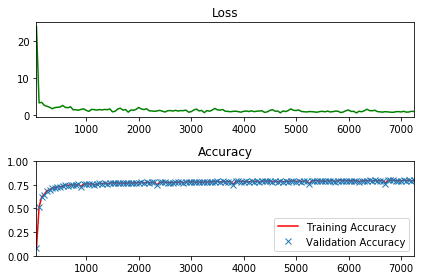

Validation accuracy at 0.7983999848365784


In [45]:
# TODO: Find the best parameters for each configuration
epochs = 5
batch_size = 100
learning_rate = 0.2


### DON'T MODIFY ANYTHING BELOW ###
# Gradient Descent
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(loss)    

# The accuracy measured against the validation set
validation_accuracy = 0.0

# Measurements use for graphing loss and accuracy
log_batch_step = 50
batches = []
loss_batch = []
train_acc_batch = []
valid_acc_batch = []

with tf.Session() as session:
    session.run(init)
    batch_count = int(math.ceil(len(train_features)/batch_size))

    for epoch_i in range(epochs):
        
        # Progress bar
        batches_pbar = tqdm(range(batch_count), desc='Epoch {:>2}/{}'.format(epoch_i+1, epochs), unit='batches')
        
        # The training cycle
        for batch_i in batches_pbar:
            # Get a batch of training features and labels
            batch_start = batch_i*batch_size
            batch_features = train_features[batch_start:batch_start + batch_size]
            batch_labels = train_labels[batch_start:batch_start + batch_size]

            # Run optimizer and get loss
            _, l = session.run(
                [optimizer, loss],
                feed_dict={features: batch_features, labels: batch_labels})

            # Log every 50 batches
            if not batch_i % log_batch_step:
                # Calculate Training and Validation accuracy
                training_accuracy = session.run(accuracy, feed_dict=train_feed_dict)
                validation_accuracy = session.run(accuracy, feed_dict=valid_feed_dict)

                # Log batches
                previous_batch = batches[-1] if batches else 0
                batches.append(log_batch_step + previous_batch)
                loss_batch.append(l)
                train_acc_batch.append(training_accuracy)
                valid_acc_batch.append(validation_accuracy)

        # Check accuracy against Validation data
        validation_accuracy = session.run(accuracy, feed_dict=valid_feed_dict)

loss_plot = plt.subplot(211)
loss_plot.set_title('Loss')
loss_plot.plot(batches, loss_batch, 'g')
loss_plot.set_xlim([batches[0], batches[-1]])
acc_plot = plt.subplot(212)
acc_plot.set_title('Accuracy')
acc_plot.plot(batches, train_acc_batch, 'r', label='Training Accuracy')
acc_plot.plot(batches, valid_acc_batch, 'x', label='Validation Accuracy')
acc_plot.set_ylim([0, 1.0])
acc_plot.set_xlim([batches[0], batches[-1]])
acc_plot.legend(loc=4)
plt.tight_layout()
plt.show()

print('Validation accuracy at {}'.format(validation_accuracy))

## Test
Set the epochs, batch_size, and learning_rate with the best learning parameters you discovered in problem 3.  You're going to test your model against your hold out dataset/testing data.  This will give you a good indicator of how well the model will do in the real world.  You should have a test accuracy of at least 80%.

In [46]:
# TODO: Set the epochs, batch_size, and learning_rate with the best parameters from problem 3
epochs = 4
batch_size = 50
learning_rate = 0.5



### DON'T MODIFY ANYTHING BELOW ###
# The accuracy measured against the test set
test_accuracy = 0.0

with tf.Session() as session:
    
    session.run(init)
    batch_count = int(math.ceil(len(train_features)/batch_size))

    for epoch_i in range(epochs):
        
        # Progress bar
        batches_pbar = tqdm(range(batch_count), desc='Epoch {:>2}/{}'.format(epoch_i+1, epochs), unit='batches')
        
        # The training cycle
        for batch_i in batches_pbar:
            # Get a batch of training features and labels
            batch_start = batch_i*batch_size
            batch_features = train_features[batch_start:batch_start + batch_size]
            batch_labels = train_labels[batch_start:batch_start + batch_size]

            # Run optimizer
            _ = session.run(optimizer, feed_dict={features: batch_features, labels: batch_labels})

        # Check accuracy against Test data
        test_accuracy = session.run(accuracy, feed_dict=test_feed_dict)


assert test_accuracy >= 0.80, 'Test accuracy at {}, should be equal to or greater than 0.80'.format(test_accuracy)
print('Nice Job! Test Accuracy is {}'.format(test_accuracy))

Epoch  4/4: 100%|██████████| 2850/2850 [00:02<00:00, 1382.82batches/s]

Nice Job! Test Accuracy is 0.871399998664856


# Multiple layers
Good job!  You built a one layer TensorFlow network!  However, you want to build more than one layer.  This is deep learning after all!  In the next section, you will start to satisfy your need for more layers.